In [1]:
# pip install stargazer
import requests
import json
import re
from html import unescape
import numpy as np
import pandas as pd
import time
import folium
from folium.plugins import HeatMap
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from scipy.stats import chi2_contingency
import pingouin as pg
import ast
from scipy.stats import pearsonr, spearmanr, kendalltau
import itertools
from itertools import combinations
from scipy.stats import pointbiserialr
from sklearn.preprocessing import MultiLabelBinarizer
from tqdm import tqdm
from kmodes.kmodes import KModes
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV, train_test_split, KFold, cross_val_score, validation_curve
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, make_scorer
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_breuschpagan
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree
import shap
from sklearn.ensemble import RandomForestRegressor
from stargazer.stargazer import Stargazer
from IPython.display import HTML
from sklearn.ensemble import (
    RandomForestClassifier, 
    GradientBoostingClassifier,
    GradientBoostingRegressor,
    AdaBoostClassifier,
    AdaBoostRegressor
)
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

In [2]:
dfs_files = [
    "vacancies_0_10000.xlsx",
    "vacancies_10000_20000.xlsx",
    "vacancies_20000_30000.xlsx",
    "vacancies_30000_40000.xlsx",
    "vacancies_40000_50000.xlsx",
    "vacancies_50000_60000.xlsx",
    "vacancies_60000_70000.xlsx",
    "vacancies_70000_75884.xlsx"
]

df_all = pd.concat([pd.read_excel(f) for f in dfs_files], ignore_index=True)

In [3]:
columns = ['id',
'employer_id',
'salary_from',
'salary_to',
'salary_gross',
'salary_range_mode_name', 
'salary_currency',
'address_city',
'address_street',
'allow_messages',
'experience_name',
'billing_type_id',
'schedule_name',
'employment_name',
'department_name',
'show_contacts',
'description',
'key_skills',
'auto_response_accept_auto_response',
'accept_handicapped',
'accept_kids',
'archived',
'professional_roles',
'driver_license_types',
'accept_incomplete_resumes',
'employer_name',
'employer_accredited_it_employer',
'published_at',
'created_at',
'has_test',
'working_days',
'working_time_intervals',
'working_time_modes',
'accept_temporary',
'languages',
'employment_form_name',
'fly_in_fly_out_duration',
'internship',
'night_shifts',
'work_format',
'work_schedule_by_days',
'working_hours',
'show_logo_in_search',
'salary_range_frequency_name',
'address_metro_station_name',
'address_metro_line_name',
'address_lat',
'address_lng',
'test_required',
'age_restriction_name']

In [4]:
russian_vacancies = df_all[
    (df_all['employer_country_id'] == 1) &
    (df_all['salary_currency'] == 'RUR') &
    (df_all['salary_range_mode_name'] == 'За\xa0месяц') 
][columns]

In [5]:
df_processed = russian_vacancies.copy()

columns_to_process = [
    'key_skills',
    'professional_roles',
    'work_format',
    'work_schedule_by_days',
    'working_hours',
    'working_days',
    'working_time_intervals',
    'working_time_modes',
    'languages',
    'fly_in_fly_out_duration'
]

def extract_names(cell):
    
    if not cell:
        return np.nan
    try:
        data = json.loads(cell)
    except (TypeError, json.JSONDecodeError):
        return np.nan
    if not isinstance(data, list):
        return np.nan

    names = []
    for item in data:
        if isinstance(item, dict) and 'name' in item:
            name_clean = str(item['name']).replace('\xa0', ' ').strip()
            if name_clean:
                names.append(name_clean)
    return sorted(names) if names else np.nan

def extract_ids(cell):
    if not cell:
        return np.nan
    try:
        data = json.loads(cell)
    except (TypeError, json.JSONDecodeError):
        return np.nan
    if not isinstance(data, list):
        return np.nan

    ids = []
    for item in data:
        if isinstance(item, dict) and 'id' in item:
            id_clean = str(item['id']).strip()
            if id_clean:
                ids.append(id_clean)
    return sorted(ids) if ids else np.nan

for col in columns_to_process:
    if col in df_processed.columns:
        df_processed[f"{col}_processed"] = df_processed[col].apply(extract_names)

if 'driver_license_types' in df_processed.columns:
    df_processed['driver_license_types_processed'] = df_processed['driver_license_types'].apply(extract_ids)

df_processed.drop(columns=columns_to_process + ['driver_license_types'], inplace=True)

In [6]:
def clean_text(text):
    if not text:
        return np.nan
    text = unescape(text)
    text = re.sub(r'<.*?>', ' ', text)
    text = text.replace('\xa0', ' ')
    text = re.sub(r'\s+', ' ', text)
    return text.strip() if text.strip() else np.nan

df_processed['description_clean'] = df_processed['description'].apply(clean_text)

In [7]:
df_processed['salary_mean'] = df_processed[['salary_from', 'salary_to']].mean(axis=1)
df_processed['num_skills'] = df_processed['key_skills_processed'].apply(
    lambda x: len(x) if isinstance(x, list) else 0
)
df_processed['description_length'] = df_processed['description_clean'].astype(str).apply(len)

In [8]:
df_processed['professional_roles_short_str'] = df_processed['professional_roles_processed'].apply(
    lambda roles: ', '.join([re.split(r'[,]', r)[0] for r in roles]) if isinstance(roles, list) else np.nan
)

In [9]:
df_processed = df_processed.drop(columns = ['salary_range_mode_name', 'description', 'salary_from', 'salary_to', 'salary_currency', 'published_at', 'created_at', 'employment_form_name', 'working_days_processed', 'working_time_intervals_processed'], axis=1)

In [10]:
summary = []

for col in df_processed.columns:
    total = len(df_processed)
    na_percent = df_processed[col].isna().mean() * 100

    if df_processed[col].dtype == 'object' or df_processed[col].dtype == 'bool':
        most_freq_ratio = df_processed[col].value_counts(normalize=True, dropna=True).max() * 100
    else:
        most_freq_ratio = None

    summary.append({
        'Признак': col,
        '% пустых': na_percent,
        'Доля популярного значения (%)': most_freq_ratio
    })

summary_df = pd.DataFrame(summary).sort_values('% пустых', ascending=False)
display(summary_df)

,Признак,% пустых,Доля популярного значения (%)
29,test_required,99.353741,NaN
30,age_restriction_name,99.044362,74.100719
36,working_time_modes_processed,97.959815,100.000000
39,driver_license_types_processed,97.409807,54.744526
38,fly_in_fly_out_duration_processed,97.265430,25.392835
37,languages_processed,97.263712,77.638191
10,department_name,93.606160,54.650538
23,show_logo_in_search,82.611162,NaN
26,address_metro_line_name,74.201200,7.641572
25,address_metro_station_name,74.201200,2.251832


### География вакансий

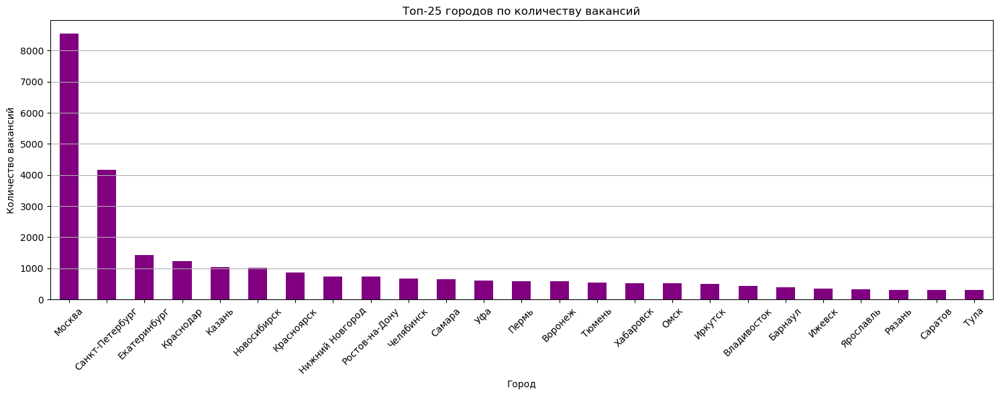

In [11]:
city_counts = df_processed['address_city'].value_counts()

top_cities = city_counts.head(25)

plt.figure(figsize=(15, 6))
top_cities.plot(kind='bar', color='purple')
plt.title('Топ-25 городов по количеству вакансий')
plt.xlabel('Город')
plt.ylabel('Количество вакансий')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

In [12]:
df_coords = df_processed[['address_lat', 'address_lng']].dropna()

m = folium.Map(location=[55.75, 37.62], zoom_start=10)

heat_data = df_coords[['address_lat', 'address_lng']].values.tolist()

HeatMap(heat_data, radius=10).add_to(m)

m

In [13]:
moscow_metro = (
    df_processed[df_processed['address_city'] == 'Москва']
    .groupby('address_metro_line_name')
    .agg({'id': 'count'})
    .rename(columns={'id': 'Количество вакансий'})
    .sort_values(by='Количество вакансий', ascending=False)
)

p = moscow_metro['Количество вакансий'] / moscow_metro['Количество вакансий'].sum()

entropy_bits = -(p * np.log2(p)).sum()
print("Энтропия в битах:", round(entropy_bits, 3))

moscow_metro['Кумулятивный процент'] = (p.cumsum() * 100).round(2)

moscow_metro = moscow_metro.reset_index().rename(columns={'address_metro_line_name': 'Линия московского метро'})

moscow_metro

Энтропия в битах: 3.949


,Линия московского метро,Количество вакансий,Кумулятивный процент
0,Замоскворецкая,917,12.65
1,Сокольническая,752,23.03
2,Арбатско-Покровская,722,32.99
3,Таганско-Краснопресненская,691,42.52
4,Калужско-Рижская,661,51.64
5,Серпуховско-Тимирязевская,477,58.22
6,МЦК,477,64.80
7,Большая кольцевая линия,460,71.15
8,Люблинско-Дмитровская,460,77.50
9,Кольцевая,300,81.64


In [14]:
np.log2(len(moscow_metro))

np.float64(4.392317422778761)

In [15]:
moscow_stations = (
    df_processed[df_processed['address_city'] == 'Москва']
    .groupby('address_metro_station_name')
    .agg({'id': 'count'})
    .rename(columns={'id': 'Количество вакансий'})
    .sort_values(by='Количество вакансий', ascending=False)
)

p = moscow_stations['Количество вакансий'] / moscow_stations['Количество вакансий'].sum()

entropy_bits = -(p * np.log2(p)).sum()
print("Энтропия в битах:", round(entropy_bits, 3))

moscow_stations['Кумулятивный процент'] = (p.cumsum() * 100).round(2)

moscow_stations = moscow_stations.reset_index().rename(columns={'address_metro_station_name': 'Станция московского метро'})

moscow_stations.head(20)

Энтропия в битах: 7.344


,Станция московского метро,Количество вакансий,Кумулятивный процент
0,Библиотека им.Ленина,290,4.00
1,Деловой центр,245,7.38
2,Белорусская,197,10.10
3,Автозаводская,130,11.89
4,Китай-город,128,13.66
5,Добрынинская,120,15.31
6,Баррикадная,116,16.92
7,Бауманская,99,18.28
8,Курская,95,19.59
9,Киевская,92,20.86


In [16]:
np.log2(len(moscow_stations))

np.float64(8.179909090014934)

In [17]:
7.344/8.179

0.8979092798630639

In [18]:
moscow_vacancies_net = df_processed[
    (df_processed['address_city'] == 'Москва') &
    (df_processed['salary_gross'] == 0)
]

metro_median = moscow_vacancies_net.groupby('address_metro_line_name')['salary_mean'] \
                                  .median().sort_values(ascending=False)

pivot_metro_net = moscow_vacancies_net.pivot_table(
    index='employment_name',
    columns='address_metro_line_name',
    values='salary_mean',
    aggfunc='median',
    fill_value=0,
    margins=True,
    margins_name='Итого'
)

pivot_metro_net.T.sort_values('Итого', ascending=False)

employment_name,Полная занятость,Проектная работа,Частичная занятость,Итого
address_metro_line_name,,,,
Сокольническая,120000.0,140000.0,95000.0,120000.0
МЦД-4,120000.0,0.0,63750.0,120000.0
Замоскворецкая,120000.0,120000.0,85000.0,115000.0
Таганско-Краснопресненская,120000.0,62500.0,96250.0,115000.0
Филевская,115000.0,10000.0,91000.0,114500.0
МЦК,115000.0,80000.0,80000.0,112500.0
МЦД-3,110000.0,0.0,90500.0,110000.0
МЦД-2,110000.0,50000.0,100000.0,110000.0
Большая кольцевая линия,115000.0,93750.0,90000.0,110000.0


### Уровни валовой и чистой заработной платы

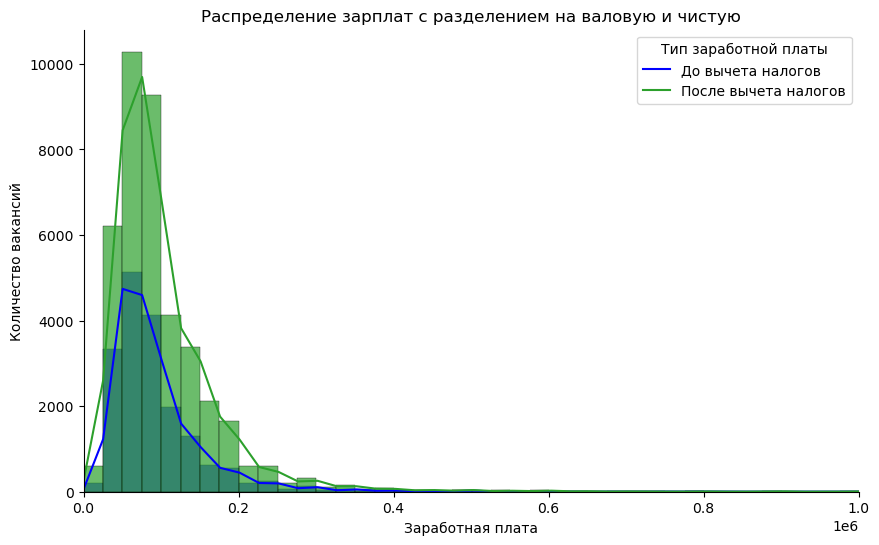

In [19]:
plt.figure(figsize=(10,6))

sns.histplot(
    data=df_processed,
    x='salary_mean',
    hue='salary_gross',
    bins=200,
    kde=True,
    palette={0.0:'#2CA02C', 1.0:'blue'},  
    alpha=0.7,
)

plt.xlabel('Заработная плата')
plt.ylabel('Количество вакансий')
plt.title('Распределение зарплат с разделением на валовую и чистую')
plt.legend(title='Тип заработной платы', labels=['До вычета налогов', 'После вычета налогов'])
plt.xlim(0, 1000000)
sns.despine()
plt.show()

In [20]:
salaries_net = df_processed.loc[df_processed['salary_gross'] == 0, 'salary_mean']
stat, p = stats.kstest(
    salaries_net.dropna(), 
    'norm',
    args=(salaries_net.mean(), salaries_net.std())
)

print(round(stat,3), round(p,3))

if p > 0.05:
    print("Распределение заработных плат не отличается от нормального (не отвергаем H0)")
else:
    print("Распределение заработных плат отличается от нормального (отвергаем H0)")

0.229 0.0
Распределение заработных плат отличается от нормального (отвергаем H0)


In [21]:
stat, p = stats.shapiro(salaries_net.dropna())

print(round(stat, 3), round(p, 3))

if p > 0.05:
    print("Распределение заработных плат не отличается от нормального (не отвергаем H0)")
else:
    print("Распределение заработных плат отличается от нормального (отвергаем H0)")

0.384 0.0
Распределение заработных плат отличается от нормального (отвергаем H0)


/opt/anaconda3/lib/python3.13/site-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 40034.
  res = hypotest_fun_out(*samples, **kwds)


In [22]:
salaries = df_processed.loc[:, 'salary_mean']

stat, p = stats.kstest(
    salaries.dropna(), 
    'norm',
    args=(salaries.mean(), salaries.std())
)

print(round(stat,3), round(p,3))

if p > 0.05:
    print("Распределение заработных плат не отличается от нормального (не отвергаем H0)")
else:
    print("Распределение заработных плат отличается от нормального (отвергаем H0)")

0.219 0.0
Распределение заработных плат отличается от нормального (отвергаем H0)


In [23]:
stat, p = stats.shapiro(salaries.dropna())

print(round(stat, 3), round(p, 3))

if p > 0.05:
    print("Распределение заработных плат не отличается от нормального (не отвергаем H0)")
else:
    print("Распределение заработных плат отличается от нормального (отвергаем H0)")

0.416 0.0
Распределение заработных плат отличается от нормального (отвергаем H0)


/opt/anaconda3/lib/python3.13/site-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 58181.
  res = hypotest_fun_out(*samples, **kwds)


In [24]:
salaries_net.describe()['mean']

np.float64(104681.19961782485)

In [25]:
salaries_net.describe()['50%']

np.float64(84000.0)

In [26]:
salaries_net.describe()['std']

np.float64(109916.8773149816)

In [27]:
skewness = stats.skew(salaries_net)
print(f"Асимметрия (skewness): {skewness:.4f}")
kurtosis = stats.kurtosis(salaries_net)
print(f"Эксцесс (kurtosis): {kurtosis:.4f}")

Асимметрия (skewness): 19.9444
Эксцесс (kurtosis): 674.5977


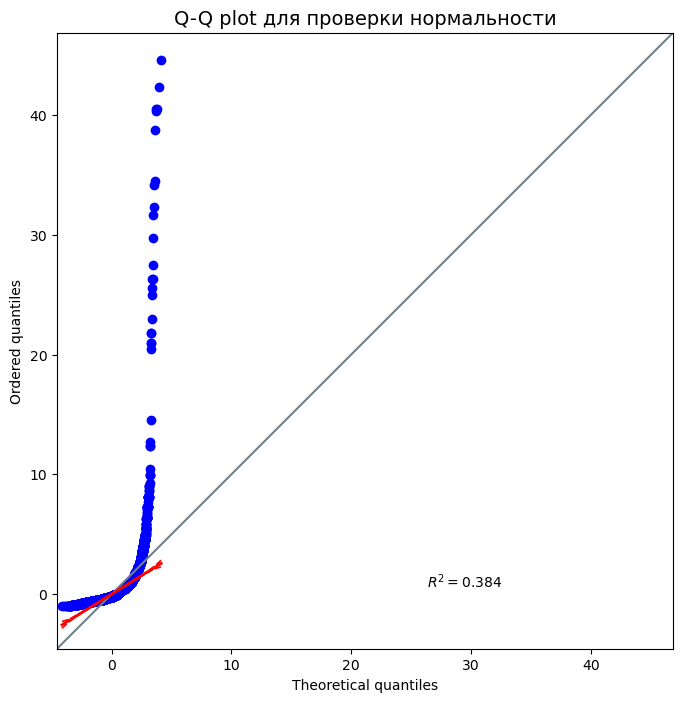

In [28]:
plt.figure(figsize=(10, 8))  
pg.qqplot(salaries_net, dist='norm')
plt.title("Q-Q plot для проверки нормальности", fontsize=14)
plt.show()

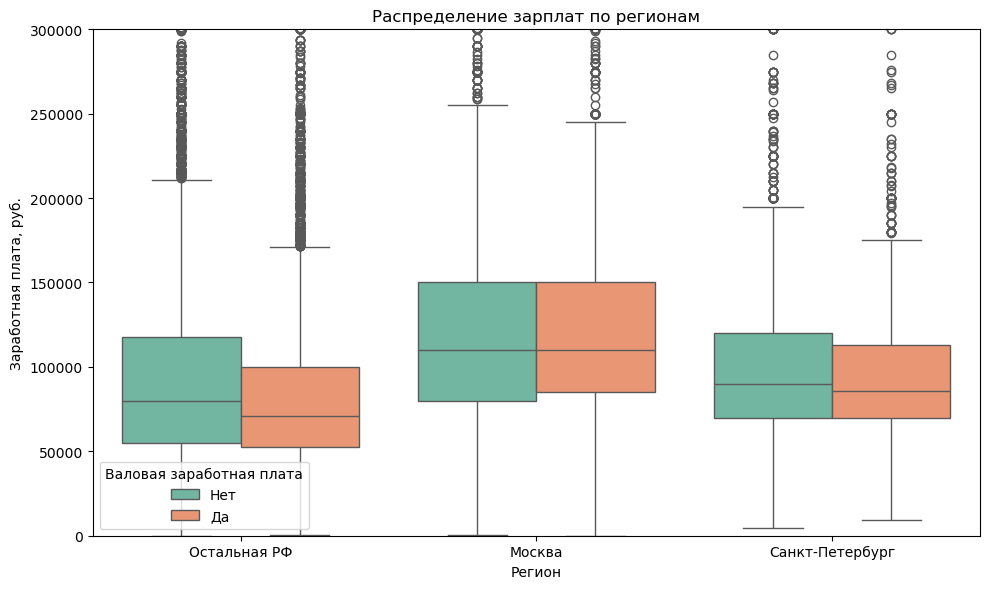

In [29]:
def region_group(city):
    if city == 'Москва':
        return 'Москва'
    elif city == 'Санкт-Петербург':
        return 'Санкт-Петербург'
    else:
        return 'Остальная РФ'

df_processed['region_group'] = df_processed['address_city'].apply(region_group)
salary_plot = df_processed.copy()

salary_plot['gross_label'] = salary_plot['salary_gross'].map({0: 'Нет', 1: 'Да'})
plt.figure(figsize=(10,6))
sns.boxplot(
    data=salary_plot,
    x='region_group',
    y='salary_mean',
    hue='gross_label', 
    palette='Set2',
    hue_order=['Нет', 'Да'] 
)

plt.ylabel('Заработная плата, руб.')
plt.xlabel('Регион')
plt.title('Распределение зарплат по регионам')
plt.ylim(0, 300000)
plt.legend(title='Валовая заработная плата')
plt.tight_layout()
plt.show()

In [30]:
grouped = df_processed.groupby(['region_group', 'salary_gross'])['salary_mean']

quantiles = grouped.quantile([0.25, 0.5, 0.75, 0.9]).unstack(level=1)


quantiles

salary_gross               0.0       1.0
region_group                            
Москва          0.25   80000.0   85000.0
                0.50  110000.0  110000.0
                0.75  150000.0  150000.0
                0.90  215000.0  225000.0
Остальная РФ    0.25   55050.0   52500.0
                0.50   80000.0   70797.5
                0.75  117500.0  100000.0
                0.90  165000.0  150000.0
Санкт-Петербург 0.25   70000.0   70000.0
                0.50   90000.0   85700.0
                0.75  120000.0  113000.0
                0.90  160000.0  150000.0

/var/folders/yw/j_hz9v6107z3z2yhw4flcx6c0000gn/T/ipykernel_32430/193136634.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


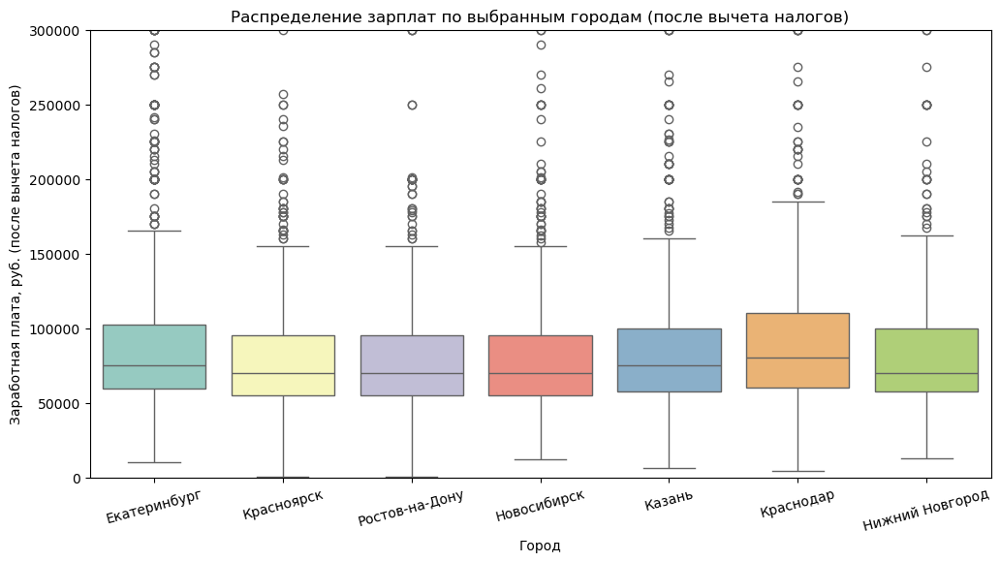

In [31]:
cities = [
    'Екатеринбург', 'Краснодар', 'Казань', 'Новосибирск', 'Красноярск', 'Нижний Новгород', 'Ростов-на-Дону'
]

salary_plot_cities = df_processed[
    (df_processed['address_city'].isin(cities)) &
    (df_processed['salary_gross'] == 0)
]

plt.figure(figsize=(12,6))
sns.boxplot(
    data=salary_plot_cities,
    x='address_city',
    y='salary_mean',
    palette='Set3'
)

plt.ylabel('Заработная плата, руб. (после вычета налогов)')
plt.xlabel('Город')
plt.title('Распределение зарплат по выбранным городам (после вычета налогов)')
plt.xticks(rotation=15)
plt.ylim(0, 300000)
plt.show()

In [32]:
salary_plot_cities_net = df_processed[
    (df_processed['address_city'].isin(cities)) &
    (df_processed['salary_gross'] == 0)
]

grouped = salary_plot_cities_net.groupby('address_city')['salary_mean']

quantiles = grouped.quantile([0.25, 0.5, 0.75, 0.9]).unstack(level=1)
quantiles.columns = ['25%', '50% (медиана)', '75%', '90%']

quantiles

,25%,50% (медиана),75%,90%
address_city,,,,
Екатеринбург,59125.0,75000.0,102500.0,150000.0
Казань,57500.0,75000.0,100000.0,150000.0
Краснодар,60000.0,80000.0,110000.0,150000.0
Красноярск,55000.0,70000.0,95000.0,130000.0
Нижний Новгород,57500.0,70000.0,100000.0,132200.0
Новосибирск,55000.0,70000.0,95000.0,132405.8
Ростов-на-Дону,55000.0,70000.0,95000.0,130000.0


### Тип занятости, график, часы работы

In [33]:
quantiles_employment = df_processed.groupby('employment_name')['salary_mean'] \
    .quantile([0.25, 0.5, 0.75, 0.9]) \
    .unstack(level=1) \
    .round(0)

quantiles_employment.columns = ['25%', 'Медиана', '75%', '90%']
quantiles_employment = quantiles_employment.sort_values('Медиана', ascending=False)

display(quantiles_employment)

,25%,Медиана,75%,90%
employment_name,,,,
Полная занятость,60000.0,82500.0,120000.0,170244.0
Проектная работа,46162.0,60000.0,120000.0,177750.0
Частичная занятость,40000.0,60000.0,105250.0,177500.0


In [34]:
pivot_count = df_processed.pivot_table(
    index='employment_name',
    columns='schedule_name',
    values='id',          
    aggfunc='nunique',
    fill_value=0,
    margins=True,           
    margins_name='Итого'    
)

pivot_count

schedule_name,Вахтовый метод,Гибкий график,Полный день,Сменный график,Удаленная работа,Итого
employment_name,,,,,,
Полная занятость,1591,4562,35526,8561,3672,53912
Проектная работа,0,75,210,14,51,350
Частичная занятость,0,1206,1763,211,739,3919
Итого,1591,5843,37499,8786,4462,58181


In [35]:
pivot_percent = pivot_count / pivot_count.loc['Итого','Итого'] * 100
pivot_percent = pivot_percent.round(2)
pivot_percent

schedule_name,Вахтовый метод,Гибкий график,Полный день,Сменный график,Удаленная работа,Итого
employment_name,,,,,,
Полная занятость,2.73,7.84,61.06,14.71,6.31,92.66
Проектная работа,0.00,0.13,0.36,0.02,0.09,0.60
Частичная занятость,0.00,2.07,3.03,0.36,1.27,6.74
Итого,2.73,10.04,64.45,15.10,7.67,100.00


In [36]:
df_work = df_processed[['id', 'employment_name', 'work_format_processed']].copy()

df_work['work_format_processed'] = df_work['work_format_processed'].apply(
    lambda x: x if isinstance(x, list) and len(x) > 0 else ['Не указано']
)

df_work_exploded = df_work.explode('work_format_processed')

pivot_count_num = df_work_exploded.pivot_table(
    index='employment_name',
    columns='work_format_processed',
    values='id',
    aggfunc='nunique',
    fill_value=0,
    margins=True,
    margins_name='Итого'
)

total_vacancies = df_work['id'].nunique()
pivot_percent = pivot_count_num / total_vacancies * 100
pivot_percent = pivot_percent.round(2)

pivot_percent

work_format_processed,Гибрид,На месте работодателя,Не указано,Разъездной,Удалённо,Итого
employment_name,,,,,,
Полная занятость,4.09,61.45,21.59,5.93,6.31,92.66
Проектная работа,0.04,0.31,0.06,0.17,0.09,0.60
Частичная занятость,0.57,3.61,0.85,1.23,1.27,6.74
Итого,4.69,65.37,22.50,7.33,7.67,100.00


In [37]:
df_exploded = df_processed.explode('work_format_processed')

df_net = df_exploded[df_exploded['salary_gross'] == 0]

pivot_net = df_net.pivot_table(
    index='employment_name',
    columns='work_format_processed',
    values='salary_mean',
    aggfunc='median'
)

pivot_net

work_format_processed,Гибрид,На месте работодателя,Разъездной,Удалённо
employment_name,,,,
Полная занятость,110000.0,80000.0,110000.0,95000.0
Проектная работа,97500.0,65000.0,50333.0,80000.0
Частичная занятость,59750.0,58625.0,164368.0,52500.0


In [38]:
observed = pivot_count_num.drop('Итого', axis=0).drop('Итого', axis=1)

chi2, p, dof, expected = chi2_contingency(observed)

print(f"Chi2 = {chi2:.2f}")
print(f"p-value = {p:.4f}")
print(f"Degrees of freedom = {dof}")
print("Теоретические частоты:")
pd.DataFrame(expected, index=observed.index, columns=observed.columns)

Chi2 = 1980.64
p-value = 0.0000
Degrees of freedom = 8
Теоретические частоты:


work_format_processed,Гибрид,На месте работодателя,Не указано,Разъездной,Удалённо
employment_name,,,,,
Полная занятость,2523.014413,35138.357089,12094.024784,3937.417587,4122.186127
Проектная работа,16.626628,231.561257,79.699446,25.947524,27.165146
Частичная занятость,191.358959,2665.081654,917.275771,298.634889,312.648727


In [39]:
observed

work_format_processed,Гибрид,На месте работодателя,Не указано,Разъездной,Удалённо
employment_name,,,,,
Полная занятость,2379,35754,12561,3449,3672
Проектная работа,21,178,34,97,51
Частичная занятость,331,2103,496,716,739


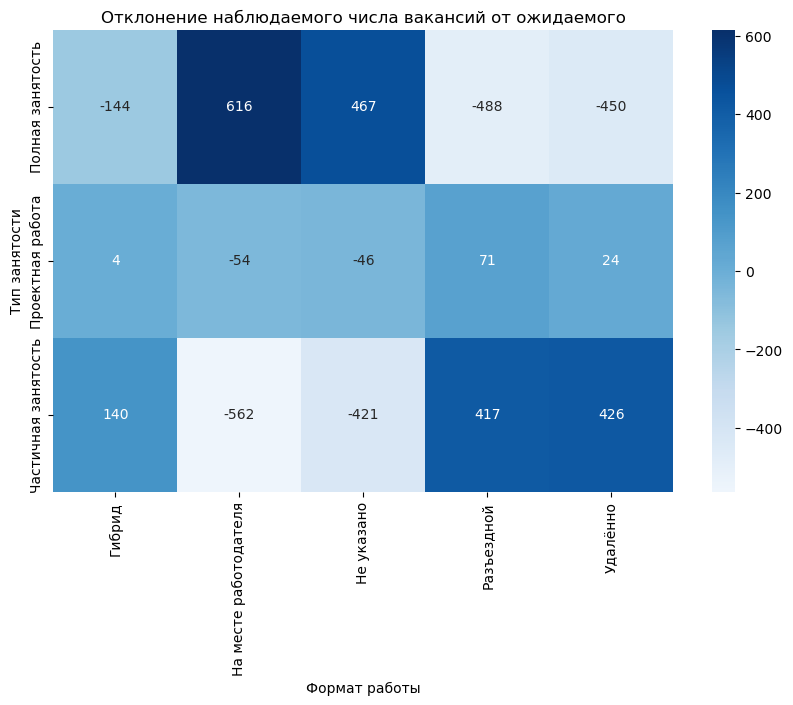

In [40]:
diff = observed - expected 

plt.figure(figsize=(10,6))
sns.heatmap(diff, annot=True, fmt=".0f", cmap='Blues', center=0)
plt.title("Отклонение наблюдаемого числа вакансий от ожидаемого")
plt.ylabel("Тип занятости")
plt.xlabel("Формат работы")
plt.show()

In [41]:
df_exploded = df_processed.explode('working_hours_processed')

hours_order = [
    '2 часа','3 часа','4 часа','5 часов','6 часов','7 часов',
    '8 часов','9 часов','10 часов','11 часов','12 часов',
    '24 часа','Другое','По договорённости','Не указано'
]

df_exploded['working_hours_processed'] = pd.Categorical(
    df_exploded['working_hours_processed'].fillna('Не указано'),  
    categories=hours_order,
    ordered=True
)

pivot_count_num = df_exploded.pivot_table(
    index='employment_name',
    columns='working_hours_processed',
    values='id',
    aggfunc='nunique',       
    fill_value=0,
    margins=True,     
    margins_name='Итого'
)

pivot_percent = (pivot_count_num / pivot_count_num.loc['Итого','Итого'] * 100).round(2)

pivot_percent

/var/folders/yw/j_hz9v6107z3z2yhw4flcx6c0000gn/T/ipykernel_32430/3046960301.py:15: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_count_num = df_exploded.pivot_table(


working_hours_processed,2 часа,3 часа,4 часа,5 часов,6 часов,7 часов,8 часов,9 часов,10 часов,11 часов,12 часов,24 часа,Другое,По договорённости,Не указано,Итого
employment_name,,,,,,,,,,,,,,,,
Полная занятость,0.14,0.20,1.19,0.83,2.57,2.13,54.64,4.55,5.91,5.95,19.97,1.63,6.60,3.29,2.04,92.66
Проектная работа,0.07,0.06,0.11,0.17,0.18,0.17,0.32,0.08,0.09,0.09,0.10,0.01,0.18,0.28,0.00,0.60
Частичная занятость,1.05,1.07,3.03,1.94,2.56,1.15,2.57,1.01,1.16,0.96,1.59,0.52,1.09,2.66,0.00,6.74
Итого,1.25,1.33,4.33,2.94,5.31,3.46,57.54,5.64,7.17,6.99,21.67,2.16,7.86,6.23,2.04,100.00


### Требующиеся навыки

/var/folders/yw/j_hz9v6107z3z2yhw4flcx6c0000gn/T/ipykernel_32430/877245706.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


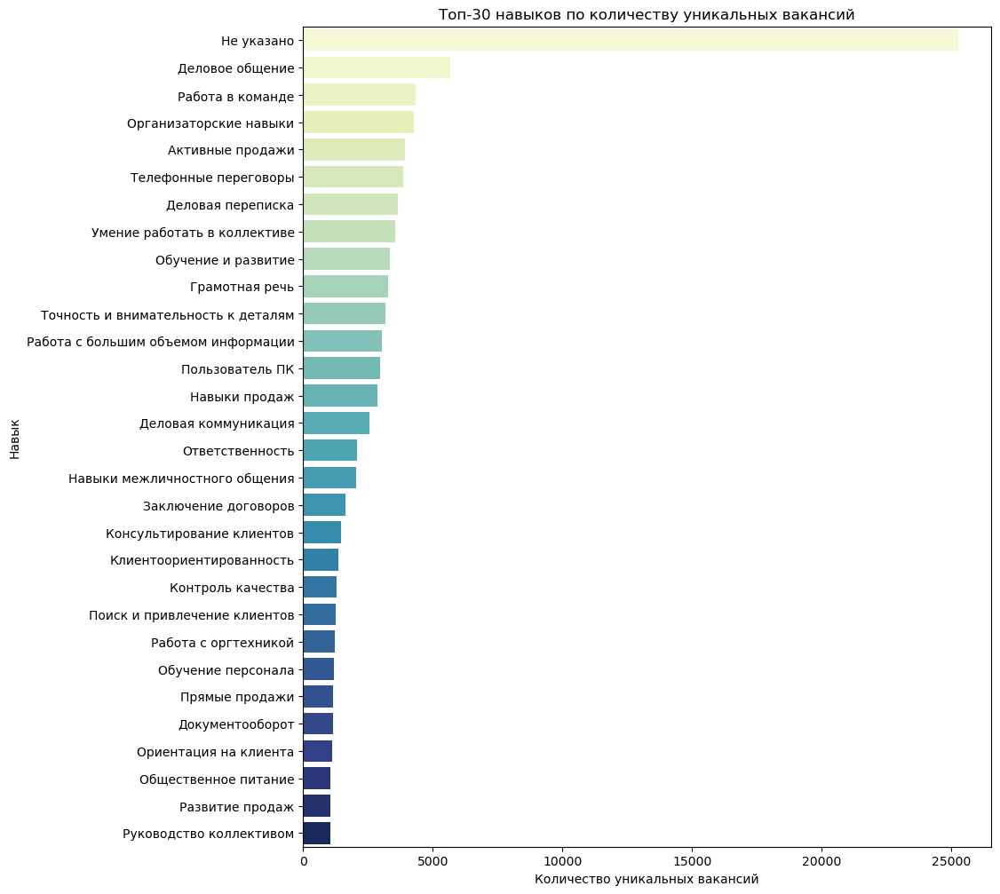

In [42]:
df_skills = df_processed.copy()
df_skills['key_skills_processed'] = df_skills['key_skills_processed'].apply(
    lambda x: x if isinstance(x, list) and len(x) > 0 else ['Не указано']
)
df_skills = df_skills.explode('key_skills_processed')

skills_count = df_skills.groupby('key_skills_processed')['id'].nunique().sort_values(ascending=False)

top_30_skills = skills_count.head(30)

plt.figure(figsize=(10,12))
sns.barplot(
    x=top_30_skills.values,
    y=top_30_skills.index,
    palette="YlGnBu"
)
plt.xlabel('Количество уникальных вакансий')
plt.ylabel('Навык')
plt.title('Топ-30 навыков по количеству уникальных вакансий')
plt.show()

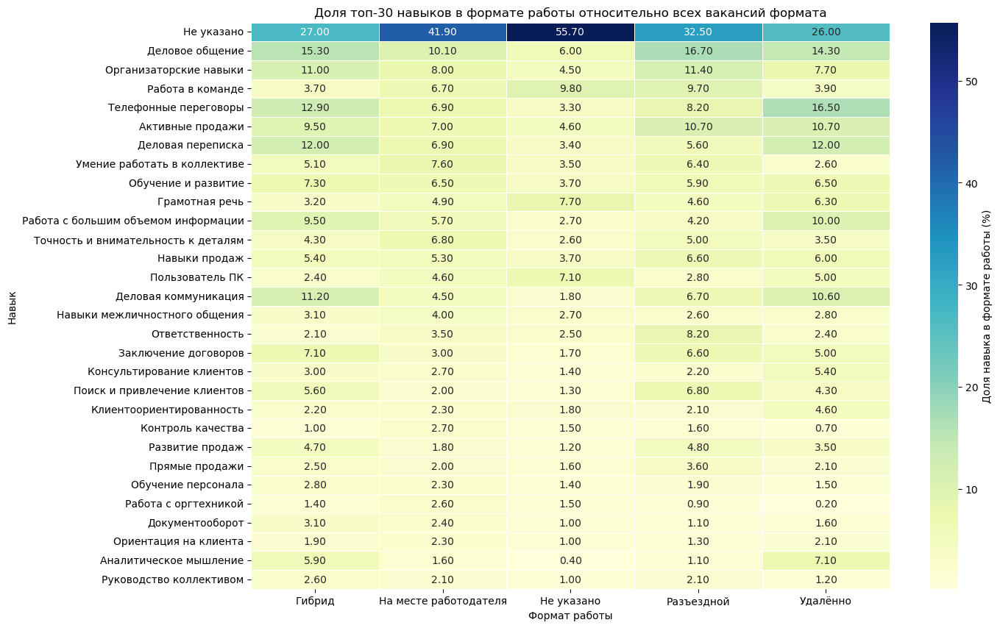

In [43]:
df_skills = df_processed.copy()
df_skills['key_skills_processed'] = df_skills['key_skills_processed'].apply(lambda x: x if isinstance(x, list) and len(x) > 0 else ['Не указано'])
df_skills['work_format_processed'] = df_skills['work_format_processed'].apply(lambda x: x if isinstance(x, list) and len(x) > 0 else ['Не указано'])

df_skills = df_skills.explode('key_skills_processed')
df_skills = df_skills.explode('work_format_processed')

skills_workformat_count = df_skills.pivot_table(
    index='key_skills_processed',
    columns='work_format_processed',
    values='id',
    aggfunc='nunique',  
    fill_value=0
)

top_30_skills = skills_workformat_count.sum(axis=1).sort_values(ascending=False).head(30).index
skills_workformat_count_top30 = skills_workformat_count.loc[top_30_skills]

format_totals = df_skills.groupby('work_format_processed')['id'].nunique()

skills_workformat_percent_total = skills_workformat_count_top30.div(format_totals, axis=1).round(3) * 100

plt.figure(figsize=(14,10))
sns.heatmap(
    skills_workformat_percent_total,
    annot=True,
    fmt=".2f",
    cmap="YlGnBu",
    cbar_kws={'label': 'Доля навыка в формате работы (%)'},
    linewidths=0.5
)
plt.title('Доля топ-30 навыков в формате работы относительно всех вакансий формата')
plt.xlabel('Формат работы')
plt.ylabel('Навык')
plt.yticks(rotation=0)
plt.show()

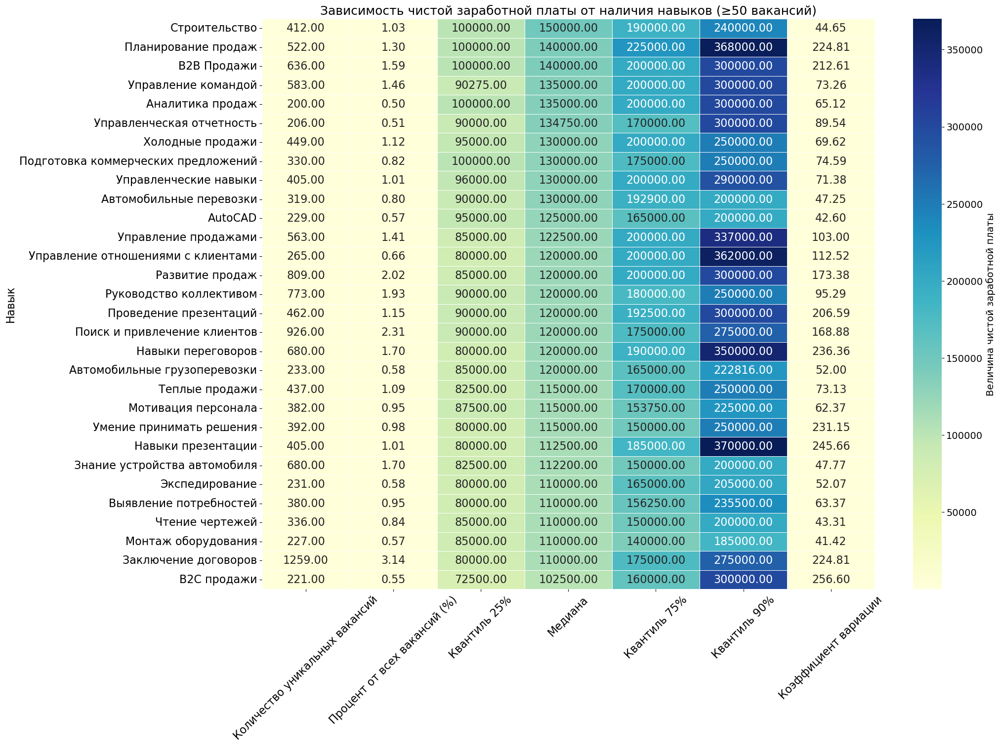

In [44]:
df_net = df_processed[df_processed['salary_gross'] == 0]
df_skills = df_net.explode('key_skills_processed')

df_skills['key_skills_processed'] = df_skills['key_skills_processed'].apply(
    lambda x: x if isinstance(x, str) and x.strip() != '' else 'Не указано'
)

df_skills_unique = df_skills.drop_duplicates(subset=['id', 'key_skills_processed'])

total_vacancies = len(df_net)

skills_counts_unique = df_skills_unique.groupby('key_skills_processed')['id'].count()

skills_percent_unique = (skills_counts_unique / total_vacancies * 100).round(2)

skills_cv = df_skills_unique.groupby('key_skills_processed')['salary_mean'] \
            .agg(lambda x: round(x.std()*100 / x.mean(),2))

skills_quantiles = df_skills_unique.groupby('key_skills_processed')['salary_mean'] \
                    .quantile([0.25, 0.5, 0.75, 0.9]).unstack()

top_skills_unique_net = pd.DataFrame({
    'Количество уникальных вакансий': skills_counts_unique,
    'Процент от всех вакансий (%)': skills_percent_unique,
    'Квантиль 25%': skills_quantiles[0.25],
    'Медиана': skills_quantiles[0.5],
    'Квантиль 75%': skills_quantiles[0.75],
    'Квантиль 90%': skills_quantiles[0.9],
    'Коэффициент вариации': skills_cv
})

min_vacancies = 200
top_skills_filtered = top_skills_unique_net[top_skills_unique_net['Количество уникальных вакансий'] >= min_vacancies]

top_skills_filtered = top_skills_filtered.sort_values('Медиана', ascending=False).head(30)

plt.figure(figsize=(20,15))

ax = sns.heatmap(
    top_skills_filtered,
    annot=True,
    fmt=".2f",
    cmap="YlGnBu",
    annot_kws={"size": 16},
    cbar_kws={'label': 'Величина чистой заработной платы'},
    linewidths=0.5
)

cbar = ax.collections[0].colorbar
cbar.set_label(
    'Величина чистой заработной платы',
    fontsize=14
)

cbar.ax.tick_params(labelsize=14)
plt.title('Зависимость чистой заработной платы от наличия навыков (≥50 вакансий)', fontsize=18)
plt.ylabel('Навык', fontsize=16)
plt.xticks(rotation=45, fontsize=16)
plt.yticks(rotation=0, fontsize=16)

plt.show()

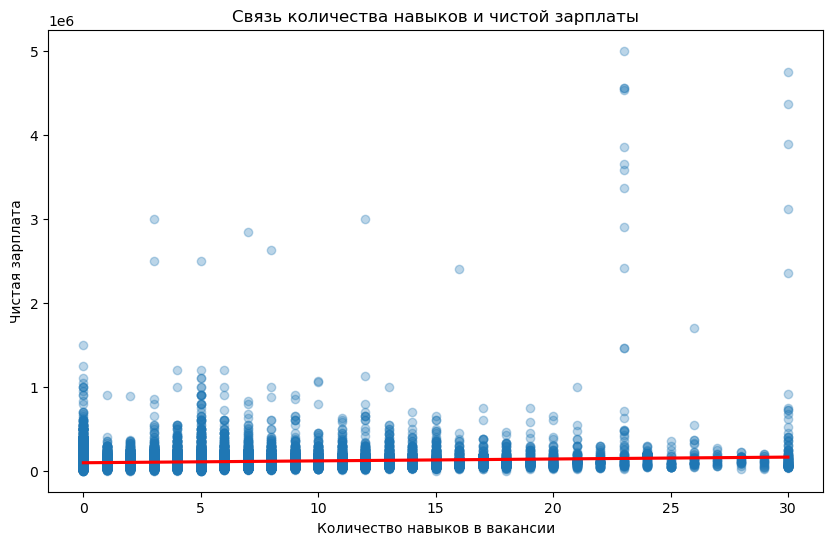

Корреляция Спирмена (чистая ЗП): 0.011, p-value = 0.022
Корреляция Кенделла (чистая ЗП): 0.009, p-value = 0.017


In [45]:
df_plot_net = df_processed[(df_processed['salary_gross'] == 0)]

plt.figure(figsize=(10,6))
sns.regplot(
    data=df_plot_net,
    x='num_skills',
    y='salary_mean',
    scatter_kws={'alpha':0.3},
    line_kws={'color':'red'}
)
plt.xlabel('Количество навыков в вакансии')
plt.ylabel('Чистая зарплата')
plt.title('Связь количества навыков и чистой зарплаты')
plt.show()

spearman_corr, spearman_p = stats.spearmanr(df_plot_net['num_skills'], df_plot_net['salary_mean'])
kendall_corr, kendall_p = stats.kendalltau(df_plot_net['num_skills'], df_plot_net['salary_mean'])

print(f'Корреляция Спирмена (чистая ЗП): {spearman_corr:.3f}, p-value = {spearman_p:.3f}')
print(f'Корреляция Кенделла (чистая ЗП): {kendall_corr:.3f}, p-value = {kendall_p:.3f}')

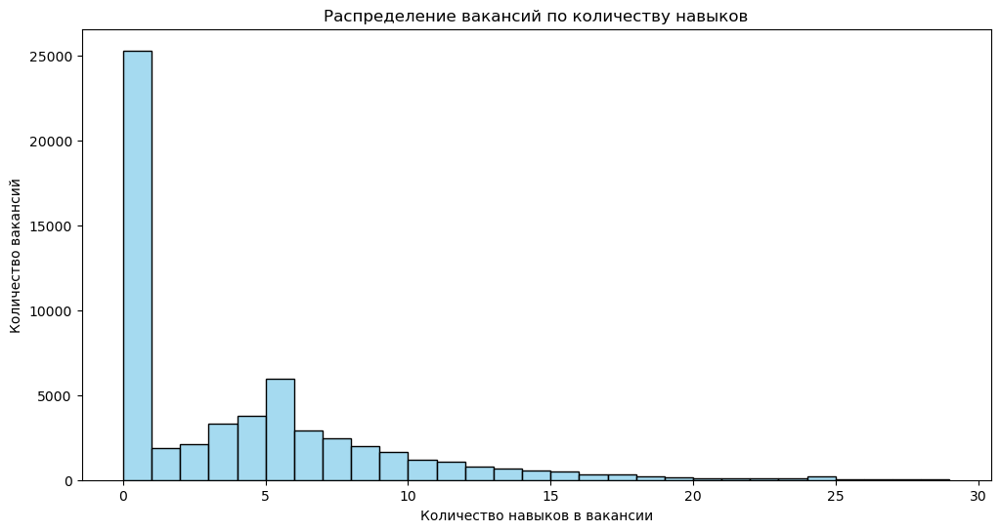

In [46]:
plt.figure(figsize=(12,6))
sns.histplot(
    df_processed['num_skills'],
    bins=range(df_processed['num_skills'].max()),  
    color='skyblue',
    edgecolor='black'
)
plt.xlabel('Количество навыков в вакансии')
plt.ylabel('Количество вакансий')
plt.title('Распределение вакансий по количеству навыков')
plt.show()

<Axes: xlabel='description_length', ylabel='Count'>

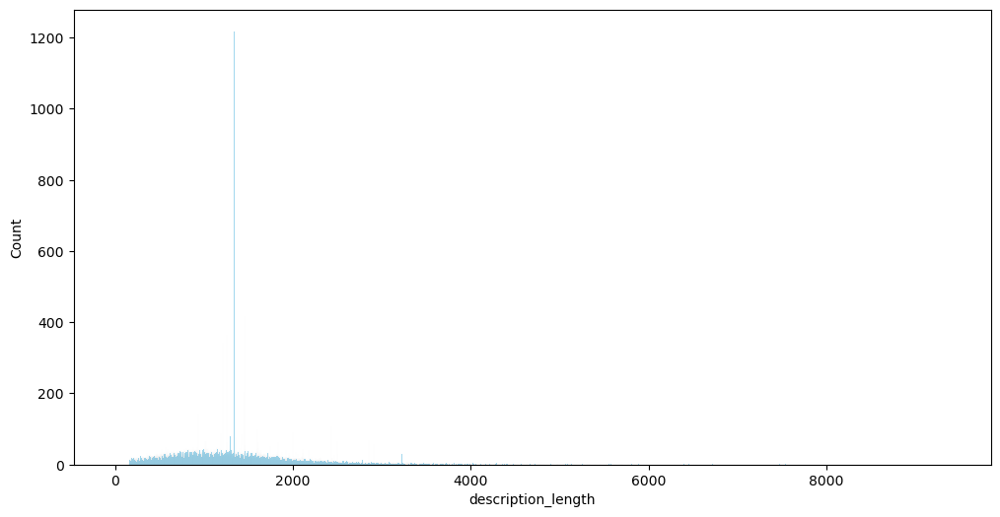

In [47]:
plt.figure(figsize=(12,6))
sns.histplot(
    df_processed['description_length'],
    bins=range(df_processed['description_length'].max()),  
    color='skyblue',
    edgecolor='black'
)

### Описание вакансии

In [48]:
top_descriptions = df_processed.sort_values(
    'description_length', ascending=False
)[['description_clean']].head(10)

longest_description = top_descriptions.iloc[0]['description_clean']

print("Текст:", longest_description)
print("Длина:", len(longest_description))

Текст: Обязанности: Оказание медицинской помощи пациенту в неотложной или экстренной формах — Распознавание состояний, возникающих при внезапных острых заболеваниях, обострении хронических заболеваний без явных признаков угрозы жизни пациента и требующих оказания медицинской помощи в неотложной форме — Оказание медицинской помощи в неотложной форме пациентам при внезапных острых заболеваниях, состояниях, обострении хронических заболеваний без явных признаков угрозы жизни пациента — Распознавание состояний, представляющих угрозу жизни пациента, включая состояния клинической смерти (остановка жизненно важных функций организма человека (кровообращения и/или дыхания), требующих оказания медицинской помощи в экстренной форме — Оказание медицинской помощи в экстренной форме пациентам при состояниях, представляющих угрозу жизни пациента, в том числе клинической смерти (остановка жизненно важных функций организма человека (кровообращения и/или дыхания) — Применение лекарственных препаратов и м

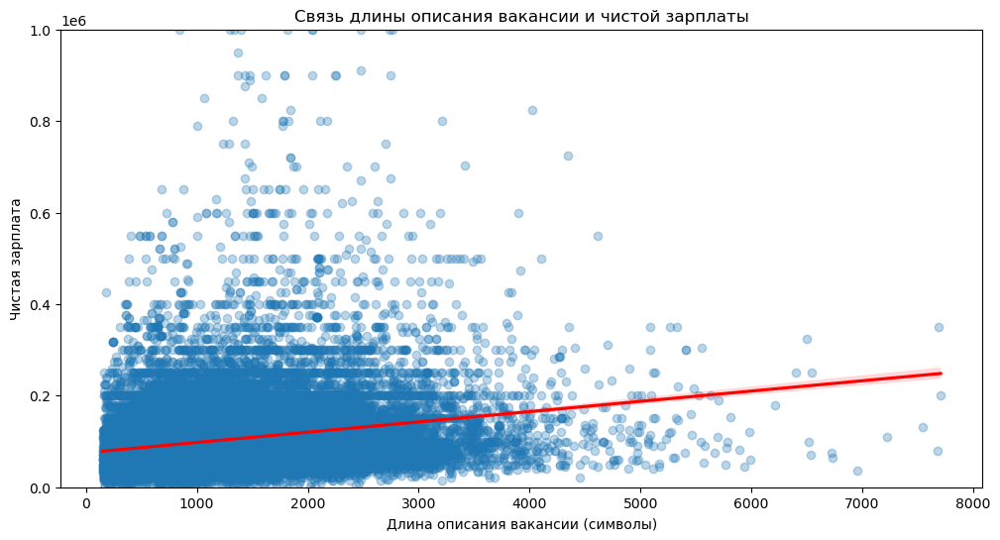

Корреляция Спирмена (чистая ЗП): 0.222, p-value = 0.000
Корреляция Кенделла (чистая ЗП): 0.152, p-value = 0.000


In [49]:
df_processed['description_length'] = df_processed['description_clean'].astype(str).apply(len)

df_plot_net = df_processed[df_processed['salary_gross'] == 0]

plt.figure(figsize=(12,6))
sns.regplot(
    data=df_plot_net,
    x='description_length',
    y='salary_mean',
    scatter_kws={'alpha':0.3},
    line_kws={'color':'red'}
)
plt.xlabel('Длина описания вакансии (символы)')
plt.ylabel('Чистая зарплата')
plt.title('Связь длины описания вакансии и чистой зарплаты')
plt.ylim(0, 1000000)
plt.show()

spearman_corr, spearman_p = stats.spearmanr(df_plot_net['description_length'], df_plot_net['salary_mean'])
kendall_corr, kendall_p = stats.kendalltau(df_plot_net['description_length'], df_plot_net['salary_mean'])

print(f'Корреляция Спирмена (чистая ЗП): {spearman_corr:.3f}, p-value = {spearman_p:.3f}')
print(f'Корреляция Кенделла (чистая ЗП): {kendall_corr:.3f}, p-value = {kendall_p:.3f}')

In [50]:
df_processed

,id,employer_id,salary_gross,address_city,address_street,allow_messages,experience_name,billing_type_id,schedule_name,employment_name,...,working_time_modes_processed,languages_processed,fly_in_fly_out_duration_processed,driver_license_types_processed,description_clean,salary_mean,num_skills,description_length,professional_roles_short_str,region_group
0,128956748,78638.0,1.0,Саратов,улица имени Н.И. Вавилова,False,Нет опыта,standard,Полный день,Полная занятость,...,NaN,NaN,NaN,NaN,Мобильная связь стала частью повседневности: м...,58000.0,0,1398,Оператор call-центра,Остальная РФ
1,127271112,3567741.0,0.0,Екатеринбург,улица Ткачей,True,От 1 года до 3 лет,standard,Полный день,Полная занятость,...,NaN,NaN,NaN,NaN,Обязанности: Прием и обработка входящей и исхо...,50000.0,0,313,Секретарь,Остальная РФ
2,128536248,5582735.0,0.0,Москва,проспект 60-летия Октября,True,Нет опыта,standard,Гибкий график,Полная занятость,...,NaN,NaN,NaN,NaN,"Ресторан «Ривьера» , уютно расположившийся в о...",50000.0,5,870,Разнорабочий,Москва
3,128304350,3961846.0,1.0,Пушкин,NaN,True,Нет опыта,standard,Полный день,Полная занятость,...,NaN,NaN,NaN,NaN,Обязанности: Оказание медицинской помощи детск...,100000.0,0,1208,Врач,Остальная РФ
4,126480906,1645287.0,1.0,Сочи,"жилой район Адлер, Ереванская улица",True,Нет опыта,standard,Полный день,Полная занятость,...,NaN,NaN,NaN,NaN,Наша компания ООО «НефтоГаз-Сочи» является упо...,50000.0,8,1249,Менеджер по продажам,Остальная РФ
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74864,128928905,9034762.0,1.0,NaN,NaN,True,От 1 года до 3 лет,standard,Полный день,Полная занятость,...,NaN,NaN,NaN,NaN,Обязанности учителя математики: Планирование и...,70000.0,4,1275,Учитель,Остальная РФ
74865,129180006,2198765.0,1.0,Челябинск,NaN,True,Нет опыта,standard,Полный день,Частичная занятость,...,NaN,NaN,NaN,NaN,Требуется: Сотрудник склада (сборка и упаковка...,119000.0,1,1287,Другое,Остальная РФ
74866,125994145,10548821.0,0.0,Волжский,улица Александрова,True,От 1 года до 3 лет,standard,Полный день,Полная занятость,...,NaN,NaN,NaN,NaN,В строительную организацию срочно требуются св...,140000.0,0,370,Сварщик,Остальная РФ
74867,128640989,8917572.0,0.0,Санкт-Петербург,6-я линия Васильевского острова,True,От 1 года до 3 лет,standard,Полный день,Частичная занятость,...,NaN,NaN,NaN,NaN,"В уютную музыкальную студию ""Сосед Сверху"" на ...",67500.0,6,789,Учитель,Санкт-Петербург


In [51]:
exploded_skills = df_processed['key_skills_processed'].explode()

ai_mask_exploded = exploded_skills.str.lower().str.contains(
    r'искусственный интеллект|нейрон|machine learning|машинное обучение|\bai\b|\bии\b|gpt|claude|deepseek|openai|gemini',
    na=False,
    regex=True
)

indices_with_ai = ai_mask_exploded[ai_mask_exploded].index.unique()

df_ai_vacancies = df_processed.loc[indices_with_ai]
df_ai_vacancies

,id,employer_id,salary_gross,address_city,address_street,allow_messages,experience_name,billing_type_id,schedule_name,employment_name,...,working_time_modes_processed,languages_processed,fly_in_fly_out_duration_processed,driver_license_types_processed,description_clean,salary_mean,num_skills,description_length,professional_roles_short_str,region_group
1264,128468890,4547245.0,0.0,NaN,NaN,True,От 1 года до 3 лет,standard_plus,Удаленная работа,Полная занятость,...,NaN,NaN,NaN,NaN,Мы — DEMIAND . Создаём инновационную бытовую т...,90000.0,2,3125,Продюсер,Остальная РФ
1781,128999461,5585859.0,1.0,NaN,NaN,True,От 3 до 6 лет,standard_plus,Удаленная работа,Полная занятость,...,NaN,NaN,NaN,NaN,"Привет! Мы — Lion Target, digital-агентство, к...",95000.0,9,2290,SMM-менеджер,Остальная РФ
5012,128942761,3412694.0,0.0,Новосибирск,Большевистская улица,True,Нет опыта,standard,Полный день,Полная занятость,...,NaN,[Английский],NaN,NaN,составление и исполнение маркетингового календ...,70000.0,6,987,Менеджер по маркетингу,Остальная РФ
6181,129211543,3944470.0,0.0,NaN,NaN,True,От 1 года до 3 лет,standard,Удаленная работа,Частичная занятость,...,NaN,NaN,NaN,NaN,О компании и роли Мы — производственная компан...,151500.0,7,1377,Другое,Остальная РФ
6986,128970662,5365761.0,0.0,Уфа,улица Заки Валиди,True,Нет опыта,standard,Полный день,Проектная работа,...,NaN,NaN,NaN,NaN,ИИ художник: создавай будущее визуального иску...,30000.0,8,1871,Другое,Остальная РФ
7849,128957181,24460.0,1.0,NaN,NaN,True,От 1 года до 3 лет,standard,Удаленная работа,Полная занятость,...,NaN,NaN,NaN,NaN,"Обязанности: 1. Создание эскизов, макетов, виз...",60000.0,5,1339,Дизайнер,Остальная РФ
7867,128826066,6093775.0,1.0,NaN,NaN,True,Нет опыта,standard,Удаленная работа,Полная занятость,...,NaN,NaN,NaN,NaN,"Мы — российская аккредитованная ИТ-компания, ч...",95000.0,12,2715,BI-аналитик,Остальная РФ
9232,128765077,4901993.0,0.0,NaN,NaN,True,От 1 года до 3 лет,standard,Удаленная работа,Полная занятость,...,NaN,[Английский],NaN,NaN,Ищем крутого помощника для создания увлекатель...,70000.0,6,1221,SMM-менеджер,Остальная РФ
10022,129199668,10519708.0,0.0,Санкт-Петербург,улица Шостаковича,True,От 1 года до 3 лет,standard_plus,Полный день,Полная занятость,...,NaN,NaN,NaN,NaN,Galla Studio - это студия по производству стол...,120000.0,14,1633,Секретарь,Санкт-Петербург
10138,128966726,1567355.0,0.0,Новокузнецк,NaN,True,От 1 года до 3 лет,standard,Удаленная работа,Полная занятость,...,NaN,NaN,NaN,NaN,Мы — IT-компания i-complex . Вот уже больше 17...,140000.0,12,3148,Программист,Остальная РФ


In [52]:
df_ai_descriptions = df_processed[df_processed['description_clean'].explode().str.lower().str.contains(
    r'искусственный интеллект|нейрон|machine learning|машинное обучение|\bai\b|\bии\b|gpt|claude|deepseek|openai|gemini',
    na=False,
    regex=True)]

df_ai_descriptions

,id,employer_id,salary_gross,address_city,address_street,allow_messages,experience_name,billing_type_id,schedule_name,employment_name,...,working_time_modes_processed,languages_processed,fly_in_fly_out_duration_processed,driver_license_types_processed,description_clean,salary_mean,num_skills,description_length,professional_roles_short_str,region_group
224,128537544,12490711.0,1.0,Ставрополь,улица Мира,True,Нет опыта,standard,Удаленная работа,Частичная занятость,...,[С началом дня после 16:00],[Английский],NaN,NaN,Что нужно делать: Ты помогаешь менеджеру-анали...,25000.0,0,995,Менеджер продукта,Остальная РФ
287,128664460,5326718.0,0.0,NaN,NaN,True,От 1 года до 3 лет,standard,Удаленная работа,Частичная занятость,...,NaN,[Английский],NaN,NaN,EcoFamilySchool (EFS) — онлайн-школа 1–11 клас...,72000.0,6,3066,Учитель,Остальная РФ
398,128494116,9019924.0,0.0,Москва,Шлюзовая набережная,True,Нет опыта,standard,Полный день,Полная занятость,...,NaN,NaN,NaN,NaN,"Приветствуем, будущий коллега! Руководителю ст...",80000.0,14,2362,Секретарь,Москва
653,128547025,12020651.0,1.0,Москва,NaN,True,От 1 года до 3 лет,standard,Удаленная работа,Полная занятость,...,NaN,NaN,NaN,NaN,Агентство аутрича Polza Agency строит свою тех...,65000.0,0,2594,Другое,Москва
896,128694904,10054954.0,0.0,Москва,NaN,True,От 3 до 6 лет,standard,Удаленная работа,Полная занятость,...,NaN,NaN,NaN,NaN,HR Rocket — технологическая AI / HR Tech платф...,160000.0,0,1841,Аналитик,Москва
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74352,128762692,12251857.0,1.0,Москва,NaN,True,От 1 года до 3 лет,standard,Удаленная работа,Полная занятость,...,NaN,NaN,NaN,NaN,Мы — крупная образовательная компания с многол...,115000.0,3,2002,Программист,Москва
74381,128137496,5504955.0,1.0,Москва,Каширское шоссе,True,От 3 до 6 лет,standard,Полный день,Полная занятость,...,NaN,NaN,NaN,NaN,"Будущие задачи: распределение нагрузки, контро...",250000.0,3,2032,Директор юридического департамента (CLO),Москва
74382,129174343,11938113.0,0.0,NaN,NaN,True,От 3 до 6 лет,standard,Удаленная работа,Полная занятость,...,NaN,NaN,NaN,NaN,Привет! Мы — команда Yogi . Мы создали мобильн...,250000.0,4,2778,Дизайнер,Остальная РФ
74494,128599589,9058546.0,1.0,Ашхабад,проспект Атамурата Ниязова,True,От 1 года до 3 лет,standard,Полный день,Полная занятость,...,NaN,NaN,NaN,NaN,Ищем ассистента руководителя digital-направлен...,70000.0,12,2303,Секретарь,Остальная РФ


### Сокращённая организационная роль

In [53]:
df_processed[['professional_roles_processed', 'professional_roles_short_str']]

,professional_roles_processed,professional_roles_short_str
0,"[Оператор call-центра, специалист контактного ...",Оператор call-центра
1,"[Секретарь, помощник руководителя, ассистент]",Секретарь
2,[Разнорабочий],Разнорабочий
3,[Врач],Врач
4,"[Менеджер по продажам, менеджер по работе с кл...",Менеджер по продажам
...,...,...
74864,"[Учитель, преподаватель, педагог]",Учитель
74865,[Другое],Другое
74866,[Сварщик],Сварщик
74867,"[Учитель, преподаватель, педагог]",Учитель


In [54]:
df_processed['professional_roles_short_str'].unique()

array(['Оператор call-центра', 'Секретарь', 'Разнорабочий', 'Врач',
       'Менеджер по продажам', 'Фармацевт-провизор', 'Другое',
       'Инженер ПТО', 'Специалист технической поддержки',
       'Медицинская сестра', 'Администратор', 'Кладовщик',
       'Администратор магазина', 'Упаковщик', 'Водитель',
       'Делопроизводитель', 'Хостес', 'Повар', 'SMM-менеджер',
       'Продавец-консультант', 'Специалист по тендерам',
       'Руководитель проектов', 'Офис-менеджер', 'Дворник', 'Тестировщик',
       'Электромонтажник', 'Учитель', 'Воспитатель',
       'Инженер по качеству', 'Токарь', 'Швея', 'Программист', 'Лаборант',
       'Официант', 'Курьер', 'Уборщица', 'Мастер по ремонту оборудования',
       'Менеджер ресторана', 'Копирайтер', 'Маляр', 'Парикмахер',
       'Бухгалтер', 'Начальник склада', 'Директор магазина',
       'DevOps-инженер', 'Специалист службы безопасности',
       'Технический директор (CTO)', 'Руководитель отдела продаж',
       'Инженер ПНР', 'Автослесарь', 'Сварщ

In [55]:
df_net = df_processed[df_processed['salary_gross'] == 0]

quantiles_roles = df_net.groupby('professional_roles_short_str')['salary_mean'] \
    .quantile([0.25, 0.5, 0.75, 0.9]) \
    .unstack(level=1) \
    .round(0)

quantiles_roles.columns = ['25%', 'Медиана', '75%', '90%']
role_counts = df_net.groupby('professional_roles_short_str')['id'].nunique()
quantiles_roles['Количество вакансий'] = role_counts
quantiles_roles = quantiles_roles.sort_values('Медиана', ascending=False)
quantiles_roles_top30 = quantiles_roles.head(30).reset_index()
display(quantiles_roles_top30)

quantiles_roles_viz = quantiles_roles_top30.set_index('professional_roles_short_str')

,professional_roles_short_str,25%,Медиана,75%,90%,Количество вакансий
0,Руководитель группы разработки,222500.0,470000.0,597500.0,750000.0,6
1,Директор по информационным технологиям (CIO),175000.0,300000.0,450000.0,900000.0,10
2,Финансовый директор (CFO),200000.0,300000.0,500000.0,670000.0,34
3,Технический директор (CTO),200000.0,300000.0,325000.0,375000.0,21
4,Генеральный директор,160000.0,275000.0,425000.0,665000.0,75
5,Коммерческий директор (CCO),200000.0,250000.0,412500.0,600000.0,67
6,Агент по недвижимости,140000.0,250000.0,450000.0,775000.0,226
7,Директор по маркетингу и PR (CMO),212500.0,250000.0,350000.0,470000.0,27
8,DevOps-инженер,146250.0,210000.0,292500.0,300500.0,16
9,Директор по персоналу (HRD),155000.0,205000.0,287500.0,430000.0,35


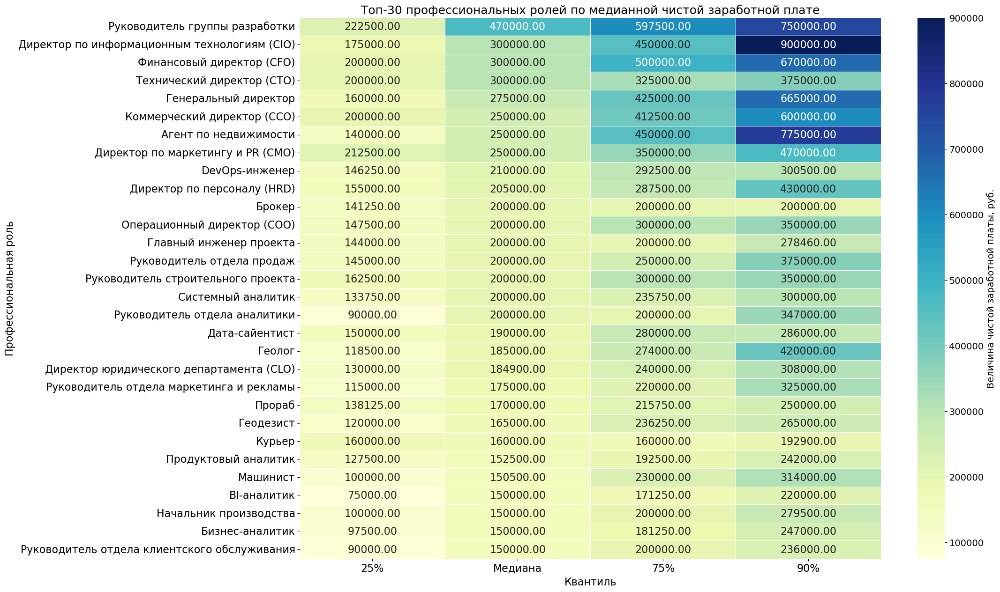

In [56]:
plt.figure(figsize=(20,15))

ax = sns.heatmap(
    quantiles_roles_viz.drop(columns=['Количество вакансий']),  
    annot=True,
    fmt=".2f",
    cmap="YlGnBu",
    annot_kws={"size": 16},
    cbar_kws={'label': 'Величина чистой заработной платы'},
    linewidths=0.5
)

cbar = ax.collections[0].colorbar
cbar.set_label(
    'Величина чистой заработной платы, руб.',
    fontsize=14
)

cbar.ax.tick_params(labelsize=14)
plt.title('Топ-30 профессиональных ролей по медианной чистой заработной плате', fontsize=18)
plt.xlabel('Квантиль', fontsize=16)
plt.ylabel('Профессиональная роль', fontsize=16)
plt.xticks(rotation=0, fontsize=16)
plt.yticks(rotation=0, fontsize=16)
plt.show()

### Название работодателя

In [57]:
df_companies = df_processed.copy()
df_companies['employer_name'] = df_companies['employer_name'].fillna('Не указано')

companies_counts = df_companies.groupby('employer_name')['id'].nunique().sort_values(ascending=False)
top_companies_counts = companies_counts.head(20).reset_index()
top_companies_counts.columns = ['Компания', 'Количество вакансий']

top_companies_counts

,Компания,Количество вакансий
0,Пятёрочка,2052
1,WILDBERRIES,926
2,"МАГНИТ, Розничная сеть",566
3,"Работа-Подработка: Курьер, Кладовщик, Сборщик",218
4,Департамент Ф53,155
5,Ростелеком,139
6,HRP,112
7,"Красное & Белое, розничная сеть",100
8,Квазар,89
9,Онлайн-школа Тетрика,87


In [58]:
df_companies_net = df_companies[df_companies['salary_gross'] == 0]

companies_stats = df_companies_net.groupby(['employer_name', 'professional_roles_short_str']).agg(
    Количество_вакансий=('id', 'nunique'),
    Медианная_чистая_заработная_плата=('salary_mean', 'median')
).reset_index()

companies_stats = companies_stats.sort_values('Медианная_чистая_заработная_плата', ascending=False)

top_companies_stats = companies_stats.head(20)

top_companies_stats

,employer_name,professional_roles_short_str,Количество_вакансий,Медианная_чистая_заработная_плата
5183,АНТЭН-1,Менеджер по продажам,1,3000000.0
1957,HomeLiga,Менеджер по продажам,5,2910000.0
2821,Moscow Collection,Агент по недвижимости,1,2850000.0
19563,Надежда HR / Трансформационный HR-Коуч,Экономист,1,2500000.0
19562,Надежда HR / Трансформационный HR-Коуч,Руководитель отдела продаж,1,2500000.0
328,Alpha Star Properties Dubai,Агент по недвижимости,2,1825000.0
5801,Агентство недвижимости АТЛАС,Агент по недвижимости,2,1750000.0
32501,ЭстэйтЛига,Агент по недвижимости,10,1632500.0
4324,VECTOR K,Генеральный директор,1,1500000.0
1956,HomeLiga,Агент по недвижимости,13,1460000.0


In [59]:
df_companies_net = df_companies[df_companies['salary_gross'] == 0]

companies_stats = df_companies_net.groupby(['employer_name', 'professional_roles_short_str']).agg(
    Количество_вакансий=('id', 'nunique'),
    Медианная_чистая_зарплата=('salary_mean', 'median')
).reset_index()

companies_stats = companies_stats[companies_stats['Количество_вакансий'] >= 10]
companies_stats = companies_stats.sort_values('Медианная_чистая_зарплата', ascending=False)
top_companies_stats = companies_stats.head(20)

top_companies_stats

,employer_name,professional_roles_short_str,Количество_вакансий,Медианная_чистая_зарплата
32501,ЭстэйтЛига,Агент по недвижимости,10,1632500.0
1956,HomeLiga,Агент по недвижимости,13,1460000.0
17255,МИЭЛЬ,Агент по недвижимости,13,600000.0
20249,ОГРК-Центр,Агент по недвижимости,10,362500.0
23983,Рудник Тэутэджак,Водитель,10,350000.0
23992,Рудник Тэутэджак,Машинист,14,350000.0
23987,Рудник Тэутэджак,Другое,19,330000.0
14669,Квазар,Водитель,10,327285.5
24920,Самокат (ООО ИЗИ Лоджистик — партнер сервиса),Курьер,39,268156.0
30870,ЦН Гранат,Агент по недвижимости,38,257500.0


In [60]:
vacancies_per_employer = df_processed.groupby('employer_name')['id'].nunique()

mean_vacancies = vacancies_per_employer.mean()
median_vacancies = vacancies_per_employer.median()

print(f"Среднее количество вакансий на одного работодателя: {mean_vacancies:.2f}")
print(f"Медианное количество вакансий на одного работодателя: {median_vacancies:.0f}")

Среднее количество вакансий на одного работодателя: 2.00
Медианное количество вакансий на одного работодателя: 1


In [61]:
pivot_table = df_processed.pivot_table(
    index=['employer_name', 'salary_gross'],
    values='salary_mean',
    aggfunc=['median', 'nunique']
)

pivot_table.columns = ['median_salary', 'vacancy_count']

pivot_table_filtered = pivot_table[pivot_table['vacancy_count'] >= 10]

pivot_table_sorted = pivot_table_filtered.sort_values('median_salary', ascending=True)

pivot_table_sorted.head(20)

,,median_salary,vacancy_count
employer_name,salary_gross,,
Дата Маркетинг,1.0,21500.0,10
OPEN,0.0,27250.0,22
ГБУЗ Детская краевая клиническая больница министерства здравоохранения Краснодарского края,1.0,30000.0,10
Средневолжская газовая компания (СВГК),1.0,37800.0,10
Полар,0.0,40000.0,10
Почта России,1.0,41430.0,17
ГЛОРИЯ ДЖИНС,1.0,43000.0,16
ТЯЖМАШ,1.0,43175.0,10
ФГБУ Национальный Медицинский Исследовательский Центр Травматологии и Ортопедии Имени Академика Г.А. Илизарова Министерства Здравоохранения Российской,0.0,45000.0,11


In [62]:
pivot_table = df_processed.pivot_table(
    index=['employer_name', 'salary_gross'],
    values='salary_mean',
    aggfunc=['median', 'nunique']
)

pivot_table.columns = ['median_salary', 'vacancy_count']

pivot_table_filtered = pivot_table[pivot_table['vacancy_count'] >= 10]

pivot_table_sorted = pivot_table_filtered.sort_values('median_salary', ascending=False)

pivot_table_sorted.head(20)

,,median_salary,vacancy_count
employer_name,salary_gross,,
HomeLiga,0.0,1935000.0,14
StaffRecruitment,0.0,800000.0,11
ЭстэйтЛига,0.0,695000.0,19
МИЭЛЬ,0.0,450000.0,10
Агентство Недвижимости Инфинити,0.0,385000.0,12
Рудник Тэутэджак,0.0,350000.0,21
ОГРК-Центр,0.0,325000.0,15
ЦН Гранат,0.0,267500.0,28
Major Auto (Мэйджор Авто),1.0,245000.0,11


### Опыт

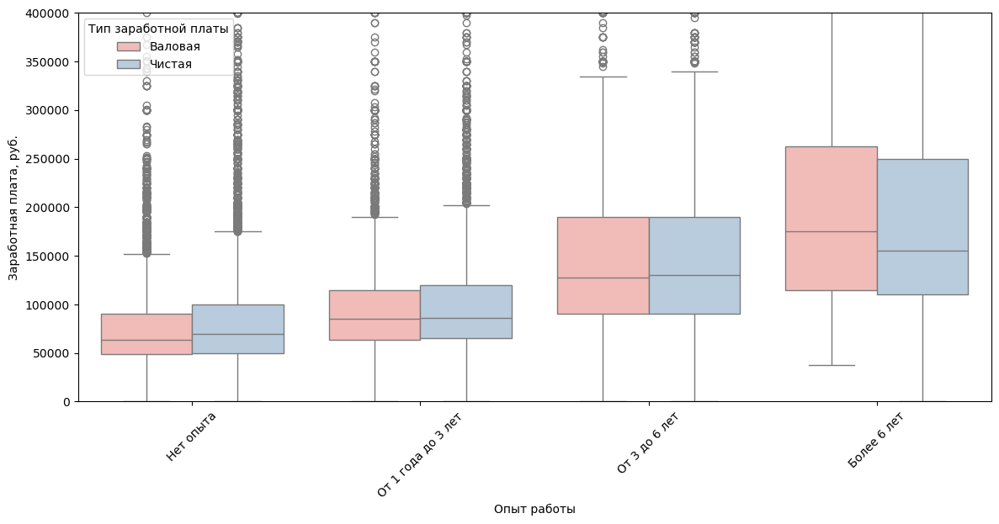

In [63]:
df_processed['experience_name'] = df_processed['experience_name'].fillna('Не указано')

df_processed['Тип_зарплаты'] = df_processed['salary_gross'].map({0: 'Чистая', 1: 'Валовая'})

plt.figure(figsize=(14,6))
sns.boxplot(
    data=df_processed,
    x='experience_name',
    y='salary_mean',
    hue='Тип_зарплаты',
    palette='Pastel1'
)
plt.ylabel('Заработная плата, руб.')
plt.xlabel('Опыт работы')
plt.xticks(rotation=45)
plt.ylim(0, 400000)
plt.legend(title='Тип заработной платы', loc='upper left')
plt.show()

In [64]:
df_processed['experience_name'] = df_processed['experience_name'].fillna('Не указано')
df_processed['Тип_зарплаты'] = df_processed['salary_gross'].map({0: 'Чистая', 1: 'Валовая'})

salary_stats_table = df_processed.groupby(['experience_name', 'Тип_зарплаты'])['salary_mean'].agg(
    Количество='count',
    Средняя_зарплата='mean',
    Медиана='median',
    Минимум='min',
    Максимум='max'
).round(0).reset_index()

salary_stats_table.sort_values(['experience_name', 'Тип_зарплаты'])

,experience_name,Тип_зарплаты,Количество,Средняя_зарплата,Медиана,Минимум,Максимум
0,Более 6 лет,Валовая,268,227870.0,175000.0,38000.0,1250000.0
1,Более 6 лет,Чистая,840,206917.0,155000.0,125.0,1700000.0
2,Нет опыта,Валовая,8388,76046.0,63594.0,80.0,4250000.0
3,Нет опыта,Чистая,16567,90096.0,70000.0,40.0,5005000.0
4,От 1 года до 3 лет,Валовая,7560,96936.0,85000.0,75.0,2000000.0
5,От 1 года до 3 лет,Чистая,17824,100521.0,86000.0,1.0,3895000.0
6,От 3 до 6 лет,Валовая,1930,151040.0,127500.0,308.0,1150000.0
7,От 3 до 6 лет,Чистая,4803,152547.0,130000.0,65.0,3000000.0


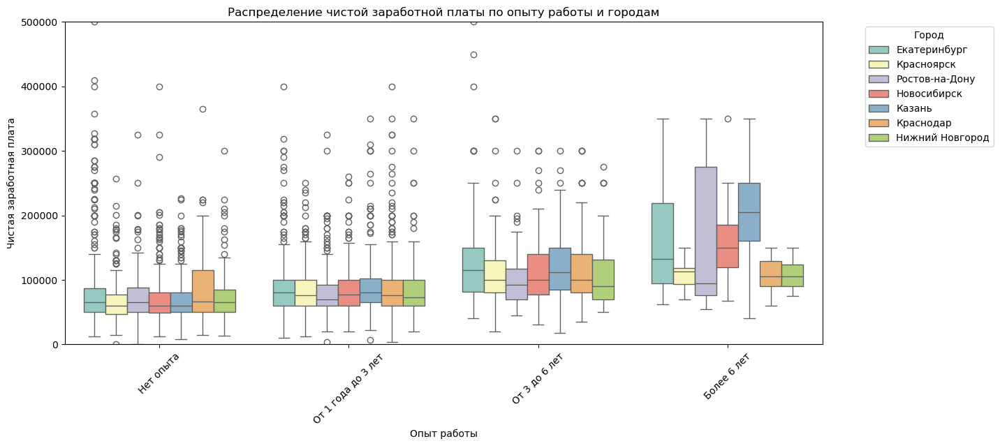

In [65]:
cities = [
    'Екатеринбург', 'Краснодар', 'Казань', 'Новосибирск', 
    'Красноярск', 'Нижний Новгород', 'Ростов-на-Дону'
]

df_plot = df_processed.copy()

df_plot = df_plot[
    (df_plot['address_city'].isin(cities)) & 
    (df_plot['salary_gross'] == 0)
]

experience_order = ['Нет опыта', 'От 1 года до 3 лет', 'От 3 до 6 лет', 'Более 6 лет']

df_plot['experience_name'] = pd.Categorical(
    df_plot['experience_name'],
    categories=experience_order,
    ordered=True
)

plt.figure(figsize=(14,6))
sns.boxplot(
    data=df_plot,
    x='experience_name',
    y='salary_mean',          
    hue='address_city',       
    palette='Set3'
)
plt.ylabel('Чистая заработная плата')
plt.xlabel('Опыт работы')
plt.title('Распределение чистой заработной платы по опыту работы и городам')
plt.xticks(rotation=45)
plt.ylim(0, 500000)
plt.legend(title='Город', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [66]:
salary_table = df_plot.pivot_table(
    index='experience_name',
    columns='address_city',
    values='salary_mean',
    aggfunc='median'
).reindex(experience_order) 

salary_table = salary_table.round(0)  

salary_table

/var/folders/yw/j_hz9v6107z3z2yhw4flcx6c0000gn/T/ipykernel_32430/2039306875.py:1: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  salary_table = df_plot.pivot_table(


address_city,Екатеринбург,Казань,Краснодар,Красноярск,Нижний Новгород,Новосибирск,Ростов-на-Дону
experience_name,,,,,,,
Нет опыта,65000.0,60000.0,66000.0,60000.0,65000.0,60000.0,65000.0
От 1 года до 3 лет,80000.0,80000.0,76000.0,76000.0,72500.0,76750.0,70000.0
От 3 до 6 лет,115000.0,111500.0,100000.0,100000.0,90000.0,100000.0,92500.0
Более 6 лет,132500.0,205000.0,105000.0,112500.0,105350.0,150000.0,95000.0


/var/folders/yw/j_hz9v6107z3z2yhw4flcx6c0000gn/T/ipykernel_32430/1529993648.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  skills_experience = df_processed.groupby('experience_name')['skills_bin'].value_counts(normalize=True).mul(100).unstack(fill_value=0)


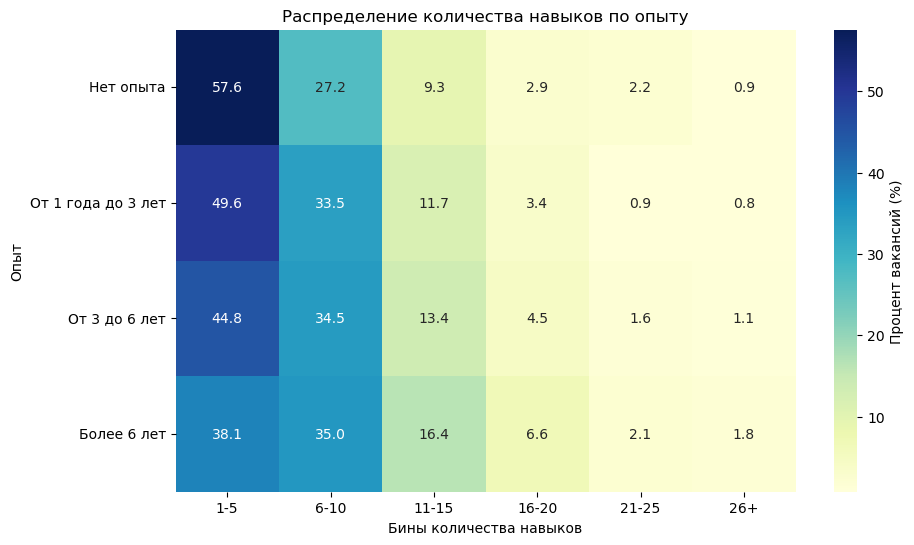

In [67]:
df_processed['num_skills'] = df_processed['key_skills_processed'].apply(lambda x: len(x) if isinstance(x, list) else 0)

bins = [1, 5, 10, 15, 20, 25, np.inf]  
labels = ['1-5', '6-10', '11-15', '16-20', '21-25', '26+']  
df_processed['skills_bin'] = pd.cut(
    df_processed['num_skills'],
    bins=bins,
    labels=labels,
    right=True,
    include_lowest=True
)

experience_order = ['Нет опыта', 'От 1 года до 3 лет', 'От 3 до 6 лет', 'Более 6 лет']
df_processed['experience_name'] = pd.Categorical(
    df_processed['experience_name'],
    categories=experience_order,
    ordered=True
)

skills_experience = df_processed.groupby('experience_name')['skills_bin'].value_counts(normalize=True).mul(100).unstack(fill_value=0)

plt.figure(figsize=(10,6))
sns.heatmap(
    skills_experience,
    annot=True,
    fmt=".1f",
    cmap="YlGnBu",
    cbar_kws={'label':'Процент вакансий (%)'}
)
plt.title('Распределение количества навыков по опыту')
plt.ylabel('Опыт')
plt.xlabel('Бины количества навыков')
plt.show()

### Отрасли деятельности

In [68]:
industries_df = pd.read_excel('industries.xlsx').drop(columns='Unnamed: 0').dropna()

In [69]:
industries_df

,employer_id,industries
0,78638,"['Коллекторская деятельность', 'Банк', 'Интерн..."
1,3567741,['Лечебно-профилактические учреждения']
3,3961846,"['Государственные организации', 'Лечебно-профи..."
4,1645287,"['ГСМ, топливо (розничная торговля)', 'ГСМ, то..."
6,11811833,"['Маркетинговые, рекламные, BTL, дизайнерские,..."
...,...,...
40493,3747130,['Центры развлечения']
40496,2464500,"['Архитектура, проектирование', 'Маркетинговые..."
40497,11487792,"['Ресторан, общественное питание, фаст-фуд']"
40498,5326898,"['Архитектура, проектирование']"


In [70]:
df_merged = df_all.merge(
    industries_df[['employer_id', 'industries']],
    on='employer_id',
    how='left'
)

df_merged = df_merged[['employer_id', 'employer_name', 'industries']]
df_merged

,employer_id,employer_name,industries
0,78638.0,Т-Банк,"['Коллекторская деятельность', 'Банк', 'Интерн..."
1,3567741.0,ГАУЗ СО Детская Городская Поликлиника № 13,['Лечебно-профилактические учреждения']
2,5582735.0,Ресторан Ривьера,NaN
3,3961846.0,СПб ГБУЗ ДГП № 49,"['Государственные организации', 'Лечебно-профи..."
4,1645287.0,НефтоГАз-Сочи,"['ГСМ, топливо (розничная торговля)', 'ГСМ, то..."
...,...,...,...
74864,9034762.0,ГБОУ Средняя Школа №164 Санкт-Петербурга,"['Школа, детский сад']"
74865,2198765.0,Квазар,['Автомобильные перевозки']
74866,10548821.0,Скиф,NaN
74867,8917572.0,Музыкальная школа Сосед Сверху,NaN


In [71]:
df_processed = df_processed.merge(
    df_merged[['employer_id', 'industries']],  
    on='employer_id',
    how='left'
).drop_duplicates(subset=['id', 'employer_id'])

In [72]:
df_processed

,id,employer_id,salary_gross,address_city,address_street,allow_messages,experience_name,billing_type_id,schedule_name,employment_name,...,driver_license_types_processed,description_clean,salary_mean,num_skills,description_length,professional_roles_short_str,region_group,Тип_зарплаты,skills_bin,industries
0,128956748,78638.0,1.0,Саратов,улица имени Н.И. Вавилова,False,Нет опыта,standard,Полный день,Полная занятость,...,NaN,Мобильная связь стала частью повседневности: м...,58000.0,0,1398,Оператор call-центра,Остальная РФ,Валовая,NaN,"['Коллекторская деятельность', 'Банк', 'Интерн..."
22,127271112,3567741.0,0.0,Екатеринбург,улица Ткачей,True,От 1 года до 3 лет,standard,Полный день,Полная занятость,...,NaN,Обязанности: Прием и обработка входящей и исхо...,50000.0,0,313,Секретарь,Остальная РФ,Чистая,NaN,['Лечебно-профилактические учреждения']
23,128536248,5582735.0,0.0,Москва,проспект 60-летия Октября,True,Нет опыта,standard,Гибкий график,Полная занятость,...,NaN,"Ресторан «Ривьера» , уютно расположившийся в о...",50000.0,5,870,Разнорабочий,Москва,Чистая,1-5,NaN
24,128304350,3961846.0,1.0,Пушкин,NaN,True,Нет опыта,standard,Полный день,Полная занятость,...,NaN,Обязанности: Оказание медицинской помощи детск...,100000.0,0,1208,Врач,Остальная РФ,Валовая,NaN,"['Государственные организации', 'Лечебно-профи..."
28,126480906,1645287.0,1.0,Сочи,"жилой район Адлер, Ереванская улица",True,Нет опыта,standard,Полный день,Полная занятость,...,NaN,Наша компания ООО «НефтоГаз-Сочи» является упо...,50000.0,8,1249,Менеджер по продажам,Остальная РФ,Валовая,6-10,"['ГСМ, топливо (розничная торговля)', 'ГСМ, то..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5844177,128928905,9034762.0,1.0,NaN,NaN,True,От 1 года до 3 лет,standard,Полный день,Полная занятость,...,NaN,Обязанности учителя математики: Планирование и...,70000.0,4,1275,Учитель,Остальная РФ,Валовая,1-5,"['Школа, детский сад']"
5844194,129180006,2198765.0,1.0,Челябинск,NaN,True,Нет опыта,standard,Полный день,Частичная занятость,...,NaN,Требуется: Сотрудник склада (сборка и упаковка...,119000.0,1,1287,Другое,Остальная РФ,Валовая,1-5,['Автомобильные перевозки']
5844286,125994145,10548821.0,0.0,Волжский,улица Александрова,True,От 1 года до 3 лет,standard,Полный день,Полная занятость,...,NaN,В строительную организацию срочно требуются св...,140000.0,0,370,Сварщик,Остальная РФ,Чистая,NaN,NaN
5844287,128640989,8917572.0,0.0,Санкт-Петербург,6-я линия Васильевского острова,True,От 1 года до 3 лет,standard,Полный день,Частичная занятость,...,NaN,"В уютную музыкальную студию ""Сосед Сверху"" на ...",67500.0,6,789,Учитель,Санкт-Петербург,Чистая,6-10,NaN


In [73]:
df_processed['industries'] = df_processed['industries'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)
df_processed

,id,employer_id,salary_gross,address_city,address_street,allow_messages,experience_name,billing_type_id,schedule_name,employment_name,...,driver_license_types_processed,description_clean,salary_mean,num_skills,description_length,professional_roles_short_str,region_group,Тип_зарплаты,skills_bin,industries
0,128956748,78638.0,1.0,Саратов,улица имени Н.И. Вавилова,False,Нет опыта,standard,Полный день,Полная занятость,...,NaN,Мобильная связь стала частью повседневности: м...,58000.0,0,1398,Оператор call-центра,Остальная РФ,Валовая,NaN,"[Коллекторская деятельность, Банк, Интернет-ко..."
22,127271112,3567741.0,0.0,Екатеринбург,улица Ткачей,True,От 1 года до 3 лет,standard,Полный день,Полная занятость,...,NaN,Обязанности: Прием и обработка входящей и исхо...,50000.0,0,313,Секретарь,Остальная РФ,Чистая,NaN,[Лечебно-профилактические учреждения]
23,128536248,5582735.0,0.0,Москва,проспект 60-летия Октября,True,Нет опыта,standard,Гибкий график,Полная занятость,...,NaN,"Ресторан «Ривьера» , уютно расположившийся в о...",50000.0,5,870,Разнорабочий,Москва,Чистая,1-5,NaN
24,128304350,3961846.0,1.0,Пушкин,NaN,True,Нет опыта,standard,Полный день,Полная занятость,...,NaN,Обязанности: Оказание медицинской помощи детск...,100000.0,0,1208,Врач,Остальная РФ,Валовая,NaN,"[Государственные организации, Лечебно-профилак..."
28,126480906,1645287.0,1.0,Сочи,"жилой район Адлер, Ереванская улица",True,Нет опыта,standard,Полный день,Полная занятость,...,NaN,Наша компания ООО «НефтоГаз-Сочи» является упо...,50000.0,8,1249,Менеджер по продажам,Остальная РФ,Валовая,6-10,"[ГСМ, топливо (розничная торговля), ГСМ, топли..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5844177,128928905,9034762.0,1.0,NaN,NaN,True,От 1 года до 3 лет,standard,Полный день,Полная занятость,...,NaN,Обязанности учителя математики: Планирование и...,70000.0,4,1275,Учитель,Остальная РФ,Валовая,1-5,"[Школа, детский сад]"
5844194,129180006,2198765.0,1.0,Челябинск,NaN,True,Нет опыта,standard,Полный день,Частичная занятость,...,NaN,Требуется: Сотрудник склада (сборка и упаковка...,119000.0,1,1287,Другое,Остальная РФ,Валовая,1-5,[Автомобильные перевозки]
5844286,125994145,10548821.0,0.0,Волжский,улица Александрова,True,От 1 года до 3 лет,standard,Полный день,Полная занятость,...,NaN,В строительную организацию срочно требуются св...,140000.0,0,370,Сварщик,Остальная РФ,Чистая,NaN,NaN
5844287,128640989,8917572.0,0.0,Санкт-Петербург,6-я линия Васильевского острова,True,От 1 года до 3 лет,standard,Полный день,Частичная занятость,...,NaN,"В уютную музыкальную студию ""Сосед Сверху"" на ...",67500.0,6,789,Учитель,Санкт-Петербург,Чистая,6-10,NaN


In [74]:
df_processed['industries'].apply(lambda x: type(x).__name__)

0           list
22          list
23         float
24          list
28          list
           ...  
5844177     list
5844194     list
5844286    float
5844287    float
5844288     list
Name: industries, Length: 58181, dtype: object

In [75]:
df_processed['industries'].explode().nunique()

296

In [76]:
unique_vacancies = df_processed[['id', 'industries', 'salary_mean', 'professional_roles_short_str', 'experience_name', 'work_format_processed', 'accept_temporary', 'accept_kids', 'internship', 'night_shifts', 'accept_incomplete_resumes', 'employer_name']].copy()

exploded = unique_vacancies.explode('industries')
exploded['industries'] = exploded['industries'].fillna('Не указано')

industry_counts = exploded.groupby('industries')['id'].nunique()

total_vacancies = len(df_processed)
industry_percent = (industry_counts / total_vacancies * 100).sort_values(ascending=False).round(2)

industry_percent_df = industry_percent.reset_index()
industry_percent_df.columns = ['Индустрия', 'Процент вакансий (%)']

industry_percent_df = industry_percent_df.sort_values('Процент вакансий (%)', ascending=False)

top20_industries = industry_percent_df.head(20)
top20_industries

,Индустрия,Процент вакансий (%)
0,Не указано,46.37
1,Розничная сеть (продуктовая),6.89
2,"Ресторан, общественное питание, фаст-фуд",3.83
3,Разработка программного обеспечения,3.80
4,Лечебно-профилактические учреждения,3.72
5,Интернет-магазин,3.00
6,Кадровые агентства,2.63
7,"Розничная сеть (одежда, обувь, аксессуары)",2.26
8,"Системная интеграция, автоматизации технологи...",1.83
9,Консалтинговые услуги,1.58


In [77]:
# industry_percent_df.to_excel('list_of_industries.xlsx')

In [78]:
df_processed[~df_processed['industries'].isna()]

,id,employer_id,salary_gross,address_city,address_street,allow_messages,experience_name,billing_type_id,schedule_name,employment_name,...,driver_license_types_processed,description_clean,salary_mean,num_skills,description_length,professional_roles_short_str,region_group,Тип_зарплаты,skills_bin,industries
0,128956748,78638.0,1.0,Саратов,улица имени Н.И. Вавилова,False,Нет опыта,standard,Полный день,Полная занятость,...,NaN,Мобильная связь стала частью повседневности: м...,58000.0,0,1398,Оператор call-центра,Остальная РФ,Валовая,NaN,"[Коллекторская деятельность, Банк, Интернет-ко..."
22,127271112,3567741.0,0.0,Екатеринбург,улица Ткачей,True,От 1 года до 3 лет,standard,Полный день,Полная занятость,...,NaN,Обязанности: Прием и обработка входящей и исхо...,50000.0,0,313,Секретарь,Остальная РФ,Чистая,NaN,[Лечебно-профилактические учреждения]
24,128304350,3961846.0,1.0,Пушкин,NaN,True,Нет опыта,standard,Полный день,Полная занятость,...,NaN,Обязанности: Оказание медицинской помощи детск...,100000.0,0,1208,Врач,Остальная РФ,Валовая,NaN,"[Государственные организации, Лечебно-профилак..."
28,126480906,1645287.0,1.0,Сочи,"жилой район Адлер, Ереванская улица",True,Нет опыта,standard,Полный день,Полная занятость,...,NaN,Наша компания ООО «НефтоГаз-Сочи» является упо...,50000.0,8,1249,Менеджер по продажам,Остальная РФ,Валовая,6-10,"[ГСМ, топливо (розничная торговля), ГСМ, топли..."
35,129032107,11811833.0,0.0,NaN,NaN,True,Нет опыта,standard,Удаленная работа,Полная занятость,...,NaN,Здравствуйте! Мы « Единый центр телемаркетинг...,50000.0,8,1486,Оператор call-центра,Остальная РФ,Чистая,6-10,"[Маркетинговые, рекламные, BTL, дизайнерские, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5844166,125325475,14340.0,0.0,поселок городского типа Большие Вяземы,Можайское шоссе,True,От 1 года до 3 лет,standard,Полный день,Полная занятость,...,NaN,Условия: График работы 5/2 с 8:00 до 17:00 c д...,95000.0,0,560,Упаковщик,Остальная РФ,Чистая,NaN,"[Оборудование для ресторанов, гостиниц, кейтер..."
5844168,123156876,3634424.0,1.0,NaN,NaN,True,Нет опыта,standard,Удаленная работа,Полная занятость,...,NaN,Станьте голосом доверия в важном диалоге Наша ...,46000.0,3,3074,Оператор call-центра,Остальная РФ,Валовая,1-5,"[Колл-центры, диспетчерские службы, Разработка..."
5844177,128928905,9034762.0,1.0,NaN,NaN,True,От 1 года до 3 лет,standard,Полный день,Полная занятость,...,NaN,Обязанности учителя математики: Планирование и...,70000.0,4,1275,Учитель,Остальная РФ,Валовая,1-5,"[Школа, детский сад]"
5844194,129180006,2198765.0,1.0,Челябинск,NaN,True,Нет опыта,standard,Полный день,Частичная занятость,...,NaN,Требуется: Сотрудник склада (сборка и упаковка...,119000.0,1,1287,Другое,Остальная РФ,Валовая,1-5,[Автомобильные перевозки]


In [79]:
lengths = df_processed['industries'].apply(
    lambda x: len(x) if isinstance(x, list) else 0
)

lengths.value_counts().sort_index()

industries
0    26979
1    14939
2     6375
3     5144
4     2193
5     2551
Name: count, dtype: int64

In [80]:
mapping = pd.read_excel("mapping_of_industries.xlsx", sheet_name=1) 

df_merged = exploded.merge(mapping, how="left", left_on="industries", right_on="industries")

df_merged.head()

sector_counts = df_merged.groupby("id")["industry_group"].nunique()  
sector_counts.value_counts()

industry_group
0    26979
1    19548
2     7397
3     3567
4      638
5       52
Name: count, dtype: int64

In [81]:
multi_sector_ids = sector_counts[sector_counts > 1].index

df_multi_sector = df_merged[df_merged["id"].isin(multi_sector_ids)]

df_multi_sector.head(20)  

,id,industries,salary_mean,professional_roles_short_str,experience_name,work_format_processed,accept_temporary,accept_kids,internship,night_shifts,accept_incomplete_resumes,employer_name,industry_group
0,128956748,Коллекторская деятельность,58000.0,Оператор call-центра,Нет опыта,[Гибрид],False,False,False,True,True,Т-Банк,Финансы
1,128956748,Банк,58000.0,Оператор call-центра,Нет опыта,[Гибрид],False,False,False,True,True,Т-Банк,Финансы
2,128956748,"Интернет-компания (поисковики, платежные систе...",58000.0,Оператор call-центра,Нет опыта,[Гибрид],False,False,False,True,True,Т-Банк,IT и телеком
3,128956748,Разработка программного обеспечения,58000.0,Оператор call-центра,Нет опыта,[Гибрид],False,False,False,True,True,Т-Банк,IT и телеком
4,128956748,"Системная интеграция, автоматизации технологи...",58000.0,Оператор call-центра,Нет опыта,[Гибрид],False,False,False,True,True,Т-Банк,IT и телеком
7,128304350,Государственные организации,100000.0,Врач,Нет опыта,[На месте работодателя],False,False,False,False,False,СПб ГБУЗ ДГП № 49,Государство и НКО
8,128304350,Лечебно-профилактические учреждения,100000.0,Врач,Нет опыта,[На месте работодателя],False,False,False,False,False,СПб ГБУЗ ДГП № 49,Здравоохранение
9,126480906,"ГСМ, топливо (розничная торговля)",50000.0,Менеджер по продажам,Нет опыта,[Разъездной],False,False,False,False,True,НефтоГАз-Сочи,Ритейл
10,126480906,"ГСМ, топливо (продвижение, оптовая торговля)",50000.0,Менеджер по продажам,Нет опыта,[Разъездной],False,False,False,False,True,НефтоГАз-Сочи,Оптовая торговля
13,127414031,"Аптека, оптика",90000.0,Фармацевт-провизор,Нет опыта,NaN,False,False,False,False,False,Аптеки Столички,Ритейл


In [82]:
df_multi_sector[df_multi_sector['employer_name'].str.contains('WILDBERRIES')]

,id,industries,salary_mean,professional_roles_short_str,experience_name,work_format_processed,accept_temporary,accept_kids,internship,night_shifts,accept_incomplete_resumes,employer_name,industry_group
61,127887932,Интернет-магазин,63800.0,Продавец-консультант,Нет опыта,[На месте работодателя],True,False,False,False,True,WILDBERRIES,Ритейл
62,127887932,Разработка программного обеспечения,63800.0,Продавец-консультант,Нет опыта,[На месте работодателя],True,False,False,False,True,WILDBERRIES,IT и телеком
345,128333347,Интернет-магазин,160000.0,Курьер,Нет опыта,NaN,True,False,False,False,False,WILDBERRIES,Ритейл
346,128333347,Разработка программного обеспечения,160000.0,Курьер,Нет опыта,NaN,True,False,False,False,False,WILDBERRIES,IT и телеком
348,128366494,Интернет-магазин,160000.0,Курьер,Нет опыта,NaN,True,False,False,False,False,WILDBERRIES,Ритейл
...,...,...,...,...,...,...,...,...,...,...,...,...,...
91189,128322602,Разработка программного обеспечения,160000.0,Курьер,Нет опыта,NaN,True,False,False,False,False,WILDBERRIES,IT и телеком
91601,128333376,Интернет-магазин,160000.0,Курьер,Нет опыта,NaN,True,False,False,False,False,WILDBERRIES,Ритейл
91602,128333376,Разработка программного обеспечения,160000.0,Курьер,Нет опыта,NaN,True,False,False,False,False,WILDBERRIES,IT и телеком
91609,128334015,Интернет-магазин,160000.0,Курьер,Нет опыта,NaN,True,False,False,False,False,WILDBERRIES,Ритейл


In [83]:
vacancies_per_sector = df_merged.groupby("industry_group")["id"].nunique().sort_values(ascending=False)

vacancies_per_sector

industry_group
Ритейл                           8993
Производство                     6703
Оптовая торговля                 6560
B2B услуги                       4495
IT и телеком                     3518
Строительство и недвижимость     2977
Гостинично-ресторанный бизнес    2755
Прочие услуги                    2487
Здравоохранение                  2243
Логистика и транспорт            1695
Образование                      1042
Энергетика и ресурсы             1001
Государство и НКО                 868
Наука и исследования              761
Финансы                           734
Медиа и развлечения               723
Сельское хозяйство                300
Name: id, dtype: int64

In [84]:
priority_list = [
    "Финансы",                    
    "Здравоохранение",            
    "Наука и исследования",       
    "Образование",                
    "Сельское хозяйство",         
    "Энергетика и ресурсы",       
    "Оптовая торговля",           
    "Ритейл",                     
    "IT и телеком",               
    "Производство",               
    "Гостинично-ресторанный бизнес",
    "Строительство и недвижимость",
    "Логистика и транспорт",
    "Государство и НКО",
    "Прочие услуги",
    "B2B услуги",
    "Медиа и развлечения"
]

priority_dict = {sector: i for i, sector in enumerate(priority_list, start=1)}

df_merged["sector_priority"] = df_merged["industry_group"].map(priority_dict)
df_merged["sector_priority"] = df_merged["sector_priority"].fillna(100)  

df_merged

main_sector = df_merged.loc[df_merged.groupby("id")["sector_priority"].idxmin(), ["id", "industry_group"]]

In [85]:
# main_sector[main_sector['id']==128956748]

main_sector[main_sector['id']==127887932]

,id,industry_group
61,127887932,Ритейл


In [86]:
sector_counts = main_sector.groupby("id")["industry_group"].nunique()  
sector_counts.value_counts()

industry_group
1    31202
0    26979
Name: count, dtype: int64

In [87]:
df_merged

,id,industries,salary_mean,professional_roles_short_str,experience_name,work_format_processed,accept_temporary,accept_kids,internship,night_shifts,accept_incomplete_resumes,employer_name,industry_group,sector_priority
0,128956748,Коллекторская деятельность,58000.0,Оператор call-центра,Нет опыта,[Гибрид],False,False,False,True,True,Т-Банк,Финансы,1.0
1,128956748,Банк,58000.0,Оператор call-центра,Нет опыта,[Гибрид],False,False,False,True,True,Т-Банк,Финансы,1.0
2,128956748,"Интернет-компания (поисковики, платежные систе...",58000.0,Оператор call-центра,Нет опыта,[Гибрид],False,False,False,True,True,Т-Банк,IT и телеком,9.0
3,128956748,Разработка программного обеспечения,58000.0,Оператор call-центра,Нет опыта,[Гибрид],False,False,False,True,True,Т-Банк,IT и телеком,9.0
4,128956748,"Системная интеграция, автоматизации технологи...",58000.0,Оператор call-центра,Нет опыта,[Гибрид],False,False,False,True,True,Т-Банк,IT и телеком,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91622,128928905,"Школа, детский сад",70000.0,Учитель,От 1 года до 3 лет,NaN,False,False,False,False,False,ГБОУ Средняя Школа №164 Санкт-Петербурга,Образование,4.0
91623,129180006,Автомобильные перевозки,119000.0,Другое,Нет опыта,[На месте работодателя],True,False,False,False,True,Квазар,Логистика и транспорт,13.0
91624,125994145,Не указано,140000.0,Сварщик,От 1 года до 3 лет,[На месте работодателя],False,False,False,False,False,Скиф,NaN,100.0
91625,128640989,Не указано,67500.0,Учитель,От 1 года до 3 лет,[На месте работодателя],True,False,False,False,False,Музыкальная школа Сосед Сверху,NaN,100.0


In [88]:
main_sector["industry_group"].value_counts()

industry_group
Оптовая торговля                 6103
Ритейл                           5979
Гостинично-ресторанный бизнес    2323
Здравоохранение                  2236
B2B услуги                       2182
Строительство и недвижимость     2176
IT и телеком                     1951
Производство                     1845
Прочие услуги                    1315
Логистика и транспорт            1175
Энергетика и ресурсы              989
Образование                       948
Финансы                           734
Государство и НКО                 488
Сельское хозяйство                293
Наука и исследования              238
Медиа и развлечения               227
Name: count, dtype: int64

In [89]:
industries_quantiles = (
    exploded
    .groupby('industries')['salary_mean']
    .quantile([0.25, 0.5, 0.75, 0.9])
    .unstack()
    .round(0)
)

industries_quantiles.columns = ['25%', 'Медиана', '75%', '90%']
industries_quantiles.sort_values('Медиана', ascending=False).head(40)

,25%,Медиана,75%,90%
industries,,,,
"Фонд, грантодатель",111933.0,172500.0,195000.0,250000.0
"Добыча и обогащение руд черных, цветных, драгоценных, благородных, редких металлов",110000.0,170000.0,230000.0,293400.0
"Драгоценные, благородные и редкие металлы (производство)",122350.0,170000.0,203750.0,308200.0
Интернет-магазин,80000.0,160000.0,160000.0,160000.0
Разработка программного обеспечения,75000.0,160000.0,160000.0,175000.0
Строительство объектов металлургической отрасли,113125.0,157500.0,180000.0,230000.0
Домашний персонал,86000.0,150000.0,183750.0,250000.0
"Оборудование для деревообработки, заготовки леса, целлюлозно-бумажной промышленности (продвижение, оптовая торговля)",90000.0,150000.0,185000.0,390000.0
Агентские услуги в недвижимости,98000.0,150000.0,275000.0,450000.0


In [90]:
industries_quantiles = (
    exploded
    .groupby(['industries', 'professional_roles_short_str'])['salary_mean']
    .quantile([0.25, 0.5, 0.75, 0.9])
    .unstack()
    .round(0)
)

industries_quantiles.columns = ['25%', 'Медиана', '75%', '90%']

industries_quantiles.sort_values('Медиана', ascending=False).head(20)

25%  \
industries                                         professional_roles_short_str                   
Консалтинговые услуги                              Генеральный директор               1500000.0   
                                                   Экономист                           648625.0   
Кадровые агентства                                 Специалист службы безопасности     1200000.0   
Автокомпоненты, запчасти (производство)            Коммерческий директор (CCO)        1000000.0   
Интернет-компания (поисковики, платежные систем... Коммерческий директор (CCO)         625000.0   
Кадровые агентства                                 Главный врач                       1000000.0   
Консалтинговые услуги                              Главный врач                       1000000.0   
Промышленное, бытовое электрооборудование и эле... Коммерческий директор (CCO)        1000000.0   
Промышленное, бытовое электрооборудование и эле... Коммерческий директор (CCO)        1000000.0   
Медицинское, диагностическое оборудование, инст... Директор по маркетингу и PR (CMO)  1000000.0   
Медицинское, диагностическое оборудование, инст... Директор по маркетингу и PR (CMO)  1000000.0   
Масложировая продукция (производство)              Генеральный директор                800000.0   
Масложировая продукция (продвижение, оптовая то... Генеральный директор                800000.0   
Молочная продукция (продвижение, оптовая торговля) Генеральный директор                800000.0   
Агентские услуги в недвижимости                    Финансовый директор (CFO)           800000.0   
Молочная продукция (производство)                  Генеральный директор                800000.0   
Консалтинг, оценка в недвижимости                  Финансовый директор (CFO)           800000.0   
Управление и эксплуатация недвижимости             Финансовый директор (CFO)           800000.0   
Интернет-магазин                                   Директор по маркетингу и PR (CMO)   681250.0   
Товары для детей (продвижение, оптовая торговля)   Коммерческий директор (CCO)         750000.0   

                                                                                        Медиана  \
industries                                         professional_roles_short_str                   
Консалтинговые услуги                              Генеральный директор               1500000.0   
                                                   Экономист                          1265750.0   
Кадровые агентства                                 Специалист службы безопасности     1200000.0   
Автокомпоненты, запчасти (производство)            Коммерческий директор (CCO)        1000000.0   
Интернет-компания (поисковики, платежные систем... Коммерческий директор (CCO)        1000000.0   
Кадровые агентства                                 Главный врач                       1000000.0   
Консалтинговые услуги                              Главный врач                       1000000.0   
Промышленное, бытовое электрооборудование и эле... Коммерческий директор (CCO)        1000000.0   
Промышленное, бытовое электрооборудование и эле... Коммерческий директор (CCO)        1000000.0   
Медицинское, диагностическое оборудование, инст... Директор по маркетингу и PR (CMO)  1000000.0   
Медицинское, диагностическое оборудование, инст... Директор по маркетингу и PR (CMO)  1000000.0   
Масложировая продукция (производство)              Генеральный директор                800000.0   
Масложировая продукция (продвижение, оптовая то... Генеральный директор                800000.0   
Молочная продукция (продвижение, оптовая торговля) Генеральный директор                800000.0   
Агентские услуги в недвижимости                    Финансовый директор (CFO)           800000.0   
Молочная продукция (производство)                  Генеральный директор                800000.0   
Консалтинг, оценка в недвижимости                  Финансовый директор (CFO)           800000.0   
Управление и эксплуатация недвиж

In [91]:
industries_quantiles = (
    exploded
    .groupby(['industries', 'professional_roles_short_str'])['salary_mean']
    .quantile([0.25, 0.5, 0.75, 0.9])
    .unstack()
    .round(0)
)

industries_quantiles.columns = ['25%', 'Медиана', '75%', '90%']

industries_quantiles.sort_values('Медиана', ascending=True).head(20)

,,25%,Медиана,75%,90%
industries,professional_roles_short_str,,,,
"Музей, галерея, театр",Начальник производства,60.0,60.0,60.0,60.0
"Дорожно-строительная техника, сельскохозяйственная и другая спец.техника, оборудование, лифты, погрузочно-разгрузочное, складское оборудование (монтаж, сервис, ремонт)",Начальник склада,308.0,308.0,308.0,308.0
"Дорожно-строительная техника, сельскохозяйственная и другая спец.техника, оборудование, лифты, погрузочно-разгрузочное, складское оборудование (продвижение, оптовая торговля)",Начальник склада,308.0,308.0,308.0,308.0
"Двигатели (монтаж, сервис, ремонт)",Начальник склада,308.0,308.0,308.0,308.0
"Школа, детский сад",Курьер,5612.0,5612.0,5612.0,5612.0
Кондитерские изделия (производство),Делопроизводитель,7000.0,7000.0,7000.0,7000.0
"Колл-центры, диспетчерские службы",Уборщица,9250.0,9500.0,9750.0,9900.0
"Стройматериалы, сборные конструкции для ремонта и строительства (продвижение, оптовая торговля)",Электромонтажник,12000.0,12000.0,12000.0,12000.0
"Табак (продвижение, оптовая торговля)",Уборщица,12000.0,12000.0,12000.0,12000.0


In [92]:
exploded_unique = exploded.drop_duplicates(subset=['id', 'industries'])

total_vacancies = len(df_processed)

industry_counts = exploded_unique.groupby('industries')['id'].nunique()

industry_percent = (industry_counts / total_vacancies * 100).sort_values(ascending=False).round(2)

experience_order = ['Нет опыта', 'От 1 года до 3 лет', 'От 3 до 6 лет', 'Более 6 лет']
exploded_unique['experience_name'] = pd.Categorical(
    exploded_unique['experience_name'],
    categories=experience_order,
    ordered=True
)

industry_experience = (
    exploded_unique.groupby(['industries', 'experience_name'])['id']
    .nunique()
    .div(industry_counts, level='industries')  
    .mul(100)  
    .unstack(fill_value=0)
)

top_industries = industry_percent.head(20).index
top_industries

/var/folders/yw/j_hz9v6107z3z2yhw4flcx6c0000gn/T/ipykernel_32430/2335475887.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  exploded_unique.groupby(['industries', 'experience_name'])['id']


Index(['Не указано', 'Розничная сеть (продуктовая)',
       'Ресторан, общественное питание, фаст-фуд',
       'Разработка программного обеспечения',
       'Лечебно-профилактические учреждения', 'Интернет-магазин',
       'Кадровые агентства', 'Розничная сеть (одежда, обувь, аксессуары)',
       'Системная интеграция,  автоматизации технологических и бизнес-процессов предприятия, ИТ-консалтинг',
       'Консалтинговые услуги',
       'Интернет-компания (поисковики, платежные системы, соц.сети, информационно-познавательные и развлекательные ресурсы, продвижение сайтов и прочее)',
       'Розничная сеть (drogerie, товары повседневного спроса)',
       'Строительство коммерческих объектов (торговые площади, офисные здания)',
       'Государственные организации', 'Строительство жилищное',
       'Автомобильные перевозки',
       'Маркетинговые, рекламные, BTL, дизайнерские, Event-, PR-агентства, организация выставок',
       'Строительство промышленное', 'Гостиница',
       'Техническое о

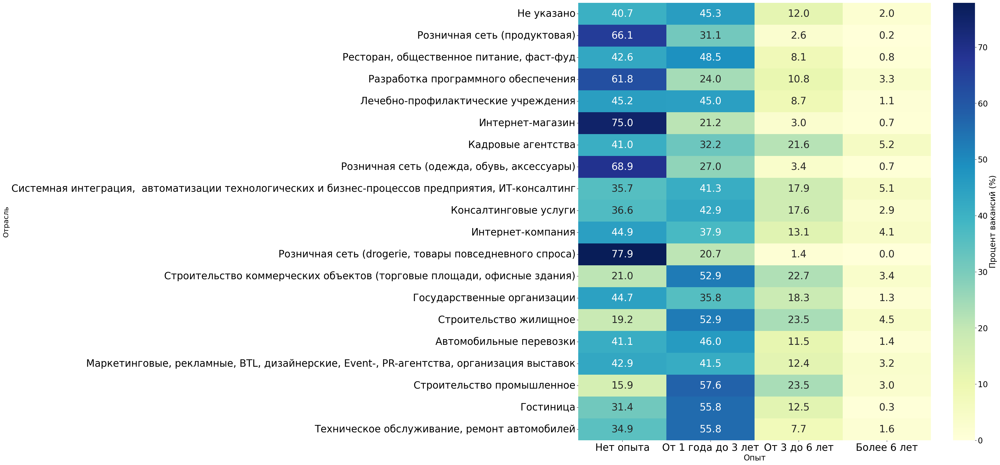

In [93]:
plot_data = industry_experience.loc[top_industries].copy()

plot_data.index = plot_data.index.str.replace(
    'Интернет-компания (поисковики, платежные системы, соц.сети, информационно-познавательные и развлекательные ресурсы, продвижение сайтов и прочее)',
    'Интернет-компания'
)

plt.figure(figsize=(20, 20))

ax = sns.heatmap(
    plot_data,
    annot_kws={'fontsize':25},
    annot=True,
    fmt=".1f",
    cmap="YlGnBu",
    cbar_kws={'label':'Процент вакансий (%)'}
)

cbar = ax.collections[0].colorbar
cbar.set_label(
    'Процент вакансий (%)',
    fontsize=20
)

cbar.ax.tick_params(labelsize=20)
plt.xlabel('Опыт', fontsize=20)
plt.ylabel('Отрасль', fontsize=18)
plt.xticks(rotation=0, fontsize=25)
plt.yticks(rotation=0, fontsize=25)
plt.show()

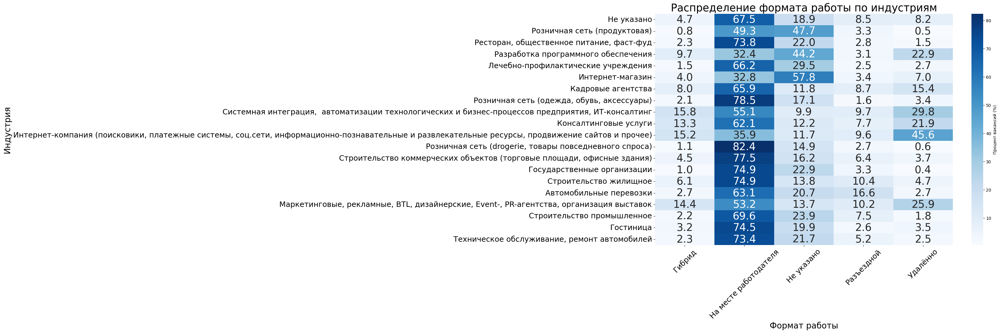

In [94]:
exploded_work = exploded_unique.explode('work_format_processed')

exploded_work['work_format_processed'] = exploded_work['work_format_processed'].fillna('Не указано')

exploded_work_unique = exploded_work.drop_duplicates(
    subset=['id', 'industries', 'work_format_processed']
)

industry_workformat = (
    exploded_work_unique
    .groupby(['industries', 'work_format_processed'])['id']
    .nunique()
    .div(industry_counts, level='industries')   
    .mul(100)
    .round(2)
    .unstack(fill_value=0)
)

# industry_workformat.loc[top_industries]

plt.figure(figsize=(16, 10))

sns.heatmap(
    industry_workformat.loc[top_industries],
    annot=True,
    fmt=".1f",
    cmap="Blues",
    annot_kws={'fontsize':25},
    cbar_kws={'label': 'Процент вакансий (%)'}
)

plt.title('Распределение формата работы по индустриям', fontsize=25)
plt.xlabel('Формат работы', fontsize=20)
plt.ylabel('Индустрия', fontsize=20)

plt.xticks(rotation=45, fontsize=18)
plt.yticks(rotation=0, fontsize=18)

plt.show()

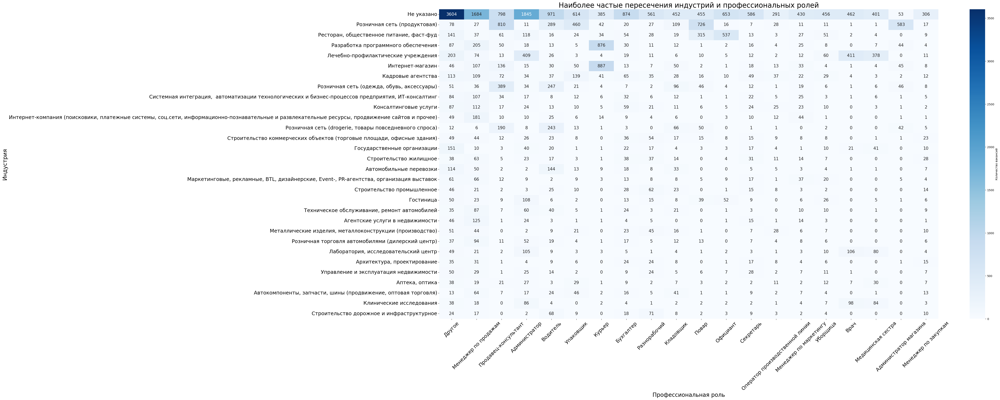

In [95]:
exploded_roles = exploded_unique.copy()

exploded_roles['professional_roles_short_str'] = exploded_roles['professional_roles_short_str'].fillna('Не указано')

exploded_roles_unique = exploded_roles.drop_duplicates(
    subset=['id', 'industries', 'professional_roles_short_str']
)

industry_roles = (
    exploded_roles_unique
    .groupby(['industries', 'professional_roles_short_str'])['id']
    .nunique()
    .unstack(fill_value=0)
)

top_roles = (
    industry_roles
    .sum()
    .sort_values(ascending=False)
    .head(20)
    .index
)

top_industries = industry_roles.sum(axis=1).sort_values(ascending=False).head(30).index

plt.figure(figsize=(40, 20))

sns.heatmap(
    industry_roles.loc[top_industries, top_roles],
    cmap="Blues",
    annot=True,
    annot_kws={'fontsize':15},
    fmt="g",
    cbar_kws={'label': 'Количество вакансий'}
)

plt.title('Наиболее частые пересечения индустрий и профессиональных ролей', fontsize=25)
plt.xlabel('Профессиональная роль', fontsize=20)
plt.ylabel('Индустрия', fontsize=20)

plt.xticks(rotation=45, fontsize=18)
plt.yticks(rotation=0, fontsize=18)

plt.show()

In [96]:
pd.set_option('display.max_colwidth', 100)

bool_columns = [
    'internship', 
    'night_shifts', 
    'accept_temporary',
    'accept_kids',
    'accept_incomplete_resumes'
]

exploded_bool = exploded.copy()
for col in bool_columns:
    exploded_bool[col] = exploded_bool[col].fillna('Не указано')  

exploded_bool_unique = exploded_bool.drop_duplicates(subset=['id', 'industries', *bool_columns])

industry_bool_dfs = {}

for col in bool_columns:
    df_col = (
        exploded_bool_unique
        .groupby('industries')[col]
        .mean()
        .mul(100)
        .round(2)
        .sort_values(ascending=False)
        .reset_index()
    )
    df_col.columns = ['Индустрия', f'Процент {col} (%)']
    industry_bool_dfs[col] = df_col

for col, df_col in industry_bool_dfs.items():
    print(f"--- {col} ---")
    display(df_col.head(10))  

--- internship ---


,Индустрия,Процент internship (%)
0,Аренда автомобилей,38.60
1,Игорный бизнес,33.33
2,Такси,26.32
3,"Консалтинг, оценка в недвижимости",21.81
4,"Курьерская, почтовая доставка",21.31
5,Юридическое обслуживание,20.24
6,"Профессиональная, предпринимательская организация",17.65
7,Фото- и видеоуслуги,17.65
8,Финансовые услуги (кэптивные банки и лизинговые компании),16.42
9,Домашний персонал,16.22


--- night_shifts ---


,Индустрия,Процент night_shifts (%)
0,Аренда автомобилей,47.37
1,Игорный бизнес,40.00
2,Такси,36.84
3,"Колл-центры, диспетчерские службы",34.71
4,"Драгоценные, благородные и редкие металлы (продвижение, оптовая торговля)",30.43
5,Домашний персонал,27.93
6,"Курьерская, почтовая доставка",27.85
7,"Ассоциация в сфере культуры, искусства",27.27
8,Юридическое обслуживание,26.49
9,Агрохимия (производство),26.32


--- accept_temporary ---


,Индустрия,Процент accept_temporary (%)
0,Тренинговые компании,62.69
1,Интернет-магазин,61.66
2,Обучение иностранным языкам,60.70
3,"Курьерская, почтовая доставка",54.24
4,Разработка программного обеспечения,54.18
5,Коллекторская деятельность,48.39
6,Такси,42.11
7,"Консалтинг, оценка в недвижимости",41.98
8,Фото- и видеоуслуги,39.71
9,Складские услуги,39.01


--- accept_kids ---


,Индустрия,Процент accept_kids (%)
0,Аренда автомобилей,3.51
1,Домашний персонал,1.80
2,Фиксированная связь,1.56
3,Оптоволоконная связь,1.53
4,Интернет-провайдер,1.52
5,Мобильная связь,1.20
6,"Управляющая, инвестиционная компания (управление активами)",1.02
7,Бизнес-образование,0.68
8,"Производство мультимедиа, контента, редакторская деятельность",0.65
9,Центры развлечения,0.56


--- accept_incomplete_resumes ---


,Индустрия,Процент accept_incomplete_resumes (%)
0,Религиозная организация,100.00
1,"Розничная сеть (drogerie, товары повседневного спроса)",89.30
2,Коллекторская деятельность,80.65
3,Фиксированная связь,80.16
4,"Розничная сеть (одежда, обувь, аксессуары)",78.29
5,Ликероводочная продукция (производство),76.47
6,Мобильная связь,74.17
7,Оптоволоконная связь,73.56
8,"Курьерская, почтовая доставка",72.88
9,"Алкогольные напитки (продвижение, оптовая торговля)",72.66


In [97]:
pd.set_option('display.max_colwidth', 100)

bool_columns = [
    'internship',
    'night_shifts',
    'accept_temporary',
    'accept_kids',
    'accept_incomplete_resumes'
]

exploded_bool = exploded.copy()

for col in bool_columns:
    exploded_bool[col] = exploded_bool[col].fillna(0)

exploded_bool_unique = exploded_bool.drop_duplicates(
    subset=['id', 'industries', *bool_columns]
)

industry_bool_dfs = {}

for col in bool_columns:
    df_col = (
        exploded_bool_unique
        .groupby('industries')
        .agg(
            vacancies_cnt=('id', 'nunique'),
            percent=(col, 'mean')
        )
        .assign(percent=lambda x: (x['percent'] * 100).round(2))
        .sort_values(
        ['percent', 'vacancies_cnt'],
        ascending=[False, False]
    )
        .reset_index()
    )

    df_col.columns = [
        'Индустрия',
        'Количество вакансий',
        f'Процент {col} (%)'
    ]

    industry_bool_dfs[col] = df_col

for col, df_col in industry_bool_dfs.items():
    print(f"--- {col} ---")
    display(df_col.head(20))

--- internship ---


,Индустрия,Количество вакансий,Процент internship (%)
0,Аренда автомобилей,57,38.60
1,Игорный бизнес,15,33.33
2,Такси,19,26.32
3,"Консалтинг, оценка в недвижимости",243,21.81
4,"Курьерская, почтовая доставка",413,21.31
5,Юридическое обслуживание,336,20.24
6,Фото- и видеоуслуги,68,17.65
7,"Профессиональная, предпринимательская организация",17,17.65
8,Финансовые услуги (кэптивные банки и лизинговые компании),67,16.42
9,Домашний персонал,111,16.22


--- night_shifts ---


,Индустрия,Количество вакансий,Процент night_shifts (%)
0,Аренда автомобилей,57,47.37
1,Игорный бизнес,15,40.00
2,Такси,19,36.84
3,"Колл-центры, диспетчерские службы",170,34.71
4,"Драгоценные, благородные и редкие металлы (продвижение, оптовая торговля)",23,30.43
5,Домашний персонал,111,27.93
6,"Курьерская, почтовая доставка",413,27.85
7,"Ассоциация в сфере культуры, искусства",11,27.27
8,Юридическое обслуживание,336,26.49
9,Агрохимия (производство),38,26.32


--- accept_temporary ---


,Индустрия,Количество вакансий,Процент accept_temporary (%)
0,Тренинговые компании,193,62.69
1,Интернет-магазин,1745,61.66
2,Обучение иностранным языкам,201,60.70
3,"Курьерская, почтовая доставка",413,54.24
4,Разработка программного обеспечения,2213,54.18
5,Коллекторская деятельность,31,48.39
6,Такси,19,42.11
7,"Консалтинг, оценка в недвижимости",243,41.98
8,Фото- и видеоуслуги,68,39.71
9,Складские услуги,446,39.01


--- accept_kids ---


,Индустрия,Количество вакансий,Процент accept_kids (%)
0,Аренда автомобилей,57,3.51
1,Домашний персонал,111,1.80
2,Фиксированная связь,257,1.56
3,Оптоволоконная связь,261,1.53
4,Интернет-провайдер,263,1.52
5,Мобильная связь,333,1.20
6,"Управляющая, инвестиционная компания (управление активами)",98,1.02
7,Бизнес-образование,146,0.68
8,"Производство мультимедиа, контента, редакторская деятельность",154,0.65
9,Центры развлечения,355,0.56


--- accept_incomplete_resumes ---


,Индустрия,Количество вакансий,Процент accept_incomplete_resumes (%)
0,Религиозная организация,1,100.00
1,"Розничная сеть (drogerie, товары повседневного спроса)",841,89.30
2,Коллекторская деятельность,31,80.65
3,Фиксированная связь,257,80.16
4,"Розничная сеть (одежда, обувь, аксессуары)",1313,78.29
5,Ликероводочная продукция (производство),17,76.47
6,Мобильная связь,333,74.17
7,Оптоволоконная связь,261,73.56
8,"Курьерская, почтовая доставка",413,72.88
9,"Алкогольные напитки (продвижение, оптовая торговля)",278,72.66


In [98]:
for col in bool_columns:
    df_col = (
        exploded_bool_unique
        .groupby('industries')
        .agg(
            vacancies_cnt=('id', 'nunique'),
            percent=(col, 'mean')
        )
        .query('vacancies_cnt >= 50')
        .assign(percent=lambda x: (x['percent'] * 100).round(2))
        .query('percent >= 10')
        .sort_values(
            'vacancies_cnt',
            ascending=False
        )
        .reset_index()
    )

    df_col.columns = [
        'Индустрия',
        'Количество вакансий',
        f'Процент {col} (%)'
    ]

    industry_bool_dfs[col] = df_col

for col, df_col in industry_bool_dfs.items():
    print(f"--- {col} ---")
    display(df_col.head(50))

--- internship ---


,Индустрия,Количество вакансий,Процент internship (%)
0,Автомобильные перевозки,739,13.26
1,Агентские услуги в недвижимости,575,13.39
2,Строительство дорожное и инфраструктурное,458,13.10
3,Складские услуги,446,15.70
4,"Курьерская, почтовая доставка",413,21.31
5,Юридическое обслуживание,336,20.24
6,"Консалтинг, оценка в недвижимости",243,21.81
7,Домашний персонал,111,16.22
8,"Рыба и морепродукты (продвижение, оптовая торговля)",106,12.26
9,Производство и продажа рекламно-сувенирной продукции,82,15.85


--- night_shifts ---


,Индустрия,Количество вакансий,Процент night_shifts (%)
0,Розничная сеть (продуктовая),4006,13.75
1,"Ресторан, общественное питание, фаст-фуд",2226,13.39
2,Кадровые агентства,1531,11.89
3,Автомобильные перевозки,739,14.75
4,Гостиница,624,13.30
5,"Металлические изделия, металлоконструкции (производство)",567,13.23
6,"Аптека, оптика",486,15.23
7,Строительство дорожное и инфраструктурное,458,16.38
8,Складские услуги,446,23.32
9,"Фармацевтическая продукция (продвижение, оптовая торговля)",422,18.01


--- accept_temporary ---


,Индустрия,Количество вакансий,Процент accept_temporary (%)
0,Не указано,26979,17.74
1,"Ресторан, общественное питание, фаст-фуд",2226,12.22
2,Разработка программного обеспечения,2213,54.18
3,Интернет-магазин,1745,61.66
4,Кадровые агентства,1531,22.99
5,"Системная интеграция, автоматизации технологических и бизнес-процессов предприятия, ИТ-консалтинг",1066,16.14
6,Консалтинговые услуги,919,19.37
7,"Интернет-компания (поисковики, платежные системы, соц.сети, информационно-познавательные и развл...",847,29.52
8,Строительство жилищное,741,12.28
9,Автомобильные перевозки,739,21.92


--- accept_kids ---


,Индустрия,Количество вакансий,Процент accept_kids (%)


--- accept_incomplete_resumes ---


,Индустрия,Количество вакансий,Процент accept_incomplete_resumes (%)
0,Не указано,26979,53.59
1,Розничная сеть (продуктовая),4006,44.66
2,"Ресторан, общественное питание, фаст-фуд",2226,64.15
3,Разработка программного обеспечения,2213,23.63
4,Лечебно-профилактические учреждения,2164,43.99
5,Интернет-магазин,1745,24.93
6,Кадровые агентства,1531,55.06
7,"Розничная сеть (одежда, обувь, аксессуары)",1313,78.29
8,"Системная интеграция, автоматизации технологических и бизнес-процессов предприятия, ИТ-консалтинг",1066,36.77
9,Консалтинговые услуги,919,47.33


### Дополнения (логотип компании в вакансии, транспорт, длительность вахт)

In [99]:
fio_exploded = df_processed.explode('fly_in_fly_out_duration_processed')
fio_counts = fio_exploded['fly_in_fly_out_duration_processed'].value_counts().sort_index()
fio_counts

days_order = ['15', '20', '30', '40', '45', '60', '90', '120', '180', 'Другое']
fio_counts = fio_counts.reindex(days_order, fill_value=0)

fio_percent = (fio_counts / fio_counts.sum() * 100).round(2)

fio_table = pd.DataFrame({
    'Количество вакансий': fio_counts,
    'Процент от всех вакансий (%)': fio_percent
})

fio_table

,Количество вакансий,Процент от всех вакансий (%)
fly_in_fly_out_duration_processed,,
15,157,6.60
20,68,2.86
30,555,23.32
40,54,2.27
45,324,13.61
60,669,28.11
90,164,6.89
120,39,1.64
180,38,1.60


In [100]:
df_exploded = df_processed.explode('driver_license_types_processed')

pivot_count_num = df_exploded.pivot_table(
    index='employment_name',
    columns='driver_license_types_processed',
    values='salary_mean',
    aggfunc='nunique',
    fill_value=0,
    margins=True,
    margins_name='Итого'
)

pivot_percent = pivot_count_num / pivot_count_num.loc['Итого','Итого'] * 100
pivot_percent = pivot_percent.round(2)

pivot_percent

driver_license_types_processed,A,B,BE,C,CE,D,DE,E,TB,TM,Итого
employment_name,,,,,,,,,,,
Полная занятость,2.24,68.28,4.85,46.27,12.31,21.27,3.36,25.0,0.37,0.75,92.16
Проектная работа,0.00,1.12,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,1.12
Частичная занятость,0.37,17.54,0.37,2.24,0.37,0.37,0.00,0.0,0.00,0.00,17.91
Итого,2.61,76.87,5.22,47.39,12.69,21.27,3.36,25.0,0.37,0.75,100.00


In [101]:
pivot_median_salary = df_exploded.pivot_table(
    index='employment_name',
    columns='driver_license_types_processed',
    values='salary_mean',
    aggfunc='median',           
    fill_value=0,
    margins=True, 
    margins_name='Итого'
).drop('Итого', axis=1)

display(pivot_median_salary)

driver_license_types_processed,A,B,BE,C,CE,D,DE,E,TB,TM
employment_name,,,,,,,,,,
Полная занятость,107500.0,100000.0,80000.0,111500.0,180000.0,90000.0,186000.0,172000.0,135000.0,125000.0
Проектная работа,0.0,87500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Частичная занятость,72500.0,128000.0,75000.0,125000.0,75000.0,100000.0,0.0,0.0,0.0,0.0
Итого,105000.0,104000.0,80000.0,111500.0,180000.0,90000.0,186000.0,172000.0,135000.0,125000.0


In [102]:
pd.crosstab(
    df_processed['billing_type_id'],
    df_processed['show_logo_in_search'],
    dropna=False
)

show_logo_in_search,1.0,NaN
billing_type_id,,
premium,53,0
standard,9952,46448
standard_plus,112,1616


In [103]:
total_vacancies = len(df_processed)

def salary_stats(group):
    return pd.Series({
        'Количество вакансий': len(group),
        'Процент вакансий (%)': round(len(group)/total_vacancies*100, 2),
        'Квантиль 25%': group.quantile(0.25),
        'Медиана': group.median(),
        'Квантиль 75%': group.quantile(0.75),
        'Квантиль 90%': group.quantile(0.90)
    })

salary_logo_table = df_processed.groupby(
    ['show_logo_in_search', 'salary_gross'], dropna=False
)['salary_mean'].apply(salary_stats)

salary_logo_table

show_logo_in_search  salary_gross                      
1.0                  0.0           Количество вакансий       4346.00
                                   Процент вакансий (%)         7.47
                                   Квантиль 25%             70000.00
                                   Медиана                 109135.00
                                   Квантиль 75%            160000.00
                                   Квантиль 90%            200000.00
                     1.0           Количество вакансий       5771.00
                                   Процент вакансий (%)         9.92
                                   Квантиль 25%             52000.00
                                   Медиана                  70000.00
                                   Квантиль 75%            100000.00
                                   Квантиль 90%            150000.00
NaN                  0.0           Количество вакансий      35688.00
                                   Процент вака

In [104]:
pd.set_option('display.max_colwidth', None)

df_langs = df_processed.explode('languages_processed')
df_langs = df_langs[df_langs['languages_processed'].notna()]

df_langs_roles = df_langs.explode('professional_roles_processed')

total_vacancies_with_language = df_langs['id'].nunique()

lang_stats = df_langs.groupby('languages_processed').agg(
    unique_vacancies=('id', 'nunique')
)

lang_stats['percent_of_vacancies_with_language'] = (
    lang_stats['unique_vacancies'] / total_vacancies_with_language * 100
).round(2)

top_roles = df_langs_roles.groupby('languages_processed')['professional_roles_processed'].apply(
    lambda x: ', '.join(x.value_counts().index[:3])
)

lang_stats = lang_stats.join(top_roles.rename('top_3_roles'))
lang_stats = lang_stats.sort_values('unique_vacancies', ascending=False)
lang_stats.head(20)

,unique_vacancies,percent_of_vacancies_with_language,top_3_roles
languages_processed,,,
Английский,1332,83.67,"Менеджер по продажам, менеджер по работе с клиентами, Другое, Секретарь, помощник руководителя, ассистент"
Русский,251,15.77,"Другое, Продавец-консультант, продавец-кассир, Водитель"
Китайский,62,3.89,"Менеджер по закупкам, Менеджер по логистике, менеджер по ВЭД, Учитель, преподаватель, педагог"
Испанский,18,1.13,"Учитель, преподаватель, педагог, Переводчик, Менеджер по продажам, менеджер по работе с клиентами"
Немецкий,17,1.07,"Менеджер по продажам, менеджер по работе с клиентами, Учитель, преподаватель, педагог, Секретарь, помощник руководителя, ассистент"
Французский,12,0.75,"Переводчик, Менеджер по продажам, менеджер по работе с клиентами, Другое"
Арабский,11,0.69,"Юрист, Оператор call-центра, специалист контактного центра, Специалист технической поддержки"
Турецкий,4,0.25,"Архитектор, Юрист, Менеджер по продажам, менеджер по работе с клиентами"
Польский,3,0.19,"Менеджер по продажам, менеджер по работе с клиентами, Переводчик"


### Корреляционный анализ

In [105]:
columns_with_ne_ukazano = [col for col in df_processed.columns 
                           if (df_processed[col] == 'Не указано').any()]

columns_with_na = [col for col in df_processed.columns 
                   if df_processed[col].isna().any()]

print("Колонки с 'Не указано':", columns_with_ne_ukazano)
print("Колонки с NaN:", columns_with_na)

Колонки с 'Не указано': []
Колонки с NaN: ['salary_gross', 'address_city', 'address_street', 'department_name', 'show_logo_in_search', 'salary_range_frequency_name', 'address_metro_station_name', 'address_metro_line_name', 'address_lat', 'address_lng', 'test_required', 'age_restriction_name', 'key_skills_processed', 'work_format_processed', 'work_schedule_by_days_processed', 'working_hours_processed', 'working_time_modes_processed', 'languages_processed', 'fly_in_fly_out_duration_processed', 'driver_license_types_processed', 'Тип_зарплаты', 'skills_bin', 'industries']


In [106]:
gov_keywords = [
    'ГБУЗ', 'МБОУ', 'ГБУ', 'ГОУ', 'ГМУ', 'МБУ',
    'министерство', 'ведомство', 'казенное', 'казённое', 'областная', 'областной',
    'государственный', 'государственное', 'государственная'
]

def is_government_employer(name):
    if pd.isna(name):
        return False
    name_lower = str(name).lower()
    for kw in gov_keywords:
        if kw.lower() in name_lower:
            return True
    return False

df_processed['government_employer'] = df_processed['employer_name'].apply(is_government_employer)

print(df_processed['government_employer'].value_counts())

government_employer
False    55607
True      2574
Name: count, dtype: int64


In [107]:
df_processed[df_processed['government_employer']==True][['employer_name']]

,employer_name
24,СПб ГБУЗ ДГП № 49
76,ГУЗ Тульский областной онкологический диспансер
5357,Тюменская больница ФГБУЗ ЗСМЦ ФМБА России
11622,ГОАУЗ Мурманская областная стоматологическая поликлиника
16457,ГБУЗ НСО Городская клиническая больница № 25
...,...
5837171,ГБУЗ Детская краевая клиническая больница министерства здравоохранения Краснодарского края
5837335,ГБУ ДО Краснодарского Края Спортивная Школа Академия Гандбола
5840139,Государственное бюджетное учреждение Курганский областной онкологический диспансер
5840157,ГБУ ДО Спортивная школа олимпийского резерва Москвич Департамента спорта города Москвы


In [108]:
def is_individual_entrepreneur(name):
    if pd.isna(name):
        return False
    name_str = str(name).strip()
    
    if "ИП" in name_str.upper():
        return True
    
    words = name_str.split()
    if len(words) == 3:
        last_name = words[2].lower()
        if last_name.endswith(('вна', 'вич')):
            return True
    
    return False

df_processed['individual_entrepreneur'] = df_processed['employer_name'].apply(is_individual_entrepreneur)

print(df_processed['individual_entrepreneur'].value_counts())

individual_entrepreneur
False    52458
True      5723
Name: count, dtype: int64


In [109]:
df_processed[df_processed['individual_entrepreneur']==True]['employer_name']

7452       Школа скорочтения и развития интеллекта IQ 007 (ИП Хорошавина Надежда Юрьевна)
9525                                                          Легоцкая Наталья Евгеньевна
13714                                                      Зеленская Мария Константиновна
13758                                                         Арутюнян Офелия Меружановна
15838                                                    Ремизович Алексей Константинович
                                                ...                                      
5837424                                                      Ветохин Максим Александрович
5840136                                                       Пестов Дмитрий Владимирович
5840137                                                     Фефелова Эльвира Владимеровна
5840151                                                     Супрун Екатерина Владимировна
5844176                                                             Смирнова Юлия Юрьевна
Name: empl

In [110]:
df_roles = df_processed[~df_processed['professional_roles_short_str'].isin(["Другое", "Не указано"])].copy()

role_counts = df_roles['professional_roles_short_str'].value_counts(normalize=True)

rare_threshold = 0.005

rare_roles = role_counts[role_counts < rare_threshold].index.tolist()

df_processed['rare_role'] = df_processed['professional_roles_short_str'].apply(
    lambda x: x in rare_roles if x not in ["Другое", "Не указано"] else False
)

print(df_processed['rare_role'].value_counts())

rare_roles

rare_role
False    48498
True      9683
Name: count, dtype: int64


['Менеджер по туризму',
 'Технолог',
 'Мерчандайзер',
 'Руководитель отдела продаж',
 'Менеджер/руководитель АХО',
 'Лаборант',
 'Товаровед',
 'Начальник производства',
 'Прораб',
 'Фармацевт-провизор',
 'Токарь',
 'Контролёр ОТК',
 'Менеджер по работе с партнерами',
 'Инженер по качеству',
 'Юрисконсульт',
 'Специалист службы безопасности',
 'Механик',
 'Руководитель филиала',
 'Фитнес-тренер',
 'Мастер-приемщик',
 'Инженер по эксплуатации',
 'PR-менеджер',
 'Кассир-операционист',
 'Ассистент врача',
 'Начальник склада',
 'Научный специалист',
 'Полицейский',
 'Массажист',
 'Инженер по охране труда и технике безопасности',
 'Инженер-энергетик',
 'Мастер по ремонту оборудования',
 'Координатор отдела продаж',
 'Фотограф',
 'Копирайтер',
 'Специалист по тендерам',
 'Швея',
 'Аналитик',
 'Операционный директор (COO)',
 'Коммерческий директор (CCO)',
 'Супервайзер',
 'Маляр',
 'Генеральный директор',
 'Тестировщик',
 'Менеджер продукта',
 'Геодезист',
 'Кредитный специалист',
 'Методист',

In [111]:
bureaucratic_keywords = [
    'регламент', 'учёт', 'документирование', 'оформление', 'документация', 'документации'
]
support_keywords = ['поддержка', 'помощь', 'консультирование', 'помогать', 'консультровать', 'cопровождение', 'сопровождать', 'помогать']
creation_keywords = ['разработка', 'внедрение', 'конструирование', 'конструировать', 'разрабатывать', 'проектировать']

def classify_role_hierarchy(text):
    if pd.isna(text):
        return None
    text_lower = str(text).lower()
    
    if any(kw in text_lower for kw in bureaucratic_keywords):
        return 'bureaucratic_role'
    elif any(kw in text_lower for kw in support_keywords):
        return 'support_role'
    elif any(kw in text_lower for kw in creation_keywords):
        return 'creation_role'
    else:
        return None
df_processed['role_category'] = df_processed['description_clean'].apply(classify_role_hierarchy)

df_processed['role_category'].value_counts()

role_category
bureaucratic_role    26827
support_role          9146
creation_role         1606
Name: count, dtype: int64

In [112]:
numerical_cols = ['salary_mean', 'address_lat', 'address_lng', 'num_skills', 'description_length']

bool_cols = ['salary_gross',
 'allow_messages',
 'show_contacts',
 'auto_response_accept_auto_response',
 'accept_handicapped',
 'accept_kids',
 'archived',
 'accept_incomplete_resumes',
 'has_test',
 'accept_temporary',
 'internship',
 'night_shifts',
'government_employer',
'individual_entrepreneur',
'rare_role']

results = []

for num_col in numerical_cols:
    for bool_col in bool_cols:
        df_temp = df_processed[[num_col, bool_col]].dropna()
        
        if df_temp[bool_col].nunique() < 2:
            continue
        
        corr, pval = pointbiserialr(df_temp[num_col], df_temp[bool_col])
        results.append({
            'Числовой признак': num_col,
            'Бинарный признак': bool_col,
            'point-biserial': corr,
            'p-value': pval
        })

pb_corr_df = pd.DataFrame(results)
pb_corr_df = pb_corr_df.sort_values('point-biserial', key=abs, ascending=False).reset_index(drop=True)

pb_corr_df.head(30)

,Числовой признак,Бинарный признак,point-biserial,p-value
0,description_length,accept_incomplete_resumes,-0.153510,1.143807e-303
1,num_skills,allow_messages,0.150984,1.032407e-293
2,num_skills,salary_gross,-0.136080,1.797016e-238
3,num_skills,internship,0.134283,3.210094e-232
4,description_length,rare_role,0.130753,3.554137e-220
5,num_skills,accept_temporary,0.129179,6.512633e-215
6,num_skills,accept_kids,0.128604,5.231711e-213
7,address_lng,salary_gross,-0.113278,1.017222e-141
8,num_skills,accept_handicapped,0.112947,1.836090e-164
9,num_skills,individual_entrepreneur,0.105701,3.564804e-144


In [113]:
df_corr = df_processed.copy()

numerical_cols = ['salary_mean', 'address_lat', 'address_lng', 'num_skills', 'description_length']
for col in numerical_cols:
    df_corr[f'log_{col}'] = np.log(df_corr[col] + 1)

numerical_cols_all = numerical_cols + [f'log_{col}' for col in numerical_cols]

bool_cols = ['salary_gross',
 'allow_messages',
 'show_contacts',
 'auto_response_accept_auto_response',
 'accept_handicapped',
 'accept_kids',
 'archived',
 'accept_incomplete_resumes',
 'has_test',
 'accept_temporary',
 'internship',
 'night_shifts',
 'government_employer',
 'individual_entrepreneur',
 'rare_role']

results = []

for num_col in numerical_cols_all:
    for bool_col in bool_cols:
        df_temp = df_corr[[num_col, bool_col]].dropna()
        
        if df_temp[bool_col].nunique() < 2:
            continue
        
        corr, pval = pointbiserialr(df_temp[num_col], df_temp[bool_col])
        results.append({
            'Числовой признак': num_col,
            'Бинарный признак': bool_col,
            'point-biserial': corr,
            'p-value': pval
        })

pb_corr_df = pd.DataFrame(results)
pb_corr_df = pb_corr_df.sort_values('point-biserial', key=abs, ascending=False).reset_index(drop=True)

pb_corr_df.head(30)

/opt/anaconda3/lib/python3.13/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/opt/anaconda3/lib/python3.13/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,Числовой признак,Бинарный признак,point-biserial,p-value
0,log_num_skills,allow_messages,0.194591,0.000000e+00
1,log_num_skills,salary_gross,-0.161336,0.000000e+00
2,log_description_length,accept_incomplete_resumes,-0.158568,0.000000e+00
3,description_length,accept_incomplete_resumes,-0.153510,1.143807e-303
4,num_skills,allow_messages,0.150984,1.032407e-293
5,num_skills,salary_gross,-0.136080,1.797016e-238
6,num_skills,internship,0.134283,3.210094e-232
7,description_length,rare_role,0.130753,3.554137e-220
8,num_skills,accept_temporary,0.129179,6.512633e-215
9,num_skills,accept_kids,0.128604,5.231711e-213


In [114]:
def phi_corr(data, x, y):
    t = pd.crosstab(data[x], data[y]).values
    chi2, p, _, _ = chi2_contingency(t, correction=False)
    phi = np.sqrt(chi2 / t.sum())
    phi *= np.sign(t[0,0]*t[1,1] - t[0,1]*t[1,0]) 
    return phi, p

phi_matrix = pd.DataFrame(index=bool_cols, columns=bool_cols, dtype=float)
pval_matrix = pd.DataFrame(index=bool_cols, columns=bool_cols, dtype=float)

for col1 in bool_cols:
    for col2 in bool_cols:
        phi_val, p_val = phi_corr(df_processed, col1, col2)
        phi_matrix.loc[col1, col2] = phi_val
        pval_matrix.loc[col1, col2] = p_val

alpha = 0.05
phi_significance = []
seen_pairs = set()

for col1 in bool_cols:
    for col2 in bool_cols:
        if col1 == col2:
            continue
        pair = tuple(sorted([col1, col2]))
        if pair in seen_pairs:
            continue
        seen_pairs.add(pair)

        phi_val = phi_matrix.loc[col1, col2]
        p_val = pval_matrix.loc[col1, col2]
        significant = p_val < alpha

        phi_significance.append({
            'Признак 1': pair[0],
            'Признак 2': pair[1],
            'phi': phi_val,
            'p-value': p_val,
            'Significant': significant
        })

phi_significance_df = pd.DataFrame(phi_significance)

phi_significance_df = phi_significance_df.sort_values('phi', key=abs, ascending=False).reset_index(drop=True)
display(phi_significance_df.head(20))

,Признак 1,Признак 2,phi,p-value,Significant
0,archived,show_contacts,-0.606860,0.000000e+00,True
1,accept_handicapped,accept_kids,0.207328,0.000000e+00,True
2,accept_temporary,internship,0.201408,0.000000e+00,True
3,accept_handicapped,accept_temporary,0.170528,0.000000e+00,True
4,accept_incomplete_resumes,night_shifts,0.162023,0.000000e+00,True
5,accept_incomplete_resumes,rare_role,-0.152757,3.384802e-297,True
6,allow_messages,salary_gross,-0.151642,6.649828e-293,True
7,accept_incomplete_resumes,allow_messages,0.150677,3.221019e-289,True
8,accept_temporary,individual_entrepreneur,0.148145,1.187148e-279,True
9,accept_incomplete_resumes,auto_response_accept_auto_response,0.142866,3.151668e-260,True


In [115]:
corr = pd.DataFrame(index=numerical_cols, columns=numerical_cols)
pvals = pd.DataFrame(index=numerical_cols, columns=numerical_cols)

for col1 in numerical_cols:
    for col2 in numerical_cols:
        r, p = spearmanr(
            df_processed[col1],
            df_processed[col2],
            nan_policy='omit'
        )

        corr.loc[col1, col2] = r
        pvals.loc[col1, col2] = p

print("Spearman correlation:")
display(corr)
print("Spearman correlation p-values:")
display(pvals)

corr = pd.DataFrame(index=numerical_cols, columns=numerical_cols)
pvals = pd.DataFrame(index=numerical_cols, columns=numerical_cols)

for col1 in numerical_cols:
    for col2 in numerical_cols:
        r, p = kendalltau(
            df_processed[col1],
            df_processed[col2],
            nan_policy='omit'
        )

        corr.loc[col1, col2] = r
        pvals.loc[col1, col2] = p

print("Kendall correlation:")
display(corr)
print("Kendall correlation p-values:")
display(pvals)

Spearman correlation:


,salary_mean,address_lat,address_lng,num_skills,description_length
salary_mean,1.0,0.114208,-0.212658,0.054056,0.221271
address_lat,0.114208,1.0,-0.280584,-0.005577,0.042165
address_lng,-0.212658,-0.280584,1.0,-0.033112,-0.079985
num_skills,0.054056,-0.005577,-0.033112,1.0,0.157623
description_length,0.221271,0.042165,-0.079985,0.157623,1.0


Spearman correlation p-values:


,salary_mean,address_lat,address_lng,num_skills,description_length
salary_mean,0.0,0.0,0.0,0.0,0.0
address_lat,0.0,0.0,0.0,0.21354,0.0
address_lng,0.0,0.0,0.0,0.0,0.0
num_skills,0.0,0.21354,0.0,0.0,0.0
description_length,0.0,0.0,0.0,0.0,0.0


Kendall correlation:


,salary_mean,address_lat,address_lng,num_skills,description_length
salary_mean,1.0,0.076228,-0.143152,0.039798,0.15107
address_lat,0.076228,1.0,-0.19115,-0.004121,0.028071
address_lng,-0.143152,-0.19115,1.0,-0.023926,-0.053398
num_skills,0.039798,-0.004121,-0.023926,1.0,0.11339
description_length,0.15107,0.028071,-0.053398,0.11339,1.0


Kendall correlation p-values:


,salary_mean,address_lat,address_lng,num_skills,description_length
salary_mean,0.0,0.0,0.0,0.0,0.0
address_lat,0.0,0.0,0.0,0.201902,0.0
address_lng,0.0,0.0,0.0,0.0,0.0
num_skills,0.0,0.201902,0.0,0.0,0.0
description_length,0.0,0.0,0.0,0.0,0.0


In [116]:
categorical_cols = [
    'address_city', 'experience_name', 'billing_type_id', 'schedule_name',
    'employment_name', 'department_name', 'employer_name', 
    'show_logo_in_search', 'test_required', 'age_restriction_name', 'role_category', 
]

bool_cols = [
    'salary_gross', 'allow_messages', 'show_contacts', 
    'auto_response_accept_auto_response', 'accept_handicapped', 
    'accept_kids', 'archived', 'accept_incomplete_resumes', 
    'has_test', 'accept_temporary', 'internship', 'night_shifts',
    'government_employer', 'individual_entrepreneur', 'rare_role'
]

cat_bool_results = []

for cat_col in categorical_cols:
    for bool_col in bool_cols:
        df_temp = df_processed[[cat_col, bool_col]].dropna()
        
        if df_temp[bool_col].nunique() < 2 or df_temp[cat_col].nunique() < 2:
            continue  
        
        ct = pd.crosstab(df_temp[cat_col], df_temp[bool_col])
        
        chi2, p, _, _ = chi2_contingency(ct, correction=False)
        n = ct.sum().sum()
        cramers_v = np.sqrt(chi2 / (n * (min(ct.shape)-1)))
        
        cat_bool_results.append({
            'Categorical': cat_col,
            'Binary': bool_col,
            'Cramers V': cramers_v,
            'p-value': p
        })

cat_bool_df = pd.DataFrame(cat_bool_results)
cat_bool_df = cat_bool_df.sort_values('Cramers V', ascending=False).reset_index(drop=True)

display(cat_bool_df.head(30))

,Categorical,Binary,Cramers V,p-value
0,employer_name,individual_entrepreneur,1.000000,0.000000e+00
1,age_restriction_name,accept_kids,1.000000,6.233889e-123
2,employer_name,government_employer,1.000000,0.000000e+00
3,department_name,allow_messages,0.975855,0.000000e+00
4,employer_name,allow_messages,0.938754,0.000000e+00
5,department_name,has_test,0.920178,0.000000e+00
6,employer_name,accept_temporary,0.919818,0.000000e+00
7,employer_name,salary_gross,0.906320,0.000000e+00
8,department_name,individual_entrepreneur,0.903560,0.000000e+00
9,department_name,salary_gross,0.902468,0.000000e+00


In [117]:
def cramers_v(x, y):
    ct = pd.crosstab(x, y)
    if ct.empty:
        return np.nan, np.nan

    chi2, p, _, _ = chi2_contingency(ct, correction=False)
    n = ct.sum().sum()
    r, k = ct.shape
    if r <= 1 or k <= 1:
        return np.nan, p

    v = np.sqrt(chi2 / (n * (min(r, k) - 1)))
    return v, p

cat_cat_results = []

for col1, col2 in combinations(categorical_cols, 2):
    df_temp = df_processed[[col1, col2]].dropna()
    if (
        df_temp[col1].nunique() < 2
        or df_temp[col2].nunique() < 2
    ):
        continue

    v, pval = cramers_v(df_temp[col1], df_temp[col2])

    cat_cat_results.append({
        'Categorical 1': col1,
        'Categorical 2': col2,
        'Cramers V': v,
        'p-value': pval,
        'significant': pval < 0.05
    })

cat_cat_df = (
    pd.DataFrame(cat_cat_results)
    .sort_values('Cramers V', ascending=False)
    .reset_index(drop=True))

print("Категориальные + категориальные:")
display(cat_cat_df.head(20))

Категориальные + категориальные:


,Categorical 1,Categorical 2,Cramers V,p-value,significant
0,department_name,test_required,1.000000,2.133093e-01,False
1,department_name,age_restriction_name,1.000000,1.834616e-03,True
2,department_name,employer_name,0.987385,0.000000e+00,True
3,employer_name,age_restriction_name,0.984823,3.968973e-14,True
4,employer_name,test_required,0.953700,6.419760e-04,True
5,billing_type_id,employer_name,0.867672,0.000000e+00,True
6,employer_name,role_category,0.857715,0.000000e+00,True
7,schedule_name,employer_name,0.857573,0.000000e+00,True
8,department_name,role_category,0.836015,0.000000e+00,True
9,employment_name,employer_name,0.835555,0.000000e+00,True


In [118]:
def eta_squared(numeric, categorical):
    df_temp = pd.concat([numeric, categorical], axis=1).dropna()
    if categorical.nunique() < 2:
        return np.nan
    groups = df_temp.groupby(categorical.name)[numeric.name]
    ss_between = sum([len(g)*(g.mean() - numeric.mean())**2 for name, g in groups])
    ss_total = ((numeric.loc[df_temp.index] - numeric.mean())**2).sum()
    return ss_between / ss_total if ss_total > 0 else np.nan

cat_num_results = []

for cat_col in categorical_cols:
    for num_col in numerical_cols:
        eta2 = eta_squared(df_processed[num_col], df_processed[cat_col])
        cat_num_results.append({
            'Categorical': cat_col,
            'Numerical': num_col,
            'eta_squared': eta2
        })

cat_num_df = pd.DataFrame(cat_num_results)
cat_num_df = cat_num_df.sort_values('eta_squared', ascending=False).reset_index(drop=True)
print("Категориальные + числовые:")
display(cat_num_df.head(20))

/var/folders/yw/j_hz9v6107z3z2yhw4flcx6c0000gn/T/ipykernel_32430/334493357.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df_temp.groupby(categorical.name)[numeric.name]


Категориальные + числовые:


,Categorical,Numerical,eta_squared
0,address_city,address_lat,0.996484
1,address_city,address_lng,0.992926
2,department_name,num_skills,0.902076
3,employer_name,address_lng,0.857942
4,employer_name,address_lat,0.818407
5,employer_name,description_length,0.799150
6,employer_name,num_skills,0.794676
7,department_name,salary_mean,0.774870
8,department_name,description_length,0.716818
9,employer_name,salary_mean,0.687394


In [119]:
list_cols = [
    'key_skills_processed',
    'professional_roles_processed',
    'work_format_processed',
    'work_schedule_by_days_processed',
    'working_hours_processed',
    'working_time_modes_processed',
    'languages_processed',
    'fly_in_fly_out_duration_processed',
    'driver_license_types_processed',
    'industries'
]

df_cluster = df_processed.copy()

for col in tqdm(list_cols, desc="Encoding list-columns"):
    df_cluster[col] = df_cluster[col].apply(lambda x: x if isinstance(x, list) else [])
    
    mlb = MultiLabelBinarizer()
    encoded = pd.DataFrame(
        mlb.fit_transform(df_cluster[col]),
        columns=[f"{col}__{c}" for c in mlb.classes_],
        index=df_cluster.index
    )
    
    df_cluster = pd.concat([df_cluster, encoded], axis=1)

    df_cluster.drop(columns=[col], inplace=True)

df_cluster.head()

Encoding list-columns: 100%|████████████████████| 10/10 [01:22<00:00,  8.21s/it]


,id,employer_id,salary_gross,address_city,address_street,allow_messages,experience_name,billing_type_id,schedule_name,employment_name,...,"industries__Черная металлургия (производство чугуна, стали, проката)","industries__Школа, детский сад","industries__Экологическое обслуживание, водоочистка, утилизация отходов","industries__Электронно-вычислительная, оптическая, контрольно-измерительная техника, радиоэлектроника, автоматика (монтаж, сервис, ремонт)","industries__Электронно-вычислительная, оптическая, контрольно-измерительная техника, радиоэлектроника, автоматика (продвижение, оптовая торговля)","industries__Электронно-вычислительная, оптическая, контрольно-измерительная техника, радиоэлектроника, автоматика (производство)",industries__Энергоснабжение,"industries__Ювелирные изделия, бижутерия (продвижение, оптовая торговля)","industries__Ювелирные изделия, бижутерия (производство)",industries__Юридическое обслуживание
0,128956748,78638.0,1.0,Саратов,улица имени Н.И. Вавилова,False,Нет опыта,standard,Полный день,Полная занятость,...,0,0,0,0,0,0,0,0,0,0
22,127271112,3567741.0,0.0,Екатеринбург,улица Ткачей,True,От 1 года до 3 лет,standard,Полный день,Полная занятость,...,0,0,0,0,0,0,0,0,0,0
23,128536248,5582735.0,0.0,Москва,проспект 60-летия Октября,True,Нет опыта,standard,Гибкий график,Полная занятость,...,0,0,0,0,0,0,0,0,0,0
24,128304350,3961846.0,1.0,Пушкин,NaN,True,Нет опыта,standard,Полный день,Полная занятость,...,0,0,0,0,0,0,0,0,0,0
28,126480906,1645287.0,1.0,Сочи,"жилой район Адлер, Ереванская улица",True,Нет опыта,standard,Полный день,Полная занятость,...,0,0,0,0,0,0,0,0,0,0


In [120]:
bool_cols = [
    'salary_gross', 'allow_messages', 'show_contacts', 
    'auto_response_accept_auto_response', 'accept_handicapped', 
    'accept_kids', 'archived', 'accept_incomplete_resumes', 
    'has_test', 'accept_temporary', 'internship', 'night_shifts',
    'government_employer', 'individual_entrepreneur', 'rare_role'
]

binary_cols = bool_cols.copy()
list_dummy_cols = [c for c in df_cluster.columns if '__' in c]

cat_bool_results = []

for dummy_col in tqdm(list_dummy_cols, desc="Dummy and Binary correlation"):
    for bool_col in binary_cols:

        df_temp = df_cluster[[dummy_col, bool_col]].dropna()

        if (
            df_temp[dummy_col].nunique() < 2 or 
            df_temp[bool_col].nunique() < 2
        ):
            continue

        x = df_temp[dummy_col].astype(int)
        y = df_temp[bool_col].astype(int)

        corr, pval = pointbiserialr(y, x)

        cat_bool_results.append({
            'Dummy': dummy_col,
            'Binary': bool_col,
            'point-biserial': corr,
            'p-value': pval
        })

df_cat_bool = pd.DataFrame(cat_bool_results)

df_cat_bool = (
    df_cat_bool
    .sort_values('point-biserial', key=abs, ascending=False)
    .reset_index(drop=True)
)

df_cat_bool.head(20)

Dummy and Binary correlation: 100%|███████| 11155/11155 [03:13<00:00, 57.55it/s]


,Dummy,Binary,point-biserial,p-value
0,key_skills_processed__курьер,accept_kids,0.656586,0.0
1,key_skills_processed__свободный график,accept_kids,0.656586,0.0
2,key_skills_processed__умение ориентироваться по карте,accept_kids,0.656586,0.0
3,key_skills_processed__доставка товара,accept_kids,0.656586,0.0
4,key_skills_processed__подработка на выходные,accept_kids,0.656586,0.0
5,key_skills_processed__подработка курьером,accept_kids,0.656586,0.0
6,key_skills_processed__доставщик,accept_kids,0.656586,0.0
7,key_skills_processed__подработка в вечернее время,accept_kids,0.656586,0.0
8,key_skills_processed__доставка заказов,accept_kids,0.649426,0.0
9,key_skills_processed__доставка,accept_kids,0.647091,0.0


In [121]:
numerical_cols = ['salary_mean', 'address_lat', 'address_lng', 'num_skills', 'description_length']

cat_num_results = []

for dummy_col in tqdm(list_dummy_cols, desc="Dummy vs Numerical correlation"):
    for num_col in numerical_cols:

        x = df_cluster[dummy_col].astype(float)
        y = df_cluster[num_col]

        rho, p_spearman = spearmanr(x, y)

        tau, p_kendall = kendalltau(x, y)

        cat_num_results.append({
            'Dummy': dummy_col,
            'Numerical': num_col,
            'spearman': rho,
            'spearman_p': p_spearman,
            'kendall': tau,
            'kendall_p': p_kendall,
            'spearman_significant': p_spearman < 0.05,
            'kendall_significant': p_kendall < 0.05
        })

df_list_num_corr = pd.DataFrame(cat_num_results)
df_list_num_corr = df_list_num_corr.sort_values('spearman', key=abs, ascending=False).reset_index(drop=True)

df_list_num_corr.head(20)

Dummy vs Numerical correlation: 100%|█████| 11155/11155 [05:03<00:00, 36.75it/s]


,Dummy,Numerical,spearman,spearman_p,kendall,kendall_p,spearman_significant,kendall_significant
0,key_skills_processed__Деловое общение,num_skills,0.368083,0.0,0.325060,0.0,True,True
1,key_skills_processed__Телефонные переговоры,num_skills,0.317891,0.0,0.280734,0.0,True,True
2,key_skills_processed__Организаторские навыки,num_skills,0.315866,0.0,0.278946,0.0,True,True
3,key_skills_processed__Деловая переписка,num_skills,0.307693,0.0,0.271728,0.0,True,True
4,key_skills_processed__Активные продажи,num_skills,0.298199,0.0,0.263344,0.0,True,True
5,key_skills_processed__Навыки продаж,num_skills,0.267337,0.0,0.236089,0.0,True,True
6,key_skills_processed__Работа в команде,num_skills,0.266457,0.0,0.235312,0.0,True,True
7,key_skills_processed__Работа с большим объемом информации,num_skills,0.265590,0.0,0.234547,0.0,True,True
8,key_skills_processed__Деловая коммуникация,num_skills,0.264581,0.0,0.233656,0.0,True,True
9,key_skills_processed__Обучение и развитие,num_skills,0.248655,0.0,0.219591,0.0,True,True


### Кластеризация

In [122]:
list_cols = [
    'key_skills_processed',
    'professional_roles_processed',
    'work_format_processed',
    'work_schedule_by_days_processed',
    'working_hours_processed',
    'working_time_modes_processed',
    'languages_processed',
    'fly_in_fly_out_duration_processed',
    'driver_license_types_processed',
    'industries'
]

top_limits = {
    'key_skills_processed': 100,
    'professional_roles_processed': 100,
    'industries': 100
}

categorical_cols = [
    'experience_name', 'billing_type_id', 'schedule_name', 
    'employment_name', 'address_city', 'show_logo_in_search', 'test_required', 
    'has_test', 'age_restriction_name', 'role_category', 'accept_handicapped',
    'accept_kids', 'archived', 'accept_incomplete_resumes', 'accept_temporary',
    'internship', 'night_shifts', 'government_employer', 'individual_entrepreneur', 'rare_role'
]

required_cols = ['key_skills_processed', 'professional_roles_processed', 'industries']

df_cluster = df_processed.copy()


for col in list_cols:
    df_cluster[col] = df_cluster[col].apply(lambda x: x if isinstance(x, list) else [])
    df_cluster[col] = df_cluster[col].apply(lambda lst: [x for x in lst if x.lower() != 'другое'])

for col in required_cols:
    if col in top_limits:
        top_n = top_limits[col]
        all_values = df_cluster[col].explode()
        top_categories = all_values.value_counts().head(top_n).index
        df_cluster[col] = df_cluster[col].apply(lambda lst: [x for x in lst if x in top_categories])

    df_cluster = df_cluster[df_cluster[col].apply(lambda x: isinstance(x, list) and len(x) > 0)]

for col in list_cols:
    mlb = MultiLabelBinarizer()
    encoded = pd.DataFrame(
        mlb.fit_transform(df_cluster[col]),
        columns=[f"{col}__{c}" for c in mlb.classes_],
        index=df_cluster.index
    )
    df_cluster = pd.concat([df_cluster, encoded], axis=1)
    df_cluster.drop(columns=[col], inplace=True)

dummy_cols_after = [c for c in df_cluster.columns if '__' in c]
cols_for_kmodes = dummy_cols_after + categorical_cols

X_cat = df_cluster[cols_for_kmodes].astype(str).values

km = KModes(
    n_clusters=3,
    init='Huang',
    n_init=5,
    verbose=1,
    random_state=42
)

clusters = km.fit_predict(X_cat)
df_cluster['cluster_kmodes'] = clusters

print("Размер итогового датасета:", df_cluster.shape)
df_cluster.head()

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 6464, cost: 133355.0
Run 1, iteration: 2/100, moves: 3936, cost: 128544.0
Run 1, iteration: 3/100, moves: 1033, cost: 128544.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 3311, cost: 134832.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 4606, cost: 133436.0
Run 3, iteration: 2/100, moves: 2070, cost: 132018.0
Run 3, iteration: 3/100, moves: 1793, cost: 128834.0
Run 3, iteration: 4/100, moves: 700, cost: 128544.0
Run 3, iteration: 5/100, moves: 14, cost: 128544.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 2797, cost: 135971.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 4903, cost: 129110.0
Run 5, iteration: 2/

,id,employer_id,salary_gross,address_city,address_street,allow_messages,experience_name,billing_type_id,schedule_name,employment_name,...,industries__Управление и эксплуатация недвижимости,"industries__Фармацевтическая продукция (продвижение, оптовая торговля)",industries__Фармацевтическая продукция (производство),industries__Фиксированная связь,industries__Центры развлечения,"industries__Школа, детский сад","industries__Электронно-вычислительная, оптическая, контрольно-измерительная техника, радиоэлектроника, автоматика (продвижение, оптовая торговля)","industries__Электронно-вычислительная, оптическая, контрольно-измерительная техника, радиоэлектроника, автоматика (производство)",industries__Юридическое обслуживание,cluster_kmodes
35,129032107,11811833.0,0.0,NaN,NaN,True,Нет опыта,standard,Удаленная работа,Полная занятость,...,0,0,0,0,0,0,0,0,0,1
76,103630809,1631282.0,1.0,Тула,Калужское шоссе,True,Нет опыта,standard,Полный день,Полная занятость,...,0,0,0,0,0,0,0,0,0,1
138,128524237,796282.0,1.0,Москва,Нижняя Красносельская улица,True,От 1 года до 3 лет,standard,Полный день,Полная занятость,...,0,0,0,0,0,0,0,0,0,0
145,128723250,1035394.0,0.0,станица Выселки,NaN,False,Нет опыта,standard,Полный день,Полная занятость,...,0,0,0,0,0,0,0,0,0,0
245,129056371,114735.0,0.0,Иркутск,Ракитная улица,True,Нет опыта,standard,Сменный график,Полная занятость,...,0,0,0,0,0,0,0,0,0,2


In [123]:
cluster_list = []

for cluster_id in range(3):  
    cluster_df = df_cluster[df_cluster['cluster_kmodes'] == cluster_id].copy()
    
    cluster_list.append({
        'cluster_id': cluster_id,
        'cluster_df': cluster_df
    })

numerical_cols = ['num_skills', 'description_length']
dummy_cols_after = [c for c in df_cluster.columns if '__' in c]
cols_to_analyze = dummy_cols_after + categorical_cols  

cluster_distributions = {}

for cl in cluster_list:
    cluster_id = cl['cluster_id']
    df = cl['cluster_df']
    
    distributions = {}
    
    for col in cols_to_analyze:
        counts = df[col].value_counts(dropna=False)
        percent = df[col].value_counts(normalize=True, dropna=False) * 100
        distributions[col] = pd.DataFrame({'count': counts, 'percent': percent.round(2)})
    
    for num_col in numerical_cols:
        stats = df[num_col].agg(['count', 'mean', 'median', 'min', 'max', 'std']).to_frame().T
        distributions[num_col] = stats.round(2)
    
    cluster_distributions[cluster_id] = distributions

for cl in cluster_list:
    cl_id = cl['cluster_id']
    display(cluster_distributions[cl_id]['experience_name'])

,count,percent
experience_name,,
От 1 года до 3 лет,2695,52.32
Нет опыта,1583,30.73
От 3 до 6 лет,759,14.74
Более 6 лет,114,2.21


,count,percent
experience_name,,
От 1 года до 3 лет,1145,48.31
Нет опыта,937,39.54
От 3 до 6 лет,241,10.17
Более 6 лет,47,1.98


,count,percent
experience_name,,
Нет опыта,1813,59.64
От 1 года до 3 лет,1122,36.91
От 3 до 6 лет,98,3.22
Более 6 лет,7,0.23


In [124]:
changed_cols = [c for c in df_cluster.columns if c.startswith('professional_roles_processed')]

df = cluster_list[2]['cluster_df']

df_grouped = df.groupby('id')[changed_cols].max()

counts = df_grouped.sum().sort_values(ascending=False)
percent = (counts / len(df_grouped) * 100).sort_values(ascending=False)

summary_df = pd.DataFrame({
    'count': counts,
    'percent': percent.round(2)
})

summary_df.sort_values('percent', ascending=False).head(60)

,count,percent
professional_roles_processed__Администратор,601,19.77
"professional_roles_processed__Продавец-консультант, продавец-кассир",448,14.74
"professional_roles_processed__Официант, бармен, бариста",254,8.36
"professional_roles_processed__Менеджер по продажам, менеджер по работе с клиентами",182,5.99
"professional_roles_processed__Упаковщик, комплектовщик",131,4.31
"professional_roles_processed__Оператор call-центра, специалист контактного центра",116,3.82
"professional_roles_processed__Повар, пекарь, кондитер",101,3.32
professional_roles_processed__Кладовщик,89,2.93
professional_roles_processed__Менеджер ресторана,88,2.89
professional_roles_processed__Хостес,67,2.20


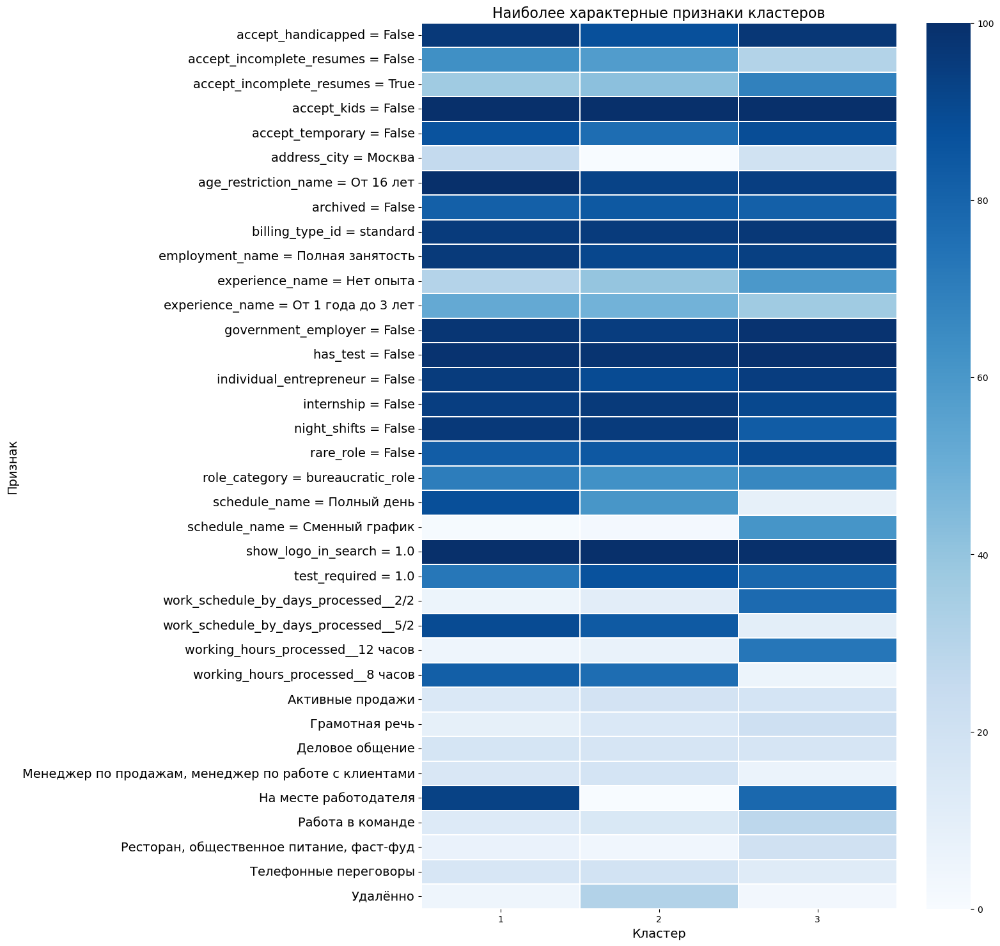

In [125]:
top_features_per_cluster = set()
dummy_cols = [c for c in df_cluster.columns if '__' in c]

for cluster_id in sorted(df_cluster['cluster_kmodes'].unique()):
    cluster_df = df_cluster[df_cluster['cluster_kmodes'] == cluster_id]

    feature_scores = []

    for col in categorical_cols:
        vc = cluster_df[col].value_counts(normalize=True)
        
        if len(vc) > 0:
            feature_scores.append((f"{col} = {vc.index[0]}", vc.iloc[0] * 100))

    # dummy
    dummy_means = cluster_df[dummy_cols].mean() * 100

    for col, pct in dummy_means.items():
        clean_name = (
            col
            .replace('professional_roles_processed__', '')
            .replace('key_skills_processed__', '')
            .replace('industries__', '')
            .replace('work_format_processed__', '')
            .replace('languages_processed__', '')
        )

        feature_scores.append((clean_name, pct))

    # top-25 для кластера
    top_features = sorted(feature_scores, key=lambda x: x[1], reverse=True)[:25]

    top_features_per_cluster.update([f[0] for f in top_features])


    

heatmap_data = []

for cluster_id in sorted(df_cluster['cluster_kmodes'].unique()):
    cluster_df = df_cluster[df_cluster['cluster_kmodes'] == cluster_id]

    for col in categorical_cols:
        vc = cluster_df[col].value_counts(normalize=True)

        for val, pct in vc.items():
            feature_name = f"{col} = {val}"

            if feature_name in top_features_per_cluster:
                heatmap_data.append({
                    'cluster': cluster_id,
                    'feature': feature_name,
                    'percent': pct * 100
                })

    dummy_means = cluster_df[dummy_cols].mean() * 100

    for col, pct in dummy_means.items():
        clean_name = (
            col
            .replace('professional_roles_processed__', '')
            .replace('key_skills_processed__', '')
            .replace('industries__', '')
            .replace('work_format_processed__', '')
            .replace('languages_processed__', '')
        )

        if clean_name in top_features_per_cluster:
            heatmap_data.append({
                'cluster': cluster_id,
                'feature': clean_name,
                'percent': pct
            })

heatmap_df = pd.DataFrame(heatmap_data)

pivot_df = heatmap_df.pivot_table(
    index='feature',
    columns='cluster',
    values='percent',
    fill_value=0
)

plt.figure(figsize=(12, 18))

ax = sns.heatmap(
    pivot_df,
    cmap='Blues',
    linewidths=0.3
)

ax.set_xticklabels([x + 1 for x in pivot_df.columns])

ax.set_yticklabels(
    ax.get_yticklabels(),
    fontsize=14

)

plt.title('Наиболее характерные признаки кластеров', fontsize=16)
plt.xlabel('Кластер', fontsize=14)
plt.ylabel('Признак', fontsize=14)

plt.show()

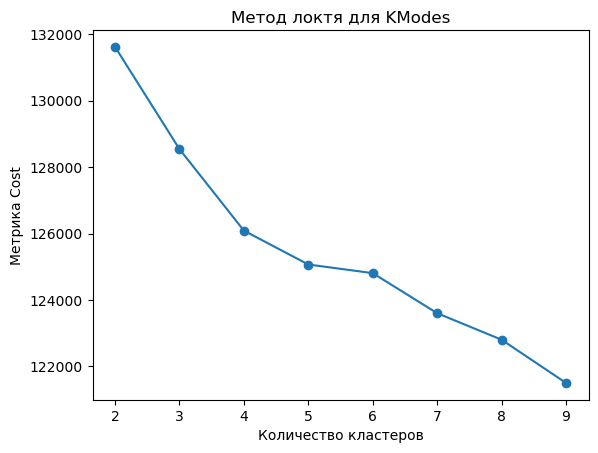

In [126]:
costs = []
K = range(2, 10)

for k in K:
    km = KModes(
        n_clusters=k,
        init='Huang',
        n_init=5,
        random_state=42
    )
    km.fit(X_cat)
    costs.append(km.cost_)

plt.plot(K, costs, marker='o')
plt.xlabel('Количество кластеров')
plt.ylabel('Метрика Cost')
plt.title('Метод локтя для KModes')
plt.show()

In [127]:
list_cols = [
    'key_skills_processed',
    'professional_roles_processed',
    'work_format_processed',
    'work_schedule_by_days_processed',
    'working_hours_processed',
    'working_time_modes_processed',
    'languages_processed',
    'fly_in_fly_out_duration_processed',
    'driver_license_types_processed',
    'industries'
]

top_limits = {
    'key_skills_processed': 100,
    'professional_roles_processed': 100,
    'industries': 100
}

categorical_cols = [
    'experience_name', 'billing_type_id', 'schedule_name', 
    'employment_name', 'address_city', 'show_logo_in_search', 'test_required', 
    'has_test', 'age_restriction_name', 'role_category', 'accept_handicapped',
    'accept_kids', 'archived', 'accept_incomplete_resumes', 'accept_temporary',
    'internship', 'night_shifts', 'government_employer', 'individual_entrepreneur', 'rare_role'
]

required_cols = ['key_skills_processed', 'professional_roles_processed', 'industries']

df_cluster = df_processed.copy()


for col in list_cols:
    df_cluster[col] = df_cluster[col].apply(lambda x: x if isinstance(x, list) else [])
    df_cluster[col] = df_cluster[col].apply(lambda lst: [x for x in lst if x.lower() != 'другое'])

for col in required_cols:
    if col in top_limits:
        top_n = top_limits[col]
        all_values = df_cluster[col].explode()
        top_categories = all_values.value_counts().head(top_n).index
        df_cluster[col] = df_cluster[col].apply(lambda lst: [x for x in lst if x in top_categories])

    df_cluster = df_cluster[df_cluster[col].apply(lambda x: isinstance(x, list) and len(x) > 0)]

for col in list_cols:
    mlb = MultiLabelBinarizer()
    encoded = pd.DataFrame(
        mlb.fit_transform(df_cluster[col]),
        columns=[f"{col}__{c}" for c in mlb.classes_],
        index=df_cluster.index
    )
    df_cluster = pd.concat([df_cluster, encoded], axis=1)
    df_cluster.drop(columns=[col], inplace=True)

dummy_cols_after = [c for c in df_cluster.columns if '__' in c]
cols_for_kmodes = dummy_cols_after + categorical_cols

X_cat = df_cluster[cols_for_kmodes].astype(str).values

km = KModes(
    n_clusters=4,
    init='Huang',
    n_init=5,
    verbose=1,
    random_state=42
)

clusters = km.fit_predict(X_cat)
df_cluster['cluster_kmodes'] = clusters

print("Размер итогового датасета:", df_cluster.shape)
df_cluster.head()

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 6577, cost: 131566.0
Run 1, iteration: 2/100, moves: 2319, cost: 126629.0
Run 1, iteration: 3/100, moves: 1527, cost: 126629.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 3747, cost: 126090.0
Run 2, iteration: 2/100, moves: 63, cost: 126090.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 3270, cost: 127370.0
Run 3, iteration: 2/100, moves: 57, cost: 127370.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 3208, cost: 128048.0
Run 4, iteration: 2/100, moves: 146, cost: 128048.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 3958, cost: 135445.0
Run 5, iteration: 2/100, moves: 657, cost: 135130.0
Run 5, iteration: 3/100

,id,employer_id,salary_gross,address_city,address_street,allow_messages,experience_name,billing_type_id,schedule_name,employment_name,...,industries__Управление и эксплуатация недвижимости,"industries__Фармацевтическая продукция (продвижение, оптовая торговля)",industries__Фармацевтическая продукция (производство),industries__Фиксированная связь,industries__Центры развлечения,"industries__Школа, детский сад","industries__Электронно-вычислительная, оптическая, контрольно-измерительная техника, радиоэлектроника, автоматика (продвижение, оптовая торговля)","industries__Электронно-вычислительная, оптическая, контрольно-измерительная техника, радиоэлектроника, автоматика (производство)",industries__Юридическое обслуживание,cluster_kmodes
35,129032107,11811833.0,0.0,NaN,NaN,True,Нет опыта,standard,Удаленная работа,Полная занятость,...,0,0,0,0,0,0,0,0,0,0
76,103630809,1631282.0,1.0,Тула,Калужское шоссе,True,Нет опыта,standard,Полный день,Полная занятость,...,0,0,0,0,0,0,0,0,0,0
138,128524237,796282.0,1.0,Москва,Нижняя Красносельская улица,True,От 1 года до 3 лет,standard,Полный день,Полная занятость,...,0,0,0,0,0,0,0,0,0,1
145,128723250,1035394.0,0.0,станица Выселки,NaN,False,Нет опыта,standard,Полный день,Полная занятость,...,0,0,0,0,0,0,0,0,0,0
245,129056371,114735.0,0.0,Иркутск,Ракитная улица,True,Нет опыта,standard,Сменный график,Полная занятость,...,0,0,0,0,0,0,0,0,0,2


In [128]:
for i in range(4):
    print(len(df_cluster[df_cluster['cluster_kmodes']==i]))

2791
3467
2855
1448


In [129]:
cluster_list = []

for cluster_id in range(4):  
    cluster_df = df_cluster[df_cluster['cluster_kmodes'] == cluster_id].copy()
    
    cluster_list.append({
        'cluster_id': cluster_id,
        'cluster_df': cluster_df
    })

numerical_cols = ['num_skills', 'description_length']
dummy_cols_after = [c for c in df_cluster.columns if '__' in c]
cols_to_analyze = dummy_cols_after + categorical_cols  

cluster_distributions = {}

for cl in cluster_list:
    cluster_id = cl['cluster_id']
    df = cl['cluster_df']
    
    distributions = {}
    
    for col in cols_to_analyze:
        counts = df[col].value_counts(dropna=False)
        percent = df[col].value_counts(normalize=True, dropna=False) * 100
        distributions[col] = pd.DataFrame({'count': counts, 'percent': percent.round(2)})
    
    for num_col in numerical_cols:
        stats = df[num_col].agg(['count', 'mean', 'median', 'min', 'max', 'std']).to_frame().T
        distributions[num_col] = stats.round(2)
    
    cluster_distributions[cluster_id] = distributions

for cl in cluster_list:
    cl_id = cl['cluster_id']
    display(cluster_distributions[cl_id]['has_test'])

,count,percent
has_test,,
False,2752,98.6
True,39,1.4


,count,percent
has_test,,
False,3405,98.21
True,62,1.79


,count,percent
has_test,,
False,2840,99.47
True,15,0.53


,count,percent
has_test,,
False,1439,99.38
True,9,0.62


In [130]:
changed_cols = [c for c in df_cluster.columns if c.startswith('industries')]

df = cluster_list[3]['cluster_df']

df_grouped = df.groupby('id')[changed_cols].max()

counts = df_grouped.sum().sort_values(ascending=False)
percent = (counts / len(df_grouped) * 100).sort_values(ascending=False)

summary_df = pd.DataFrame({
    'count': counts,
    'percent': percent.round(2)
})

summary_df.sort_values('percent', ascending=False).head(60)

,count,percent
"industries__Ресторан, общественное питание, фаст-фуд",118,8.15
industries__Лечебно-профилактические учреждения,92,6.35
industries__Агентские услуги в недвижимости,77,5.32
"industries__Техническое обслуживание, ремонт автомобилей",67,4.63
industries__Кадровые агентства,65,4.49
"industries__Строительство коммерческих объектов (торговые площади, офисные здания)",64,4.42
industries__Консалтинговые услуги,60,4.14
industries__Строительство жилищное,58,4.01
"industries__Автокомпоненты, запчасти, шины (продвижение, оптовая торговля)",56,3.87
industries__Розничная сеть (продуктовая),55,3.80


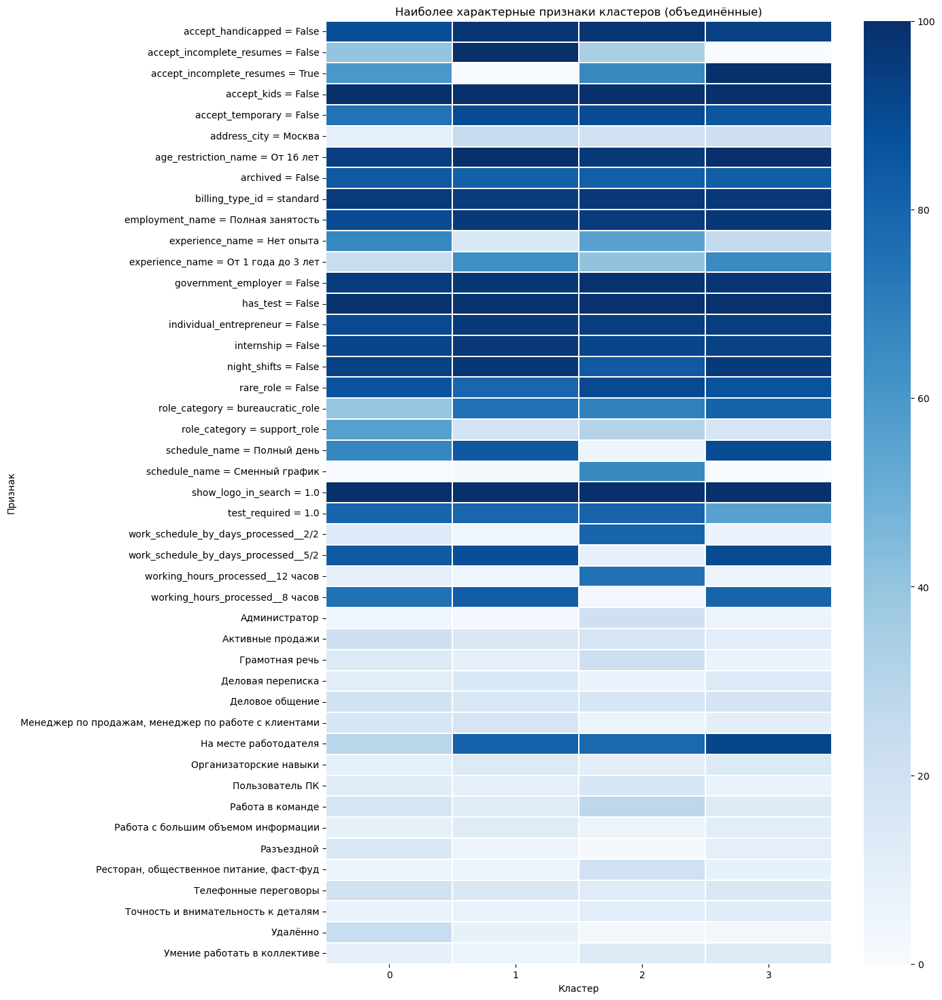

In [131]:
top_features_per_cluster = set()
dummy_cols = [c for c in df_cluster.columns if '__' in c]

for cluster_id in sorted(df_cluster['cluster_kmodes'].unique()):
    cluster_df = df_cluster[df_cluster['cluster_kmodes'] == cluster_id]

    feature_scores = []

    for col in categorical_cols:
        vc = cluster_df[col].value_counts(normalize=True)
        
        if len(vc) > 0:
            feature_scores.append((f"{col} = {vc.index[0]}", vc.iloc[0] * 100))

    # dummy
    dummy_means = cluster_df[dummy_cols].mean() * 100

    for col, pct in dummy_means.items():
        clean_name = (
            col
            .replace('professional_roles_processed__', '')
            .replace('key_skills_processed__', '')
            .replace('industries__', '')
            .replace('work_format_processed__', '')
            .replace('languages_processed__', '')
        )

        feature_scores.append((clean_name, pct))

    # top-30 для кластера
    top_features = sorted(feature_scores, key=lambda x: x[1], reverse=True)[:30]

    top_features_per_cluster.update([f[0] for f in top_features])


    

heatmap_data = []

for cluster_id in sorted(df_cluster['cluster_kmodes'].unique()):
    cluster_df = df_cluster[df_cluster['cluster_kmodes'] == cluster_id]

    for col in categorical_cols:
        vc = cluster_df[col].value_counts(normalize=True)

        for val, pct in vc.items():
            feature_name = f"{col} = {val}"

            if feature_name in top_features_per_cluster:
                heatmap_data.append({
                    'cluster': cluster_id,
                    'feature': feature_name,
                    'percent': pct * 100
                })

    dummy_means = cluster_df[dummy_cols].mean() * 100

    for col, pct in dummy_means.items():
        clean_name = (
            col
            .replace('professional_roles_processed__', '')
            .replace('key_skills_processed__', '')
            .replace('industries__', '')
            .replace('work_format_processed__', '')
            .replace('languages_processed__', '')
        )

        if clean_name in top_features_per_cluster:
            heatmap_data.append({
                'cluster': cluster_id,
                'feature': clean_name,
                'percent': pct
            })

heatmap_df = pd.DataFrame(heatmap_data)

pivot_df = heatmap_df.pivot_table(
    index='feature',
    columns='cluster',
    values='percent',
    fill_value=0
)

plt.figure(figsize=(12, 18))

sns.heatmap(
    pivot_df,
    cmap='Blues',
    linewidths=0.3
)

plt.title('Наиболее характерные признаки кластеров (объединённые)')
plt.xlabel('Кластер')
plt.ylabel('Признак')

plt.show()

### Регрессия

In [132]:
regression_cols = ['id', 'salary_gross', 'address_city', 'allow_messages', 'experience_name', 'schedule_name', 
                   'employment_name', 'show_contacts', 'accept_handicapped', 'archived', 'accept_incomplete_resumes',
                   'employer_name', 'accept_temporary', 'employer_accredited_it_employer', 'night_shifts', 'salary_range_frequency_name', 
                   'address_metro_station_name', 'driver_license_types_processed', 'fly_in_fly_out_duration_processed', 'languages_processed', 
                   'key_skills_processed', 'work_format_processed', 'working_hours_processed', 'work_schedule_by_days_processed', 'num_skills',
                   'description_length', 'government_employer', 'individual_entrepreneur', 'industries', 'internship', 'professional_roles_short_str',
                   'rare_role', 'role_category', 'salary_mean']

df_processed = df_processed[regression_cols]

In [133]:
exploded = df_processed.explode('industries')
exploded['industries'] = exploded['industries'].fillna('Не указано')
exploded

,id,salary_gross,address_city,allow_messages,experience_name,schedule_name,employment_name,show_contacts,accept_handicapped,archived,...,num_skills,description_length,government_employer,individual_entrepreneur,industries,internship,professional_roles_short_str,rare_role,role_category,salary_mean
0,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,0,1398,False,False,Коллекторская деятельность,False,Оператор call-центра,False,bureaucratic_role,58000.0
0,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,0,1398,False,False,Банк,False,Оператор call-центра,False,bureaucratic_role,58000.0
0,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,0,1398,False,False,"Интернет-компания (поисковики, платежные системы, соц.сети, информационно-познавательные и развлекательные ресурсы, продвижение сайтов и прочее)",False,Оператор call-центра,False,bureaucratic_role,58000.0
0,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,0,1398,False,False,Разработка программного обеспечения,False,Оператор call-центра,False,bureaucratic_role,58000.0
0,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,0,1398,False,False,"Системная интеграция, автоматизации технологических и бизнес-процессов предприятия, ИТ-консалтинг",False,Оператор call-центра,False,bureaucratic_role,58000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5844177,128928905,1.0,NaN,True,От 1 года до 3 лет,Полный день,Полная занятость,True,False,False,...,4,1275,False,False,"Школа, детский сад",False,Учитель,False,bureaucratic_role,70000.0
5844194,129180006,1.0,Челябинск,True,Нет опыта,Полный день,Частичная занятость,False,False,False,...,1,1287,False,False,Автомобильные перевозки,False,Другое,False,None,119000.0
5844286,125994145,0.0,Волжский,True,От 1 года до 3 лет,Полный день,Полная занятость,False,False,True,...,0,370,False,False,Не указано,False,Сварщик,False,bureaucratic_role,140000.0
5844287,128640989,0.0,Санкт-Петербург,True,От 1 года до 3 лет,Полный день,Частичная занятость,False,False,False,...,6,789,False,False,Не указано,False,Учитель,False,None,67500.0


In [134]:
mapping = pd.read_excel("mapping_of_industries.xlsx", sheet_name=1) 

df_merged = exploded.merge(mapping, how="left", left_on="industries", right_on="industries")

df_merged

,id,salary_gross,address_city,allow_messages,experience_name,schedule_name,employment_name,show_contacts,accept_handicapped,archived,...,description_length,government_employer,individual_entrepreneur,industries,internship,professional_roles_short_str,rare_role,role_category,salary_mean,industry_group
0,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,1398,False,False,Коллекторская деятельность,False,Оператор call-центра,False,bureaucratic_role,58000.0,Финансы
1,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,1398,False,False,Банк,False,Оператор call-центра,False,bureaucratic_role,58000.0,Финансы
2,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,1398,False,False,"Интернет-компания (поисковики, платежные системы, соц.сети, информационно-познавательные и развлекательные ресурсы, продвижение сайтов и прочее)",False,Оператор call-центра,False,bureaucratic_role,58000.0,IT и телеком
3,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,1398,False,False,Разработка программного обеспечения,False,Оператор call-центра,False,bureaucratic_role,58000.0,IT и телеком
4,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,1398,False,False,"Системная интеграция, автоматизации технологических и бизнес-процессов предприятия, ИТ-консалтинг",False,Оператор call-центра,False,bureaucratic_role,58000.0,IT и телеком
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91622,128928905,1.0,NaN,True,От 1 года до 3 лет,Полный день,Полная занятость,True,False,False,...,1275,False,False,"Школа, детский сад",False,Учитель,False,bureaucratic_role,70000.0,Образование
91623,129180006,1.0,Челябинск,True,Нет опыта,Полный день,Частичная занятость,False,False,False,...,1287,False,False,Автомобильные перевозки,False,Другое,False,None,119000.0,Логистика и транспорт
91624,125994145,0.0,Волжский,True,От 1 года до 3 лет,Полный день,Полная занятость,False,False,True,...,370,False,False,Не указано,False,Сварщик,False,bureaucratic_role,140000.0,NaN
91625,128640989,0.0,Санкт-Петербург,True,От 1 года до 3 лет,Полный день,Частичная занятость,False,False,False,...,789,False,False,Не указано,False,Учитель,False,None,67500.0,NaN


In [135]:
sector_counts = df_merged.groupby("id")["industry_group"].nunique()
sector_counts.value_counts()

industry_group
0    26979
1    19548
2     7397
3     3567
4      638
5       52
Name: count, dtype: int64

In [136]:
priority_list = [
    "Финансы",                    
    "Здравоохранение",            
    "Наука и исследования",       
    "Образование",                
    "Сельское хозяйство",         
    "Энергетика и ресурсы",       
    "Оптовая торговля",           
    "Ритейл",                     
    "IT и телеком",               
    "Производство",               
    "Гостинично-ресторанный бизнес",
    "Строительство и недвижимость",
    "Логистика и транспорт",
    "Государство и НКО",
    "Прочие услуги",
    "B2B услуги",
    "Медиа и развлечения"
]

priority_dict = {sector: i for i, sector in enumerate(priority_list, start=1)}
priority_dict

{'Финансы': 1,
 'Здравоохранение': 2,
 'Наука и исследования': 3,
 'Образование': 4,
 'Сельское хозяйство': 5,
 'Энергетика и ресурсы': 6,
 'Оптовая торговля': 7,
 'Ритейл': 8,
 'IT и телеком': 9,
 'Производство': 10,
 'Гостинично-ресторанный бизнес': 11,
 'Строительство и недвижимость': 12,
 'Логистика и транспорт': 13,
 'Государство и НКО': 14,
 'Прочие услуги': 15,
 'B2B услуги': 16,
 'Медиа и развлечения': 17}

In [137]:
df_merged["sector_priority"] = df_merged["industry_group"].map(priority_dict)
df_merged["sector_priority"] = df_merged["sector_priority"].fillna(100)
df_merged["industry_group"] = df_merged["industry_group"].fillna("Не указано")

df_merged

,id,salary_gross,address_city,allow_messages,experience_name,schedule_name,employment_name,show_contacts,accept_handicapped,archived,...,government_employer,individual_entrepreneur,industries,internship,professional_roles_short_str,rare_role,role_category,salary_mean,industry_group,sector_priority
0,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,False,False,Коллекторская деятельность,False,Оператор call-центра,False,bureaucratic_role,58000.0,Финансы,1.0
1,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,False,False,Банк,False,Оператор call-центра,False,bureaucratic_role,58000.0,Финансы,1.0
2,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,False,False,"Интернет-компания (поисковики, платежные системы, соц.сети, информационно-познавательные и развлекательные ресурсы, продвижение сайтов и прочее)",False,Оператор call-центра,False,bureaucratic_role,58000.0,IT и телеком,9.0
3,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,False,False,Разработка программного обеспечения,False,Оператор call-центра,False,bureaucratic_role,58000.0,IT и телеком,9.0
4,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,False,False,"Системная интеграция, автоматизации технологических и бизнес-процессов предприятия, ИТ-консалтинг",False,Оператор call-центра,False,bureaucratic_role,58000.0,IT и телеком,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91622,128928905,1.0,NaN,True,От 1 года до 3 лет,Полный день,Полная занятость,True,False,False,...,False,False,"Школа, детский сад",False,Учитель,False,bureaucratic_role,70000.0,Образование,4.0
91623,129180006,1.0,Челябинск,True,Нет опыта,Полный день,Частичная занятость,False,False,False,...,False,False,Автомобильные перевозки,False,Другое,False,None,119000.0,Логистика и транспорт,13.0
91624,125994145,0.0,Волжский,True,От 1 года до 3 лет,Полный день,Полная занятость,False,False,True,...,False,False,Не указано,False,Сварщик,False,bureaucratic_role,140000.0,Не указано,100.0
91625,128640989,0.0,Санкт-Петербург,True,От 1 года до 3 лет,Полный день,Частичная занятость,False,False,False,...,False,False,Не указано,False,Учитель,False,None,67500.0,Не указано,100.0


In [138]:
main_sector = df_merged.loc[df_merged.groupby("id")["sector_priority"].idxmin(), ["id", "industry_group"]]

In [139]:
sector_counts = main_sector.groupby("id")["industry_group"].nunique()  
sector_counts.value_counts()

industry_group
1    58181
Name: count, dtype: int64

In [140]:
df_merged

,id,salary_gross,address_city,allow_messages,experience_name,schedule_name,employment_name,show_contacts,accept_handicapped,archived,...,government_employer,individual_entrepreneur,industries,internship,professional_roles_short_str,rare_role,role_category,salary_mean,industry_group,sector_priority
0,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,False,False,Коллекторская деятельность,False,Оператор call-центра,False,bureaucratic_role,58000.0,Финансы,1.0
1,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,False,False,Банк,False,Оператор call-центра,False,bureaucratic_role,58000.0,Финансы,1.0
2,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,False,False,"Интернет-компания (поисковики, платежные системы, соц.сети, информационно-познавательные и развлекательные ресурсы, продвижение сайтов и прочее)",False,Оператор call-центра,False,bureaucratic_role,58000.0,IT и телеком,9.0
3,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,False,False,Разработка программного обеспечения,False,Оператор call-центра,False,bureaucratic_role,58000.0,IT и телеком,9.0
4,128956748,1.0,Саратов,False,Нет опыта,Полный день,Полная занятость,False,False,False,...,False,False,"Системная интеграция, автоматизации технологических и бизнес-процессов предприятия, ИТ-консалтинг",False,Оператор call-центра,False,bureaucratic_role,58000.0,IT и телеком,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91622,128928905,1.0,NaN,True,От 1 года до 3 лет,Полный день,Полная занятость,True,False,False,...,False,False,"Школа, детский сад",False,Учитель,False,bureaucratic_role,70000.0,Образование,4.0
91623,129180006,1.0,Челябинск,True,Нет опыта,Полный день,Частичная занятость,False,False,False,...,False,False,Автомобильные перевозки,False,Другое,False,None,119000.0,Логистика и транспорт,13.0
91624,125994145,0.0,Волжский,True,От 1 года до 3 лет,Полный день,Полная занятость,False,False,True,...,False,False,Не указано,False,Сварщик,False,bureaucratic_role,140000.0,Не указано,100.0
91625,128640989,0.0,Санкт-Петербург,True,От 1 года до 3 лет,Полный день,Частичная занятость,False,False,False,...,False,False,Не указано,False,Учитель,False,None,67500.0,Не указано,100.0


In [141]:
df_merged.loc[df_merged.groupby("id")["sector_priority"].idxmin(), ["id", "industry_group"]]

,id,industry_group
63466,11445422,Ритейл
18861,31947837,Строительство и недвижимость
53597,34259161,Оптовая торговля
27995,37023745,Строительство и недвижимость
44222,42137724,Оптовая торговля
...,...,...
62152,129252168,Не указано
32121,129252174,B2B услуги
31532,129252176,Не указано
34749,129252182,B2B услуги


In [142]:
df_merged = df_merged.loc[
    df_merged.groupby("id")["sector_priority"].idxmin()
].reset_index(drop=True)

df_merged

,id,salary_gross,address_city,allow_messages,experience_name,schedule_name,employment_name,show_contacts,accept_handicapped,archived,...,government_employer,individual_entrepreneur,industries,internship,professional_roles_short_str,rare_role,role_category,salary_mean,industry_group,sector_priority
0,11445422,0.0,NaN,True,Нет опыта,Полный день,Частичная занятость,True,False,False,...,False,False,"Розничная сеть (парфюмерия, косметика)",False,Менеджер по продажам,False,bureaucratic_role,42500.0,Ритейл,8.0
1,31947837,0.0,NaN,True,Нет опыта,Полный день,Полная занятость,True,False,False,...,False,False,Агентские услуги в недвижимости,False,Агент по недвижимости,False,support_role,140000.0,Строительство и недвижимость,12.0
2,34259161,1.0,NaN,True,Нет опыта,Полный день,Полная занятость,True,False,False,...,False,False,"Мебель (продвижение, оптовая торговля)",False,Менеджер по продажам,False,bureaucratic_role,175000.0,Оптовая торговля,7.0
3,37023745,1.0,Новочебоксарск,True,Нет опыта,Полный день,Полная занятость,True,False,False,...,False,False,Агентские услуги в недвижимости,False,Агент по недвижимости,False,bureaucratic_role,135000.0,Строительство и недвижимость,12.0
4,42137724,0.0,Санкт-Петербург,True,От 1 года до 3 лет,Полный день,Полная занятость,True,False,False,...,False,False,"Сантехника (продвижение, оптовая торговля)",False,Менеджер по продажам,False,support_role,275000.0,Оптовая торговля,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58176,129252168,0.0,Москва,True,От 3 до 6 лет,Полный день,Полная занятость,False,False,False,...,False,False,Не указано,False,Воспитатель,False,support_role,160000.0,Не указано,100.0
58177,129252174,0.0,NaN,True,От 1 года до 3 лет,Удаленная работа,Полная занятость,False,True,False,...,False,False,"Маркетинговые, рекламные, BTL, дизайнерские, Event-, PR-агентства, организация выставок",False,Менеджер по продажам,False,bureaucratic_role,100000.0,B2B услуги,16.0
58178,129252176,1.0,Санкт-Петербург,True,От 1 года до 3 лет,Полный день,Полная занятость,True,False,False,...,False,False,Не указано,False,Делопроизводитель,False,bureaucratic_role,71500.0,Не указано,100.0
58179,129252182,0.0,Москва,True,Более 6 лет,Полный день,Полная занятость,True,False,False,...,False,False,Кадровые агентства,False,Бухгалтер,False,bureaucratic_role,210000.0,B2B услуги,16.0


In [143]:
df_merged = df_merged[df_merged['industry_group']!='Не указано']
df_merged.drop(columns=['industries', 'sector_priority'])
df_merged

,id,salary_gross,address_city,allow_messages,experience_name,schedule_name,employment_name,show_contacts,accept_handicapped,archived,...,government_employer,individual_entrepreneur,industries,internship,professional_roles_short_str,rare_role,role_category,salary_mean,industry_group,sector_priority
0,11445422,0.0,NaN,True,Нет опыта,Полный день,Частичная занятость,True,False,False,...,False,False,"Розничная сеть (парфюмерия, косметика)",False,Менеджер по продажам,False,bureaucratic_role,42500.0,Ритейл,8.0
1,31947837,0.0,NaN,True,Нет опыта,Полный день,Полная занятость,True,False,False,...,False,False,Агентские услуги в недвижимости,False,Агент по недвижимости,False,support_role,140000.0,Строительство и недвижимость,12.0
2,34259161,1.0,NaN,True,Нет опыта,Полный день,Полная занятость,True,False,False,...,False,False,"Мебель (продвижение, оптовая торговля)",False,Менеджер по продажам,False,bureaucratic_role,175000.0,Оптовая торговля,7.0
3,37023745,1.0,Новочебоксарск,True,Нет опыта,Полный день,Полная занятость,True,False,False,...,False,False,Агентские услуги в недвижимости,False,Агент по недвижимости,False,bureaucratic_role,135000.0,Строительство и недвижимость,12.0
4,42137724,0.0,Санкт-Петербург,True,От 1 года до 3 лет,Полный день,Полная занятость,True,False,False,...,False,False,"Сантехника (продвижение, оптовая торговля)",False,Менеджер по продажам,False,support_role,275000.0,Оптовая торговля,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58168,129252085,0.0,Нижний Новгород,True,От 3 до 6 лет,Полный день,Полная занятость,True,False,False,...,False,False,Розничная торговля автомобилями (дилерский центр),False,Бухгалтер,False,bureaucratic_role,80000.0,Ритейл,8.0
58170,129252119,0.0,Челябинск,True,Нет опыта,Гибкий график,Полная занятость,False,False,False,...,False,True,Центры развлечения,True,Администратор,False,None,62500.0,Медиа и развлечения,17.0
58174,129252155,0.0,Москва,True,От 3 до 6 лет,Полный день,Полная занятость,False,False,False,...,False,False,Строительство жилищное,False,Финансовый аналитик,True,bureaucratic_role,250000.0,Строительство и недвижимость,12.0
58177,129252174,0.0,NaN,True,От 1 года до 3 лет,Удаленная работа,Полная занятость,False,True,False,...,False,False,"Маркетинговые, рекламные, BTL, дизайнерские, Event-, PR-агентства, организация выставок",False,Менеджер по продажам,False,bureaucratic_role,100000.0,B2B услуги,16.0


In [144]:
result = df_merged.merge(df_ai_vacancies, on='id', how='inner')\
.groupby('industry_group')['id'].nunique()

percent = (result / result.sum() * 100).round(2)
percent.sort_values(ascending=False)

industry_group
IT и телеком                     35.71
B2B услуги                       17.86
Образование                      10.71
Ритейл                           10.71
Оптовая торговля                  7.14
Прочие услуги                     7.14
Гостинично-ресторанный бизнес     3.57
Медиа и развлечения               3.57
Финансы                           3.57
Name: id, dtype: float64

In [145]:
result = df_merged.merge(df_ai_descriptions, on='id', how='inner')\
.groupby('industry_group')['id'].nunique()

percent = (result / result.sum() * 100).round(2)
percent.sort_values(ascending=False)

industry_group
IT и телеком                     27.62
Финансы                          18.20
B2B услуги                       13.92
Оптовая торговля                 10.06
Ритейл                            7.71
Образование                       5.57
Строительство и недвижимость      4.07
Здравоохранение                   3.00
Производство                      2.57
Прочие услуги                     2.14
Гостинично-ресторанный бизнес     1.71
Наука и исследования              1.28
Государство и НКО                 0.86
Медиа и развлечения               0.86
Логистика и транспорт             0.21
Энергетика и ресурсы              0.21
Name: id, dtype: float64

### Уменьшение кардинальности признаков

In [146]:
for col in df_merged.columns:
    if col == 'id':
        continue

    print(col)

    if df_merged[col].apply(lambda x: isinstance(x, list)).any():
        unique_count = df_merged[col].explode().nunique()
    else:
        unique_count = df_merged[col].nunique()

    print(unique_count)

salary_gross
2
address_city
2613
allow_messages
2
experience_name
4
schedule_name
5
employment_name
3
show_contacts
2
accept_handicapped
2
archived
2
accept_incomplete_resumes
2
employer_name
12106
accept_temporary
2
employer_accredited_it_employer
2
night_shifts
2
salary_range_frequency_name
5
address_metro_station_name
414
driver_license_types_processed
9
fly_in_fly_out_duration_processed
10
languages_processed
20
key_skills_processed
7264
work_format_processed
4
working_hours_processed
14
work_schedule_by_days_processed
14
num_skills
31
description_length
3444
government_employer
2
individual_entrepreneur
2
industries
286
internship
2
professional_roles_short_str
173
rare_role
2
role_category
3
salary_mean
2445
industry_group
17
sector_priority
17


In [147]:
df_merged['address_city'].value_counts()[df_merged['address_city'].value_counts()>=50] 

address_city
Москва             4650
Санкт-Петербург    2372
Екатеринбург        800
Краснодар           655
Казань              547
                   ... 
Вологда              56
Одинцово             55
Курган               54
Белгород             54
Новокузнецк          52
Name: count, Length: 63, dtype: int64

In [148]:
df_merged['employer_name'].value_counts()[df_merged['employer_name'].value_counts()>=20]  

employer_name
Пятёрочка                                 2052
WILDBERRIES                                926
МАГНИТ, Розничная сеть                     566
Департамент Ф53                            155
Ростелеком                                 139
                                          ... 
Рекруто                                     20
Федеральная сетевая компания – Россети      20
Линсофтверпродакшн                          20
ЭстэйтЛига                                  20
Перекрёсток                                 20
Name: count, Length: 90, dtype: int64

In [149]:
df_merged['address_metro_station_name'].value_counts()[df_merged['address_metro_station_name'].value_counts()>=50]

address_metro_station_name
Горьковская               174
Геологическая             156
Балтийская                141
Ладожская                 128
Деловой центр             122
Белорусская               119
Заельцовская              112
Академическая              99
Адмиралтейская             99
Библиотека им.Ленина       97
Динамо                     92
Аметьево                   88
Комендантский проспект     88
Выборгская                 87
Ботаническая               87
Автозаводская              84
Беговая                    84
Владимирская               80
Маяковская                 73
Добрынинская               70
Китай-город                69
Бауманская                 66
Бухарестская               64
Василеостровская           63
Козья слобода              63
Московская                 60
Баррикадная                57
Площадь Ленина             55
Верхние Котлы              55
Алабинская                 55
Крылатское                 53
Автово                     53
Авиастроитель

In [150]:
df_merged['key_skills_processed'].explode().value_counts() 

key_skills_processed
Работа в команде         2284
Деловое общение          2264
Активные продажи         1991
Телефонные переговоры    1919
Грамотная речь           1709
                         ... 
Gamedev                     1
MacOS                       1
Spine 2d                    1
GDevelop                    1
Продажа в переписке         1
Name: count, Length: 7264, dtype: int64

In [151]:
df_merged['professional_roles_short_str'].value_counts()[df_merged['professional_roles_short_str'].value_counts()>=50] 

professional_roles_short_str
Другое                  2458
Менеджер по продажам    2163
Продавец-консультант    1703
Администратор           1460
Упаковщик               1161
                        ... 
Менеджер продукта         58
Фотограф                  55
Супервайзер               52
Аудитор                   51
Методист                  50
Name: count, Length: 97, dtype: int64

In [152]:
# df_merged['key_skills_processed'].explode().value_counts().to_excel('skills_short.xlsx')

In [153]:
df_merged

,id,salary_gross,address_city,allow_messages,experience_name,schedule_name,employment_name,show_contacts,accept_handicapped,archived,...,government_employer,individual_entrepreneur,industries,internship,professional_roles_short_str,rare_role,role_category,salary_mean,industry_group,sector_priority
0,11445422,0.0,NaN,True,Нет опыта,Полный день,Частичная занятость,True,False,False,...,False,False,"Розничная сеть (парфюмерия, косметика)",False,Менеджер по продажам,False,bureaucratic_role,42500.0,Ритейл,8.0
1,31947837,0.0,NaN,True,Нет опыта,Полный день,Полная занятость,True,False,False,...,False,False,Агентские услуги в недвижимости,False,Агент по недвижимости,False,support_role,140000.0,Строительство и недвижимость,12.0
2,34259161,1.0,NaN,True,Нет опыта,Полный день,Полная занятость,True,False,False,...,False,False,"Мебель (продвижение, оптовая торговля)",False,Менеджер по продажам,False,bureaucratic_role,175000.0,Оптовая торговля,7.0
3,37023745,1.0,Новочебоксарск,True,Нет опыта,Полный день,Полная занятость,True,False,False,...,False,False,Агентские услуги в недвижимости,False,Агент по недвижимости,False,bureaucratic_role,135000.0,Строительство и недвижимость,12.0
4,42137724,0.0,Санкт-Петербург,True,От 1 года до 3 лет,Полный день,Полная занятость,True,False,False,...,False,False,"Сантехника (продвижение, оптовая торговля)",False,Менеджер по продажам,False,support_role,275000.0,Оптовая торговля,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58168,129252085,0.0,Нижний Новгород,True,От 3 до 6 лет,Полный день,Полная занятость,True,False,False,...,False,False,Розничная торговля автомобилями (дилерский центр),False,Бухгалтер,False,bureaucratic_role,80000.0,Ритейл,8.0
58170,129252119,0.0,Челябинск,True,Нет опыта,Гибкий график,Полная занятость,False,False,False,...,False,True,Центры развлечения,True,Администратор,False,None,62500.0,Медиа и развлечения,17.0
58174,129252155,0.0,Москва,True,От 3 до 6 лет,Полный день,Полная занятость,False,False,False,...,False,False,Строительство жилищное,False,Финансовый аналитик,True,bureaucratic_role,250000.0,Строительство и недвижимость,12.0
58177,129252174,0.0,NaN,True,От 1 года до 3 лет,Удаленная работа,Полная занятость,False,True,False,...,False,False,"Маркетинговые, рекламные, BTL, дизайнерские, Event-, PR-агентства, организация выставок",False,Менеджер по продажам,False,bureaucratic_role,100000.0,B2B услуги,16.0


In [154]:
skill_map = {
    'продаж': 'Продажи',
    'команд': 'Командная работа',
    'общен': 'Коммуникация',
    'переписк': 'Коммуникация',
    'переговор': 'Коммуникация',
    'грамотность': 'Коммуникация',
    'речь': 'Коммуникация',
    'организа': 'Организация процессов',
    'клиент':'Работа с клиентами или их данными',
    '1с': '1C',
    'excel': 'Excel',
    'sql': 'SQL',
    'бренд': 'Работа с брендом',
    'smm': 'SMM',
    'документ': 'Работа с документами',
    'api': 'API',
    'стратег': 'Выстраивание стратегии',
    'crm': 'CRM',
    'дизайн': 'Дизайн',
    'логистик': 'Логистика',
    'склад': 'Складские операции',
    'git': 'Git',
    'бухгалтер':'Бухгалтерский учёт/отчётность'
}

def replace_skills(skills):
    if not isinstance(skills, list):
        return []

    result = []
    seen = set()

    for skill in skills:
        skill_lower = skill.lower()
        matched = False

        for pattern, group in skill_map.items():
            if pattern in skill_lower:
                matched = True
                if group not in seen:
                    result.append(group)
                    seen.add(group)

        if not matched:
            if skill not in seen:
                result.append(skill)
                seen.add(skill)

    return result

In [155]:
df_merged['key_skills_grouped'] = df_merged['key_skills_processed'].apply(replace_skills)

/var/folders/yw/j_hz9v6107z3z2yhw4flcx6c0000gn/T/ipykernel_32430/2432659533.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_merged['key_skills_grouped'] = df_merged['key_skills_processed'].apply(replace_skills)


In [156]:
df_merged[['key_skills_processed', 'key_skills_grouped']].head(20)

,key_skills_processed,key_skills_grouped
0,NaN,[]
1,NaN,[]
2,NaN,[]
3,NaN,[]
4,"[B2B Продажи, SPIN-продажи, Активные продажи, Заключение договоров, Подготовка коммерческих предложений, Прямые продажи, Развитие продаж, Телефонные переговоры, Теплые продажи, Управление дебиторской задолженностью, Холодные продажи]","[Продажи, Заключение договоров, Подготовка коммерческих предложений, Коммуникация, Управление дебиторской задолженностью]"
5,"[Общественное питание, Санпин, Технологии производства блюд]","[Общественное питание, Санпин, Технологии производства блюд]"
7,NaN,[]
8,"[Активные продажи, Клиентоориентированность, Привлечение инвестиций, Работа с клиентами, Сопровождение клиентов, Ценные бумаги]","[Продажи, Работа с клиентами или их данными, Привлечение инвестиций, Ценные бумаги]"
9,NaN,[]
10,NaN,[]


In [157]:
df_merged['key_skills_grouped'].explode().value_counts()

key_skills_grouped
Коммуникация                         5851
Продажи                              3438
Командная работа                     3027
Работа с документами                 2978
Работа с клиентами или их данными    2881
                                     ... 
pr коммуникации                         1
Written Translation                     1
Turbo Pascal                            1
GDP                                     1
приобретение новых проектов             1
Name: count, Length: 6431, dtype: int64

In [158]:
def keep_top_categories(series, top_n=100, other_label='Другое', na_label='Не указано'):
    vc = series.value_counts()

    top = set(vc.head(top_n).index)

    def map_value(x):
        if pd.isna(x) or x == '':
            return na_label
        if x in top:
            return x
        return other_label

    return series.apply(map_value)

In [159]:
df_merged_short = df_merged.copy()

In [160]:
df_merged_short['address_city'] = keep_top_categories(df_merged_short['address_city'], top_n=100)

In [161]:
df_merged_short['address_city'].value_counts()

address_city
Другое             7069
Не указано         5238
Москва             4650
Санкт-Петербург    2372
Екатеринбург        800
                   ... 
Солнечногорск        28
Котельники           28
Электросталь         28
Сыктывкар            28
Сергиев Посад        28
Name: count, Length: 102, dtype: int64

In [162]:
df_merged_short['employer_name'] = keep_top_categories(df_merged_short['employer_name'], top_n=100)

In [163]:
df_merged_short['employer_name'].value_counts()

employer_name
Другое                                      24200
Пятёрочка                                    2052
WILDBERRIES                                   926
МАГНИТ, Розничная сеть                        566
Департамент Ф53                               155
                                            ...  
Магна                                          19
ЭФКО                                           19
Новосибирский электровозоремонтный завод       19
FITNESS HOUSE                                  19
Retail Personal                                18
Name: count, Length: 101, dtype: int64

In [164]:
df_merged_short['address_metro_station_name'] = keep_top_categories(df_merged_short['address_metro_station_name'], top_n=100)

In [165]:
df_merged_short['address_metro_station_name'].value_counts()

address_metro_station_name
Не указано       22870
Другое            3006
Горьковская        174
Геологическая      156
Балтийская         141
                 ...  
Домодедовская       28
Тульская            28
Войковская          28
Бутырская           28
Аминьевская         28
Name: count, Length: 102, dtype: int64

In [166]:
df_merged_short['professional_roles_short_str'] = keep_top_categories(df_merged_short['professional_roles_short_str'], top_n=100)

In [167]:
df_merged_short['professional_roles_short_str'].value_counts()

professional_roles_short_str
Другое                  4102
Менеджер по продажам    2163
Продавец-консультант    1703
Администратор           1460
Упаковщик               1161
                        ... 
Аудитор                   51
Методист                  50
Финансовый менеджер       49
Event-менеджер            49
Ассистент врача           48
Name: count, Length: 100, dtype: int64

In [168]:
skills = df_merged_short['key_skills_grouped'].explode()
top_skills = set(skills.value_counts().head(100).index)

In [169]:
top_skills

{'1C',
 'Adobe Photoshop',
 'AutoCAD',
 'CRM',
 'Excel',
 'Git',
 'SMM',
 'SQL',
 'Администрирование',
 'Аналитическое мышление',
 'Английский язык',
 'Бухгалтерский учёт/отчётность',
 'Внимательность',
 'Внутренние коммуникации',
 'Внутренний контроль',
 'Водительское удостоверение категории B',
 'Выкладка товаров',
 'Выстраивание стратегии',
 'Выявление потребностей',
 'Деловая коммуникация',
 'Деловая этика',
 'Делопроизводство',
 'Дизайн',
 'Договорная работа',
 'Заключение договоров',
 'Закупки',
 'Знание устройства автомобиля',
 'Инвентаризация',
 'Исполнительность',
 'Кадровое делопроизводство',
 'Кассовые операции',
 'Командная работа',
 'Коммуникабельность',
 'Коммуникация',
 'Консультирование',
 'Контроль качества',
 'Контроль отгрузок',
 'Контроль сроков годности',
 'Креативность',
 'Логистика',
 'Мерчандайзинг',
 'Многозадачность',
 'Монтаж оборудования',
 'Мотивация персонала',
 'Навыки презентации',
 'Обеспечение жизнедеятельности офиса',
 'Обслуживание покупателей',
 'Об

In [170]:
def map_skills_list(lst):
    if not isinstance(lst, list):
        return ['Не указано']

    res = []
    for x in lst:
        if pd.isna(x) or x == '':
            continue
        if x in top_skills:
            res.append(x)
        else:
            res.append('Другое')

    return list(set(res)) if res else ['Не указано']

In [171]:
df_merged_short['key_skills_grouped'] = df_merged_short['key_skills_grouped'].apply(map_skills_list)

In [172]:
df_merged_short

,id,salary_gross,address_city,allow_messages,experience_name,schedule_name,employment_name,show_contacts,accept_handicapped,archived,...,individual_entrepreneur,industries,internship,professional_roles_short_str,rare_role,role_category,salary_mean,industry_group,sector_priority,key_skills_grouped
0,11445422,0.0,Не указано,True,Нет опыта,Полный день,Частичная занятость,True,False,False,...,False,"Розничная сеть (парфюмерия, косметика)",False,Менеджер по продажам,False,bureaucratic_role,42500.0,Ритейл,8.0,[Не указано]
1,31947837,0.0,Не указано,True,Нет опыта,Полный день,Полная занятость,True,False,False,...,False,Агентские услуги в недвижимости,False,Агент по недвижимости,False,support_role,140000.0,Строительство и недвижимость,12.0,[Не указано]
2,34259161,1.0,Не указано,True,Нет опыта,Полный день,Полная занятость,True,False,False,...,False,"Мебель (продвижение, оптовая торговля)",False,Менеджер по продажам,False,bureaucratic_role,175000.0,Оптовая торговля,7.0,[Не указано]
3,37023745,1.0,Другое,True,Нет опыта,Полный день,Полная занятость,True,False,False,...,False,Агентские услуги в недвижимости,False,Агент по недвижимости,False,bureaucratic_role,135000.0,Строительство и недвижимость,12.0,[Не указано]
4,42137724,0.0,Санкт-Петербург,True,От 1 года до 3 лет,Полный день,Полная занятость,True,False,False,...,False,"Сантехника (продвижение, оптовая торговля)",False,Менеджер по продажам,False,support_role,275000.0,Оптовая торговля,7.0,"[Заключение договоров, Подготовка коммерческих предложений, Коммуникация, Продажи, Другое]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58168,129252085,0.0,Нижний Новгород,True,От 3 до 6 лет,Полный день,Полная занятость,True,False,False,...,False,Розничная торговля автомобилями (дилерский центр),False,Бухгалтер,False,bureaucratic_role,80000.0,Ритейл,8.0,"[Бухгалтерский учёт/отчётность, 1C]"
58170,129252119,0.0,Челябинск,True,Нет опыта,Гибкий график,Полная занятость,False,False,False,...,True,Центры развлечения,True,Администратор,False,None,62500.0,Медиа и развлечения,17.0,[Не указано]
58174,129252155,0.0,Москва,True,От 3 до 6 лет,Полный день,Полная занятость,False,False,False,...,False,Строительство жилищное,False,Другое,True,bureaucratic_role,250000.0,Строительство и недвижимость,12.0,"[Английский язык, Выстраивание стратегии, Другое, Организация процессов]"
58177,129252174,0.0,Не указано,True,От 1 года до 3 лет,Удаленная работа,Полная занятость,False,True,False,...,False,"Маркетинговые, рекламные, BTL, дизайнерские, Event-, PR-агентства, организация выставок",False,Менеджер по продажам,False,bureaucratic_role,100000.0,B2B услуги,16.0,"[Коммуникация, Продажи, Работа с клиентами или их данными, CRM]"


In [173]:
df_merged_short['key_skills_grouped'].explode().value_counts()

key_skills_grouped
Не указано                           15286
Другое                               11337
Коммуникация                          5851
Продажи                               3438
Командная работа                      3027
                                     ...  
Работа в условиях многозадачности      138
Планирование                           136
оформление заказов                     135
Креативность                           133
Управленческая отчетность              133
Name: count, Length: 102, dtype: int64

In [174]:
df_merged_short = df_merged_short.drop(columns='key_skills_processed')

In [175]:
df_merged_short = df_merged_short.drop(columns=['industries', 'sector_priority'])

In [176]:
for col in df_merged_short.columns:
    if col == 'id':
        continue

    print(col)

    if df_merged_short[col].apply(lambda x: isinstance(x, list)).any():
        unique_count = df_merged_short[col].explode().nunique()
    else:
        unique_count = df_merged_short[col].nunique()

    print(unique_count)

salary_gross
2
address_city
102
allow_messages
2
experience_name
4
schedule_name
5
employment_name
3
show_contacts
2
accept_handicapped
2
archived
2
accept_incomplete_resumes
2
employer_name
101
accept_temporary
2
employer_accredited_it_employer
2
night_shifts
2
salary_range_frequency_name
5
address_metro_station_name
102
driver_license_types_processed
9
fly_in_fly_out_duration_processed
10
languages_processed
20
work_format_processed
4
working_hours_processed
14
work_schedule_by_days_processed
14
num_skills
31
description_length
3444
government_employer
2
individual_entrepreneur
2
internship
2
professional_roles_short_str
100
rare_role
2
role_category
3
salary_mean
2445
industry_group
17
key_skills_grouped
102


In [177]:
df_merged_short[df_merged_short['driver_license_types_processed'].notna()]['driver_license_types_processed']

72                     [B]
162                    [B]
282                    [B]
377                    [B]
447      [B, BE, C, CE, E]
               ...        
57356                  [B]
57830                  [B]
57849           [C, CE, E]
58083                  [B]
58092                  [B]
Name: driver_license_types_processed, Length: 868, dtype: object

In [178]:
df_merged_short[df_merged_short['fly_in_fly_out_duration_processed'].notna()]['fly_in_fly_out_duration_processed']

91                       [30]
127                      [30]
148                  [Другое]
184                      [15]
235                      [30]
                 ...         
55434                    [60]
55634                [60, 90]
55643                    [60]
56010                [Другое]
56935    [15, 20, 30, 60, 90]
Name: fly_in_fly_out_duration_processed, Length: 797, dtype: object

In [179]:
df_merged_short[df_merged_short['languages_processed'].notna()]['languages_processed']

443      [Английский]
561      [Английский]
572      [Английский]
642      [Английский]
692      [Английский]
             ...     
57647    [Английский]
57708    [Английский]
57985       [Русский]
58108    [Английский]
58144    [Английский]
Name: languages_processed, Length: 797, dtype: object

In [180]:
df_merged_short[df_merged_short['work_format_processed'].notna()]['work_format_processed']

4                [На месте работодателя]
5                [На месте работодателя]
7                [На месте работодателя]
8                [На месте работодателя]
9        [Гибрид, На месте работодателя]
                      ...               
58168            [На месте работодателя]
58170            [На месте работодателя]
58174    [Гибрид, На месте работодателя]
58177                         [Удалённо]
58179            [На месте работодателя]
Name: work_format_processed, Length: 23220, dtype: object

In [181]:
df_merged_short[df_merged_short['working_hours_processed'].notna()]['working_hours_processed']

0         [8 часов, 9 часов]
1                  [8 часов]
2        [11 часов, 8 часов]
3                  [8 часов]
4                  [8 часов]
                ...         
58168              [8 часов]
58170             [12 часов]
58174              [8 часов]
58177              [8 часов]
58179              [8 часов]
Name: working_hours_processed, Length: 30018, dtype: object

In [182]:
df_merged_short[df_merged_short['work_schedule_by_days_processed'].notna()]['work_schedule_by_days_processed']

0             [2/2, 4/2]
1                  [5/2]
2        [2/2, 4/3, 5/2]
3                  [5/2]
4                  [5/2]
              ...       
58168              [5/2]
58170         [2/2, 3/3]
58174              [5/2]
58177              [5/2]
58179              [5/2]
Name: work_schedule_by_days_processed, Length: 30018, dtype: object

In [183]:
def process_list_column(x, multi_label):
    if not isinstance(x, list) or len(x) == 0:
        return 'Не указано'

    if len(x) == 1:
        return x[0]

    return multi_label

In [184]:
multi_requirements_cols = [
    'driver_license_types_processed',
    'languages_processed'
]

for col in multi_requirements_cols:
    df_merged_short[col] = df_merged_short[col].apply(
        lambda x: process_list_column(x, 'Множественные требования')
    )

In [185]:
df_merged_short[df_merged_short['languages_processed']!='Не указано']['languages_processed']

443      Английский
561      Английский
572      Английский
642      Английский
692      Английский
            ...    
57647    Английский
57708    Английский
57985       Русский
58108    Английский
58144    Английский
Name: languages_processed, Length: 797, dtype: object

In [186]:
multi_choice_cols = [
    'fly_in_fly_out_duration_processed',
    'work_format_processed',
    'working_hours_processed',
    'work_schedule_by_days_processed'
]

for col in multi_choice_cols:
    df_merged_short[col] = df_merged_short[col].apply(
        lambda x: process_list_column(x, 'Множественный выбор')
    )

In [187]:
df_merged_short[df_merged_short['work_schedule_by_days_processed']!='Не указано']['work_schedule_by_days_processed']

0        Множественный выбор
1                        5/2
2        Множественный выбор
3                        5/2
4                        5/2
                ...         
58168                    5/2
58170    Множественный выбор
58174                    5/2
58177                    5/2
58179                    5/2
Name: work_schedule_by_days_processed, Length: 30018, dtype: object

In [188]:
for col in df_merged_short.columns:
    if col == 'id':
        continue

    print(col)

    if df_merged_short[col].apply(lambda x: isinstance(x, list)).any():
        unique_count = df_merged_short[col].explode().nunique()
    else:
        unique_count = df_merged_short[col].nunique()

    print(unique_count)

salary_gross
2
address_city
102
allow_messages
2
experience_name
4
schedule_name
5
employment_name
3
show_contacts
2
accept_handicapped
2
archived
2
accept_incomplete_resumes
2
employer_name
101
accept_temporary
2
employer_accredited_it_employer
2
night_shifts
2
salary_range_frequency_name
5
address_metro_station_name
102
driver_license_types_processed
8
fly_in_fly_out_duration_processed
11
languages_processed
7
work_format_processed
6
working_hours_processed
16
work_schedule_by_days_processed
16
num_skills
31
description_length
3444
government_employer
2
individual_entrepreneur
2
internship
2
professional_roles_short_str
100
rare_role
2
role_category
3
salary_mean
2445
industry_group
17
key_skills_grouped
102


In [189]:
df_merged_short['salary_gross'].value_counts(dropna=False)

salary_gross
0.0    19659
1.0    11542
NaN        1
Name: count, dtype: int64

In [190]:
non_list_cols = [
    col for col in df_merged_short.columns
    if not df_merged_short[col].apply(lambda x: isinstance(x, list)).any()
]

In [191]:
for col in non_list_cols:
    print(f"\n{col}")
    print(df_merged_short[col].value_counts(dropna=False))


id
id
11445422     1
128904438    1
128905696    1
128905570    1
128905566    1
            ..
128413690    1
128413640    1
128413616    1
128413582    1
129252182    1
Name: count, Length: 31202, dtype: int64

salary_gross
salary_gross
0.0    19659
1.0    11542
NaN        1
Name: count, dtype: int64

address_city
address_city
Другое             7069
Не указано         5238
Москва             4650
Санкт-Петербург    2372
Екатеринбург        800
                   ... 
Солнечногорск        28
Котельники           28
Электросталь         28
Сыктывкар            28
Сергиев Посад        28
Name: count, Length: 102, dtype: int64

allow_messages
allow_messages
True     27150
False     4052
Name: count, dtype: int64

experience_name
experience_name
Нет опыта             13985
От 1 года до 3 лет    13155
От 3 до 6 лет          3498
Более 6 лет             564
Name: count, dtype: int64

schedule_name
schedule_name
Полный день         20337
Сменный график       4818
Гибкий график        3007


In [192]:
for col in non_list_cols:
    print(f"\n{col}")
    print(df_merged_short[col].isna().mean())


id
0.0

salary_gross
3.204922761361451e-05

address_city
0.0

allow_messages
0.0

experience_name
0.0

schedule_name
0.0

employment_name
0.0

show_contacts
0.0

accept_handicapped
0.0

archived
0.0

accept_incomplete_resumes
0.0

employer_name
0.0

accept_temporary
0.0

employer_accredited_it_employer
0.0

night_shifts
0.0

salary_range_frequency_name
0.3129927568745593

address_metro_station_name
0.0

driver_license_types_processed
0.0

fly_in_fly_out_duration_processed
0.0

languages_processed
0.0

work_format_processed
0.0

working_hours_processed
0.0

work_schedule_by_days_processed
0.0

num_skills
0.0

description_length
0.0

government_employer
0.0

individual_entrepreneur
0.0

internship
0.0

professional_roles_short_str
0.0

rare_role
0.0

role_category
0.31151849240433305

salary_mean
0.0

industry_group
0.0


In [193]:
cat_cols = df_merged_short.select_dtypes(include=['category']).columns
cat_cols

Index(['experience_name'], dtype='object')

In [194]:
df_merged_short['experience_name'] = df_merged_short['experience_name'].astype('object')

In [195]:
for col in non_list_cols:
    df_merged_short[col] = df_merged_short[col].fillna('Не указано')

In [196]:
for col in non_list_cols:
    print(f"\n{col}")
    print(df_merged_short[col].isna().mean())


id
0.0

salary_gross
0.0

address_city
0.0

allow_messages
0.0

experience_name
0.0

schedule_name
0.0

employment_name
0.0

show_contacts
0.0

accept_handicapped
0.0

archived
0.0

accept_incomplete_resumes
0.0

employer_name
0.0

accept_temporary
0.0

employer_accredited_it_employer
0.0

night_shifts
0.0

salary_range_frequency_name
0.0

address_metro_station_name
0.0

driver_license_types_processed
0.0

fly_in_fly_out_duration_processed
0.0

languages_processed
0.0

work_format_processed
0.0

working_hours_processed
0.0

work_schedule_by_days_processed
0.0

num_skills
0.0

description_length
0.0

government_employer
0.0

individual_entrepreneur
0.0

internship
0.0

professional_roles_short_str
0.0

rare_role
0.0

role_category
0.0

salary_mean
0.0

industry_group
0.0


In [197]:
list_cols = [
    col for col in df_merged_short.columns
    if df_merged_short[col].apply(lambda x: isinstance(x, list)).any()
]

for col in list_cols:
    empty_pct = df_merged_short[col].apply(
        lambda x: isinstance(x, list) and len(x) == 0
    ).mean() * 100

    print(col, empty_pct)

key_skills_grouped 0.0


In [200]:
df_merged_short['salary_mean'].quantile(0.99)

np.float64(390000.0)

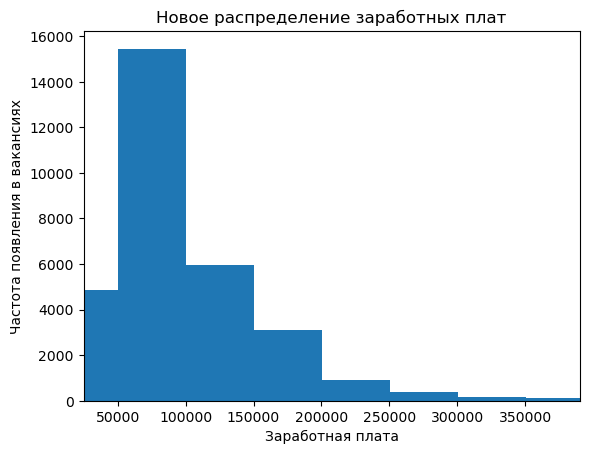

In [201]:
plt.figure()
plt.hist(df_merged_short['salary_mean'], bins=100)
plt.title('Новое распределение заработных плат')
plt.xlabel('Заработная плата')
plt.ylabel('Частота появления в вакансиях')
plt.xlim(df_merged_short['salary_mean'].quantile(0.01), df_merged_short['salary_mean'].quantile(0.99))

plt.show()

In [202]:
low = df_merged_short['salary_mean'].quantile(0.01)
high = df_merged_short['salary_mean'].quantile(0.99)

df_merged_short['salary_mean_clipped'] = df_merged_short['salary_mean'].clip(low, high)

In [203]:
df_merged_short['salary_mean_clipped'].max()

390000.0

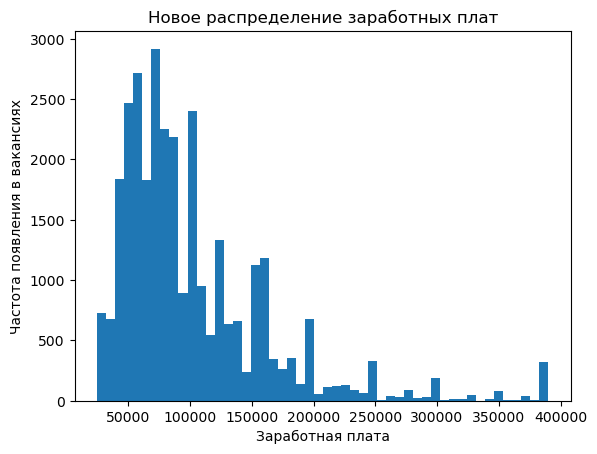

In [204]:
plt.figure()
plt.hist(df_merged_short['salary_mean_clipped'], bins=50)
plt.title('Новое распределение заработных плат')
plt.xlabel('Заработная плата')
plt.ylabel('Частота появления в вакансиях')

plt.show()

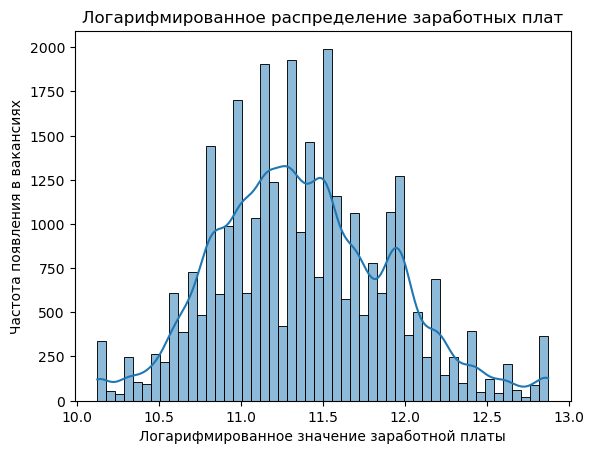

In [205]:
plt.figure()
sns.histplot(np.log1p(df_merged_short['salary_mean_clipped']), bins=50, kde=True)

plt.title('Логарифмированное распределение заработных плат')
plt.xlabel('Логарифмированное значение заработной платы')
plt.ylabel('Частота появления в вакансиях')

plt.show()

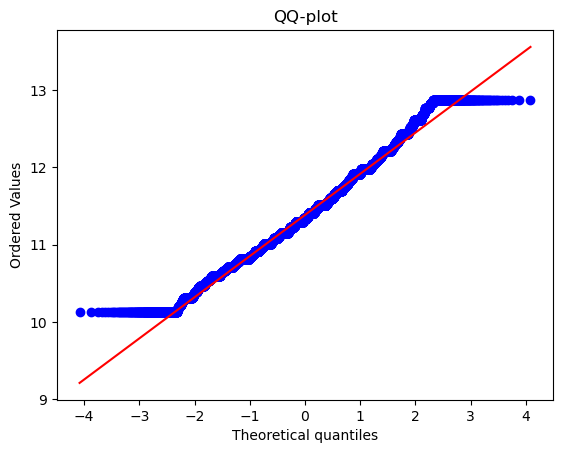

In [206]:
import scipy.stats as stats
data = np.log1p(df_merged_short['salary_mean_clipped'])

plt.figure()
stats.probplot(data, dist="norm", plot=plt)

plt.title("QQ-plot")
plt.show()

In [207]:
stats.kstest(data, 'norm', args=(data.mean(), data.std()))

KstestResult(statistic=np.float64(0.05556669698378491), pvalue=np.float64(3.525294880673811e-84), statistic_location=np.float64(11.51293546492023), statistic_sign=np.int8(1))

In [208]:
stats.shapiro(data)

/opt/anaconda3/lib/python3.13/site-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 31202.
  res = hypotest_fun_out(*samples, **kwds)


ShapiroResult(statistic=np.float64(0.9901728098287371), pvalue=np.float64(1.2188409371939692e-40))

In [209]:
df_merged_short['salary_mean_log'] = np.log1p(df_merged_short['salary_mean_clipped'])

In [210]:
df_merged_short

,id,salary_gross,address_city,allow_messages,experience_name,schedule_name,employment_name,show_contacts,accept_handicapped,archived,...,individual_entrepreneur,internship,professional_roles_short_str,rare_role,role_category,salary_mean,industry_group,key_skills_grouped,salary_mean_clipped,salary_mean_log
0,11445422,0.0,Не указано,True,Нет опыта,Полный день,Частичная занятость,True,False,False,...,False,False,Менеджер по продажам,False,bureaucratic_role,42500.0,Ритейл,[Не указано],42500.0,10.657283
1,31947837,0.0,Не указано,True,Нет опыта,Полный день,Полная занятость,True,False,False,...,False,False,Агент по недвижимости,False,support_role,140000.0,Строительство и недвижимость,[Не указано],140000.0,11.849405
2,34259161,1.0,Не указано,True,Нет опыта,Полный день,Полная занятость,True,False,False,...,False,False,Менеджер по продажам,False,bureaucratic_role,175000.0,Оптовая торговля,[Не указано],175000.0,12.072547
3,37023745,1.0,Другое,True,Нет опыта,Полный день,Полная занятость,True,False,False,...,False,False,Агент по недвижимости,False,bureaucratic_role,135000.0,Строительство и недвижимость,[Не указано],135000.0,11.813037
4,42137724,0.0,Санкт-Петербург,True,От 1 года до 3 лет,Полный день,Полная занятость,True,False,False,...,False,False,Менеджер по продажам,False,support_role,275000.0,Оптовая торговля,"[Заключение договоров, Подготовка коммерческих предложений, Коммуникация, Продажи, Другое]",275000.0,12.524530
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58168,129252085,0.0,Нижний Новгород,True,От 3 до 6 лет,Полный день,Полная занятость,True,False,False,...,False,False,Бухгалтер,False,bureaucratic_role,80000.0,Ритейл,"[Бухгалтерский учёт/отчётность, 1C]",80000.0,11.289794
58170,129252119,0.0,Челябинск,True,Нет опыта,Гибкий график,Полная занятость,False,False,False,...,True,True,Администратор,False,Не указано,62500.0,Медиа и развлечения,[Не указано],62500.0,11.042938
58174,129252155,0.0,Москва,True,От 3 до 6 лет,Полный день,Полная занятость,False,False,False,...,False,False,Другое,True,bureaucratic_role,250000.0,Строительство и недвижимость,"[Английский язык, Выстраивание стратегии, Другое, Организация процессов]",250000.0,12.429220
58177,129252174,0.0,Не указано,True,От 1 года до 3 лет,Удаленная работа,Полная занятость,False,True,False,...,False,False,Менеджер по продажам,False,bureaucratic_role,100000.0,B2B услуги,"[Коммуникация, Продажи, Работа с клиентами или их данными, CRM]",100000.0,11.512935


In [211]:
df_merged_short.columns

Index(['id', 'salary_gross', 'address_city', 'allow_messages',
       'experience_name', 'schedule_name', 'employment_name', 'show_contacts',
       'accept_handicapped', 'archived', 'accept_incomplete_resumes',
       'employer_name', 'accept_temporary', 'employer_accredited_it_employer',
       'night_shifts', 'salary_range_frequency_name',
       'address_metro_station_name', 'driver_license_types_processed',
       'fly_in_fly_out_duration_processed', 'languages_processed',
       'work_format_processed', 'working_hours_processed',
       'work_schedule_by_days_processed', 'num_skills', 'description_length',
       'government_employer', 'individual_entrepreneur', 'internship',
       'professional_roles_short_str', 'rare_role', 'role_category',
       'salary_mean', 'industry_group', 'key_skills_grouped',
       'salary_mean_clipped', 'salary_mean_log'],
      dtype='object')

In [212]:
df_merged_short['salary_gross'] = df_merged_short['salary_gross'].astype(bool)
df_merged_short['employer_accredited_it_employer'] = df_merged_short['employer_accredited_it_employer'].astype(bool)

In [213]:
y = df_merged_short['salary_mean_log']
drop_cols = [
    'id',
    'salary_mean',
    'salary_mean_clipped',
    'salary_mean_log'
]
X = df_merged_short.drop(columns=drop_cols)

In [214]:
X['employer_accredited_it_employer']

0        False
1        False
2        False
3        False
4        False
         ...  
58168    False
58170    False
58174    False
58177    False
58179    False
Name: employer_accredited_it_employer, Length: 31202, dtype: bool

### Модель на ограниченном пространстве признаков

In [215]:
cat_cols = X.select_dtypes(include='object').columns
num_cols = X.select_dtypes(include=['int', 'float']).columns
bool_cols = X.select_dtypes(include='bool').columns

In [216]:
cat_cols

Index(['address_city', 'experience_name', 'schedule_name', 'employment_name',
       'employer_name', 'salary_range_frequency_name',
       'address_metro_station_name', 'driver_license_types_processed',
       'fly_in_fly_out_duration_processed', 'languages_processed',
       'work_format_processed', 'working_hours_processed',
       'work_schedule_by_days_processed', 'professional_roles_short_str',
       'role_category', 'industry_group', 'key_skills_grouped'],
      dtype='object')

In [217]:
num_cols

Index(['num_skills', 'description_length'], dtype='object')

In [218]:
bool_cols

Index(['salary_gross', 'allow_messages', 'show_contacts', 'accept_handicapped',
       'archived', 'accept_incomplete_resumes', 'accept_temporary',
       'employer_accredited_it_employer', 'night_shifts',
       'government_employer', 'individual_entrepreneur', 'internship',
       'rare_role'],
      dtype='object')

In [219]:
mlb = MultiLabelBinarizer()

skills_encoded = mlb.fit_transform(X['key_skills_grouped'])

skills_df = pd.DataFrame(
    skills_encoded,
    columns=mlb.classes_,
    index=X.index
)

skills_df

,1C,Adobe Photoshop,AutoCAD,CRM,Excel,Git,SMM,SQL,Администрирование,Аналитическое мышление,...,Умение работать в коллективе,Управление персоналом,Управленческая отчетность,Управленческие навыки,Учет ТМЦ,Учет остатков,Учет товаров,Чтение чертежей,исполнение поручений руководителя,оформление заказов
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58168,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
58170,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
58174,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
58177,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [220]:
X = X.drop(columns=['key_skills_grouped'])
X = pd.concat([X, skills_df], axis=1)

In [221]:
X 

,salary_gross,address_city,allow_messages,experience_name,schedule_name,employment_name,show_contacts,accept_handicapped,archived,accept_incomplete_resumes,...,Умение работать в коллективе,Управление персоналом,Управленческая отчетность,Управленческие навыки,Учет ТМЦ,Учет остатков,Учет товаров,Чтение чертежей,исполнение поручений руководителя,оформление заказов
0,False,Не указано,True,Нет опыта,Полный день,Частичная занятость,True,False,False,True,...,0,0,0,0,0,0,0,0,0,0
1,False,Не указано,True,Нет опыта,Полный день,Полная занятость,True,False,False,True,...,0,0,0,0,0,0,0,0,0,0
2,True,Не указано,True,Нет опыта,Полный день,Полная занятость,True,False,False,False,...,0,0,0,0,0,0,0,0,0,0
3,True,Другое,True,Нет опыта,Полный день,Полная занятость,True,False,False,False,...,0,0,0,0,0,0,0,0,0,0
4,False,Санкт-Петербург,True,От 1 года до 3 лет,Полный день,Полная занятость,True,False,False,False,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58168,False,Нижний Новгород,True,От 3 до 6 лет,Полный день,Полная занятость,True,False,False,False,...,0,0,0,0,0,0,0,0,0,0
58170,False,Челябинск,True,Нет опыта,Гибкий график,Полная занятость,False,False,False,True,...,0,0,0,0,0,0,0,0,0,0
58174,False,Москва,True,От 3 до 6 лет,Полный день,Полная занятость,False,False,False,False,...,0,0,0,0,0,0,0,0,0,0
58177,False,Не указано,True,От 1 года до 3 лет,Удаленная работа,Полная занятость,False,True,False,True,...,0,0,0,0,0,0,0,0,0,0


In [222]:
scale_cols = ['num_skills', 'description_length']

other_num_cols = [col for col in X.select_dtypes(include=['int', 'float', 'bool']).columns
                  if col not in scale_cols]

cat_cols = X.select_dtypes(include='object').columns

In [223]:
other_num_cols

['salary_gross',
 'allow_messages',
 'show_contacts',
 'accept_handicapped',
 'archived',
 'accept_incomplete_resumes',
 'accept_temporary',
 'employer_accredited_it_employer',
 'night_shifts',
 'government_employer',
 'individual_entrepreneur',
 'internship',
 'rare_role',
 '1C',
 'Adobe Photoshop',
 'AutoCAD',
 'CRM',
 'Excel',
 'Git',
 'SMM',
 'SQL',
 'Администрирование',
 'Аналитическое мышление',
 'Английский язык',
 'Бухгалтерский учёт/отчётность',
 'Внимательность',
 'Внутренние коммуникации',
 'Внутренний контроль',
 'Водительское удостоверение категории B',
 'Выкладка товаров',
 'Выстраивание стратегии',
 'Выявление потребностей',
 'Деловая коммуникация',
 'Деловая этика',
 'Делопроизводство',
 'Дизайн',
 'Договорная работа',
 'Другое',
 'Заключение договоров',
 'Закупки',
 'Знание устройства автомобиля',
 'Инвентаризация',
 'Исполнительность',
 'Кадровое делопроизводство',
 'Кассовые операции',
 'Командная работа',
 'Коммуникабельность',
 'Коммуникация',
 'Консультирование',


In [224]:
cat_cols

Index(['address_city', 'experience_name', 'schedule_name', 'employment_name',
       'employer_name', 'salary_range_frequency_name',
       'address_metro_station_name', 'driver_license_types_processed',
       'fly_in_fly_out_duration_processed', 'languages_processed',
       'work_format_processed', 'working_hours_processed',
       'work_schedule_by_days_processed', 'professional_roles_short_str',
       'role_category', 'industry_group'],
      dtype='object')

In [225]:
'Другое' in df_merged_short['key_skills_grouped'].explode().unique()

True

In [226]:
X

,salary_gross,address_city,allow_messages,experience_name,schedule_name,employment_name,show_contacts,accept_handicapped,archived,accept_incomplete_resumes,...,Умение работать в коллективе,Управление персоналом,Управленческая отчетность,Управленческие навыки,Учет ТМЦ,Учет остатков,Учет товаров,Чтение чертежей,исполнение поручений руководителя,оформление заказов
0,False,Не указано,True,Нет опыта,Полный день,Частичная занятость,True,False,False,True,...,0,0,0,0,0,0,0,0,0,0
1,False,Не указано,True,Нет опыта,Полный день,Полная занятость,True,False,False,True,...,0,0,0,0,0,0,0,0,0,0
2,True,Не указано,True,Нет опыта,Полный день,Полная занятость,True,False,False,False,...,0,0,0,0,0,0,0,0,0,0
3,True,Другое,True,Нет опыта,Полный день,Полная занятость,True,False,False,False,...,0,0,0,0,0,0,0,0,0,0
4,False,Санкт-Петербург,True,От 1 года до 3 лет,Полный день,Полная занятость,True,False,False,False,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58168,False,Нижний Новгород,True,От 3 до 6 лет,Полный день,Полная занятость,True,False,False,False,...,0,0,0,0,0,0,0,0,0,0
58170,False,Челябинск,True,Нет опыта,Гибкий график,Полная занятость,False,False,False,True,...,0,0,0,0,0,0,0,0,0,0
58174,False,Москва,True,От 3 до 6 лет,Полный день,Полная занятость,False,False,False,False,...,0,0,0,0,0,0,0,0,0,0
58177,False,Не указано,True,От 1 года до 3 лет,Удаленная работа,Полная занятость,False,True,False,True,...,0,0,0,0,0,0,0,0,0,0


In [227]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

Метрики:
MAE:  35535.94
RMSE: 53621.11
R2:   0.260


,признак,коэффициент,p-value
x1,cat__experience_name_Нет опыта,-0.7661,0.0000
x6,cat__schedule_name_Сменный график,-0.6289,0.0000
x2,cat__experience_name_От 1 года до 3 лет,-0.5787,0.0000
x7,cat__schedule_name_Удаленная работа,-0.5732,0.0000
x5,cat__schedule_name_Полный день,-0.5388,0.0000
x4,cat__schedule_name_Гибкий график,-0.4511,0.0000
x22,cat__industry_group_Образование,-0.4227,0.0000
x9,cat__employment_name_Частичная занятость,-0.3514,0.0000
x37,num__employer_accredited_it_employer,0.3416,0.0000
x20,cat__industry_group_Медиа и развлечения,-0.3370,0.0000


/var/folders/yw/j_hz9v6107z3z2yhw4flcx6c0000gn/T/ipykernel_32430/2235436710.py:88: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


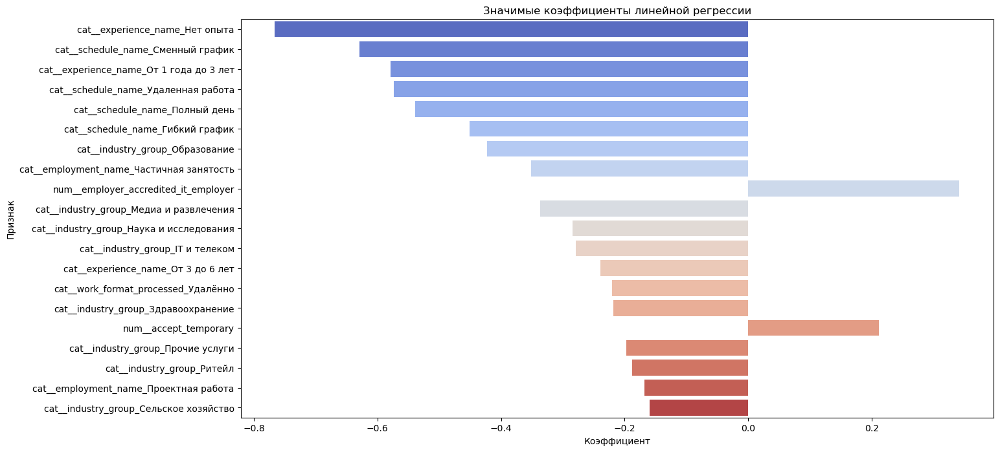

In [229]:
selected_cat_cols = [
    'experience_name',
    'schedule_name',
    'employment_name',
    'work_format_processed',
    'industry_group',
]

selected_other_num_cols = [
    'salary_gross',
    'accept_handicapped',
    'accept_incomplete_resumes',
    'accept_temporary',
    'employer_accredited_it_employer',
    'night_shifts',
    'government_employer',
    'individual_entrepreneur'
]

selected_scale_cols = scale_cols

preprocessor_small = ColumnTransformer(
    transformers=[
        ('cat',OneHotEncoder(handle_unknown='ignore', drop='first'),
            selected_cat_cols),
        ('scale', StandardScaler(), selected_scale_cols),
        ('num', 'passthrough', selected_other_num_cols)
    ]
)

model_small = Pipeline(steps=[
    ('preprocessor', preprocessor_small),
    ('regressor', LinearRegression())
])

model_small.fit(X_train, y_train)
y_pred_log = model_small.predict(X_test)

y_pred = np.expm1(y_pred_log)
y_true = np.expm1(y_test)


mae = mean_absolute_error(y_true, y_pred)
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
r2 = r2_score(y_true, y_pred)

print("Метрики:")
print(f"MAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R2:   {r2:.3f}")


X_transformed = model_small.named_steps['preprocessor'].transform(X_train)

feature_names = model_small.named_steps[
    'preprocessor'
].get_feature_names_out()

X_sm = sm.add_constant(
    X_transformed,
    has_constant='add'
)

ols_model = sm.OLS(y_train, X_sm).fit(cov_type='HC1')

results_df = pd.DataFrame({
    'признак': ['const'] + list(feature_names),
    'коэффициент': ols_model.params.round(4),
    'p-value': ols_model.pvalues.round(4)
})


results_sig = results_df[
    (results_df['признак'] != 'const') &
    (results_df['p-value'] < 0.05)
]

results_sig = results_sig.sort_values(
    by='коэффициент',
    key=abs,
    ascending=False
)

display(results_sig.head(20))

plt.figure(figsize=(15, 8))

sns.barplot(
    data=results_sig.head(20),
    x='коэффициент',
    y='признак',
    palette='coolwarm'
)

plt.title(
    'Значимые коэффициенты линейной регрессии'
)

plt.xlabel('Коэффициент')
plt.ylabel('Признак')

plt.show()

In [230]:
print(ols_model.summary())

                            OLS Regression Results                            
Dep. Variable:        salary_mean_log   R-squared:                       0.339
Model:                            OLS   Adj. R-squared:                  0.338
Method:                 Least Squares   F-statistic:                     327.9
Date:                Tue, 16 Jun 2026   Prob (F-statistic):               0.00
Time:                        23:44:55   Log-Likelihood:                -14660.
No. Observations:               24961   AIC:                         2.940e+04
Df Residuals:                   24920   BIC:                         2.974e+04
Df Model:                          40                                         
Covariance Type:                  HC1                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.7536      0.042    304.740      0.0

In [231]:
def short_name(x):
    prefixes = [
        'cat__experience_name_',
        'cat__schedule_name_',
        'cat__employment_name_',
        'cat__work_format_processed_',
        'cat__industry_group_',
    ]

    for p in prefixes:
        if x.startswith(p):
            return x.replace(p, '')

    return x

feature_names = [
    short_name(x)
    for x in results_df['признак'][1:]
]

ols_model.model.exog_names[:] = ["const"] + feature_names

stargazer = Stargazer([ols_model])
HTML(stargazer.render_html())

In [234]:
y_train_pred_log = model_small.predict(X_train)
y_train_pred = np.expm1(y_train_pred_log)
y_train_true = np.expm1(y_train)
r2_train = r2_score(y_train_true, y_train_pred)
r2_train

0.27903852090188974

In [235]:
r2_train = r2_score(y_train, y_train_pred_log)
r2_train

0.3388263151082693

In [236]:
print(results_df)

                                                 признак  коэффициент  p-value
const                                              const      12.7536   0.0000
x1                        cat__experience_name_Нет опыта      -0.7661   0.0000
x2               cat__experience_name_От 1 года до 3 лет      -0.5787   0.0000
x3                    cat__experience_name_От 3 до 6 лет      -0.2389   0.0000
x4                      cat__schedule_name_Гибкий график      -0.4511   0.0000
x5                        cat__schedule_name_Полный день      -0.5388   0.0000
x6                     cat__schedule_name_Сменный график      -0.6289   0.0000
x7                   cat__schedule_name_Удаленная работа      -0.5732   0.0000
x8                 cat__employment_name_Проектная работа      -0.1684   0.0046
x9              cat__employment_name_Частичная занятость      -0.3514   0.0000
x10       cat__work_format_processed_Множественный выбор       0.0221   0.4958
x11     cat__work_format_processed_На месте работода

In [248]:
selected_cat_cols = [
    'experience_name',
    'work_format_processed',
    'employment_name',
    'schedule_name',
    'industry_group']

selected_other_num_cols = [
    'salary_gross',
    'accept_handicapped',
    'accept_incomplete_resumes',
    'accept_temporary',
    'employer_accredited_it_employer',
    'night_shifts',
    'government_employer',
    'individual_entrepreneur'
]

selected_scale_cols = scale_cols

X_train_inter = X_train.copy()
X_test_inter = X_test.copy()

interaction_pairs = [
    ('experience_name', 'industry_group'),
    ('employment_name', 'industry_group'),
    ('work_format_processed', 'industry_group')
]

for col1, col2 in interaction_pairs:
    new_col = f'{col1}__X__{col2}'

    X_train_inter[new_col] = (
        X_train_inter[col1].astype(str)
        + '__' +
        X_train_inter[col2].astype(str)
    )

    X_test_inter[new_col] = (
        X_test_inter[col1].astype(str)
        + '__' +
        X_test_inter[col2].astype(str)
    )

interaction_cols = [
    f'{c1}__X__{c2}'
    for c1, c2 in interaction_pairs
]

selected_cat_cols_extended = (
    selected_cat_cols +
    interaction_cols
)



preprocessor_small = ColumnTransformer(
    transformers=[
        ('cat',OneHotEncoder(handle_unknown='ignore', drop='first'), selected_cat_cols_extended),
        ('scale',StandardScaler(), selected_scale_cols),
        ('num', 'passthrough', selected_other_num_cols)]
)


lasso_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor_small),
    ('regressor', Lasso(max_iter=10000))
])


param_grid = {
    'regressor__alpha': [0.001, 0.01, 0.1, 1]
}

grid = GridSearchCV(
    estimator=lasso_pipeline,
    param_grid=param_grid,
    cv=5,
    scoring='r2',
    n_jobs=-1
)

grid.fit(X_train_inter, y_train)

best_model = grid.best_estimator_

print("Лучший alpha:", grid.best_params_)
print("Лучший CV R2:", round(grid.best_score_, 3))



y_pred_log = best_model.predict(X_test_inter)

y_pred = np.expm1(y_pred_log)
y_true = np.expm1(y_test)

mae = mean_absolute_error(y_true, y_pred)
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
r2 = r2_score(y_true, y_pred)

print("\nМетрики:")
print(f"MAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R2:   {r2:.3f}")


coef = best_model.named_steps['regressor'].coef_
feature_names = best_model.named_steps['preprocessor'].get_feature_names_out()

mask = coef != 0
selected_features = feature_names[mask]

print("Отобрано признаков:", len(selected_features))


X_transformed = best_model.named_steps['preprocessor'].transform(X_train_inter).toarray()

X_selected = X_transformed[:, mask]

X_sm = sm.add_constant(X_selected, has_constant='add')

ols_model = sm.OLS(y_train, X_sm).fit(cov_type='HC1')


results_df = pd.DataFrame({
    'признак': ['const'] + list(selected_features),
    'коэффициент': ols_model.params,
    'p-value': ols_model.pvalues
})


results_df = results_df.sort_values(
    by='коэффициент',
    key=lambda x: x.abs(),
    ascending=False
)

results_df.head(20)



results_df = pd.DataFrame({
    'признак': ['const'] + list(selected_features),
    'коэффициент': ols_model.params.round(4),
    'p-value': ols_model.pvalues.round(4)
})

results_sig = results_df[
    (results_df['признак'] != 'const') &
    (results_df['p-value'] < 0.05)
]

results_sig = results_sig.sort_values(
    by='коэффициент',
    key=abs,
    ascending=False
)

display(results_sig.head(30))

/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [7] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [6, 7] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [7] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [6, 7] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWa

Лучший alpha: {'regressor__alpha': 0.001}
Лучший CV R2: 0.353

Метрики:
MAE:  35046.76
RMSE: 52705.63
R2:   0.285
Отобрано признаков: 51


/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [7] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


,признак,коэффициент,p-value
x1,cat__experience_name_Нет опыта,-0.8219,0.0000
x11,cat__schedule_name_Сменный график,-0.6390,0.0000
x2,cat__experience_name_От 1 года до 3 лет,-0.5898,0.0000
x25,cat__experience_name__X__industry_group_Нет опыта__Строительство и недвижимость,0.5830,0.0000
x12,cat__schedule_name_Удаленная работа,-0.5798,0.0000
x34,cat__employment_name__X__industry_group_Частичная занятость__Логистика и транспорт,0.5626,0.0000
x10,cat__schedule_name_Полный день,-0.5581,0.0000
x9,cat__schedule_name_Гибкий график,-0.4679,0.0000
x8,cat__employment_name_Частичная занятость,-0.3729,0.0000
x49,num__employer_accredited_it_employer,0.3252,0.0000


                            OLS Regression Results                            
Dep. Variable:        salary_mean_log   R-squared:                       0.367
Model:                            OLS   Adj. R-squared:                  0.365
Method:                 Least Squares   F-statistic:                     284.0
Date:                Wed, 17 Jun 2026   Prob (F-statistic):               0.00
Time:                        00:15:54   Log-Likelihood:                -14124.
No. Observations:               24961   AIC:                         2.835e+04
Df Residuals:                   24909   BIC:                         2.877e+04
Df Model:                          51                                         
Covariance Type:                  HC1                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.5752      0.032    391.494      0.0

/var/folders/yw/j_hz9v6107z3z2yhw4flcx6c0000gn/T/ipykernel_32430/1538173085.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


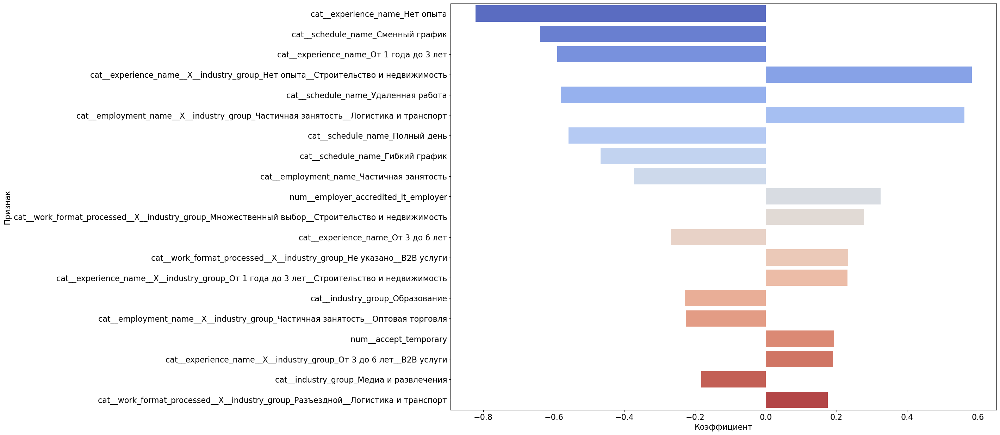

In [249]:
print(ols_model.summary())
plt.figure(figsize=(20, 15))

sns.barplot(
    data=results_sig.head(20),
    x='коэффициент',
    y='признак',
    palette='coolwarm'
)

plt.xlabel('Коэффициент', fontsize=16)

plt.ylabel('Признак', fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.show()

In [250]:
feature_names = [
    x
    for x in results_df['признак'][1:]
]

ols_model.model.exog_names[:] = ["const"] + feature_names

stargazer = Stargazer([ols_model])
HTML(stargazer.render_html())

In [251]:
ohe = best_model.named_steps['preprocessor'] \
    .named_transformers_['cat']

for col, cats in zip(
    selected_cat_cols_extended,
    ohe.categories_
):
    print(f'\n{col}')
    print('Референтная категория:', cats[0])


experience_name
Референтная категория: Более 6 лет

work_format_processed
Референтная категория: Гибрид

employment_name
Референтная категория: Полная занятость

schedule_name
Референтная категория: Вахтовый метод

industry_group
Референтная категория: B2B услуги

experience_name__X__industry_group
Референтная категория: Более 6 лет__B2B услуги

employment_name__X__industry_group
Референтная категория: Полная занятость__B2B услуги

work_format_processed__X__industry_group
Референтная категория: Гибрид__B2B услуги


In [252]:
len(selected_features)

51

In [253]:
results_sig.shape

(46, 3)

In [233]:
X_train_transformed = preprocessor_small.fit_transform(
    X_train_inter
).toarray()

feature_names = preprocessor_small.get_feature_names_out()

mask = np.isin(feature_names, selected_features)

X_train_selected = X_train_transformed[:, mask]

print("Количество признаков:",
      X_train_selected.shape[1])


lr_model = LinearRegression()

lr_model.fit(
    X_train_selected,
    y_train
)

X_test_transformed = preprocessor_small.transform(
    X_test_inter
).toarray()

X_test_selected = X_test_transformed[:, mask]


y_pred_log = lr_model.predict(X_test_selected)

y_pred = np.expm1(y_pred_log)
y_true = np.expm1(y_test)




mae = mean_absolute_error(y_true, y_pred)

rmse = np.sqrt(
    mean_squared_error(y_true, y_pred)
)

r2 = r2_score(y_true, y_pred)

print("\nМетрики LR:")
print(f"MAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R2:   {r2:.3f}")




y_pred_train_log = lr_model.predict(
    X_train_selected
)

r2_train_log = r2_score(
    y_train,
    y_pred_train_log
)

print("\nTrain R2 log:")
print(round(r2_train_log, 3))
print("\nTest R2 log:")
print(round(r2_score(y_test, y_pred_log),3))

Количество признаков: 51

Метрики LR:
MAE:  34813.35
RMSE: 52042.70
R2:   0.303

Train R2 log:
0.367

Test R2 log:
0.344


/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [7] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


In [254]:
results = {}

industries_to_run = [
    "Ритейл",
    "IT и телеком",
    "Строительство и недвижимость"
]

selected_cat_cols_seg = [
    'experience_name',
    'schedule_name',
    'employment_name',
    'work_format_processed'
]

for industry in industries_to_run:

    X_seg = X[X['industry_group'] == industry].copy()
    y_seg = y.loc[X_seg.index]

    preprocessor_seg = ColumnTransformer(
        transformers=[
            ('cat', OneHotEncoder(handle_unknown='ignore', drop='first'),
             selected_cat_cols_seg),
            ('scale', StandardScaler(), selected_scale_cols),
            ('num', 'passthrough', selected_other_num_cols)
        ]
    )

    X_train, X_test, y_train, y_test = train_test_split(
        X_seg, y_seg, test_size=0.2, random_state=42
    )

    model = Pipeline(steps=[
        ('preprocessor', preprocessor_seg),
        ('regressor', LinearRegression())
    ])

    model.fit(X_train, y_train)

    y_pred_log = model.predict(X_test)
    y_pred = np.expm1(y_pred_log)
    y_true = np.expm1(y_test)

    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)

    print(f"\n===== {industry} =====")
    print(f"MAE:  {mae:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"R2:   {r2:.3f}")

    # OLS
    X_transformed = model.named_steps['preprocessor'].transform(X_train)
    feature_names = model.named_steps['preprocessor'].get_feature_names_out()

    X_sm = sm.add_constant(X_transformed, has_constant='add')

    ols_model = sm.OLS(y_train, X_sm).fit(cov_type='HC1')

    results_df = pd.DataFrame({
        'признак': ['const'] + list(feature_names),
        'коэффициент': ols_model.params,
        'p-value': ols_model.pvalues
    })

    results_sig = results_df[
        (results_df['признак'] != 'const') &
        (results_df['p-value'] < 0.05)
    ].sort_values(
        by='коэффициент',
        key=abs,
        ascending=False
    )
    
    n_features = (results_df['признак'] != 'const').sum()
    print(f"\nВсего признаков (без константы): {n_features}")

    print(f"\n--- Значимых признаков: {len(results_sig)} ---")

    display(results_sig)

    results[industry] = {
    "results_df": results_df,
    "results_sig": results_sig,
    "ols": ols_model
    }

results_it = results["IT и телеком"]["results_df"]
results_retail = results["Ритейл"]["results_df"]
results_construction = results["Строительство и недвижимость"]["results_df"]


===== Ритейл =====
MAE:  25147.18
RMSE: 39484.50
R2:   0.359

Всего признаков (без константы): 24

--- Значимых признаков: 16 ---


,признак,коэффициент,p-value
x1,cat__experience_name_Нет опыта,-0.818122,2.291724e-11
x7,cat__schedule_name_Удаленная работа,-0.660478,9.749939e-07
x2,cat__experience_name_От 1 года до 3 лет,-0.657925,7.267510e-08
x13,cat__work_format_processed_Разъездной,0.463708,4.118351e-09
x21,num__employer_accredited_it_employer,0.435881,6.219193e-36
x9,cat__employment_name_Частичная занятость,-0.429810,1.572213e-25
x6,cat__schedule_name_Сменный график,-0.422261,1.830301e-05
x5,cat__schedule_name_Полный день,-0.370793,1.453511e-04
x20,num__accept_temporary,0.327937,4.272843e-27
x14,cat__work_format_processed_Удалённо,0.326250,8.638159e-03



===== IT и телеком =====
MAE:  36572.74
RMSE: 51685.30
R2:   0.465

Всего признаков (без константы): 24

--- Значимых признаков: 13 ---


,признак,коэффициент,p-value
x1,cat__experience_name_Нет опыта,-1.039626,5.068396e-53
x7,cat__schedule_name_Удаленная работа,-0.755625,1.680242e-14
x6,cat__schedule_name_Сменный график,-0.728682,4.109714e-16
x2,cat__experience_name_От 1 года до 3 лет,-0.701589,4.440657e-27
x4,cat__schedule_name_Гибкий график,-0.681690,4.987605e-09
x5,cat__schedule_name_Полный день,-0.665269,7.193488e-17
x9,cat__employment_name_Частичная занятость,-0.563202,6.344524e-19
x12,cat__work_format_processed_Не указано,-0.272891,1.642646e-04
x3,cat__experience_name_От 3 до 6 лет,-0.269117,4.784960e-05
x11,cat__work_format_processed_На месте работодателя,-0.259546,7.432053e-05



===== Строительство и недвижимость =====
MAE:  52683.57
RMSE: 75097.70
R2:   0.264

Всего признаков (без константы): 24

--- Значимых признаков: 15 ---


,признак,коэффициент,p-value
x6,cat__schedule_name_Сменный график,-0.890417,1.589729e-81
x14,cat__work_format_processed_Удалённо,-0.619107,8.451767e-05
x5,cat__schedule_name_Полный день,-0.461503,1.216201e-64
x4,cat__schedule_name_Гибкий график,-0.423051,1.843303e-07
x2,cat__experience_name_От 1 года до 3 лет,-0.388179,3.639570e-09
x1,cat__experience_name_Нет опыта,-0.303503,1.587375e-05
x9,cat__employment_name_Частичная занятость,-0.296030,2.343029e-03
x22,num__night_shifts,0.194683,1.088901e-03
x11,cat__work_format_processed_На месте работодателя,-0.192937,4.224860e-02
x18,num__accept_handicapped,-0.179218,4.335410e-02


In [263]:
def rename_ols_features(ols_model, feature_names):
    new_index = ["const"] + list(feature_names)

    ols_model.params.index = new_index
    ols_model.pvalues.index = new_index

    return ols_model

feature_names = results["IT и телеком"]["ols"].model.exog_names[1:]  # без const

results["IT и телеком"]["ols"] = rename_ols_features(
    results["IT и телеком"]["ols"],
    feature_names
)

results["Ритейл"]["ols"] = rename_ols_features(
    results["Ритейл"]["ols"],
    feature_names
)

results["Строительство и недвижимость"]["ols"] = rename_ols_features(
    results["Строительство и недвижимость"]["ols"],
    feature_names)

In [271]:
def short_name(x):
    prefixes = [
        'cat__experience_name_',
        'cat__schedule_name_',
        'cat__employment_name_',
        'cat__work_format_processed_',
        'num__', 'scale__'
    ]

    for p in prefixes:
        if x.startswith(p):
            return x.replace(p, '')

    return x


for industry in [
    "IT и телеком",
    "Ритейл",
    "Строительство и недвижимость"
]:
    
    ols_model = results[industry]["ols"]
    results_df = results[industry]["results_df"]

    feature_names = [
        short_name(x)
        for x in results_df['признак'][1:]
    ]

    ols_model.model.exog_names[:] = (
        ['const'] + feature_names
    )

In [272]:
stargazer = Stargazer([
    results["IT и телеком"]["ols"],
    results["Ритейл"]["ols"],
    results["Строительство и недвижимость"]["ols"]
])


stargazer.custom_columns(
    ["IT и телеком", "Ритейл", "Строительство"],
    [1, 1, 1]
)

HTML(stargazer.render_html())

In [276]:
def create_cat_only_comparison(results_it, results_retail, results_construction):
    
    target_features = [
        'experience_name',
        'schedule_name',
        'employment_name',
        'work_format_processed'
    ]

    def prep(df):
        df = df[df['признак'] != 'const'][['признак', 'коэффициент', 'p-value']].copy()

        df = df[
            df['признак'].str.contains('|'.join(target_features))
        ]

        return df

    def add_metrics(df, coef_name, exp_name, sig_name):
        df = df.rename(columns={'коэффициент': coef_name})

        # интерпретация в процентах
        df[f'{exp_name}_pct'] = ((np.exp(df[coef_name]) - 1) * 100).round(2)

        # значимость
        df[sig_name] = (df['p-value'] < 0.05).map({
            True: 'значим',
            False: 'не значим'
        })

        return df.drop(columns=['p-value'])

    df_it = add_metrics(prep(results_it), 'coef_it', 'exp_it', 'sig_it')
    df_retail = add_metrics(prep(results_retail), 'coef_retail', 'exp_retail', 'sig_retail')
    df_construction = add_metrics(prep(results_construction), 'coef_construction', 'exp_construction', 'sig_construction')

    final_compare = (
        df_it
        .merge(df_retail, on='признак', how='outer')
        .merge(df_construction, on='признак', how='outer')
    )

    return final_compare

In [277]:
final_compare = create_cat_only_comparison(
    results_it,
    results_retail,
    results_construction
)

display(final_compare)

,признак,coef_it,exp_it_pct,sig_it,coef_retail,exp_retail_pct,sig_retail,coef_construction,exp_construction_pct,sig_construction
0,cat__employment_name_Проектная работа,-0.115351,-10.89,не значим,-0.283721,-24.70,не значим,-0.169092,-15.56,не значим
1,cat__employment_name_Частичная занятость,-0.563202,-43.06,значим,-0.429810,-34.94,значим,-0.296030,-25.62,значим
2,cat__experience_name_Нет опыта,-1.039626,-64.64,значим,-0.818122,-55.87,значим,-0.303503,-26.18,значим
3,cat__experience_name_От 1 года до 3 лет,-0.701589,-50.42,значим,-0.657925,-48.21,значим,-0.388179,-32.17,значим
4,cat__experience_name_От 3 до 6 лет,-0.269117,-23.59,значим,-0.280066,-24.43,значим,-0.149174,-13.86,значим
5,cat__schedule_name_Гибкий график,-0.681690,-49.42,значим,-0.080250,-7.71,не значим,-0.423051,-34.50,значим
6,cat__schedule_name_Полный день,-0.665269,-48.59,значим,-0.370793,-30.98,значим,-0.461503,-36.97,значим
7,cat__schedule_name_Сменный график,-0.728682,-51.75,значим,-0.422261,-34.44,значим,-0.890417,-58.95,значим
8,cat__schedule_name_Удаленная работа,-0.755625,-53.03,значим,-0.660478,-48.34,значим,-0.173836,-15.96,не значим
9,cat__work_format_processed_Множественный выбор,-0.098746,-9.40,не значим,0.307539,36.01,значим,0.126668,13.50,не значим


### Модели на всех признаках

In [278]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

scale_cols = ['num_skills', 'description_length']

other_num_cols = [col for col in X.select_dtypes(include=['int', 'float', 'bool']).columns
                  if col not in scale_cols]

cat_cols = X.select_dtypes(include='object').columns

In [279]:
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore', drop='first'), cat_cols),
        ('scale', StandardScaler(), scale_cols),
        ('num', 'passthrough', other_num_cols)
    ]
)

model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

In [280]:
model.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('cat',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore'),
                                                  Index(['address_city', 'experience_name', 'schedule_name', 'employment_name',
       'employer_name', 'salary_range_frequency_name',
       'address_metro_station_name', 'driver_license_types_processed',
       'fly_in_fly_out_duration_processed', 'language...
                                                   'individual_entrepreneur',
                                                   'internship', 'rare_role',
                                                   '1C', 'Adobe Photoshop',
                                                   'AutoCAD', 'CRM', 'Excel',
                                                   'Git', 'SMM', 'SQL',
                                                   'Администрирование',
                                                   'Аналитическое мышление',
                                                   'Английский язык',
                                                   'Бухгалтерский '
                                                   'учёт/отчётность',
                                                   'Внимательность',
                                                   'Внутренние коммуникации',
                                                   'Внутренний контроль',
                                                   'Водительское удостоверение '
                                                   'категории B',
                                                   'Выкладка товаров', ...])])),
                ('regressor', LinearRegression())])

In [281]:
y_pred_log = model.predict(X_test)

y_pred = np.expm1(y_pred_log)
y_true = np.expm1(y_test)

In [282]:
mae = mean_absolute_error(y_true, y_pred)
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
r2 = r2_score(y_true, y_pred)

print("Метрики (рубли):")
print(f"MAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R2:   {r2:.3f}")

Метрики (рубли):
MAE:  26467.18
RMSE: 42222.79
R2:   0.541


In [283]:
r2_log = r2_score(y_test, y_pred_log)
print(f"R2(log):   {r2_log:.3f}")

R2(log):   0.596


In [284]:
y_train_pred = model.predict(X_train)
r2_train = r2_score(y_train, y_train_pred)

print(f"R2(log_train):   {r2_train:.3f}")

R2(log_train):   0.625


In [285]:
feature_names = model.named_steps['preprocessor'].get_feature_names_out()

coef_df = pd.DataFrame({
    'feature': feature_names,
    'coef': model.named_steps['regressor'].coef_
})

coef_df['abs_coef'] = coef_df['coef'].abs()
coef_df = coef_df.sort_values('abs_coef', ascending=False)

coef_df.head(30)

,feature,coef,abs_coef
127,cat__employer_name_Агентство Недвижимости Инфинити,1.066625,1.066625
188,cat__employer_name_Самокат (ООО ИЗИ Лоджистик — партнер сервиса),0.927895,0.927895
155,cat__employer_name_Квазар,0.902289,0.902289
377,cat__professional_roles_short_str_Агент по недвижимости,0.874010,0.874010
319,cat__driver_license_types_processed_E,0.830887,0.830887
167,cat__employer_name_Найди Тех,-0.773289,0.773289
123,cat__employer_name_UDS GOLD,0.737785,0.737785
151,cat__employer_name_Инвест Строй,0.713810,0.713810
121,cat__employer_name_StaffRecruitment,0.694437,0.694437
386,cat__professional_roles_short_str_Врач,0.680578,0.680578


In [286]:
coef_df[coef_df['feature']=='cat__address_city_Балашиха']

,feature,coef,abs_coef
1,cat__address_city_Балашиха,0.271099,0.271099


In [287]:
model.named_steps['regressor'].intercept_

np.float64(12.181779747687036)

In [288]:
X_transformed = model.named_steps['preprocessor'].transform(X_train).toarray()

feature_names = model.named_steps['preprocessor'].get_feature_names_out()

X_sm = sm.add_constant(X_transformed, has_constant='add')

ols_model = sm.OLS(y_train, X_sm).fit(cov_type='HC1')

results_df = pd.DataFrame({
    'признак': ['const'] + list(feature_names),
    'коэффициент': ols_model.params.round(3),
    'p-value': ols_model.pvalues.round(3)
})

results_df

,признак,коэффициент,p-value
const,const,12.184,0.000
x1,cat__address_city_Астрахань,-0.092,0.160
x2,cat__address_city_Балашиха,0.271,0.000
x3,cat__address_city_Барнаул,-0.105,0.049
x4,cat__address_city_Белгород,-0.070,0.317
...,...,...,...
x605,num__Учет остатков,-0.021,0.410
x606,num__Учет товаров,-0.034,0.208
x607,num__Чтение чертежей,0.034,0.199
x608,num__исполнение поручений руководителя,-0.061,0.079


In [289]:
print(round(X_train.num_skills.std(),3))
print(round(X_train.description_length.std(),3))

4.86
714.255


In [290]:
results_df[results_df['признак']=='scale__num_skills']

,признак,коэффициент,p-value
x493,scale__num_skills,0.032,0.0


In [291]:
results_df[results_df['признак']=='scale__description_length']

,признак,коэффициент,p-value
x494,scale__description_length,0.053,0.0


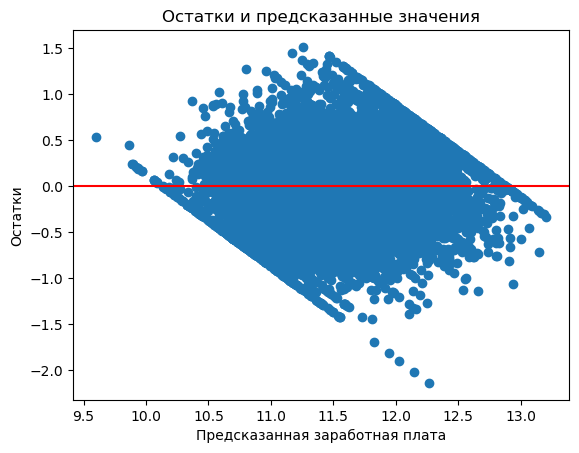

In [292]:
plt.scatter(ols_model.fittedvalues, ols_model.resid)
plt.axhline(0, color='red')
plt.title("Остатки и предсказанные значения")


plt.xlabel("Предсказанная заработная плата")
plt.ylabel("Остатки")
plt.show()

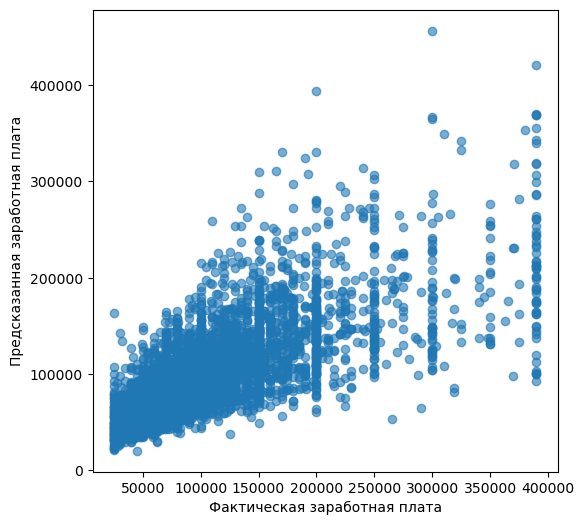

In [293]:
plt.figure(figsize=(6,6))

plt.scatter(y_true, y_pred, alpha=0.6)

plt.xlabel("Фактическая заработная плата")
plt.ylabel("Предсказанная заработная плата")


plt.show()

In [294]:
results_df[results_df['p-value']<0.05]

,признак,коэффициент,p-value
const,const,12.184,0.000
x2,cat__address_city_Балашиха,0.271,0.000
x3,cat__address_city_Барнаул,-0.105,0.049
x5,cat__address_city_Благовещенск,0.186,0.049
x6,cat__address_city_Брянск,-0.146,0.014
...,...,...,...
x594,num__Строительство,0.094,0.002
x596,num__Торговля,0.068,0.036
x597,num__Точность и внимательность к деталям,-0.026,0.032
x603,num__Управленческие навыки,0.071,0.029


In [295]:
# results_df[results_df['признак'].str.contains('schedule_name', na=False)]
coef_df[coef_df['feature'].str.contains('schedule_name', na=False)]

,feature,coef,abs_coef
107,cat__schedule_name_Удаленная работа,-0.158986,0.158986
104,cat__schedule_name_Гибкий график,-0.118467,0.118467
105,cat__schedule_name_Полный день,-0.107358,0.107358
106,cat__schedule_name_Сменный график,-0.059887,0.059887


In [296]:
results_df[results_df['признак'].str.contains('schedule_name')]

,признак,коэффициент,p-value
x105,cat__schedule_name_Гибкий график,7.103323e+10,0.641
x106,cat__schedule_name_Полный день,7.103323e+10,0.641
x107,cat__schedule_name_Сменный график,7.103323e+10,0.641
x108,cat__schedule_name_Удаленная работа,7.103323e+10,0.641


In [297]:
print(ols_model.summary())

                            OLS Regression Results                            
Dep. Variable:        salary_mean_log   R-squared:                       0.613
Model:                            OLS   Adj. R-squared:                  0.603
Method:                 Least Squares   F-statistic:                    0.2172
Date:                Wed, 17 Jun 2026   Prob (F-statistic):              0.641
Time:                        01:29:48   Log-Likelihood:                -7988.4
No. Observations:               24961   AIC:                         1.719e+04
Df Residuals:                   24352   BIC:                         2.214e+04
Df Model:                         608                                         
Covariance Type:                  HC1                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.1841      0.135     90.572      0.0

/opt/anaconda3/lib/python3.13/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 609, but rank is 1
  warnings.warn('covariance of constraints does not have full '


In [298]:
bp_test = het_breuschpagan(ols_model.resid, ols_model.model.exog)

labels = ['LM stat', 'LM p-value', 'F stat', 'F p-value']
print(dict(zip(labels, bp_test)))

{'LM stat': np.float64(2768.3876227694254), 'LM p-value': np.float64(1.3990405081068066e-271), 'F stat': np.float64(4.996311729225032), 'F p-value': np.float64(5.060358629470803e-294)}


In [299]:
def mae_rub(y_true_log, y_pred_log):
    y_true = np.expm1(y_true_log)
    y_pred = np.expm1(y_pred_log)
    return mean_absolute_error(y_true, y_pred)


def rmse_rub(y_true_log, y_pred_log):
    y_true = np.expm1(y_true_log)
    y_pred = np.expm1(y_pred_log)
    return np.sqrt(mean_squared_error(y_true, y_pred))


def r2_rub(y_true_log, y_pred_log):
    y_true = np.expm1(y_true_log)
    y_pred = np.expm1(y_pred_log)
    return r2_score(y_true, y_pred)

mae_scorer = make_scorer(mae_rub, greater_is_better=False)
rmse_scorer = make_scorer(rmse_rub, greater_is_better=False)
r2_scorer = make_scorer(r2_rub, greater_is_better=True)

kf = KFold(n_splits=5, shuffle=True, random_state=42)

mae_scores = cross_val_score(model, X_train, y_train, cv=kf, scoring=mae_scorer)
rmse_scores = cross_val_score(model, X_train, y_train, cv=kf, scoring=rmse_scorer)
r2_scores = cross_val_score(model, X_train, y_train, cv=kf, scoring=r2_scorer)

print("Результаты кросс-валидации (в рублях):")
print(f"MAE:  {-mae_scores.mean():.2f}")
print(f"RMSE: {-rmse_scores.mean():.2f}")
print(f"R2:   {r2_scores.mean():.3f}")

/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [9] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [9] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [7] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [9] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning:

Результаты кросс-валидации (в рублях):
MAE:  26141.31
RMSE: 42254.85
R2:   0.550


/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [7] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


In [302]:
results_df[results_df['признак'].str.contains('industry')]

,признак,коэффициент,p-value
x477,cat__industry_group_IT и телеком,-0.107,0.000
x478,cat__industry_group_Гостинично-ресторанный бизнес,-0.070,0.000
x479,cat__industry_group_Государство и НКО,-0.175,0.000
x480,cat__industry_group_Здравоохранение,-0.152,0.000
x481,cat__industry_group_Логистика и транспорт,0.009,0.617
x482,cat__industry_group_Медиа и развлечения,-0.266,0.000
x483,cat__industry_group_Наука и исследования,-0.202,0.000
x484,cat__industry_group_Образование,-0.238,0.000
x485,cat__industry_group_Оптовая торговля,-0.051,0.000
x486,cat__industry_group_Производство,-0.059,0.000


/var/folders/yw/j_hz9v6107z3z2yhw4flcx6c0000gn/T/ipykernel_32430/516271437.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


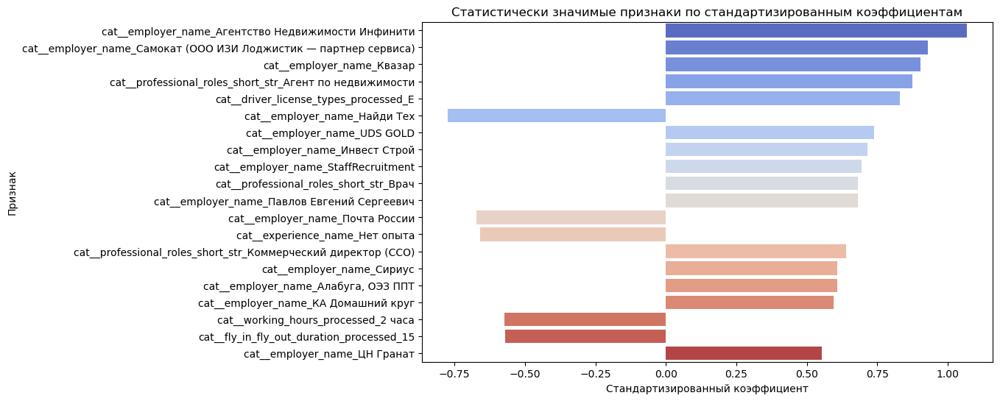

In [303]:
results_no_const = results_df[
    (results_df['признак'] != 'const') & 
    (results_df['p-value'] < 0.05)
]

results_no_const = results_no_const.reindex(
    results_no_const['коэффициент'].abs().sort_values(ascending=False).index
)

plt.figure(figsize=(10,6))
sns.barplot(
    x='коэффициент',
    y='признак',
    data=results_no_const.head(20),
    palette='coolwarm'
)
plt.title("Статистически значимые признаки по стандартизированным коэффициентам")
plt.xlabel("Стандартизированный коэффициент")
plt.ylabel("Признак")
plt.show()

In [304]:
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', Lasso(max_iter=10000))
])

param_grid = {
    'regressor__alpha': [0.001, 0.01, 0.1, 1, 10]
}

grid = GridSearchCV(
    model,
    param_grid=param_grid,
    cv=5,
    scoring='r2',
    n_jobs=-1,
    error_score='raise'
)

grid.fit(X_train, y_train)

print("Лучший alpha:", grid.best_params_)
print("Лучший R2:", round(grid.best_score_,3))

/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [9] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [9] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [7, 9] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [7, 9] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWa

Лучший alpha: {'regressor__alpha': 0.001}
Лучший R2: 0.52


In [306]:
best_model = grid.best_estimator_
y_pred_log = best_model.predict(X_test)

y_pred = np.expm1(y_pred_log)
y_true = np.expm1(y_test)

mae = mean_absolute_error(y_true, y_pred)
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
r2 = r2_score(y_true, y_pred)

print("Метрики (в рублях):")
print(f"MAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R2:   {r2:.3f}")

Метрики (в рублях):
MAE:  29371.86
RMSE: 46563.71
R2:   0.442


In [308]:
feature_names = best_model.named_steps['preprocessor'].get_feature_names_out()

coef_df = pd.DataFrame({
    'feature': feature_names,
    'coef': best_model.named_steps['regressor'].coef_
})

coef_df['abs_coef'] = coef_df['coef'].abs()
coef_df = coef_df.sort_values('abs_coef', ascending=False).drop(columns='abs_coef')
coef_df

,feature,coef
377,cat__professional_roles_short_str_Агент по недвижимости,0.627615
101,cat__experience_name_Нет опыта,-0.560324
332,cat__fly_in_fly_out_duration_processed_Не указано,-0.454338
319,cat__driver_license_types_processed_E,0.411304
102,cat__experience_name_От 1 года до 3 лет,-0.358292
...,...,...
220,cat__address_metro_station_name_Алабинская,-0.000000
221,cat__address_metro_station_name_Алексеевская,0.000000
222,cat__address_metro_station_name_Алтуфьево,0.000000
223,cat__address_metro_station_name_Аметьево,-0.000000


In [309]:
coef_df[coef_df['feature'].str.contains('industry')]

,feature,coef
483,cat__industry_group_Образование,-0.219190
489,cat__industry_group_Строительство и недвижимость,0.146394
480,cat__industry_group_Логистика и транспорт,0.102065
479,cat__industry_group_Здравоохранение,-0.091362
481,cat__industry_group_Медиа и развлечения,-0.080287
486,cat__industry_group_Прочие услуги,-0.056453
482,cat__industry_group_Наука и исследования,-0.039819
476,cat__industry_group_IT и телеком,-0.029205
484,cat__industry_group_Оптовая торговля,0.022681
487,cat__industry_group_Ритейл,-0.013466


In [310]:
coef_df[coef_df['coef']!=0]

,feature,coef
377,cat__professional_roles_short_str_Агент по недвижимости,0.627615
101,cat__experience_name_Нет опыта,-0.560324
332,cat__fly_in_fly_out_duration_processed_Не указано,-0.454338
319,cat__driver_license_types_processed_E,0.411304
102,cat__experience_name_От 1 года до 3 лет,-0.358292
...,...,...
477,cat__industry_group_Гостинично-ресторанный бизнес,-0.003164
499,num__accept_incomplete_resumes,-0.003092
389,cat__professional_roles_short_str_Дизайнер,-0.001853
559,num__Организация процессов,0.000335


In [311]:
lasso = best_model.named_steps['regressor']

n_total = len(lasso.coef_)
n_zero = (lasso.coef_ == 0).sum()

print("Всего признаков:", n_total)
print("Обнулено Lasso:", n_zero)
print("Доля фильтрации:", round(n_zero / n_total,3))

Всего признаков: 609
Обнулено Lasso: 481
Доля фильтрации: 0.79


In [312]:
coef_df[coef_df['coef']!=0].head(50)

,feature,coef
377,cat__professional_roles_short_str_Агент по недвижимости,0.627615
101,cat__experience_name_Нет опыта,-0.560324
332,cat__fly_in_fly_out_duration_processed_Не указано,-0.454338
319,cat__driver_license_types_processed_E,0.411304
102,cat__experience_name_От 1 года до 3 лет,-0.358292
386,cat__professional_roles_short_str_Врач,0.312691
109,cat__employment_name_Частичная занятость,-0.277977
422,cat__professional_roles_short_str_Мерчандайзер,-0.277623
44,cat__address_city_Москва,0.270855
155,cat__employer_name_Квазар,0.252610


In [313]:
r2_log = r2_score(y_test, y_pred_log)
print(f"R2(log):   {r2_log:.3f}")

R2(log):   0.511


In [314]:
y_train_pred = best_model.predict(X_train)
r2_train = r2_score(y_train, y_train_pred)

print(f"R2(log_train):   {r2_train:.3f}")

R2(log_train):   0.525


In [318]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)

mae_scores = cross_val_score(best_model, X_train, y_train, cv=kf, scoring=mae_scorer)
rmse_scores = cross_val_score(best_model, X_train, y_train, cv=kf, scoring=rmse_scorer)
r2_scores = cross_val_score(best_model, X_train, y_train, cv=kf, scoring=r2_scorer)

print("Результаты кросс-валидации (в рублях):")
print(f"MAE:  {-mae_scores.mean():.2f}")
print(f"RMSE: {-rmse_scores.mean():.2f}")
print(f"R2:   {r2_scores.mean():.3f}")

/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [9] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [9] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [7] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [9] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning:

Результаты кросс-валидации (в рублях):
MAE:  29213.08
RMSE: 46868.86
R2:   0.447


/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [7] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


In [319]:
coef = best_model.named_steps['regressor'].coef_
feature_names = best_model.named_steps['preprocessor'].get_feature_names_out()

selected_features = feature_names[coef != 0]
selected_features

array(['cat__address_city_Владивосток', 'cat__address_city_Другое',
       'cat__address_city_Москва', 'cat__address_city_Мытищи',
       'cat__address_city_Не указано', 'cat__address_city_Новосибирск',
       'cat__address_city_Омск', 'cat__address_city_Самара',
       'cat__address_city_Санкт-Петербург', 'cat__address_city_Томск',
       'cat__address_city_Химки', 'cat__experience_name_Нет опыта',
       'cat__experience_name_От 1 года до 3 лет',
       'cat__experience_name_От 3 до 6 лет',
       'cat__schedule_name_Удаленная работа',
       'cat__employment_name_Частичная занятость',
       'cat__employer_name_WILDBERRIES',
       'cat__employer_name_Департамент Ф53', 'cat__employer_name_Другое',
       'cat__employer_name_Квазар', 'cat__employer_name_Пятёрочка',
       'cat__employer_name_Ростелеком',
       'cat__employer_name_Самокат (ООО ИЗИ Лоджистик — партнер сервиса)',
       'cat__salary_range_frequency_name_Ежедневно',
       'cat__salary_range_frequency_name_Не указано',


In [320]:
X_transformed = best_model.named_steps['preprocessor'].transform(X_train).toarray()
mask = coef != 0
X_selected = X_transformed[:, mask]
X_selected.shape

(24961, 128)

In [321]:
X_sm = sm.add_constant(X_selected, has_constant='add')
ols_model = sm.OLS(y_train, X_sm).fit(cov_type='HC1')

results_df = pd.DataFrame({
    'feature': ['const'] + list(selected_features),
    'coef': ols_model.params,
    'p_value': ols_model.pvalues
})

results_df = results_df.sort_values(by='coef', key=lambda x: x.abs(), ascending=False)
results_df.head(20)

,feature,coef,p_value
const,const,12.625381,0.000000e+00
x23,cat__employer_name_Самокат (ООО ИЗИ Лоджистик — партнер сервиса),0.857926,5.265732e-28
x50,cat__professional_roles_short_str_Агент по недвижимости,0.765575,1.835495e-83
x12,cat__experience_name_Нет опыта,-0.700650,4.168874e-191
x20,cat__employer_name_Квазар,0.668153,8.097997e-59
x29,cat__driver_license_types_processed_E,0.654706,1.242326e-99
x13,cat__experience_name_От 1 года до 3 лет,-0.498044,7.388149e-101
x62,cat__professional_roles_short_str_Мерчандайзер,-0.480556,2.304771e-46
x31,cat__fly_in_fly_out_duration_processed_Не указано,-0.465465,1.899361e-133
x55,cat__professional_roles_short_str_Врач,0.439878,1.248960e-71


In [322]:
results_df["exp(coef)-1"] = np.exp(results_df["coef"]) - 1
results_df.head(20)

,feature,coef,p_value,exp(coef)-1
const,const,12.625381,0.000000e+00,304180.828241
x23,cat__employer_name_Самокат (ООО ИЗИ Лоджистик — партнер сервиса),0.857926,5.265732e-28,1.358265
x50,cat__professional_roles_short_str_Агент по недвижимости,0.765575,1.835495e-83,1.150231
x12,cat__experience_name_Нет опыта,-0.700650,4.168874e-191,-0.503737
x20,cat__employer_name_Квазар,0.668153,8.097997e-59,0.950631
x29,cat__driver_license_types_processed_E,0.654706,1.242326e-99,0.924577
x13,cat__experience_name_От 1 года до 3 лет,-0.498044,7.388149e-101,-0.392282
x62,cat__professional_roles_short_str_Мерчандайзер,-0.480556,2.304771e-46,-0.381560
x31,cat__fly_in_fly_out_duration_processed_Не указано,-0.465465,1.899361e-133,-0.372157
x55,cat__professional_roles_short_str_Врач,0.439878,1.248960e-71,0.552518


In [323]:
results_df[results_df['feature'].str.contains('num')]

,feature,coef,p_value,exp(coef)-1
x107,num__Водительское удостоверение категории B,-0.247292,5.059149e-08,-0.219087
x108,num__Выкладка товаров,-0.171100,2.932863e-14,-0.157262
x101,num__government_employer,-0.166512,2.478915e-29,-0.153388
x105,num__SQL,0.165572,2.553020e-06,0.180068
x104,num__SMM,-0.164212,1.613549e-05,-0.151438
x111,num__Дизайн,-0.135964,7.410143e-05,-0.127126
x109,num__Выстраивание стратегии,0.127824,9.453589e-08,0.136353
x122,num__Продажи,0.121866,1.248345e-28,0.129602
x117,num__Обеспечение жизнедеятельности офиса,-0.107204,1.444838e-04,-0.101658
x127,num__Руководство коллективом,0.098102,8.448341e-06,0.103076


In [324]:
results_df[results_df['p_value']<0.05].head(20)

,feature,coef,p_value,exp(coef)-1
const,const,12.625381,0.000000e+00,304180.828241
x23,cat__employer_name_Самокат (ООО ИЗИ Лоджистик — партнер сервиса),0.857926,5.265732e-28,1.358265
x50,cat__professional_roles_short_str_Агент по недвижимости,0.765575,1.835495e-83,1.150231
x12,cat__experience_name_Нет опыта,-0.700650,4.168874e-191,-0.503737
x20,cat__employer_name_Квазар,0.668153,8.097997e-59,0.950631
x29,cat__driver_license_types_processed_E,0.654706,1.242326e-99,0.924577
x13,cat__experience_name_От 1 года до 3 лет,-0.498044,7.388149e-101,-0.392282
x62,cat__professional_roles_short_str_Мерчандайзер,-0.480556,2.304771e-46,-0.381560
x31,cat__fly_in_fly_out_duration_processed_Не указано,-0.465465,1.899361e-133,-0.372157
x55,cat__professional_roles_short_str_Врач,0.439878,1.248960e-71,0.552518


In [325]:
print(ols_model.summary())

                            OLS Regression Results                            
Dep. Variable:        salary_mean_log   R-squared:                       0.555
Model:                            OLS   Adj. R-squared:                  0.553
Method:                 Least Squares   F-statistic:                     501.0
Date:                Wed, 17 Jun 2026   Prob (F-statistic):               0.00
Time:                        01:35:57   Log-Likelihood:                -9723.8
No. Observations:               24961   AIC:                         1.971e+04
Df Residuals:                   24832   BIC:                         2.075e+04
Df Model:                         128                                         
Covariance Type:                  HC1                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.6254      0.045    282.955      0.0

In [326]:
ols_model.rsquared

np.float64(0.5548084432098817)

In [327]:
X_test_transformed = preprocessor.transform(X_test).toarray()
X_test_selected = X_test_transformed[:, mask]

X_test_sm = sm.add_constant(X_test_selected, has_constant='add')

y_pred = ols_model.predict(X_test_sm)
r2_score(y_test, y_pred)

0.5337220242949066

/var/folders/yw/j_hz9v6107z3z2yhw4flcx6c0000gn/T/ipykernel_32430/1067830865.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


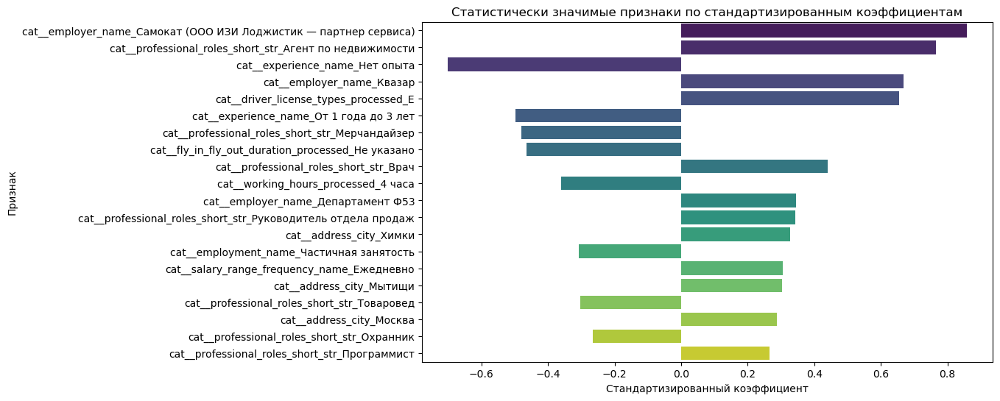

In [328]:
results_no_const = results_df[
    (results_df['feature'] != 'const') & 
    (results_df['p_value'] < 0.05)
]

results_no_const = results_no_const.reindex(
    results_no_const['coef'].abs().sort_values(ascending=False).index
)

plt.figure(figsize=(10,6))
sns.barplot(
    x='coef',
    y='feature',
    data=results_no_const.head(20),
    palette='viridis'
)
plt.title("Статистически значимые признаки по стандартизированным коэффициентам")
plt.xlabel("Стандартизированный коэффициент")
plt.ylabel("Признак")
plt.show()

In [329]:
results_df[results_df['p_value']<0.05]

,feature,coef,p_value,exp(coef)-1
const,const,12.625381,0.000000e+00,304180.828241
x23,cat__employer_name_Самокат (ООО ИЗИ Лоджистик — партнер сервиса),0.857926,5.265732e-28,1.358265
x50,cat__professional_roles_short_str_Агент по недвижимости,0.765575,1.835495e-83,1.150231
x12,cat__experience_name_Нет опыта,-0.700650,4.168874e-191,-0.503737
x20,cat__employer_name_Квазар,0.668153,8.097997e-59,0.950631
...,...,...,...,...
x125,num__Работа с клиентами или их данными,0.022505,3.452302e-02,0.022760
x92,scale__num_skills,0.021503,3.694461e-06,0.021736
x97,num__archived,-0.021290,1.012124e-02,-0.021065
x116,num__Не указано,0.020351,6.236239e-03,0.020560


In [330]:
results_df[results_df['feature'].str.contains('scale')] 
# 4.86
# 714.255

,feature,coef,p_value,exp(coef)-1
x93,scale__description_length,0.053414,9.964740e-80,0.054866
x92,scale__num_skills,0.021503,3.694461e-06,0.021736


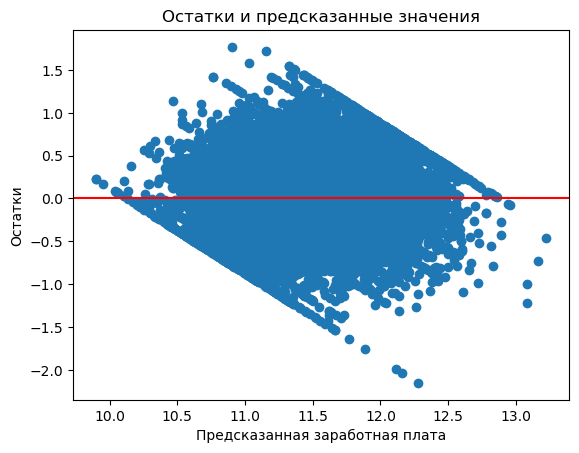

In [331]:
plt.scatter(ols_model.fittedvalues, ols_model.resid)
plt.axhline(0, color='red')
plt.title("Остатки и предсказанные значения")


plt.xlabel("Предсказанная заработная плата")
plt.ylabel("Остатки")
plt.show()

In [332]:
results_df[results_df['p_value']>=0.05]

,feature,coef,p_value,exp(coef)-1
x15,cat__schedule_name_Удаленная работа,-0.031168,0.215981,-0.030687
x126,num__Работа с оргтехникой,-0.030314,0.051503,-0.029859
x124,num__Работа с документами,-0.016180,0.078653,-0.016050
x27,cat__address_metro_station_name_Другое,0.013212,0.150241,0.013300
x118,num__Организация процессов,0.010593,0.318411,0.010650
x88,cat__industry_group_Производство,-0.006342,0.571586,-0.006322
x87,cat__industry_group_Оптовая торговля,0.002653,0.763067,0.002657
x98,num__accept_incomplete_resumes,-0.002095,0.716619,-0.002093
x79,cat__role_category_Не указано,0.001472,0.806334,0.001473
x34,cat__work_format_processed_На месте работодателя,0.000192,0.976836,0.000192


In [333]:
results_df[results_df['feature'].str.contains('industry_group')]

,feature,coef,p_value,exp(coef)-1
x86,cat__industry_group_Образование,-0.262164,5.304613e-59,-0.230615
x84,cat__industry_group_Медиа и развлечения,-0.238036,2.859648e-15,-0.211826
x85,cat__industry_group_Наука и исследования,-0.187842,4.159021e-13,-0.171254
x82,cat__industry_group_Здравоохранение,-0.130730,1.191985e-25,-0.122545
x91,cat__industry_group_Строительство и недвижимость,0.118063,1.476997e-20,0.125315
x89,cat__industry_group_Прочие услуги,-0.102673,1.306882e-12,-0.097578
x83,cat__industry_group_Логистика и транспорт,0.077106,5.010101e-07,0.080156
x80,cat__industry_group_IT и телеком,-0.064013,2.760365e-06,-0.062007
x90,cat__industry_group_Ритейл,-0.053559,1.247297e-06,-0.052150
x81,cat__industry_group_Гостинично-ресторанный бизнес,-0.041149,2.962076e-04,-0.040314


In [334]:
# для проверки сходимости коэффициентов со statmodels
lr = LinearRegression()

lr.fit(X_selected, y_train)

coef = lr.coef_
intercept = lr.intercept_

results_sklearn = pd.DataFrame({
    'feature': selected_features,
    'coef': coef
})

print("Intercept:", intercept)

results_sklearn = results_sklearn.sort_values('coef', ascending=False)
results_sklearn.head(20)

Intercept: 12.625380920799454


,feature,coef
22,cat__employer_name_Самокат (ООО ИЗИ Лоджистик — партнер сервиса),0.857926
49,cat__professional_roles_short_str_Агент по недвижимости,0.765575
19,cat__employer_name_Квазар,0.668153
28,cat__driver_license_types_processed_E,0.654706
54,cat__professional_roles_short_str_Врач,0.439878
17,cat__employer_name_Департамент Ф53,0.345403
71,cat__professional_roles_short_str_Руководитель отдела продаж,0.342593
10,cat__address_city_Химки,0.327926
23,cat__salary_range_frequency_name_Ежедневно,0.305846
3,cat__address_city_Мытищи,0.303616


In [335]:
lr.fit(X_selected, y_train)
r2_train_log = lr.score(X_selected, y_train)
r2_train_log

0.5548084432098815

In [336]:
y_pred_train = np.expm1(lr.predict(X_selected))
y_train_true = np.expm1(y_train)

r2_train_rub = r2_score(y_train_true, y_pred_train)
r2_train_rub

0.49277994482240683

In [337]:
r2_test_log = lr.score(X_test_selected, y_test)
r2_test_log

0.5337220242949114

In [338]:
y_pred = np.expm1(lr.predict(X_test_selected))
y_true = np.expm1(y_test)

r2_test_rub = r2_score(y_true, y_pred)
r2_test_rub

0.4780093750837512

In [339]:
mae = mean_absolute_error(y_true, y_pred)
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
r2 = r2_score(y_true, y_pred)

print("Метрики (рубли):")
print(f"MAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R2:   {r2:.3f}")

Метрики (рубли):
MAE:  28518.85
RMSE: 45033.84
R2:   0.478


In [340]:
X_copied = X.copy()

columns = [
    "experience_name",
    "address_city",
    "employment_name",
    "schedule_name",
    "work_format_processed",
    "professional_roles_short_str"]

for col in columns:
    X_copied[f"industry_x_{col}"] = X_copied["industry_group"].astype(str) + "_" + X_copied[col].astype(str)

X_train_copied, X_test_copied, y_train, y_test = train_test_split(
    X_copied, y, test_size=0.2, random_state=42
)

In [341]:
X_train_copied

,salary_gross,address_city,allow_messages,experience_name,schedule_name,employment_name,show_contacts,accept_handicapped,archived,accept_incomplete_resumes,...,Учет товаров,Чтение чертежей,исполнение поручений руководителя,оформление заказов,industry_x_experience_name,industry_x_address_city,industry_x_employment_name,industry_x_schedule_name,industry_x_work_format_processed,industry_x_professional_roles_short_str
5796,True,Не указано,False,От 1 года до 3 лет,Удаленная работа,Полная занятость,False,False,False,True,...,0,0,0,0,Финансы_От 1 года до 3 лет,Финансы_Не указано,Финансы_Полная занятость,Финансы_Удаленная работа,Финансы_Удалённо,Финансы_Менеджер по продажам
47846,False,Другое,True,От 3 до 6 лет,Полный день,Полная занятость,True,False,False,True,...,0,0,0,0,Логистика и транспорт_От 3 до 6 лет,Логистика и транспорт_Другое,Логистика и транспорт_Полная занятость,Логистика и транспорт_Полный день,Логистика и транспорт_На месте работодателя,Логистика и транспорт_Делопроизводитель
33600,True,Балашиха,True,Нет опыта,Полный день,Полная занятость,True,False,False,False,...,0,0,0,0,Здравоохранение_Нет опыта,Здравоохранение_Балашиха,Здравоохранение_Полная занятость,Здравоохранение_Полный день,Здравоохранение_На месте работодателя,Здравоохранение_Медицинская сестра
6137,False,Другое,True,От 3 до 6 лет,Полный день,Полная занятость,True,False,False,False,...,0,0,0,0,Оптовая торговля_От 3 до 6 лет,Оптовая торговля_Другое,Оптовая торговля_Полная занятость,Оптовая торговля_Полный день,Оптовая торговля_На месте работодателя,Оптовая торговля_Другое
11012,False,Другое,True,Нет опыта,Полный день,Полная занятость,True,False,False,True,...,0,0,0,0,Строительство и недвижимость_Нет опыта,Строительство и недвижимость_Другое,Строительство и недвижимость_Полная занятость,Строительство и недвижимость_Полный день,Строительство и недвижимость_На месте работодателя,Строительство и недвижимость_Офис-менеджер
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54555,False,Тверь,True,От 3 до 6 лет,Полный день,Полная занятость,False,False,False,False,...,0,0,0,0,Оптовая торговля_От 3 до 6 лет,Оптовая торговля_Тверь,Оптовая торговля_Полная занятость,Оптовая торговля_Полный день,Оптовая торговля_На месте работодателя,Оптовая торговля_Юрист
7763,True,Санкт-Петербург,False,Нет опыта,Сменный график,Полная занятость,False,False,False,True,...,0,0,0,0,Логистика и транспорт_Нет опыта,Логистика и транспорт_Санкт-Петербург,Логистика и транспорт_Полная занятость,Логистика и транспорт_Сменный график,Логистика и транспорт_На месте работодателя,Логистика и транспорт_Диспетчер
1135,True,Не указано,False,Более 6 лет,Удаленная работа,Полная занятость,False,False,False,False,...,0,0,0,0,IT и телеком_Более 6 лет,IT и телеком_Не указано,IT и телеком_Полная занятость,IT и телеком_Удаленная работа,IT и телеком_Удалённо,IT и телеком_Другое
26342,False,Ульяновск,True,Нет опыта,Полный день,Частичная занятость,True,False,False,True,...,0,0,0,0,Медиа и развлечения_Нет опыта,Медиа и развлечения_Ульяновск,Медиа и развлечения_Частичная занятость,Медиа и развлечения_Полный день,Медиа и развлечения_На месте работодателя,Медиа и развлечения_Другое


In [343]:
scale_cols_new = ['num_skills', 'description_length']

other_num_cols_new = [col for col in X_copied.select_dtypes(include=['int', 'float', 'bool']).columns
                  if col not in scale_cols]

cat_cols_new = X_copied.select_dtypes(include='object').columns

In [344]:
scale_cols_new

['num_skills', 'description_length']

In [345]:
other_num_cols_new

['salary_gross',
 'allow_messages',
 'show_contacts',
 'accept_handicapped',
 'archived',
 'accept_incomplete_resumes',
 'accept_temporary',
 'employer_accredited_it_employer',
 'night_shifts',
 'government_employer',
 'individual_entrepreneur',
 'internship',
 'rare_role',
 '1C',
 'Adobe Photoshop',
 'AutoCAD',
 'CRM',
 'Excel',
 'Git',
 'SMM',
 'SQL',
 'Администрирование',
 'Аналитическое мышление',
 'Английский язык',
 'Бухгалтерский учёт/отчётность',
 'Внимательность',
 'Внутренние коммуникации',
 'Внутренний контроль',
 'Водительское удостоверение категории B',
 'Выкладка товаров',
 'Выстраивание стратегии',
 'Выявление потребностей',
 'Деловая коммуникация',
 'Деловая этика',
 'Делопроизводство',
 'Дизайн',
 'Договорная работа',
 'Другое',
 'Заключение договоров',
 'Закупки',
 'Знание устройства автомобиля',
 'Инвентаризация',
 'Исполнительность',
 'Кадровое делопроизводство',
 'Кассовые операции',
 'Командная работа',
 'Коммуникабельность',
 'Коммуникация',
 'Консультирование',


In [346]:
cat_cols_new

Index(['address_city', 'experience_name', 'schedule_name', 'employment_name',
       'employer_name', 'salary_range_frequency_name',
       'address_metro_station_name', 'driver_license_types_processed',
       'fly_in_fly_out_duration_processed', 'languages_processed',
       'work_format_processed', 'working_hours_processed',
       'work_schedule_by_days_processed', 'professional_roles_short_str',
       'role_category', 'industry_group', 'industry_x_experience_name',
       'industry_x_address_city', 'industry_x_employment_name',
       'industry_x_schedule_name', 'industry_x_work_format_processed',
       'industry_x_professional_roles_short_str'],
      dtype='object')

In [347]:
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore', drop='first'), cat_cols_new),
        ('scale', StandardScaler(), scale_cols_new),
        ('num', 'passthrough', other_num_cols_new)
    ]
)

model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', Lasso(max_iter=10000))
])

param_grid = {
    'regressor__alpha': [0.001, 0.01, 0.1, 1, 10]
}

grid = GridSearchCV(
    model,
    param_grid=param_grid,
    cv=5,
    scoring='r2',
    n_jobs=-1,
    error_score='raise'
)

grid.fit(X_train_copied, y_train)

print("Лучший alpha:", grid.best_params_)

/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [17, 19, 20, 21] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [9, 17, 21] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [17, 18, 19, 20, 21] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [17, 18, 19, 20, 21] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packag

Лучший alpha: {'regressor__alpha': 0.001}


In [348]:
best_model = grid.best_estimator_
y_pred_log = best_model.predict(X_test_copied)

y_pred = np.expm1(y_pred_log)
y_true = np.expm1(y_test)

mae = mean_absolute_error(y_true, y_pred)
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
r2 = r2_score(y_true, y_pred)

print("\nМетрики (в рублях):")
print(f"MAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R2:   {r2:.3f}")


Метрики (в рублях):
MAE:  28655.40
RMSE: 45589.99
R2:   0.465


/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [17, 20, 21] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


In [349]:
feature_names = best_model.named_steps['preprocessor'].get_feature_names_out()

coef_df = pd.DataFrame({
    'feature': feature_names,
    'coef': best_model.named_steps['regressor'].coef_
})

coef_df['abs_coef'] = coef_df['coef'].abs()
coef_df = coef_df.sort_values('abs_coef', key=lambda x: x.abs(), ascending=False)
coef_df.head(20)

,feature,coef,abs_coef
101,cat__experience_name_Нет опыта,-0.569627,0.569627
377,cat__professional_roles_short_str_Агент по недвижимости,0.497326,0.497326
332,cat__fly_in_fly_out_duration_processed_Не указано,-0.485840,0.485840
2934,cat__industry_x_professional_roles_short_str_Ритейл_Курьер,0.434084,0.434084
2912,cat__industry_x_professional_roles_short_str_Ритейл_Водитель,0.354837,0.354837
102,cat__experience_name_От 1 года до 3 лет,-0.350961,0.350961
109,cat__employment_name_Частичная занятость,-0.284311,0.284311
422,cat__professional_roles_short_str_Мерчандайзер,-0.272819,0.272819
44,cat__address_city_Москва,0.270642,0.270642
2345,cat__industry_x_professional_roles_short_str_Здравоохранение_Врач,0.253916,0.253916


In [350]:
coef_df[coef_df['feature'].str.contains('industry')]

,feature,coef,abs_coef
2934,cat__industry_x_professional_roles_short_str_Ритейл_Курьер,0.434084,0.434084
2912,cat__industry_x_professional_roles_short_str_Ритейл_Водитель,0.354837,0.354837
2345,cat__industry_x_professional_roles_short_str_Здравоохранение_Врач,0.253916,0.253916
548,cat__industry_x_experience_name_Строительство и недвижимость_Нет опыта,0.226058,0.226058
483,cat__industry_group_Образование,-0.197482,0.197482
...,...,...,...
1192,cat__industry_x_address_city_Оптовая торговля_Казань,-0.000000,0.000000
1193,cat__industry_x_address_city_Оптовая торговля_Калининград,-0.000000,0.000000
1194,cat__industry_x_address_city_Оптовая торговля_Калуга,-0.000000,0.000000
1195,cat__industry_x_address_city_Оптовая торговля_Кемерово,-0.000000,0.000000


In [355]:
best_model.named_steps['regressor'].intercept_

np.float64(12.337959968080101)

In [356]:
coef_df[coef_df['abs_coef']!=0]

,feature,coef,abs_coef
101,cat__experience_name_Нет опыта,-0.569627,0.569627
377,cat__professional_roles_short_str_Агент по недвижимости,0.497326,0.497326
332,cat__fly_in_fly_out_duration_processed_Не указано,-0.485840,0.485840
2934,cat__industry_x_professional_roles_short_str_Ритейл_Курьер,0.434084,0.434084
2912,cat__industry_x_professional_roles_short_str_Ритейл_Водитель,0.354837,0.354837
...,...,...,...
3384,num__Управленческие навыки,0.001684,0.001684
353,cat__working_hours_processed_8 часов,-0.001618,0.001618
3281,num__accept_incomplete_resumes,-0.001436,0.001436
357,cat__working_hours_processed_Не указано,-0.001309,0.001309


In [357]:
for col in cat_cols_new:
    categories = X_copied[col].unique()
    ref = sorted(categories)[0]  
    print(f"Признак: {col}, референтная группа: {ref}")

Признак: address_city, референтная группа: Архангельск
Признак: experience_name, референтная группа: Более 6 лет
Признак: schedule_name, референтная группа: Вахтовый метод
Признак: employment_name, референтная группа: Полная занятость
Признак: employer_name, референтная группа: 585, Золотой
Признак: salary_range_frequency_name, референтная группа: Два раза в месяц
Признак: address_metro_station_name, референтная группа: Авиамоторная
Признак: driver_license_types_processed, референтная группа: B
Признак: fly_in_fly_out_duration_processed, референтная группа: 120
Признак: languages_processed, референтная группа: Английский
Признак: work_format_processed, референтная группа: Гибрид
Признак: working_hours_processed, референтная группа: 10 часов
Признак: work_schedule_by_days_processed, референтная группа: 1/2
Признак: professional_roles_short_str, референтная группа: Event-менеджер
Признак: role_category, референтная группа: bureaucratic_role
Признак: industry_group, референтная группа: B2

In [358]:
coef_df[(coef_df['abs_coef']!=0)&(coef_df['feature'].str.contains('Врач'))]

,feature,coef,abs_coef
2345,cat__industry_x_professional_roles_short_str_Здравоохранение_Врач,0.253916,0.253916
386,cat__professional_roles_short_str_Врач,0.091189,0.091189


In [359]:
roles = [
    'Курьер',
    'Водитель',
    'Кладовщик',
    'Директор магазина',
    'Повар',
    'Упаковщик'
]

dist = (
    df_merged[
        df_merged['professional_roles_short_str'].isin(roles)
    ]
    .groupby(['professional_roles_short_str', 'industry_group'])
    .size()
    .reset_index(name='cnt')
)

dist['share'] = (
    dist['cnt']
    / dist.groupby('professional_roles_short_str')['cnt'].transform('sum')
)

dist.sort_values(
    ['professional_roles_short_str', 'share'],
    ascending=[True, False]
)

,professional_roles_short_str,industry_group,cnt,share
12,Водитель,Ритейл,304,0.274864
9,Водитель,Оптовая торговля,259,0.234177
5,Водитель,Логистика и транспорт,143,0.129295
14,Водитель,Строительство и недвижимость,103,0.093128
16,Водитель,Энергетика и ресурсы,66,0.059675
...,...,...,...,...
88,Упаковщик,Энергетика и ресурсы,4,0.003445
79,Упаковщик,Наука и исследования,2,0.001723
80,Упаковщик,Образование,2,0.001723
76,Упаковщик,Государство и НКО,1,0.000861


In [360]:
coef_df[(coef_df['abs_coef']!=0)&(coef_df['feature'].str.contains('Водитель'))]

,feature,coef,abs_coef
2912,cat__industry_x_professional_roles_short_str_Ритейл_Водитель,0.354837,0.354837
384,cat__professional_roles_short_str_Водитель,0.018930,0.018930


In [361]:
# coef_df[(coef_df['feature'].str.contains('Курьер'))]
coef_df[(coef_df['feature'].str.contains('Упаковщик'))].head(40)

,feature,coef,abs_coef
2984,cat__industry_x_professional_roles_short_str_Ритейл_Упаковщик,-0.00375,0.00375
2266,cat__industry_x_professional_roles_short_str_Гостинично-ресторанный бизнес_Упаковщик,-0.00000,0.00000
2190,cat__industry_x_professional_roles_short_str_IT и телеком_Упаковщик,-0.00000,0.00000
2477,cat__industry_x_professional_roles_short_str_Логистика и транспорт_Упаковщик,0.00000,0.00000
2330,cat__industry_x_professional_roles_short_str_Государство и НКО_Упаковщик,-0.00000,0.00000
2404,cat__industry_x_professional_roles_short_str_Здравоохранение_Упаковщик,0.00000,0.00000
2100,cat__industry_x_professional_roles_short_str_B2B услуги_Упаковщик,0.00000,0.00000
3130,cat__industry_x_professional_roles_short_str_Строительство и недвижимость_Упаковщик,-0.00000,0.00000
3046,cat__industry_x_professional_roles_short_str_Сельское хозяйство_Упаковщик,-0.00000,0.00000
3268,cat__industry_x_professional_roles_short_str_Энергетика и ресурсы_Упаковщик,0.00000,0.00000


In [363]:
r2_log = r2_score(y_test, y_pred_log)
print(f"R2(log):   {r2_log:.3f}")

R2(log):   0.528


In [364]:
y_train_pred = best_model.predict(X_train_copied)
r2_train = r2_score(y_train, y_train_pred)

print(f"R2(log_train):   {r2_train:.3f}")

R2(log_train):   0.541


In [365]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)

mae_scores = cross_val_score(best_model, X_train_copied, y_train, cv=kf, scoring=mae_scorer)
rmse_scores = cross_val_score(best_model, X_train_copied, y_train, cv=kf, scoring=rmse_scorer)
r2_scores = cross_val_score(best_model, X_train_copied, y_train, cv=kf, scoring=r2_scorer)

print("Результаты кросс-валидации (в рублях):")
print(f"MAE:  {-mae_scores.mean():.2f}")
print(f"RMSE: {-rmse_scores.mean():.2f}")
print(f"R2:   {r2_scores.mean():.3f}")

/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [17, 18, 19, 20, 21] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [9, 17, 20, 21] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [9, 17, 21] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [17, 21] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/pr

Результаты кросс-валидации (в рублях):
MAE:  28545.23
RMSE: 46071.16
R2:   0.465


/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [7, 17, 19, 21] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


In [366]:
coef = best_model.named_steps['regressor'].coef_
X_transformed = best_model.named_steps['preprocessor'].transform(X_train_copied).toarray()
mask = coef != 0
X_selected = X_transformed[:, mask]
X_selected.shape

(24961, 154)

In [367]:
feature_names = best_model.named_steps['preprocessor'].get_feature_names_out()

selected_features = feature_names[coef != 0]
selected_features

array(['cat__address_city_Владивосток', 'cat__address_city_Волгоград',
       'cat__address_city_Другое', 'cat__address_city_Москва',
       'cat__address_city_Мытищи', 'cat__address_city_Не указано',
       'cat__address_city_Новосибирск', 'cat__address_city_Омск',
       'cat__address_city_Самара', 'cat__address_city_Санкт-Петербург',
       'cat__address_city_Томск', 'cat__address_city_Химки',
       'cat__experience_name_Нет опыта',
       'cat__experience_name_От 1 года до 3 лет',
       'cat__experience_name_От 3 до 6 лет',
       'cat__schedule_name_Удаленная работа',
       'cat__employment_name_Частичная занятость',
       'cat__employer_name_Департамент Ф53', 'cat__employer_name_Другое',
       'cat__employer_name_Квазар', 'cat__employer_name_Пятёрочка',
       'cat__employer_name_Самокат (ООО ИЗИ Лоджистик — партнер сервиса)',
       'cat__salary_range_frequency_name_Ежедневно',
       'cat__salary_range_frequency_name_Не указано',
       'cat__salary_range_frequency_name_Ра

In [368]:
X_sm = sm.add_constant(X_selected, has_constant='add')
ols_model = sm.OLS(y_train, X_sm).fit(cov_type='HC1')

results_df = pd.DataFrame({
    'feature': ['const'] + list(selected_features),
    'coef': ols_model.params,
    'p_value': ols_model.pvalues
})

results_df = results_df.sort_values('coef', key=lambda x: x.abs(), ascending=False)
results_df.head(20)

,feature,coef,p_value
const,const,12.485767,0.000000e+00
x13,cat__experience_name_Нет опыта,-0.710986,1.138517e-203
x22,cat__employer_name_Самокат (ООО ИЗИ Лоджистик — партнер сервиса),0.604996,3.172722e-21
x50,cat__professional_roles_short_str_Агент по недвижимости,0.516238,1.674963e-06
x14,cat__experience_name_От 1 года до 3 лет,-0.496044,1.239997e-105
x30,cat__fly_in_fly_out_duration_processed_Не указано,-0.493955,5.871943e-125
x115,cat__industry_x_professional_roles_short_str_Ритейл_Курьер,0.488571,4.774397e-40
x59,cat__professional_roles_short_str_Мерчандайзер,-0.465169,1.933213e-46
x112,cat__industry_x_professional_roles_short_str_Ритейл_Водитель,0.424574,1.816973e-21
x20,cat__employer_name_Квазар,0.416105,3.999131e-12


In [369]:
print(ols_model.summary())

                            OLS Regression Results                            
Dep. Variable:        salary_mean_log   R-squared:                       0.573
Model:                            OLS   Adj. R-squared:                  0.571
Method:                 Least Squares   F-statistic:                     432.4
Date:                Wed, 17 Jun 2026   Prob (F-statistic):               0.00
Time:                        20:32:10   Log-Likelihood:                -9193.5
No. Observations:               24961   AIC:                         1.870e+04
Df Residuals:                   24806   BIC:                         1.996e+04
Df Model:                         154                                         
Covariance Type:                  HC1                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.4858      0.044    283.007      0.0

In [370]:
results_df[results_df['p_value']<0.05]

,feature,coef,p_value
const,const,12.485767,0.000000e+00
x13,cat__experience_name_Нет опыта,-0.710986,1.138517e-203
x22,cat__employer_name_Самокат (ООО ИЗИ Лоджистик — партнер сервиса),0.604996,3.172722e-21
x50,cat__professional_roles_short_str_Агент по недвижимости,0.516238,1.674963e-06
x14,cat__experience_name_От 1 года до 3 лет,-0.496044,1.239997e-105
...,...,...,...
x142,num__Не указано,0.021742,2.975903e-03
x124,num__archived,-0.021584,8.204789e-03
x119,scale__num_skills,0.019876,8.241654e-06
x74,cat__role_category_support_role,-0.019713,7.609757e-03


In [371]:
results_df["exp(coef)-1"] = np.exp(results_df["coef"]) - 1
results_df.head(20)

,feature,coef,p_value,exp(coef)-1
const,const,12.485767,0.000000e+00,264544.156478
x13,cat__experience_name_Нет опыта,-0.710986,1.138517e-203,-0.508840
x22,cat__employer_name_Самокат (ООО ИЗИ Лоджистик — партнер сервиса),0.604996,3.172722e-21,0.831245
x50,cat__professional_roles_short_str_Агент по недвижимости,0.516238,1.674963e-06,0.675712
x14,cat__experience_name_От 1 года до 3 лет,-0.496044,1.239997e-105,-0.391065
x30,cat__fly_in_fly_out_duration_processed_Не указано,-0.493955,5.871943e-125,-0.389792
x115,cat__industry_x_professional_roles_short_str_Ритейл_Курьер,0.488571,4.774397e-40,0.629986
x59,cat__professional_roles_short_str_Мерчандайзер,-0.465169,1.933213e-46,-0.371971
x112,cat__industry_x_professional_roles_short_str_Ритейл_Водитель,0.424574,1.816973e-21,0.528939
x20,cat__employer_name_Квазар,0.416105,3.999131e-12,0.516045


In [372]:
results_df[(results_df['feature'].str.contains('industry'))&(results_df['p_value']<0.05)]

,feature,coef,p_value,exp(coef)-1
x115,cat__industry_x_professional_roles_short_str_Ритейл_Курьер,0.488571,4.774397e-40,0.629986
x112,cat__industry_x_professional_roles_short_str_Ритейл_Водитель,0.424574,1.816973e-21,0.528939
x111,cat__industry_x_professional_roles_short_str_Здравоохранение_Врач,0.338450,2.377319e-04,0.402772
x116,cat__industry_x_professional_roles_short_str_Ритейл_Повар,-0.266218,7.659412e-35,-0.233728
x114,cat__industry_x_professional_roles_short_str_Ритейл_Кладовщик,0.262104,7.924442e-16,0.299661
x96,cat__industry_x_employment_name_Логистика и транспорт_Частичная занятость,0.260617,1.813588e-04,0.297731
x89,cat__industry_x_experience_name_Строительство и недвижимость_Нет опыта,0.241336,1.643219e-21,0.272949
x79,cat__industry_group_Образование,-0.209404,1.259738e-40,-0.188932
x108,cat__industry_x_work_format_processed_Логистика и транспорт_Разъездной,0.207384,2.891964e-06,0.230454
x77,cat__industry_group_Медиа и развлечения,-0.180782,9.998108e-10,-0.165383


In [383]:
display(results_df[(results_df['feature'].str.contains('Водитель'))])
display(results_df[(results_df['feature'].str.contains('Упаковщик'))])
display(results_df[(results_df['feature'].str.contains('Врач'))])
display(results_df[(results_df['feature'].str.contains('Курьер'))])
display(results_df[(results_df['feature'].str.contains('Ритейл'))])
display(results_df[(results_df['feature'].str.contains('industry_group'))&(results_df['p_value']<0.05)])

,feature,coef,p_value,exp(coef)-1
x112,cat__industry_x_professional_roles_short_str_Ритейл_Водитель,0.424574,1.816973e-21,0.528939
x54,cat__professional_roles_short_str_Водитель,-0.010466,6.113371e-01,-0.010412


,feature,coef,p_value,exp(coef)-1
x117,cat__industry_x_professional_roles_short_str_Ритейл_Упаковщик,-0.13675,8.698722e-08,-0.127812


,feature,coef,p_value,exp(coef)-1
x111,cat__industry_x_professional_roles_short_str_Здравоохранение_Врач,0.338450,0.000238,0.402772
x55,cat__professional_roles_short_str_Врач,0.149355,0.094066,0.161085


,feature,coef,p_value,exp(coef)-1
x115,cat__industry_x_professional_roles_short_str_Ритейл_Курьер,0.488571,4.774397e-40,0.629986


,feature,coef,p_value,exp(coef)-1
x115,cat__industry_x_professional_roles_short_str_Ритейл_Курьер,0.488571,4.774397e-40,0.629986
x112,cat__industry_x_professional_roles_short_str_Ритейл_Водитель,0.424574,1.816973e-21,0.528939
x116,cat__industry_x_professional_roles_short_str_Ритейл_Повар,-0.266218,7.659412e-35,-0.233728
x114,cat__industry_x_professional_roles_short_str_Ритейл_Кладовщик,0.262104,7.924442e-16,0.299661
x113,cat__industry_x_professional_roles_short_str_Ритейл_Директор магазина,0.171553,8.830466e-10,0.187146
x117,cat__industry_x_professional_roles_short_str_Ритейл_Упаковщик,-0.136750,8.698722e-08,-0.127812
x87,cat__industry_x_experience_name_Ритейл_Нет опыта,0.117462,4.778864e-05,0.124639
x93,cat__industry_x_address_city_Ритейл_Не указано,-0.117043,1.640448e-07,-0.110453
x92,cat__industry_x_address_city_Ритейл_Другое,-0.114280,1.587132e-19,-0.107992
x99,cat__industry_x_employment_name_Ритейл_Полная занятость,-0.054951,4.051328e-02,-0.053469


,feature,coef,p_value,exp(coef)-1
x79,cat__industry_group_Образование,-0.209404,1.259738e-40,-0.188932
x77,cat__industry_group_Медиа и развлечения,-0.180782,9.998108e-10,-0.165383
x78,cat__industry_group_Наука и исследования,-0.129480,3.898341e-07,-0.121448
x76,cat__industry_group_Логистика и транспорт,0.067817,1.091357e-02,0.070170


In [384]:
results_df[(results_df['feature'].str.contains('professional_roles_short_str'))&(results_df['p_value']<0.05)]

,feature,coef,p_value,exp(coef)-1
x50,cat__professional_roles_short_str_Агент по недвижимости,0.516238,1.674963e-06,0.675712
x115,cat__industry_x_professional_roles_short_str_Ритейл_Курьер,0.488571,4.774397e-40,0.629986
x59,cat__professional_roles_short_str_Мерчандайзер,-0.465169,1.933213e-46,-0.371971
x112,cat__industry_x_professional_roles_short_str_Ритейл_Водитель,0.424574,1.816973e-21,0.528939
x111,cat__industry_x_professional_roles_short_str_Здравоохранение_Врач,0.338450,2.377319e-04,0.402772
x67,cat__professional_roles_short_str_Руководитель отдела продаж,0.322914,1.639915e-12,0.381147
x71,cat__professional_roles_short_str_Товаровед,-0.270962,1.052092e-17,-0.237354
x116,cat__industry_x_professional_roles_short_str_Ритейл_Повар,-0.266218,7.659412e-35,-0.233728
x64,cat__professional_roles_short_str_Охранник,-0.266196,1.660734e-20,-0.233711
x114,cat__industry_x_professional_roles_short_str_Ритейл_Кладовщик,0.262104,7.924442e-16,0.299661


In [374]:
results_df[(results_df['feature'].str.contains('professional_roles_short_str'))]

,feature,coef,p_value,exp(coef)-1
x50,cat__professional_roles_short_str_Агент по недвижимости,0.516238,1.674963e-06,0.675712
x115,cat__industry_x_professional_roles_short_str_Ритейл_Курьер,0.488571,4.774397e-40,0.629986
x59,cat__professional_roles_short_str_Мерчандайзер,-0.465169,1.933213e-46,-0.371971
x112,cat__industry_x_professional_roles_short_str_Ритейл_Водитель,0.424574,1.816973e-21,0.528939
x111,cat__industry_x_professional_roles_short_str_Здравоохранение_Врач,0.338450,2.377319e-04,0.402772
x67,cat__professional_roles_short_str_Руководитель отдела продаж,0.322914,1.639915e-12,0.381147
x71,cat__professional_roles_short_str_Товаровед,-0.270962,1.052092e-17,-0.237354
x116,cat__industry_x_professional_roles_short_str_Ритейл_Повар,-0.266218,7.659412e-35,-0.233728
x64,cat__professional_roles_short_str_Охранник,-0.266196,1.660734e-20,-0.233711
x114,cat__industry_x_professional_roles_short_str_Ритейл_Кладовщик,0.262104,7.924442e-16,0.299661


In [385]:
results_df[(results_df['feature'].str.contains('industry'))&(results_df['p_value']>=0.05)]

,feature,coef,p_value,exp(coef)-1
x118,cat__industry_x_professional_roles_short_str_Строительство и недвижимость_Агент по недвижимости,0.120059,0.301158,0.127564
x81,cat__industry_group_Строительство и недвижимость,0.041559,0.065804,0.042435
x80,cat__industry_group_Прочие услуги,-0.024411,0.141398,-0.024115
x88,cat__industry_x_experience_name_Ритейл_От 1 года до 3 лет,0.022208,0.461587,0.022457
x100,cat__industry_x_schedule_name_B2B услуги_Полный день,0.016543,0.456978,0.016680
x103,cat__industry_x_schedule_name_Ритейл_Гибкий график,0.009889,0.612323,0.009938
x94,cat__industry_x_employment_name_IT и телеком_Полная занятость,0.003740,0.826484,0.003747
x102,cat__industry_x_schedule_name_Логистика и транспорт_Полный день,-0.001101,0.967195,-0.001101


In [386]:
results_df[(results_df['feature'].str.contains('_x_'))&(results_df['p_value']<0.05)]

,feature,coef,p_value,exp(coef)-1
x115,cat__industry_x_professional_roles_short_str_Ритейл_Курьер,0.488571,4.774397e-40,0.629986
x112,cat__industry_x_professional_roles_short_str_Ритейл_Водитель,0.424574,1.816973e-21,0.528939
x111,cat__industry_x_professional_roles_short_str_Здравоохранение_Врач,0.338450,2.377319e-04,0.402772
x116,cat__industry_x_professional_roles_short_str_Ритейл_Повар,-0.266218,7.659412e-35,-0.233728
x114,cat__industry_x_professional_roles_short_str_Ритейл_Кладовщик,0.262104,7.924442e-16,0.299661
x96,cat__industry_x_employment_name_Логистика и транспорт_Частичная занятость,0.260617,1.813588e-04,0.297731
x89,cat__industry_x_experience_name_Строительство и недвижимость_Нет опыта,0.241336,1.643219e-21,0.272949
x108,cat__industry_x_work_format_processed_Логистика и транспорт_Разъездной,0.207384,2.891964e-06,0.230454
x113,cat__industry_x_professional_roles_short_str_Ритейл_Директор магазина,0.171553,8.830466e-10,0.187146
x109,cat__industry_x_work_format_processed_Строительство и недвижимость_Множественный выбор,0.163361,1.137289e-05,0.177462


In [387]:
X_test_transformed = best_model.named_steps['preprocessor'].transform(X_test_copied).toarray()

mask = best_model.named_steps['regressor'].coef_ != 0
X_test_selected = X_test_transformed[:, mask]

X_test_sm = sm.add_constant(X_test_selected, has_constant='add')

r2_test_log = r2_score(y_test, ols_model.predict(X_test_sm))
r2_test_log 

/opt/anaconda3/lib/python3.13/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [17, 20, 21] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


0.5561844069461372

In [388]:
y_pred_log = ols_model.predict(X_test_sm)

y_pred = np.expm1(y_pred_log)
y_true = np.expm1(y_test)

r2_test_rub = r2_score(y_true, y_pred)

print(r2_test_rub)

0.5092057557488352


In [389]:
ols_model.rsquared

np.float64(0.5733293847012553)

In [390]:
r2_score(y_train, ols_model.predict(X_sm))

0.5733293847012554

In [392]:
r2_score(np.expm1(y_train), np.expm1(ols_model.predict(X_sm)))

0.5180125077567367

In [393]:
# для проверки сходимости коэффициентов со statmodels
lr = LinearRegression()

lr.fit(X_selected, y_train)

coef = lr.coef_
intercept = lr.intercept_

results_sklearn = pd.DataFrame({
    'feature': selected_features,
    'coef': coef
})

print("Intercept:", intercept)

results_sklearn = results_sklearn.sort_values('coef', key=lambda x:x.abs(), ascending=False)
results_sklearn.head(20)

Intercept: 12.485767239634741


,feature,coef
12,cat__experience_name_Нет опыта,-0.710986
21,cat__employer_name_Самокат (ООО ИЗИ Лоджистик — партнер сервиса),0.604996
49,cat__professional_roles_short_str_Агент по недвижимости,0.516238
13,cat__experience_name_От 1 года до 3 лет,-0.496044
29,cat__fly_in_fly_out_duration_processed_Не указано,-0.493955
114,cat__industry_x_professional_roles_short_str_Ритейл_Курьер,0.488571
58,cat__professional_roles_short_str_Мерчандайзер,-0.465169
111,cat__industry_x_professional_roles_short_str_Ритейл_Водитель,0.424574
19,cat__employer_name_Квазар,0.416105
27,cat__driver_license_types_processed_E,0.407549


In [394]:
lr.score(X_selected, y_train)

0.5733293847012553

In [395]:
lr.score(X_test_selected, y_test)

0.5561844069461437

In [396]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)
lr = LinearRegression()

mae_scores = cross_val_score(lr, X_selected, y_train, cv=kf, scoring=mae_scorer)
rmse_scores = cross_val_score(lr, X_selected, y_train, cv=kf, scoring=rmse_scorer)
r2_scores = cross_val_score(lr, X_selected, y_train, cv=kf, scoring=r2_scorer)

print("Результаты кросс-валидации:")

print(f"MAE:  {-mae_scores.mean():.2f} ± {mae_scores.std():.2f}")
print(f"RMSE: {-rmse_scores.mean():.2f} ± {rmse_scores.std():.2f}")
print(f"R2:   {r2_scores.mean():.3f} ± {r2_scores.std():.3f}")

Результаты кросс-валидации:
MAE:  27337.35 ± 172.25
RMSE: 44049.29 ± 582.91
R2:   0.511 ± 0.009


In [397]:
mae = mean_absolute_error(y_true, y_pred)
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
r2 = r2_score(y_true, y_pred)

print("Метрики (рубли):")
print(f"MAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R2:   {r2:.3f}")

Метрики (рубли):
MAE:  27534.31
RMSE: 43667.40
R2:   0.509


### Дерево решений

In [398]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

In [399]:
y_train_in_rub = np.expm1(y_train)
y_test_in_rub = np.expm1(y_test)

In [400]:
cat_cols = cat_cols.drop(['driver_license_types_processed', 'languages_processed'])

In [401]:
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), cat_cols),
        ('num', 'passthrough', scale_cols + other_num_cols)
    ]
)

model = Pipeline([
    ('prep', preprocessor),
    ('reg', DecisionTreeRegressor(random_state=42))
])

param_grid = {
    'reg__max_depth': range(1, 21),
    'reg__min_samples_leaf': [20, 50],
    'reg__max_features': ['sqrt', 0.3, 0.5, 0.7]
}

grid = GridSearchCV(
    model,
    param_grid=param_grid,
    cv=5,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1)


grid.fit(X_train, y_train_in_rub)

print("Лучшие параметры:", grid.best_params_)
print("Лучший RMSE:", -grid.best_score_)


grid = GridSearchCV(
    model,
    param_grid=param_grid,
    cv=5,
    scoring='r2',
    n_jobs=-1

)

grid.fit(X_train, y_train_in_rub)
print("Лучшие параметры:", grid.best_params_)
print("Лучший R2:", grid.best_score_)

Лучшие параметры: {'reg__max_depth': 20, 'reg__max_features': 0.5, 'reg__min_samples_leaf': 20}
Лучший RMSE: 46788.74979907456
Лучшие параметры: {'reg__max_depth': 20, 'reg__max_features': 0.5, 'reg__min_samples_leaf': 20}
Лучший R2: 0.4480891644110871


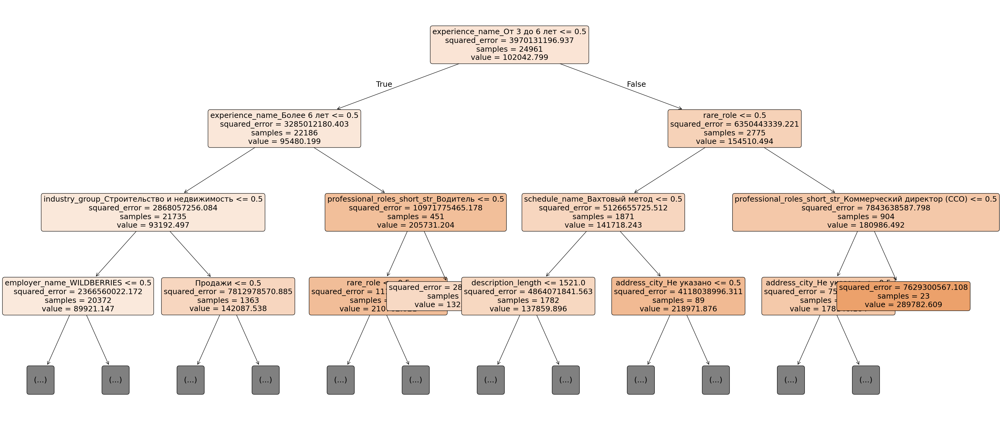

In [402]:
best_model = grid.best_estimator_

tree = best_model.named_steps["reg"]
prep = best_model.named_steps["prep"]

ohe = prep.named_transformers_["cat"]

feature_names = list(ohe.get_feature_names_out(cat_cols)) + list(scale_cols + other_num_cols)

plt.figure(figsize=(40, 18))

plot_tree(
    tree,
    feature_names=feature_names,
    filled=True,
    rounded=True,
    fontsize=18,
    max_depth=3
)
plt.savefig("decision_tree.png", dpi=300, bbox_inches="tight")
plt.show()

In [403]:
y_pred = best_model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test_in_rub, y_pred))
mae = mean_absolute_error(y_test_in_rub, y_pred)
r2 = r2_score(y_test_in_rub, y_pred)

print("Test RMSE:", rmse)
print("Test MAE:", mae)
print("Test R2:", r2)

Test RMSE: 45995.648511633764
Test MAE: 30378.448401345202
Test R2: 0.4554744233461703


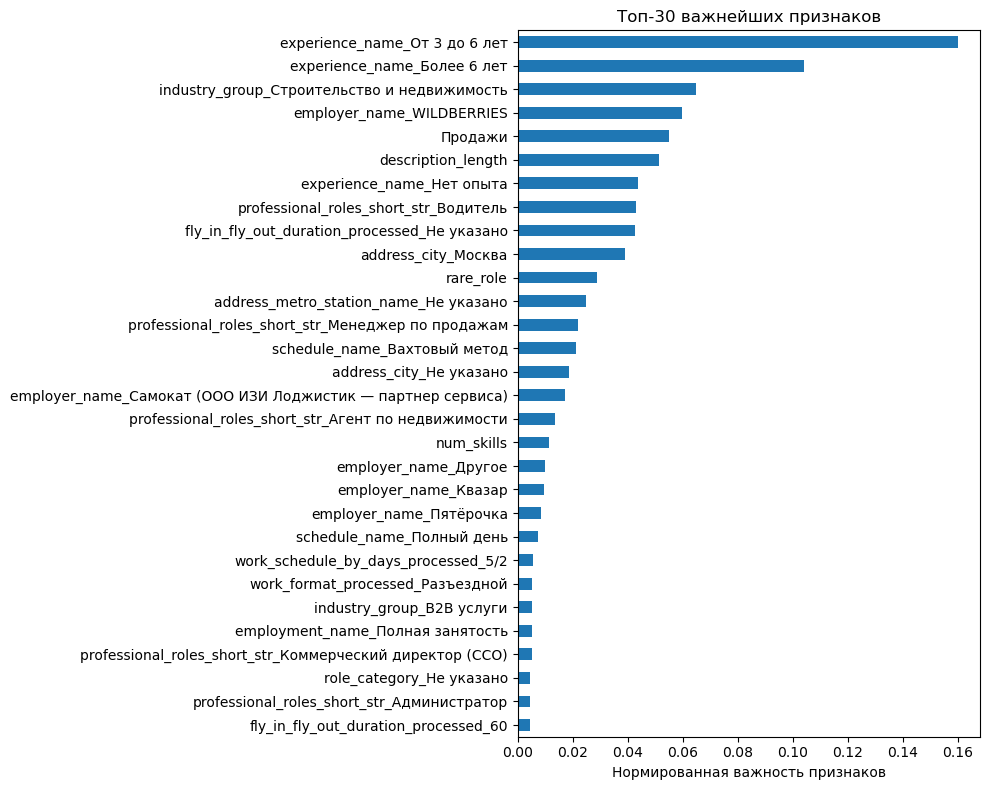

In [404]:
all_feats = np.hstack([ohe.get_feature_names_out(cat_cols), scale_cols + other_num_cols])
feat_imp = pd.Series(best_model.named_steps["reg"].feature_importances_, index=all_feats)

plt.figure(figsize=(10, 8))
feat_imp.nlargest(30).sort_values().plot(kind="barh")
plt.title("Топ-30 важнейших признаков")
plt.xlabel("Нормированная важность признаков")
plt.tight_layout()
plt.show()

In [405]:
train_scores, test_scores = validation_curve(
    Pipeline([
        ('prep', preprocessor),
        ('reg', DecisionTreeRegressor(
            min_samples_leaf=20,
            max_features=0.5,
            random_state=42
        ))
    ]),
    X_train,
    y_train_in_rub,
    param_name="reg__max_depth",
    param_range=range(1, 31),
    cv=5,
    scoring="neg_root_mean_squared_error",
    n_jobs=-1
)

train_rmse = -train_scores.mean(axis=1)
test_rmse = -test_scores.mean(axis=1)

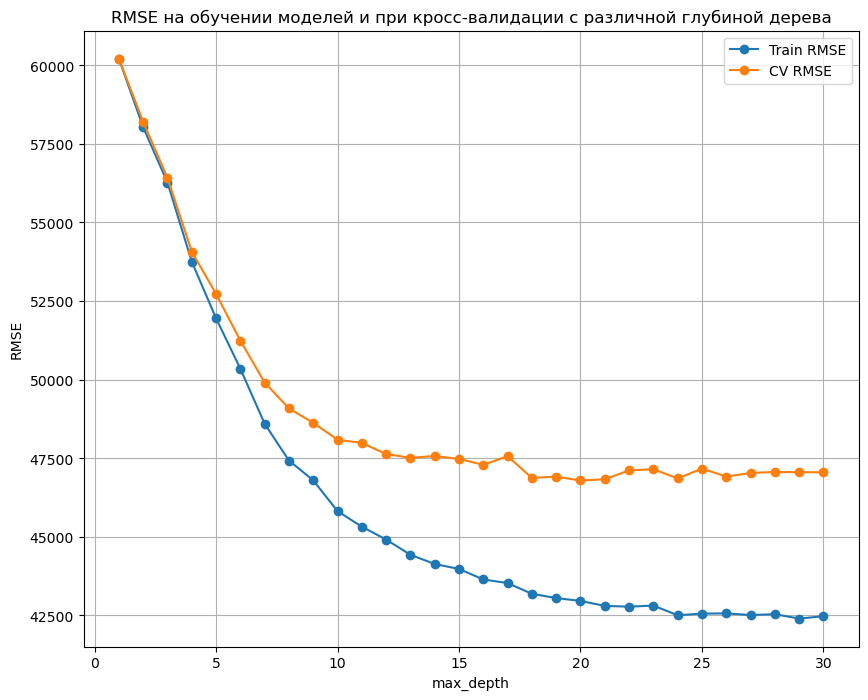

In [406]:
plt.figure(figsize=(10,8))

plt.plot(range(1, 31), train_rmse, marker='o', label='Train RMSE')
plt.plot(range(1, 31), test_rmse, marker='o', label='CV RMSE')

plt.xlabel("max_depth")
plt.ylabel("RMSE")
plt.title("RMSE на обучении моделей и при кросс-валидации с различной глубиной дерева")
plt.legend()
plt.grid()
plt.show()

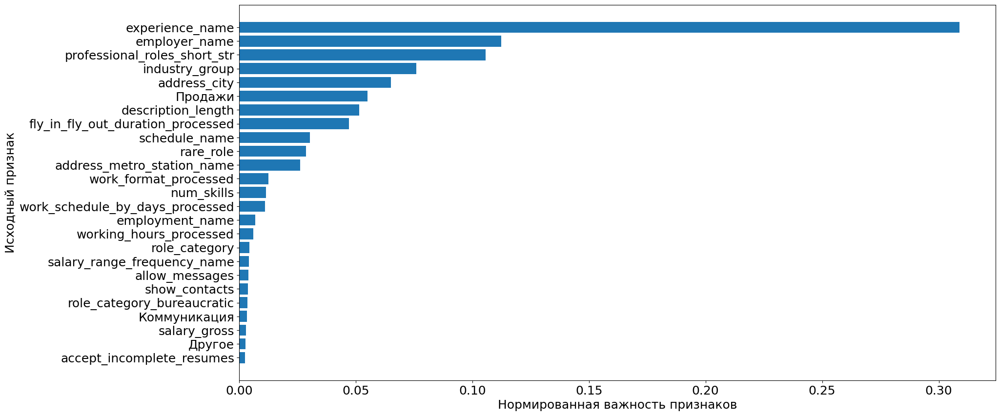

In [407]:
def clean_feature(name):
    name = re.sub(r"^(num__|cat__)", "", name)
    
    if name in scale_cols + other_num_cols:

        return name

    return name.rsplit("_", 1)[0]

fi_df = pd.DataFrame({
    "feature": best_model.named_steps["prep"].get_feature_names_out(),
    "importance": best_model.named_steps["reg"].feature_importances_
})

fi_df["base_feature"] = fi_df["feature"].apply(clean_feature)

fi_grouped = (
    fi_df.groupby("base_feature", as_index=False)["importance"]
    .sum()
    .sort_values("importance", ascending=False)
)

top_df = fi_grouped.head(25)

plt.figure(figsize=(20, 10))
plt.xticks(fontsize=18)  
plt.yticks(fontsize=18) 
plt.barh(top_df["base_feature"][::-1], top_df["importance"][::-1])
plt.xlabel("Нормированная важность признаков", fontsize=18)
plt.ylabel("Исходный признак", fontsize=18)
plt.show()

In [408]:
train_rmse

array([60214.13581134, 58028.80619404, 56268.14067843, 53752.71693597,
       51948.9567574 , 50344.90140284, 48593.6258037 , 47422.72100677,
       46792.56712763, 45812.51301879, 45317.80329295, 44908.50752004,
       44423.01121028, 44130.03571889, 43972.14818529, 43638.99948532,
       43523.15515936, 43182.6507634 , 43047.25808544, 42955.63494385,
       42796.99755833, 42772.64415408, 42807.82939764, 42499.5042468 ,
       42551.7711372 , 42558.85796739, 42507.52026492, 42532.77168036,
       42393.59018684, 42467.9825932 ])

In [409]:
test_rmse

array([60209.6490341 , 58198.88272415, 56420.88630298, 54071.195045  ,
       52725.34657154, 51237.33990312, 49904.42882578, 49081.56136928,
       48622.31533578, 48087.13177059, 47982.47408635, 47630.45733959,
       47508.74002792, 47567.75621418, 47472.29365825, 47288.74467625,
       47559.75232041, 46871.45517696, 46909.70433145, 46788.74979907,
       46825.29852719, 47109.82867615, 47147.27380434, 46853.27073273,
       47166.08118663, 46913.68207939, 47026.08830969, 47059.39692492,
       47052.09973201, 47049.62926717])

In [410]:
top_df

,base_feature,importance
19,experience_name,0.308902
17,employer_name,0.112430
27,professional_roles_short_str,0.105766
23,industry_group,0.075947
11,address_city,0.065146
98,Продажи,0.055146
15,description_length,0.051433
20,fly_in_fly_out_duration_processed,0.047107
35,schedule_name,0.030278
28,rare_role,0.028666


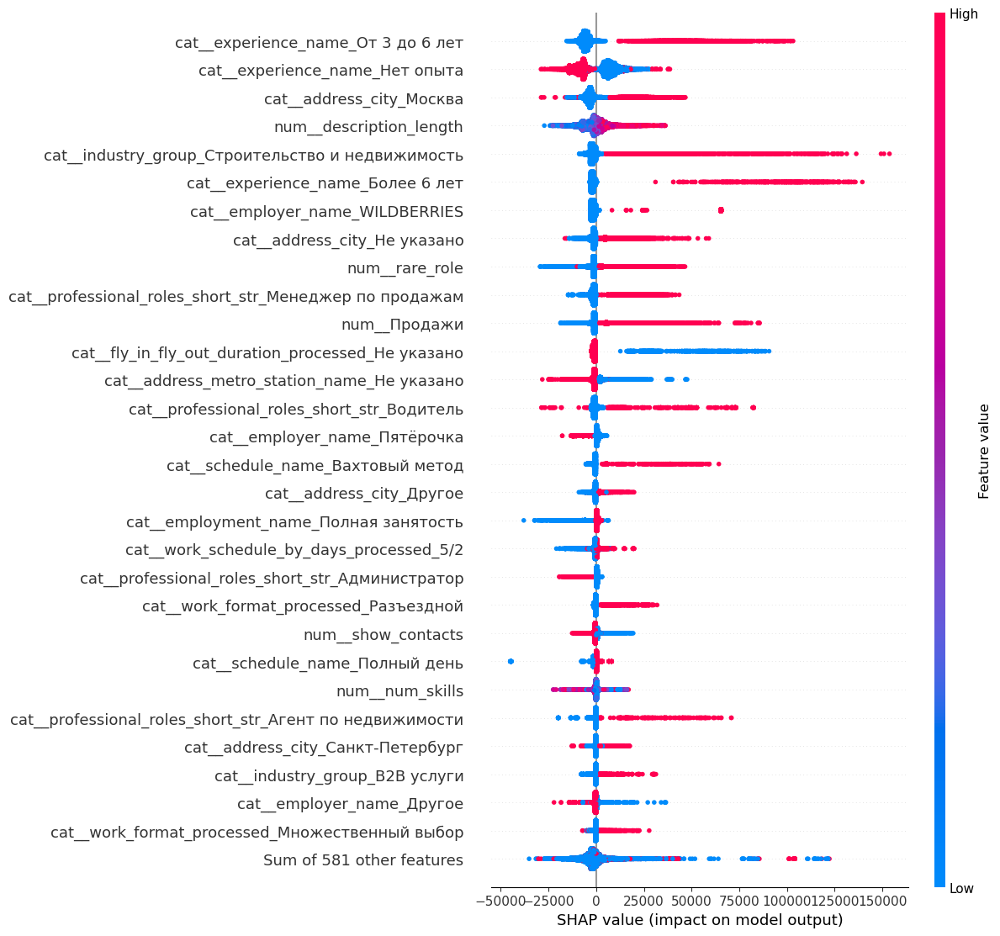

In [411]:
model = best_model.named_steps["reg"]
explainer = shap.TreeExplainer(model)

X_train_transformed = prep.transform(X_train).toarray()
feature_names = prep.get_feature_names_out()

shap_values = explainer(X_train_transformed)
shap_values.feature_names = feature_names
shap.plots.beeswarm(shap_values, max_display=30)

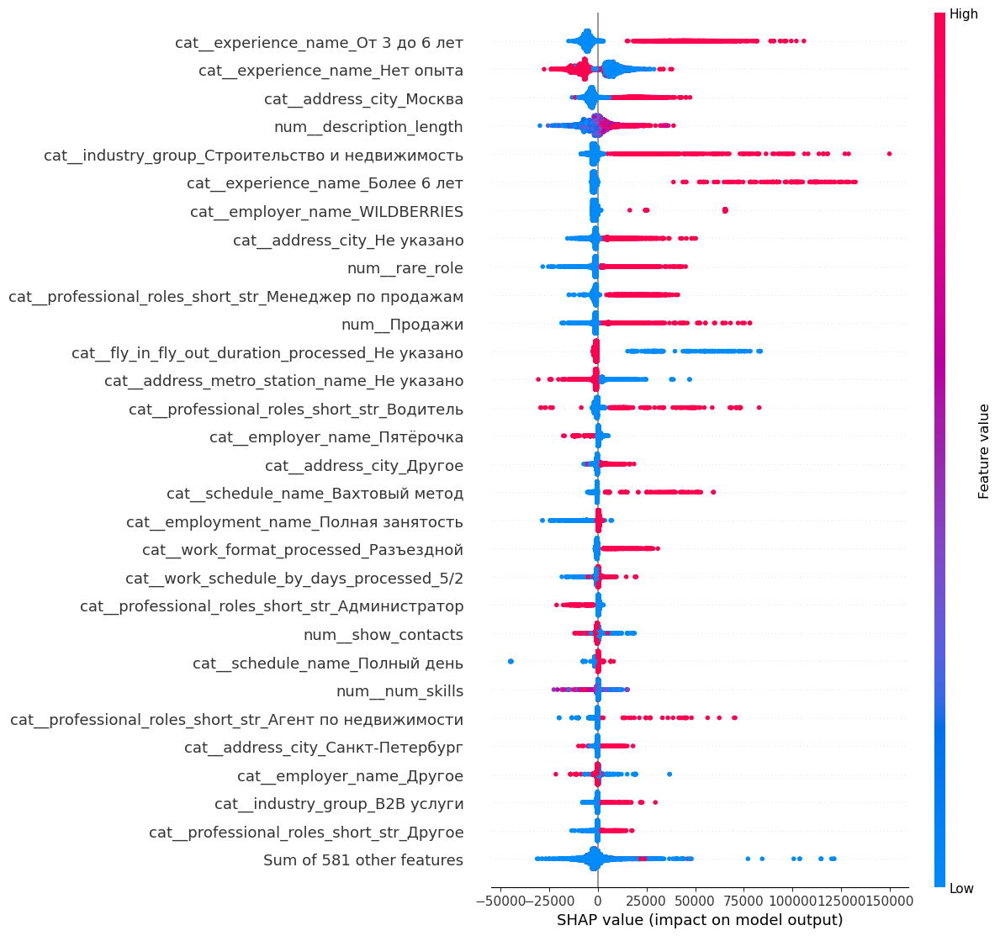

In [412]:
model = best_model.named_steps["reg"]
explainer = shap.TreeExplainer(model)

X_test_transformed = prep.transform(X_test).toarray()
feature_names = prep.get_feature_names_out()

shap_values = explainer(X_test_transformed)
shap_values.feature_names = feature_names
shap.plots.beeswarm(shap_values, max_display=30)

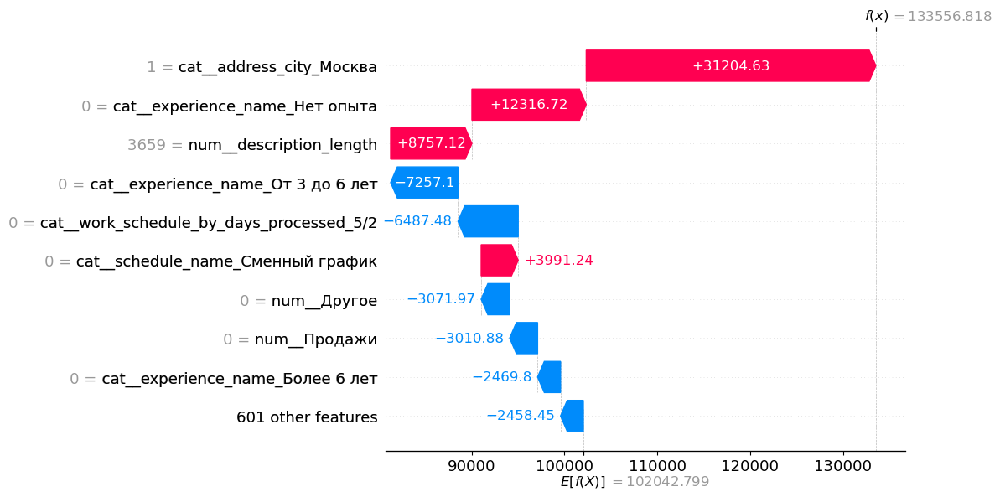

In [413]:
shap.plots.waterfall(shap_values[4])

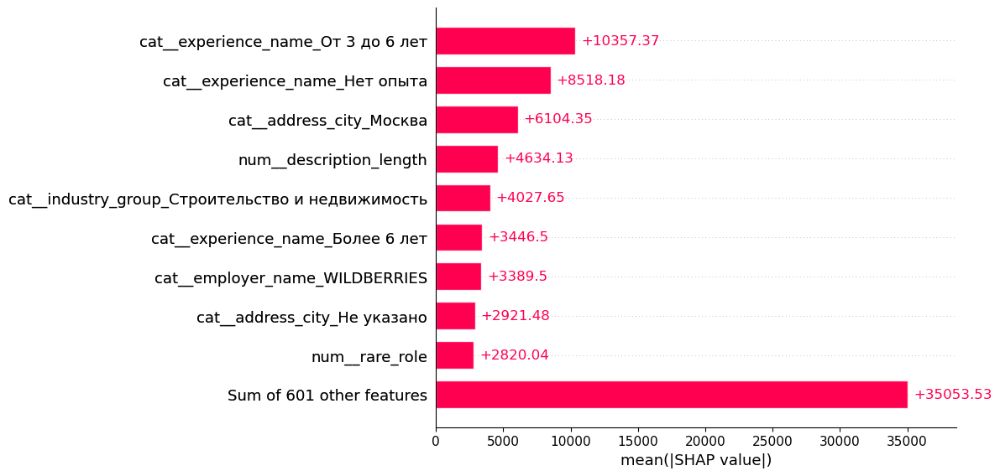

In [414]:
shap.plots.bar(shap_values) #abs

In [415]:
X_retail = X[X["industry_group"] == "Ритейл"]
y_retail = y.loc[X_retail.index]
X_retail_train, X_retail_test, y_retail_train, y_retail_test = train_test_split(
    X_retail,
    y_retail,
    test_size=0.2,
    random_state=42
)


y_retail_train_in_rub = np.expm1(y_retail_train)
y_retail_test_in_rub = np.expm1(y_retail_test)


X_build = X[X["industry_group"] == "Строительство и недвижимость"]
y_build = y.loc[X_build.index]
X_build_train, X_build_test, y_build_train, y_build_test = train_test_split(
    X_build,
    y_build,
    test_size=0.2,
    random_state=42
)

y_build_train_in_rub = np.expm1(y_build_train)
y_build_test_in_rub = np.expm1(y_build_test)


X_it = X[X["industry_group"] == "IT и телеком"]
y_it = y.loc[X_it.index]
X_it_train, X_it_test, y_it_train, y_it_test = train_test_split(
    X_it,
    y_it,
    test_size=0.2,
    random_state=42
)

y_it_train_in_rub = np.expm1(y_it_train)
y_it_test_in_rub = np.expm1(y_it_test)

In [416]:
def train_model_grid(X, y):

    model = Pipeline([
        ('prep', preprocessor),
        ('reg', DecisionTreeRegressor(random_state=42))

    ])

    param_grid = {
        'reg__max_depth': range(1, 21),
        'reg__min_samples_leaf': [20, 50],
        'reg__max_features': ['sqrt', 0.3, 0.5, 0.7]

    }

    grid = GridSearchCV(
        model,
        param_grid=param_grid,
        cv=5,
        scoring='neg_root_mean_squared_error',
        n_jobs=-1

    )

    grid.fit(X, y)
    print("Best params:", grid.best_params_)
    print("Best RMSE:", -grid.best_score_)
    return grid.best_estimator_

def evaluate_r2(model, X, y):

    r2 = cross_val_score(
        model,
        X,
        y,
        cv=5,
        scoring='r2'
    ).mean()

    print("CV R2:", r2)

In [417]:
model_retail = train_model_grid(X_retail_train, y_retail_train_in_rub)
r2_retail = evaluate_r2(model_retail, X_retail_train, y_retail_train_in_rub)

Best params: {'reg__max_depth': 13, 'reg__max_features': 0.7, 'reg__min_samples_leaf': 20}
Best RMSE: 28121.372467013513
CV R2: 0.6926904949034931


In [418]:
model_build = train_model_grid(X_build_train, y_build_train_in_rub)
r2_build = evaluate_r2(model_build, X_build_train, y_build_train_in_rub)

Best params: {'reg__max_depth': 14, 'reg__max_features': 0.7, 'reg__min_samples_leaf': 20}
Best RMSE: 66655.84807935511
CV R2: 0.3885426586954843


In [419]:
model_it = train_model_grid(X_it_train, y_it_train_in_rub)
r2_it = evaluate_r2(model_it, X_it_train, y_it_train_in_rub)

Best params: {'reg__max_depth': 9, 'reg__max_features': 0.5, 'reg__min_samples_leaf': 20}
Best RMSE: 56087.52342288489
CV R2: 0.40447397796221407


In [420]:
def evaluate_test(model, X_test, y_test, name=""):
    y_pred = model.predict(X_test)

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    print(f"{name} TEST RMSE: {rmse:.3f}")
    print(f"{name} TEST R2: {r2:.3f}")

In [421]:
evaluate_test(model_retail, X_retail_test, y_retail_test_in_rub, "Retail")
evaluate_test(model_build, X_build_test, y_build_test_in_rub, "Construction")
evaluate_test(model_it, X_it_test, y_it_test_in_rub, "IT & Telecom")

Retail TEST RMSE: 28423.640
Retail TEST R2: 0.668
Construction TEST RMSE: 68289.392
Construction TEST R2: 0.391
IT & Telecom TEST RMSE: 53950.681
IT & Telecom TEST R2: 0.417


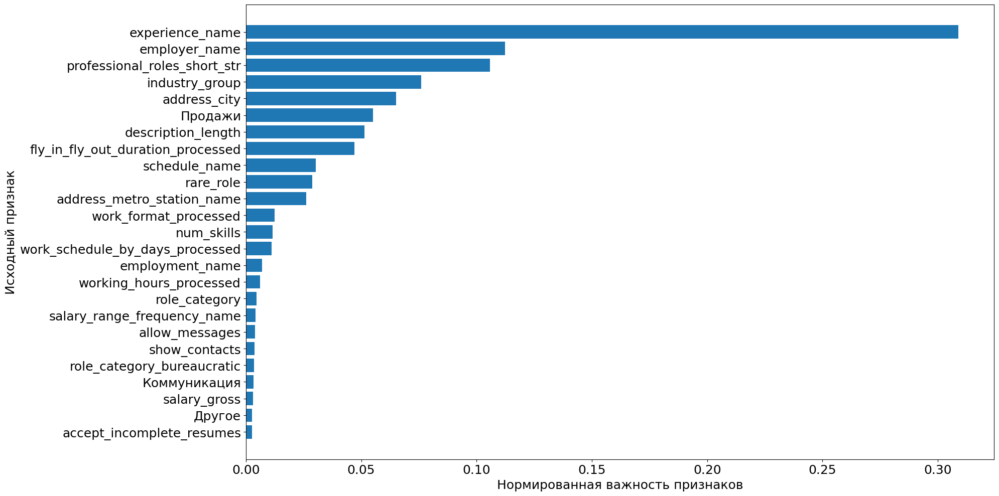

In [422]:
def get_feature_importance(model):
    fi_df = pd.DataFrame({
        "feature": model.named_steps["prep"].get_feature_names_out(),
        "importance": model.named_steps["reg"].feature_importances_
    })

    fi_df["base_feature"] = fi_df["feature"].apply(clean_feature)

    fi_grouped = (
        fi_df.groupby("base_feature", as_index=False)["importance"]
        .sum()
        .sort_values("importance", ascending=False)
    ).head(25)

    return fi_grouped

top_df = get_feature_importance(best_model).head(25)

plt.figure(figsize=(20, 10))
plt.barh(
    top_df["base_feature"][::-1],
    top_df["importance"][::-1]
)

plt.xlabel(
    "Нормированная важность признаков",
    fontsize=18
)

plt.ylabel(
    "Исходный признак",
    fontsize=18
)

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.tight_layout()
plt.show()

In [423]:
fi_retail = get_feature_importance(model_retail)
fi_build = get_feature_importance(model_build)
fi_it = get_feature_importance(model_it)

print("RETAIL")
print(fi_retail.head(20))

print("\nREAL ESTATE")
print(fi_build.head(20))

print("\nIT/TELECOM")
print(fi_it.head(20))

RETAIL
                          base_feature  importance
27        professional_roles_short_str    0.709775
17                       employer_name    0.092156
19                     experience_name    0.084148
15                  description_length    0.047133
11                        address_city    0.016197
12          address_metro_station_name    0.012586
30          role_category_bureaucratic    0.008066
28                           rare_role    0.006783
35                       schedule_name    0.006119
34         salary_range_frequency_name    0.004667
38     work_schedule_by_days_processed    0.003218
9            accept_incomplete_resumes    0.002019
39             working_hours_processed    0.001663
26                          num_skills    0.001469
37               work_format_processed    0.001350
32               role_category_support    0.000685
108  Работа с клиентами или их данными    0.000627
25                        night_shifts    0.000595
36                      

In [424]:
def compute_shap_for_model(model, X):
    
    prep = model.named_steps["prep"]
    model = model.named_steps["reg"]

    X_transformed = prep.transform(X).toarray()
    
    ohe = prep.named_transformers_["cat"]
    feature_names = (
        list(ohe.get_feature_names_out(cat_cols)) +
        scale_cols +
        other_num_cols
    )

    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_transformed)

    shap_values.feature_names = feature_names

    return shap_values

In [425]:
shap_retail = compute_shap_for_model(model_retail, X_retail)
shap_real_estate = compute_shap_for_model(model_build, X_build)
shap_it = compute_shap_for_model(model_it, X_it)

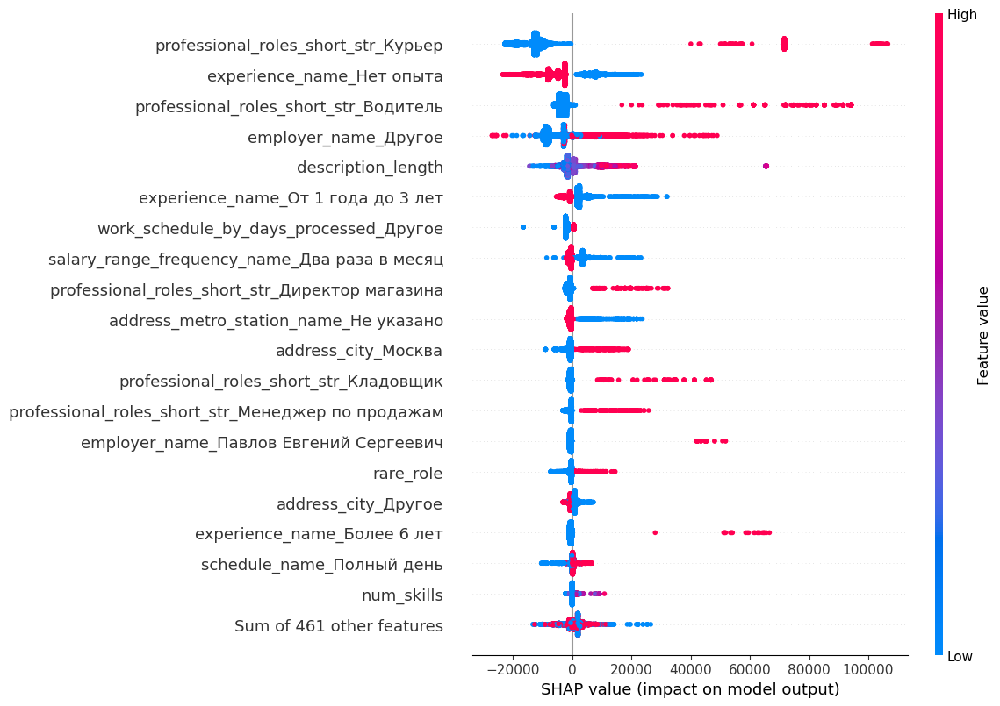

In [426]:
shap_values.feature_names = feature_names
shap.plots.beeswarm(shap_retail, max_display=20)

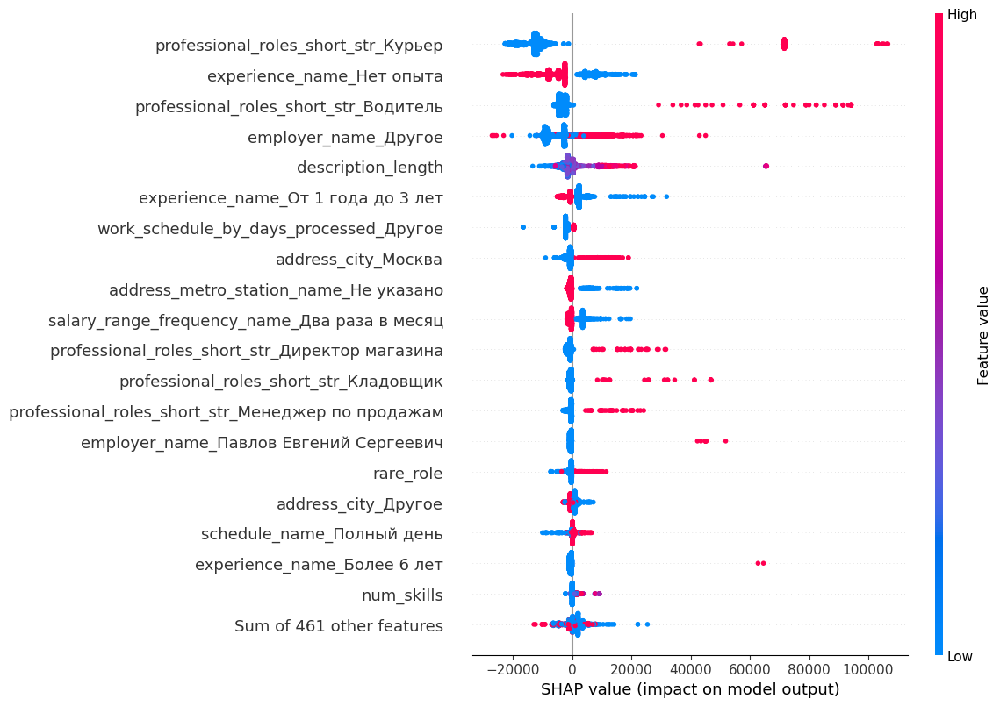

In [427]:
shap_retail_test = compute_shap_for_model(model_retail, X_retail_test)
shap_real_estate_test = compute_shap_for_model(model_build, X_build_test)
shap_it_test = compute_shap_for_model(model_it, X_it_test)
shap.plots.beeswarm(shap_retail_test, max_display=20)

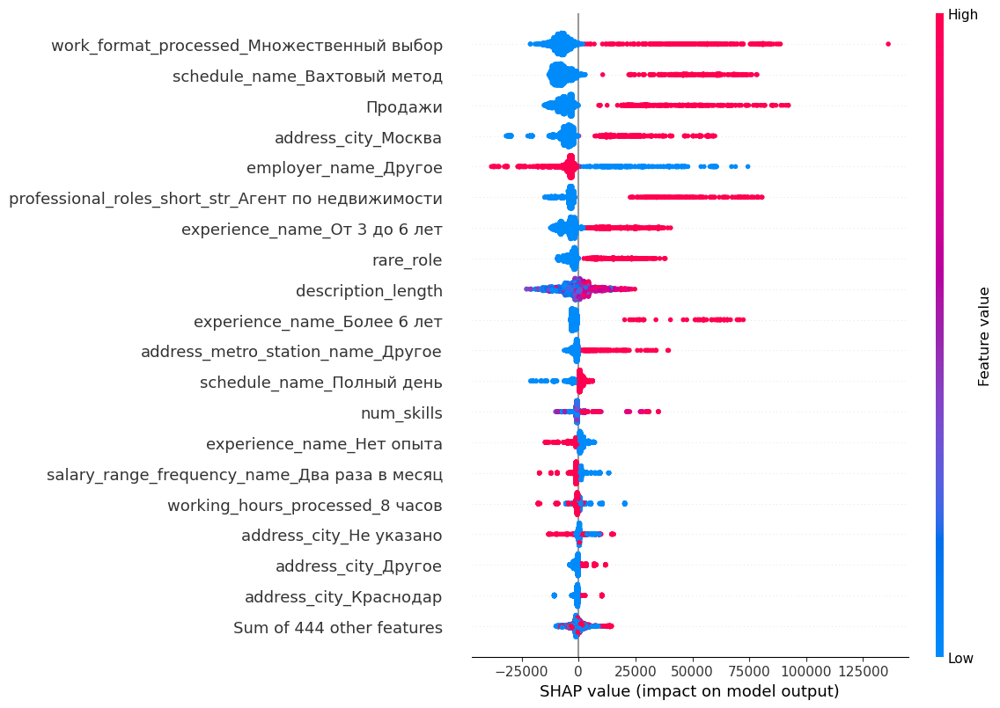

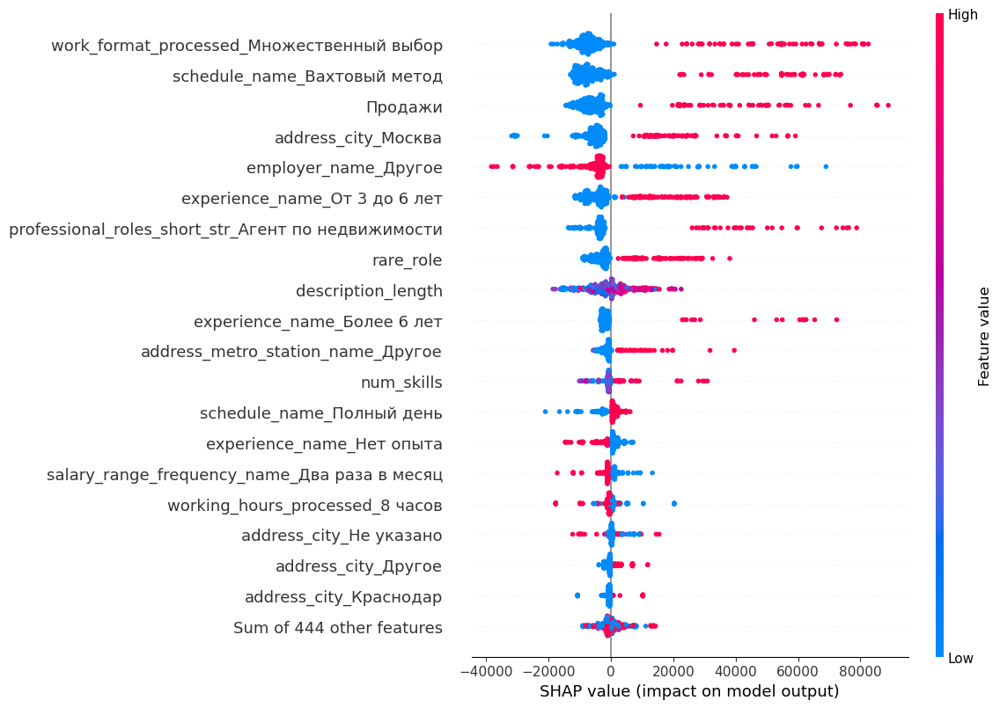

In [428]:
shap.plots.beeswarm(shap_real_estate, max_display=20)
shap.plots.beeswarm(shap_real_estate_test, max_display=20)

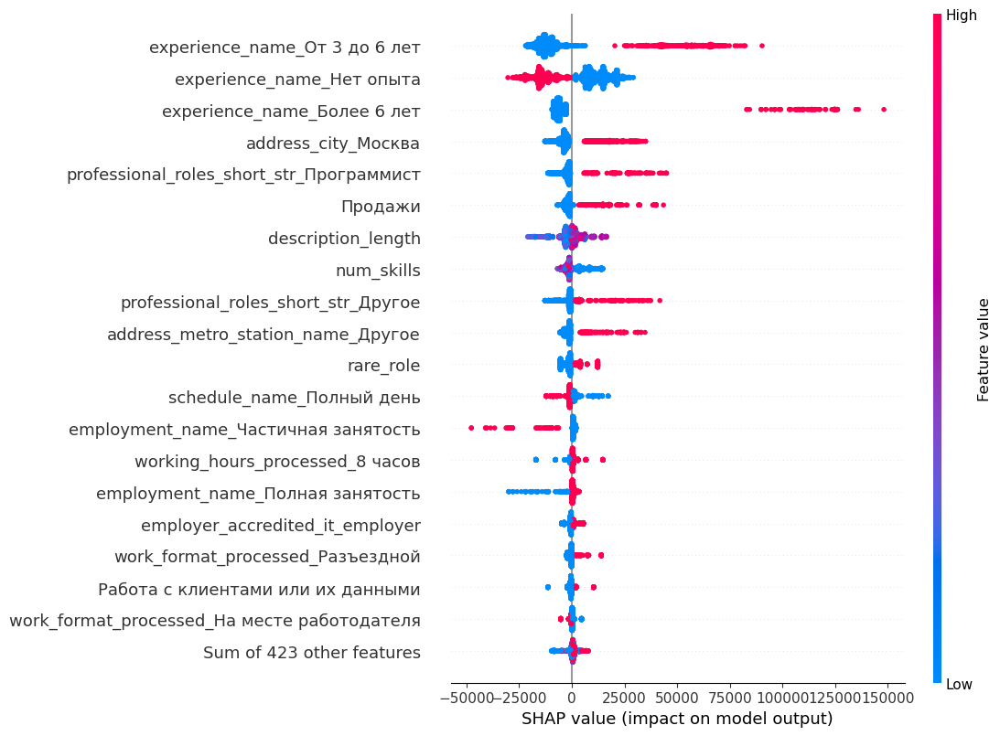

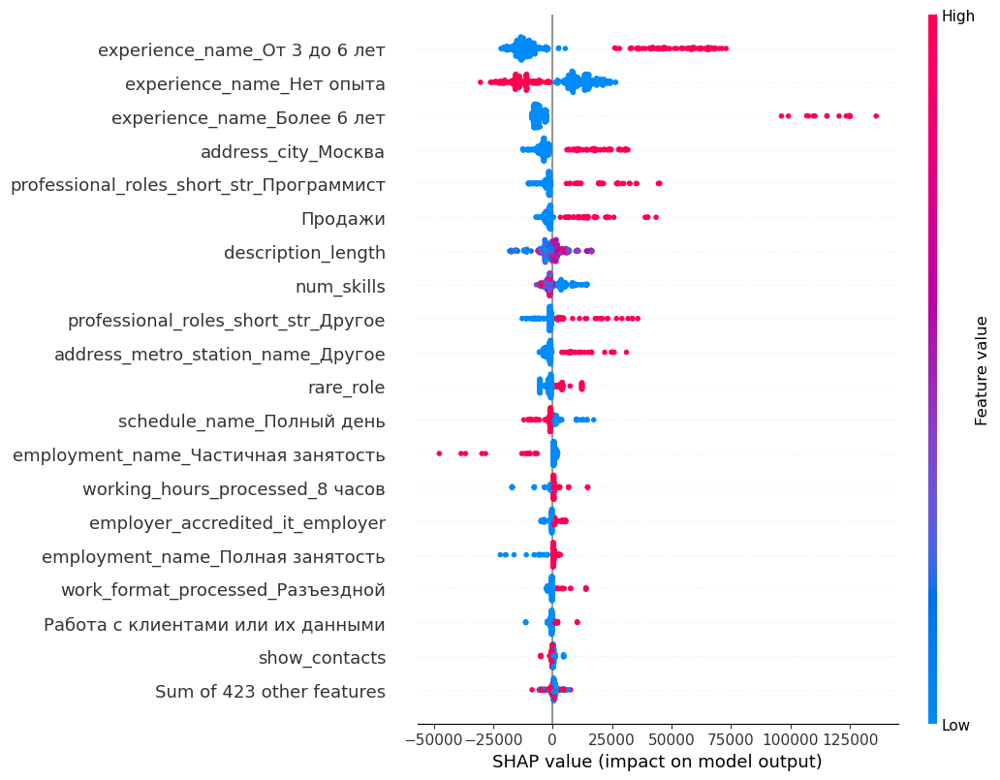

In [429]:
shap.plots.beeswarm(shap_it, max_display=20)
shap.plots.beeswarm(shap_it_test, max_display=20)

### Случайный лес

In [430]:
model = Pipeline([
    ('prep', preprocessor),
    ('reg', RandomForestRegressor(
        random_state=42,
        n_jobs=-1
    ))
])

In [431]:
model.fit(X_train, y_train_in_rub)

y_pred_train = model.predict(X_train)
y_pred = model.predict(X_test)
print("RMSE на обучающей выборке:", np.sqrt(mean_squared_error(y_train_in_rub, y_pred_train)))
print("RMSE на тестовой выборке:", np.sqrt(mean_squared_error(y_test_in_rub, y_pred)))

RMSE на обучающей выборке: 15551.202563871859
RMSE на тестовой выборке: 39792.58815770521


In [432]:
print("R2 на обучающей выборке:", r2_score(y_train_in_rub, y_pred_train))
print("R2 на тестовой выборке:", r2_score(y_test_in_rub, y_pred))

R2 на обучающей выборке: 0.9390851613747235
R2 на тестовой выборке: 0.5924422417675383


In [433]:
param_grid = {
    'reg__n_estimators': [100, 200, 300],
    'reg__max_depth': [5, 10, 15, 20],
    'reg__min_samples_leaf': [20, 50, 100],
    'reg__max_features': ['sqrt', 0.3]
}

In [434]:
grid = GridSearchCV(
    model,
    param_grid=param_grid,
    cv=5,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1,
    verbose=3
)

grid.fit(X_train, y_train_in_rub)

print(grid.best_params_)
print(-grid.best_score_)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
{'reg__max_depth': 20, 'reg__max_features': 0.3, 'reg__min_samples_leaf': 20, 'reg__n_estimators': 300}
44537.91715810019


In [436]:
best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)

r2 = r2_score(y_test_in_rub, y_pred)
test_rmse = np.sqrt(mean_squared_error(y_test_in_rub, y_pred))
test_mae = mean_absolute_error(y_test_in_rub, y_pred)

print("Test R^2:", r2)
print("Test RMSE:", test_rmse)
print("Test MAE:", test_mae)

y_train_pred = best_model.predict(X_train)
train_r2 = r2_score(y_train_in_rub, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train_in_rub, y_train_pred))
train_mae = mean_absolute_error(y_train_in_rub, y_train_pred)

print("Train R^2:", train_r2)
print("Train RMSE:", train_rmse)
print("Train MAE:", train_mae)

Test R^2: 0.5109930518983357
Test RMSE: 43587.81707941755
Test MAE: 28839.62661982795
Train R^2: 0.5571151098175647
Train RMSE: 41932.22053701867
Train MAE: 27579.786734909172


In [437]:
cv_results = grid.cv_results_
best_idx = grid.best_index_

print(cv_results["std_test_score"][best_idx])

733.1568450088592


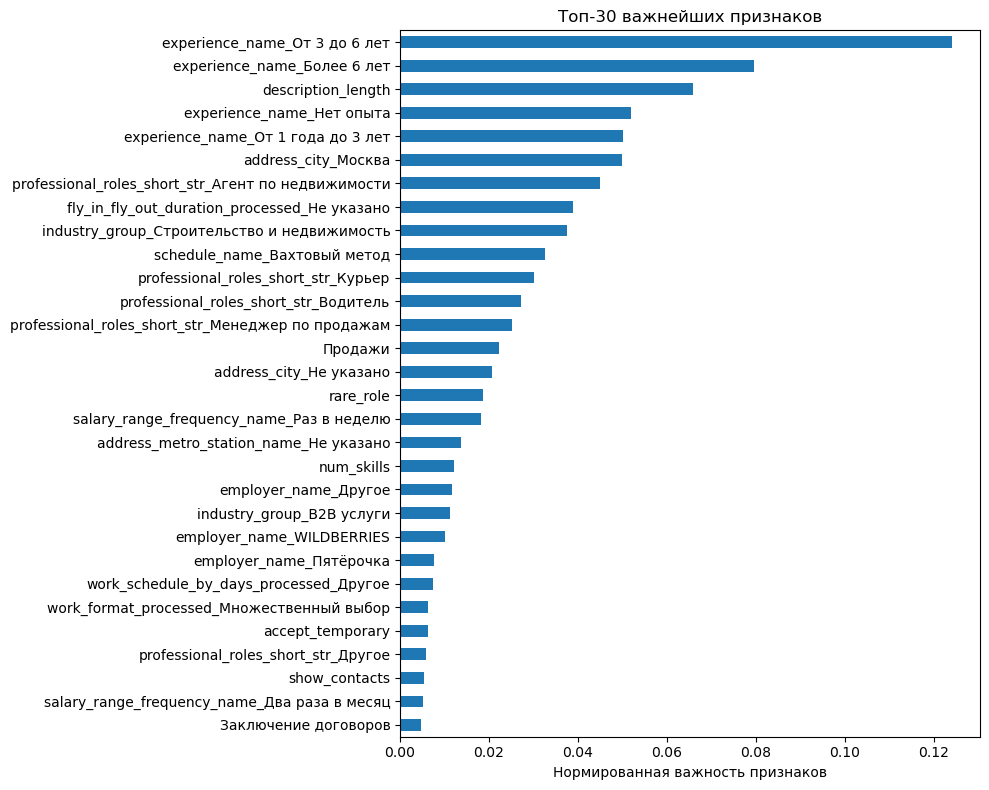

In [438]:
all_feats = np.hstack([ohe.get_feature_names_out(cat_cols), scale_cols + other_num_cols])
feat_imp = pd.Series(best_model.named_steps["reg"].feature_importances_, index=all_feats)

plt.figure(figsize=(10, 8))
feat_imp.nlargest(30).sort_values().plot(kind="barh")
plt.title("Топ-30 важнейших признаков")
plt.xlabel("Нормированная важность признаков")
plt.tight_layout()
plt.show()

In [439]:
feat_imp.nlargest(30).sort_values(ascending=False)

experience_name_От 3 до 6 лет                         0.124146
experience_name_Более 6 лет                           0.079571
description_length                                    0.065924
experience_name_Нет опыта                             0.051917
experience_name_От 1 года до 3 лет                    0.050026
address_city_Москва                                   0.049896
professional_roles_short_str_Агент по недвижимости    0.044993
fly_in_fly_out_duration_processed_Не указано          0.038809
industry_group_Строительство и недвижимость           0.037597
schedule_name_Вахтовый метод                          0.032520
professional_roles_short_str_Курьер                   0.030132
professional_roles_short_str_Водитель                 0.027159
professional_roles_short_str_Менеджер по продажам     0.025211
Продажи                                               0.022176
address_city_Не указано                               0.020722
rare_role                                             0

In [440]:
fi_df = pd.DataFrame({
    "feature": best_model.named_steps["prep"].get_feature_names_out(),
    "importance": best_model.named_steps["reg"].feature_importances_
})

fi_df

,feature,importance
0,cat__address_city_Архангельск,0.000000
1,cat__address_city_Астрахань,0.000000
2,cat__address_city_Балашиха,0.000000
3,cat__address_city_Барнаул,0.000000
4,cat__address_city_Белгород,0.000000
...,...,...
605,num__Учет остатков,0.000000
606,num__Учет товаров,0.000000
607,num__Чтение чертежей,0.000053
608,num__исполнение поручений руководителя,0.000000


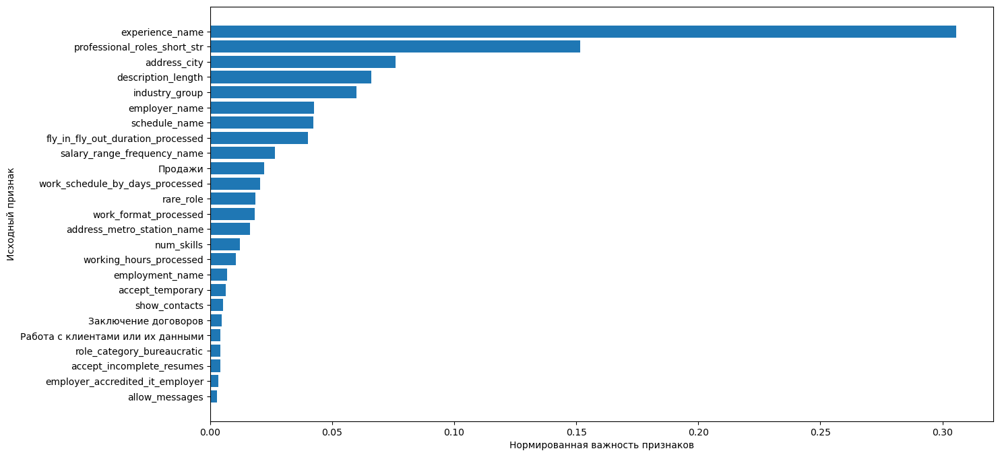

In [441]:
def clean_feature(name):
    name = re.sub(r"^(num__|cat__)", "", name)
    
    if name in scale_cols + other_num_cols:

        return name

    return name.rsplit("_", 1)[0]

fi_df["base_feature"] = fi_df["feature"].apply(clean_feature)

fi_grouped = (
    fi_df.groupby("base_feature", as_index=False)["importance"]
    .sum()
    .sort_values("importance", ascending=False)
)

top_df = fi_grouped.head(25)

plt.figure(figsize=(15, 8))
plt.barh(top_df["base_feature"][::-1], top_df["importance"][::-1])
plt.xlabel("Нормированная важность признаков")
plt.ylabel("Исходный признак")
plt.show()

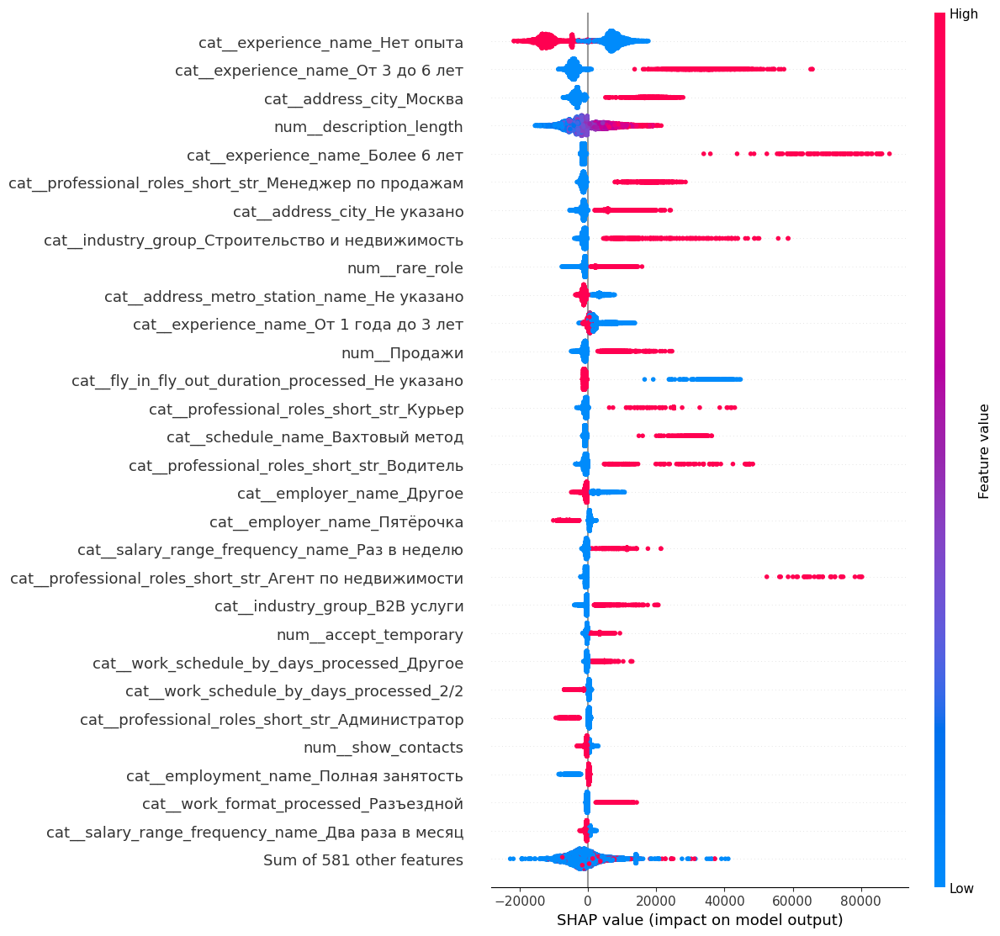

In [443]:
model = best_model.named_steps["reg"]
explainer = shap.TreeExplainer(model)

X_test_transformed = prep.transform(X_test).toarray()
feature_names = prep.get_feature_names_out()

shap_values = explainer(X_test_transformed)
shap_values.feature_names = feature_names
shap.plots.beeswarm(shap_values, max_display=30)

### Бустинг

In [444]:
models = {
    "Gradient Boosting": Pipeline([
        ("prep", preprocessor),
        ("reg", GradientBoostingRegressor(random_state=42))
    ]),

    "AdaBoost": Pipeline([
        ("prep", preprocessor),
        ("reg", AdaBoostRegressor(random_state=42))
    ]),

    "XGBoost": Pipeline([
        ("prep", preprocessor),
        ("reg", XGBRegressor(
            random_state=42
        ))
    ]),

    "LightGBM": Pipeline([
        ("prep", preprocessor),
        ("reg", LGBMRegressor(
            random_state=42,
            verbosity=-1
        ))
    ]),

    "CatBoost": Pipeline([
        ("prep", preprocessor),
        ("reg", CatBoostRegressor(
            random_state=42,
            verbose=0
        ))
    ])
}

In [445]:
results = []

for name, model in models.items():

    model.fit(X_train, y_train_in_rub)

    train_pred = model.predict(X_train)
    test_pred = model.predict(X_test)

    results.append({
        "Model": name,
        "Train R²": r2_score(y_train_in_rub, train_pred),
        "Test R²": r2_score(y_test_in_rub, test_pred),
        "Train RMSE": np.sqrt(mean_squared_error(y_train_in_rub, train_pred)),
        "Test RMSE": np.sqrt(mean_squared_error(y_test_in_rub, test_pred))
    })

results_df = pd.DataFrame(results)

results_df.sort_values(
    by="Test RMSE"
)

/opt/anaconda3/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


,Model,Train R²,Test R²,Train RMSE,Test RMSE
4,CatBoost,0.703838,0.608363,34289.981713,39007.612971
2,XGBoost,0.735521,0.592970,32403.966338,39766.814279
3,LightGBM,0.657960,0.592812,36850.310906,39774.524614
0,Gradient Boosting,0.538228,0.513790,42817.012519,43463.005987
1,AdaBoost,0.119241,0.109469,59133.153184,58820.950745


In [446]:
cat_model = Pipeline([
    ('prep', preprocessor),
    ('reg', CatBoostRegressor(
        random_state=42,
        verbose=0
    ))
])

param_grid = {
    'reg__iterations': [200, 300, 500],
    'reg__depth': [4, 6, 8],
    'reg__learning_rate': [0.01, 0.05, 0.1],
    'reg__l2_leaf_reg': [3, 5, 7]}

grid = GridSearchCV(
    estimator=cat_model,
    param_grid=param_grid,
    scoring='neg_root_mean_squared_error',
    cv=5,
    n_jobs=-1,
    verbose=2
)

grid.fit(X_train, y_train_in_rub)

Fitting 5 folds for each of 81 candidates, totalling 405 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('prep',
                                        ColumnTransformer(transformers=[('cat',
                                                                         OneHotEncoder(handle_unknown='ignore'),
                                                                         Index(['address_city', 'experience_name', 'schedule_name', 'employment_name',
       'employer_name', 'salary_range_frequency_name',
       'address_metro_station_name', 'fly_in_fly_out_duration_processed',
       'work_format_processed', 'working_ho...
                                                                          'учёт/отчётность',
                                                                          'Внимательность',
                                                                          'Внутренние '
                                                                          'коммуникации',
                                                                          'Внутренний '
                                                                          'контроль', ...])])),
                                       ('reg',
                                        CatBoostRegressor(loss_function='RMSE', random_state=42, verbose=0))]),
             n_jobs=-1,
             param_grid={'reg__depth': [4, 6, 8],
                         'reg__iterations': [200, 300, 500],
                         'reg__l2_leaf_reg': [3, 5, 7],
                         'reg__learning_rate': [0.01, 0.05, 0.1]},
             scoring='neg_root_mean_squared_error', verbose=2)

In [447]:
best_model = grid.best_estimator_

print(grid.best_params_)

y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

print("Train RMSE:",
    np.sqrt(mean_squared_error(y_train_in_rub, y_train_pred)))

print("Test RMSE:",
    np.sqrt(mean_squared_error(y_test_in_rub, y_test_pred)))

print("Train MAE:",
    mean_absolute_error(y_train_in_rub, y_train_pred))

print("Test MAE:",
    mean_absolute_error(y_test_in_rub, y_test_pred))

print("Train R^2:",
    r2_score(y_train_in_rub, y_train_pred))

print("Test R^2:",
    r2_score(y_test_in_rub, y_test_pred))

{'reg__depth': 8, 'reg__iterations': 500, 'reg__l2_leaf_reg': 3, 'reg__learning_rate': 0.1}
Train RMSE: 32679.692340948826
Test RMSE: 38719.54523421057
Train MAE: 22021.165530474544
Test MAE: 25539.485330891464
Train R^2: 0.7310007557626572
Test R^2: 0.6141262050820421


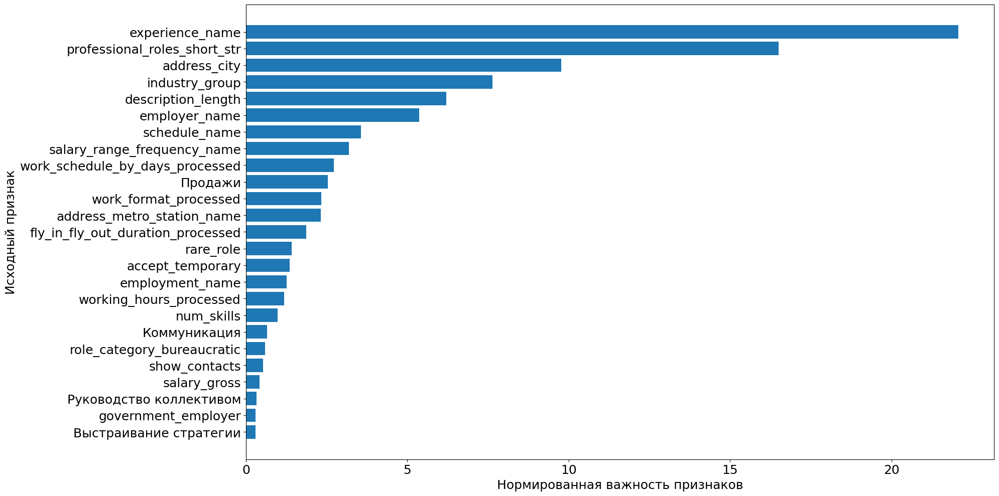

In [448]:
top_df = get_feature_importance(best_model).head(25)

plt.figure(figsize=(20, 10))
plt.barh(
    top_df["base_feature"][::-1],
    top_df["importance"][::-1]
)

plt.xlabel(
    "Нормированная важность признаков",
    fontsize=18
)

plt.ylabel(
    "Исходный признак",
    fontsize=18
)

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.tight_layout()
plt.show()

In [449]:
top_df

,base_feature,importance
19,experience_name,22.069641
27,professional_roles_short_str,16.498994
11,address_city,9.763848
23,industry_group,7.633671
15,description_length,6.202284
17,employer_name,5.369005
35,schedule_name,3.557473
34,salary_range_frequency_name,3.188171
38,work_schedule_by_days_processed,2.725760
98,Продажи,2.535822


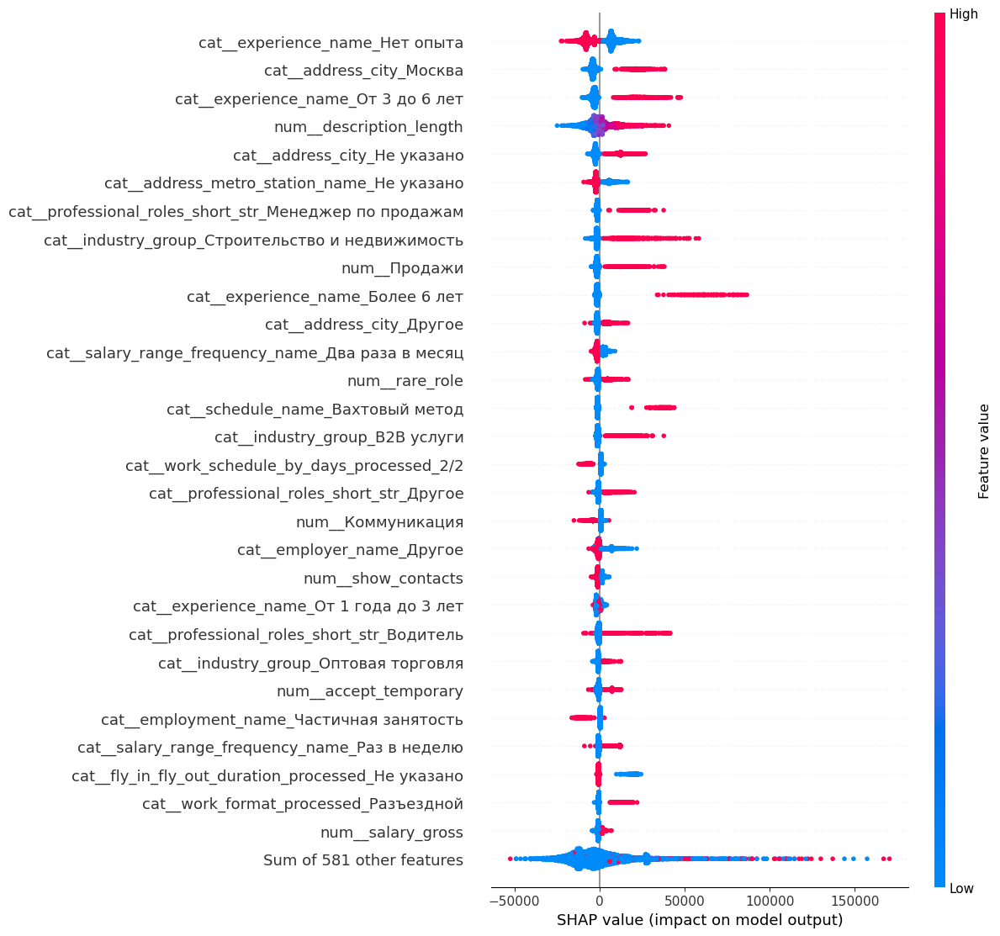

In [450]:
model = best_model.named_steps["reg"]
explainer = shap.TreeExplainer(model)

X_test_transformed = prep.transform(X_test).toarray()
feature_names = prep.get_feature_names_out()

shap_values = explainer(X_test_transformed)
shap_values.feature_names = feature_names
shap.plots.beeswarm(shap_values, max_display=30)